In [149]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv("data.txt", header=None, sep="\t", 
                 names=['day_id', 'calling_nbr', 'called_nbr', 'calling_optr','called_optr',
                        'calling_city', 'called_city', 'calling_roam_city', 'called_roam_city',
                        'start_time', 'end_time', 'raw_dur', 'call_type', 'calling_cell'])
df

,day_id,calling_nbr,called_nbr,calling_optr,called_optr,calling_city,called_city,calling_roam_city,called_roam_city,start_time,end_time,raw_dur,call_type,calling_cell
0,20120201,349723,y24373194378,1,2,551,551,551,551,08:39:50,08:42:54,184,1,373
1,20120201,338799,172001,1,1,551,551,551,551,00:01:40,00:04:43,183,1,318
2,20120201,1008566,1023148,1,1,551,551,551,551,00:10:41,00:10:57,16,1,749
3,20120201,349695,y21064962234,1,3,551,551,551,551,05:46:50,05:47:49,59,1,257
4,20120201,344115,4428205,1,1,551,551,551,551,08:08:38,08:09:06,28,1,2963
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1999983,20120229,910366,554350,1,1,551,551,551,551,17:48:26,00:00:00,20,1,193
1999984,20120229,1273754,y24581923962,1,2,551,551,551,551,17:00:00,00:00:00,34,1,661
1999985,20120229,1324446,y57771755273,1,2,551,551,551,551,17:47:53,00:00:00,16,1,12913
1999986,20120229,1167277,y26021078350,1,2,551,551,551,551,17:01:39,00:00:00,73,1,36902


In [ ]:
df.to_csv("data.csv", index=False)

# 0. 数据清洗

In [282]:
df.isna().any()

day_id               False
calling_nbr          False
called_nbr           False
calling_optr         False
called_optr          False
calling_city         False
called_city          False
calling_roam_city    False
called_roam_city     False
start_time           False
end_time             False
raw_dur              False
call_type            False
calling_cell         False
dtype: bool

In [9]:
# 时间字符串转化为单位为秒的int类型数据
def time2int(t):
    s = t.split(':')
    return int(s[0]) * 3600 + int(s[1]) * 60 + int(s[2])

In [10]:
day_time = 24 * 3600
for i in range(len(df)):
    # start_time、end_time转换为int类型数据
    df.loc[i, "start_time"] = time2int(df.loc[i, "start_time"])
    df.loc[i, "end_time"] = time2int(df.loc[i, "end_time"])
    # end_time存在错误数据0:00:00，用(start_time + raw_dur) % day_time代替
    if df.loc[i, "end_time"] == 0:
        df.loc[i, "end_time"] = (df.loc[i, "start_time"] + df.loc[i, "raw_dur"]) % day_time
    # raw_dur存在错误数据（eg：0）：计算 (end_time - start_time + day_time) % day_time
    df.loc[i, "raw_dur"] = (df.loc[i, "end_time"] - df.loc[i, "start_time"] + day_time) % day_time

df.to_csv("_data.csv", index=False)

In [3]:
df = pd.read_csv("_data.csv")
df

,day_id,calling_nbr,called_nbr,calling_optr,called_optr,calling_city,called_city,calling_roam_city,called_roam_city,start_time,end_time,raw_dur,call_type,calling_cell
0,20120201,349723,y24373194378,1,2,551,551,551,551,31190,31374,184,1,373
1,20120201,338799,172001,1,1,551,551,551,551,100,283,183,1,318
2,20120201,1008566,1023148,1,1,551,551,551,551,641,657,16,1,749
3,20120201,349695,y21064962234,1,3,551,551,551,551,20810,20869,59,1,257
4,20120201,344115,4428205,1,1,551,551,551,551,29318,29346,28,1,2963
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1999983,20120229,910366,554350,1,1,551,551,551,551,64106,64126,20,1,193
1999984,20120229,1273754,y24581923962,1,2,551,551,551,551,61200,61234,34,1,661
1999985,20120229,1324446,y57771755273,1,2,551,551,551,551,64073,64089,16,1,12913
1999986,20120229,1167277,y26021078350,1,2,551,551,551,551,61299,61372,73,1,36902


# 1. 用户基本行为统计

## 1.1. <主叫号码, 每日平均通话次数, 每日平均通话时长、每个通话平均时长>

In [ ]:
# 总天数
dayCount = df["day_id"].max() - df["day_id"].min() + 1

grouped = df.groupby("calling_nbr")

# 每日平均通话次数
mean_day_cnt = pd.DataFrame((grouped["day_id"].count() / dayCount).rename("mean_day_cnt"))
# 每日平均通话时长
mean_day_dur = pd.DataFrame((grouped["raw_dur"].agg(np.sum) / dayCount).rename("mean_day_dur"))
# 每个通话平均时长
mean_raw_dur = pd.DataFrame(grouped["raw_dur"].agg(np.mean).rename("mean_raw_dur"))

df1 = pd.concat([mean_day_cnt, mean_day_dur, mean_raw_dur], axis=1)
df1.to_csv("basic_statistics_1.csv", index=True)

In [4]:
df1 = pd.read_csv("basic_statistics_1.csv")
df1

,calling_nbr,mean_day_cnt,mean_day_dur,mean_raw_dur
0,1,0.206897,15.517241,75.000000
1,4,0.241379,12.586207,52.142857
2,5,0.310345,16.310345,52.555556
3,10,0.068966,3.413793,49.500000
4,12,0.068966,5.103448,74.000000
...,...,...,...,...
450758,1351523,0.068966,11.517241,167.000000
450759,1351528,0.310345,77.413793,249.444444
450760,1351529,0.068966,3.482759,50.500000
450761,1351531,0.103448,17.482759,169.000000


## 1.2.  <主叫号码, 时间段1占比, ..., 时间段8占比>

In [35]:
grouped = df.groupby("calling_nbr")

# 创建初始DataFrame
df2 = pd.DataFrame((grouped["raw_dur"].agg(np.sum)).rename("all_dur")).
    reindex(columns=["all_dur", "t1", "t2", "t3", "t4","t5", "t6", "t7", "t8"], fill_value=0)

seg = 3 * 3600 # 一个时间段的长度（单位：s）

for name, group in grouped:
    for i in range(len(group)):
        row_labels = group.index[i]
        # 计算出所处时间段
        start = int(group.loc[row_labels, "start_time"] / seg) + 1 
        end = int(group.loc[row_labels, "end_time"] / seg) + 1
        if start < end:
            df2.loc[name, df2.columns[start]] += seg - group.loc[row_labels, "start_time"] % seg
            for j in range(start + 1, end):
                df2.loc[name, df2.columns[j]] += seg
            df2.loc[name, df2.columns[end]] += group.loc[row_labels, "end_time"] % seg
        elif start == end:
            df2.loc[name, df2.columns[start]] += group.loc[row_labels, "end_time"] - group.loc[row_labels, "start_time"]
        else:
            df2.loc[name, df2.columns[start]] += seg - group.loc[row_labels, "start_time"] % seg
            for j in range(start + 1, 9):
                df2.loc[name, df2.columns[j]] += seg
            for j in range(1, end):
                df2.loc[name, df2.columns[j]] += seg
            df2.loc[name, df2.columns[end]] += group.loc[row_labels, "end_time"] % seg
    # 每个时间段的秒数除以总秒数 得到 时间占比
    if df2.loc[name, "all_dur"]:
        df2.iloc[df2.index.get_indexer([name]), 1:] /= df2.loc[name, "all_dur"]

df2.drop("all_dur", axis=1).to_csv("basic_statistics_2.csv", index=True)
df2

name: 1
name: 4
name: 5
name: 10
name: 12
name: 15
name: 17
name: 18
name: 20
name: 23
name: 25
name: 27
name: 28
name: 29
name: 31
name: 32
name: 36
name: 38
name: 40
name: 41
name: 43
name: 47
name: 48
name: 50
name: 52
name: 54
name: 57
name: 66
name: 69
name: 81
name: 84
name: 89
name: 90
name: 91
name: 92
name: 95
name: 96
name: 99
name: 100
name: 102
name: 106
name: 109
name: 113
name: 114
name: 116
name: 118
name: 123
name: 126
name: 127
name: 130
name: 132
name: 135
name: 136
name: 137
name: 138
name: 139
name: 141
name: 148
name: 151
name: 155
name: 157
name: 160
name: 162
name: 166
name: 169
name: 172
name: 173
name: 176
name: 177
name: 179
name: 181
name: 185
name: 187
name: 188
name: 190
name: 192
name: 196
name: 199
name: 201
name: 202
name: 206
name: 207
name: 214
name: 215
name: 220
name: 223
name: 230
name: 232
name: 235
name: 241
name: 243
name: 244
name: 246
name: 252
name: 255
name: 257
name: 264
name: 269
name: 271
name: 275
name: 277
name: 279
name: 284
name: 290
n

name: 2430
name: 2434
name: 2443
name: 2444
name: 2448
name: 2453
name: 2455
name: 2456
name: 2459
name: 2463
name: 2467
name: 2470
name: 2471
name: 2472
name: 2473
name: 2474
name: 2475
name: 2476
name: 2479
name: 2480
name: 2483
name: 2487
name: 2488
name: 2490
name: 2491
name: 2496
name: 2501
name: 2502
name: 2503
name: 2504
name: 2505
name: 2507
name: 2508
name: 2510
name: 2513
name: 2514
name: 2515
name: 2519
name: 2527
name: 2528
name: 2530
name: 2533
name: 2534
name: 2535
name: 2536
name: 2537
name: 2541
name: 2546
name: 2548
name: 2551
name: 2556
name: 2560
name: 2561
name: 2569
name: 2571
name: 2573
name: 2577
name: 2583
name: 2591
name: 2595
name: 2598
name: 2599
name: 2604
name: 2606
name: 2607
name: 2609
name: 2614
name: 2616
name: 2618
name: 2622
name: 2623
name: 2625
name: 2627
name: 2630
name: 2631
name: 2636
name: 2637
name: 2638
name: 2639
name: 2646
name: 2650
name: 2651
name: 2654
name: 2659
name: 2662
name: 2663
name: 2667
name: 2673
name: 2677
name: 2678
name: 2683

name: 4921
name: 4922
name: 4923
name: 4924
name: 4927
name: 4929
name: 4932
name: 4933
name: 4934
name: 4937
name: 4944
name: 4946
name: 4951
name: 4952
name: 4953
name: 4957
name: 4961
name: 4967
name: 4972
name: 4973
name: 4976
name: 4977
name: 4980
name: 4987
name: 4991
name: 4993
name: 4994
name: 4995
name: 4996
name: 4998
name: 5001
name: 5003
name: 5011
name: 5012
name: 5013
name: 5018
name: 5027
name: 5028
name: 5029
name: 5034
name: 5038
name: 5042
name: 5043
name: 5045
name: 5046
name: 5048
name: 5054
name: 5055
name: 5057
name: 5059
name: 5060
name: 5065
name: 5067
name: 5071
name: 5072
name: 5073
name: 5074
name: 5080
name: 5082
name: 5083
name: 5086
name: 5092
name: 5093
name: 5094
name: 5095
name: 5096
name: 5103
name: 5104
name: 5108
name: 5113
name: 5116
name: 5120
name: 5124
name: 5126
name: 5127
name: 5135
name: 5142
name: 5146
name: 5147
name: 5154
name: 5155
name: 5156
name: 5161
name: 5162
name: 5163
name: 5167
name: 5172
name: 5178
name: 5181
name: 5184
name: 5187

name: 7331
name: 7342
name: 7344
name: 7345
name: 7346
name: 7348
name: 7352
name: 7353
name: 7355
name: 7357
name: 7360
name: 7361
name: 7362
name: 7364
name: 7366
name: 7369
name: 7370
name: 7373
name: 7381
name: 7385
name: 7387
name: 7393
name: 7397
name: 7398
name: 7402
name: 7403
name: 7404
name: 7405
name: 7408
name: 7411
name: 7413
name: 7414
name: 7416
name: 7419
name: 7421
name: 7422
name: 7425
name: 7426
name: 7429
name: 7435
name: 7437
name: 7438
name: 7439
name: 7440
name: 7443
name: 7449
name: 7453
name: 7454
name: 7455
name: 7461
name: 7463
name: 7464
name: 7475
name: 7479
name: 7480
name: 7481
name: 7482
name: 7485
name: 7488
name: 7490
name: 7493
name: 7496
name: 7503
name: 7504
name: 7507
name: 7509
name: 7511
name: 7516
name: 7518
name: 7521
name: 7522
name: 7523
name: 7524
name: 7525
name: 7528
name: 7534
name: 7536
name: 7537
name: 7539
name: 7540
name: 7545
name: 7549
name: 7550
name: 7553
name: 7554
name: 7557
name: 7564
name: 7568
name: 7575
name: 7579
name: 7581

name: 9437
name: 9446
name: 9447
name: 9448
name: 9449
name: 9455
name: 9456
name: 9458
name: 9459
name: 9460
name: 9461
name: 9464
name: 9466
name: 9472
name: 9473
name: 9474
name: 9476
name: 9482
name: 9483
name: 9485
name: 9490
name: 9491
name: 9492
name: 9501
name: 9507
name: 9514
name: 9519
name: 9520
name: 9530
name: 9533
name: 9536
name: 9537
name: 9538
name: 9539
name: 9541
name: 9542
name: 9546
name: 9548
name: 9550
name: 9553
name: 9558
name: 9563
name: 9564
name: 9566
name: 9567
name: 9568
name: 9571
name: 9579
name: 9584
name: 9587
name: 9596
name: 9597
name: 9600
name: 9605
name: 9608
name: 9611
name: 9616
name: 9617
name: 9624
name: 9644
name: 9652
name: 9653
name: 9654
name: 9656
name: 9658
name: 9659
name: 9662
name: 9664
name: 9666
name: 9669
name: 9677
name: 9682
name: 9688
name: 9691
name: 9693
name: 9694
name: 9699
name: 9700
name: 9708
name: 9711
name: 9718
name: 9724
name: 9725
name: 9727
name: 9728
name: 9729
name: 9734
name: 9735
name: 9747
name: 9750
name: 9751

name: 11795
name: 11796
name: 11802
name: 11803
name: 11809
name: 11817
name: 11821
name: 11822
name: 11827
name: 11835
name: 11839
name: 11841
name: 11843
name: 11844
name: 11847
name: 11849
name: 11852
name: 11856
name: 11859
name: 11860
name: 11862
name: 11863
name: 11868
name: 11869
name: 11871
name: 11875
name: 11877
name: 11881
name: 11884
name: 11887
name: 11889
name: 11890
name: 11892
name: 11896
name: 11897
name: 11900
name: 11902
name: 11908
name: 11909
name: 11910
name: 11912
name: 11915
name: 11916
name: 11919
name: 11923
name: 11925
name: 11927
name: 11930
name: 11936
name: 11945
name: 11946
name: 11948
name: 11950
name: 11953
name: 11960
name: 11971
name: 11975
name: 11978
name: 11980
name: 11982
name: 11985
name: 11986
name: 11987
name: 11991
name: 11992
name: 11996
name: 11998
name: 12001
name: 12002
name: 12009
name: 12012
name: 12020
name: 12023
name: 12025
name: 12026
name: 12030
name: 12031
name: 12036
name: 12039
name: 12040
name: 12042
name: 12044
name: 12047
name

name: 13889
name: 13894
name: 13899
name: 13908
name: 13912
name: 13918
name: 13919
name: 13920
name: 13921
name: 13922
name: 13929
name: 13930
name: 13931
name: 13936
name: 13938
name: 13941
name: 13947
name: 13948
name: 13951
name: 13954
name: 13955
name: 13956
name: 13958
name: 13969
name: 13971
name: 13976
name: 13977
name: 13984
name: 13986
name: 13988
name: 13990
name: 13991
name: 13994
name: 13995
name: 13999
name: 14001
name: 14003
name: 14006
name: 14008
name: 14013
name: 14016
name: 14018
name: 14020
name: 14022
name: 14027
name: 14032
name: 14034
name: 14036
name: 14037
name: 14049
name: 14051
name: 14054
name: 14057
name: 14059
name: 14063
name: 14070
name: 14076
name: 14078
name: 14079
name: 14080
name: 14083
name: 14084
name: 14085
name: 14088
name: 14090
name: 14092
name: 14093
name: 14097
name: 14099
name: 14102
name: 14106
name: 14109
name: 14111
name: 14114
name: 14117
name: 14122
name: 14124
name: 14125
name: 14126
name: 14132
name: 14137
name: 14138
name: 14140
name

name: 15991
name: 15993
name: 15994
name: 16002
name: 16005
name: 16007
name: 16021
name: 16028
name: 16032
name: 16035
name: 16037
name: 16040
name: 16042
name: 16043
name: 16050
name: 16051
name: 16052
name: 16054
name: 16056
name: 16060
name: 16066
name: 16067
name: 16073
name: 16075
name: 16076
name: 16077
name: 16079
name: 16080
name: 16084
name: 16085
name: 16086
name: 16088
name: 16089
name: 16094
name: 16096
name: 16098
name: 16102
name: 16103
name: 16104
name: 16105
name: 16108
name: 16114
name: 16115
name: 16116
name: 16122
name: 16125
name: 16126
name: 16128
name: 16129
name: 16133
name: 16136
name: 16142
name: 16143
name: 16144
name: 16145
name: 16146
name: 16157
name: 16159
name: 16161
name: 16162
name: 16165
name: 16168
name: 16172
name: 16175
name: 16177
name: 16182
name: 16183
name: 16189
name: 16200
name: 16201
name: 16207
name: 16211
name: 16215
name: 16216
name: 16217
name: 16218
name: 16222
name: 16223
name: 16224
name: 16227
name: 16228
name: 16231
name: 16233
name

name: 18163
name: 18169
name: 18171
name: 18173
name: 18181
name: 18182
name: 18184
name: 18189
name: 18191
name: 18195
name: 18201
name: 18205
name: 18207
name: 18209
name: 18212
name: 18214
name: 18218
name: 18219
name: 18227
name: 18228
name: 18232
name: 18239
name: 18245
name: 18248
name: 18251
name: 18254
name: 18255
name: 18260
name: 18262
name: 18265
name: 18267
name: 18268
name: 18269
name: 18273
name: 18287
name: 18288
name: 18295
name: 18297
name: 18300
name: 18302
name: 18304
name: 18306
name: 18307
name: 18310
name: 18312
name: 18313
name: 18314
name: 18316
name: 18319
name: 18322
name: 18324
name: 18326
name: 18327
name: 18332
name: 18333
name: 18338
name: 18340
name: 18344
name: 18348
name: 18350
name: 18353
name: 18354
name: 18355
name: 18362
name: 18363
name: 18364
name: 18367
name: 18370
name: 18372
name: 18374
name: 18379
name: 18381
name: 18382
name: 18384
name: 18386
name: 18387
name: 18388
name: 18390
name: 18391
name: 18398
name: 18402
name: 18403
name: 18405
name

name: 20215
name: 20216
name: 20219
name: 20220
name: 20223
name: 20229
name: 20230
name: 20231
name: 20232
name: 20235
name: 20239
name: 20242
name: 20246
name: 20248
name: 20251
name: 20254
name: 20256
name: 20257
name: 20259
name: 20261
name: 20270
name: 20272
name: 20273
name: 20277
name: 20280
name: 20281
name: 20282
name: 20285
name: 20286
name: 20287
name: 20292
name: 20293
name: 20297
name: 20298
name: 20301
name: 20308
name: 20310
name: 20311
name: 20312
name: 20315
name: 20316
name: 20317
name: 20318
name: 20319
name: 20323
name: 20337
name: 20339
name: 20340
name: 20347
name: 20351
name: 20359
name: 20361
name: 20363
name: 20365
name: 20368
name: 20371
name: 20373
name: 20380
name: 20383
name: 20384
name: 20388
name: 20389
name: 20391
name: 20400
name: 20406
name: 20408
name: 20421
name: 20423
name: 20428
name: 20429
name: 20437
name: 20440
name: 20444
name: 20452
name: 20453
name: 20454
name: 20461
name: 20462
name: 20467
name: 20468
name: 20470
name: 20472
name: 20479
name

name: 22460
name: 22462
name: 22469
name: 22470
name: 22471
name: 22473
name: 22477
name: 22479
name: 22480
name: 22485
name: 22487
name: 22492
name: 22494
name: 22496
name: 22503
name: 22504
name: 22505
name: 22506
name: 22513
name: 22515
name: 22516
name: 22519
name: 22522
name: 22523
name: 22526
name: 22527
name: 22528
name: 22530
name: 22536
name: 22551
name: 22555
name: 22557
name: 22559
name: 22560
name: 22565
name: 22566
name: 22568
name: 22570
name: 22573
name: 22574
name: 22578
name: 22580
name: 22583
name: 22585
name: 22586
name: 22588
name: 22589
name: 22591
name: 22595
name: 22596
name: 22598
name: 22602
name: 22603
name: 22604
name: 22606
name: 22610
name: 22612
name: 22613
name: 22615
name: 22616
name: 22618
name: 22619
name: 22620
name: 22621
name: 22623
name: 22629
name: 22635
name: 22640
name: 22643
name: 22646
name: 22647
name: 22648
name: 22649
name: 22651
name: 22652
name: 22656
name: 22660
name: 22661
name: 22662
name: 22673
name: 22674
name: 22675
name: 22676
name

name: 24601
name: 24603
name: 24604
name: 24610
name: 24618
name: 24619
name: 24621
name: 24622
name: 24625
name: 24626
name: 24627
name: 24629
name: 24630
name: 24634
name: 24636
name: 24641
name: 24642
name: 24648
name: 24649
name: 24650
name: 24653
name: 24657
name: 24663
name: 24673
name: 24681
name: 24683
name: 24687
name: 24692
name: 24695
name: 24699
name: 24701
name: 24704
name: 24705
name: 24706
name: 24707
name: 24708
name: 24709
name: 24710
name: 24711
name: 24716
name: 24717
name: 24718
name: 24720
name: 24724
name: 24733
name: 24735
name: 24736
name: 24737
name: 24738
name: 24742
name: 24744
name: 24747
name: 24750
name: 24751
name: 24753
name: 24756
name: 24757
name: 24758
name: 24759
name: 24763
name: 24764
name: 24765
name: 24772
name: 24773
name: 24774
name: 24776
name: 24780
name: 24784
name: 24790
name: 24797
name: 24799
name: 24802
name: 24808
name: 24810
name: 24811
name: 24812
name: 24813
name: 24816
name: 24818
name: 24819
name: 24826
name: 24827
name: 24828
name

name: 26728
name: 26730
name: 26734
name: 26735
name: 26740
name: 26742
name: 26743
name: 26746
name: 26748
name: 26749
name: 26750
name: 26751
name: 26753
name: 26755
name: 26758
name: 26759
name: 26762
name: 26766
name: 26772
name: 26774
name: 26775
name: 26776
name: 26787
name: 26795
name: 26801
name: 26802
name: 26806
name: 26811
name: 26814
name: 26817
name: 26823
name: 26824
name: 26827
name: 26831
name: 26839
name: 26840
name: 26842
name: 26846
name: 26849
name: 26851
name: 26854
name: 26857
name: 26858
name: 26861
name: 26862
name: 26864
name: 26866
name: 26872
name: 26873
name: 26875
name: 26888
name: 26890
name: 26893
name: 26895
name: 26898
name: 26899
name: 26900
name: 26904
name: 26907
name: 26908
name: 26911
name: 26913
name: 26915
name: 26922
name: 26927
name: 26930
name: 26932
name: 26936
name: 26937
name: 26938
name: 26939
name: 26942
name: 26943
name: 26944
name: 26945
name: 26947
name: 26950
name: 26952
name: 26953
name: 26955
name: 26958
name: 26964
name: 26965
name

name: 28866
name: 28868
name: 28870
name: 28873
name: 28876
name: 28877
name: 28883
name: 28885
name: 28888
name: 28889
name: 28890
name: 28892
name: 28896
name: 28898
name: 28901
name: 28902
name: 28903
name: 28904
name: 28905
name: 28907
name: 28911
name: 28914
name: 28916
name: 28920
name: 28925
name: 28926
name: 28930
name: 28931
name: 28932
name: 28933
name: 28935
name: 28939
name: 28942
name: 28944
name: 28946
name: 28947
name: 28949
name: 28952
name: 28953
name: 28955
name: 28957
name: 28958
name: 28960
name: 28961
name: 28967
name: 28975
name: 28980
name: 28984
name: 28986
name: 28987
name: 28988
name: 28990
name: 28995
name: 28996
name: 28997
name: 28998
name: 28999
name: 29000
name: 29008
name: 29010
name: 29011
name: 29013
name: 29014
name: 29016
name: 29020
name: 29022
name: 29028
name: 29029
name: 29036
name: 29038
name: 29040
name: 29041
name: 29044
name: 29045
name: 29048
name: 29050
name: 29052
name: 29057
name: 29063
name: 29067
name: 29069
name: 29077
name: 29082
name

name: 31005
name: 31012
name: 31013
name: 31014
name: 31016
name: 31019
name: 31022
name: 31023
name: 31024
name: 31027
name: 31028
name: 31034
name: 31038
name: 31040
name: 31046
name: 31049
name: 31050
name: 31051
name: 31058
name: 31059
name: 31062
name: 31069
name: 31076
name: 31080
name: 31081
name: 31086
name: 31104
name: 31106
name: 31108
name: 31111
name: 31112
name: 31113
name: 31115
name: 31120
name: 31125
name: 31127
name: 31130
name: 31133
name: 31135
name: 31138
name: 31139
name: 31142
name: 31144
name: 31145
name: 31151
name: 31152
name: 31158
name: 31161
name: 31162
name: 31164
name: 31166
name: 31167
name: 31170
name: 31171
name: 31175
name: 31179
name: 31180
name: 31185
name: 31186
name: 31188
name: 31189
name: 31190
name: 31193
name: 31198
name: 31201
name: 31209
name: 31211
name: 31212
name: 31215
name: 31230
name: 31231
name: 31232
name: 31233
name: 31238
name: 31242
name: 31245
name: 31249
name: 31250
name: 31252
name: 31256
name: 31259
name: 31260
name: 31261
name

name: 33336
name: 33343
name: 33347
name: 33352
name: 33356
name: 33357
name: 33358
name: 33360
name: 33367
name: 33370
name: 33372
name: 33378
name: 33380
name: 33381
name: 33383
name: 33384
name: 33387
name: 33389
name: 33392
name: 33393
name: 33399
name: 33400
name: 33401
name: 33411
name: 33415
name: 33417
name: 33418
name: 33419
name: 33429
name: 33430
name: 33446
name: 33448
name: 33449
name: 33451
name: 33452
name: 33456
name: 33464
name: 33468
name: 33475
name: 33481
name: 33482
name: 33486
name: 33492
name: 33493
name: 33497
name: 33499
name: 33504
name: 33506
name: 33510
name: 33511
name: 33513
name: 33514
name: 33517
name: 33518
name: 33520
name: 33523
name: 33524
name: 33526
name: 33527
name: 33533
name: 33535
name: 33548
name: 33549
name: 33551
name: 33552
name: 33555
name: 33559
name: 33560
name: 33562
name: 33563
name: 33564
name: 33565
name: 33571
name: 33573
name: 33574
name: 33576
name: 33577
name: 33579
name: 33593
name: 33596
name: 33597
name: 33598
name: 33599
name

name: 35521
name: 35523
name: 35525
name: 35527
name: 35532
name: 35543
name: 35546
name: 35550
name: 35553
name: 35555
name: 35556
name: 35566
name: 35575
name: 35582
name: 35583
name: 35584
name: 35592
name: 35593
name: 35595
name: 35596
name: 35600
name: 35602
name: 35604
name: 35608
name: 35610
name: 35611
name: 35612
name: 35613
name: 35614
name: 35616
name: 35617
name: 35621
name: 35623
name: 35626
name: 35627
name: 35628
name: 35635
name: 35637
name: 35642
name: 35645
name: 35647
name: 35650
name: 35654
name: 35655
name: 35657
name: 35658
name: 35666
name: 35670
name: 35677
name: 35681
name: 35682
name: 35684
name: 35686
name: 35692
name: 35698
name: 35707
name: 35709
name: 35712
name: 35714
name: 35716
name: 35717
name: 35718
name: 35730
name: 35733
name: 35737
name: 35738
name: 35745
name: 35749
name: 35751
name: 35754
name: 35756
name: 35759
name: 35764
name: 35766
name: 35767
name: 35769
name: 35773
name: 35779
name: 35780
name: 35785
name: 35787
name: 35788
name: 35794
name

name: 37707
name: 37713
name: 37715
name: 37718
name: 37720
name: 37722
name: 37723
name: 37727
name: 37728
name: 37731
name: 37736
name: 37738
name: 37740
name: 37746
name: 37747
name: 37748
name: 37751
name: 37755
name: 37756
name: 37758
name: 37762
name: 37763
name: 37764
name: 37766
name: 37767
name: 37772
name: 37774
name: 37777
name: 37778
name: 37780
name: 37782
name: 37783
name: 37786
name: 37787
name: 37790
name: 37791
name: 37793
name: 37795
name: 37796
name: 37799
name: 37801
name: 37802
name: 37814
name: 37817
name: 37819
name: 37825
name: 37826
name: 37827
name: 37828
name: 37832
name: 37833
name: 37835
name: 37839
name: 37842
name: 37843
name: 37845
name: 37846
name: 37848
name: 37857
name: 37860
name: 37863
name: 37866
name: 37871
name: 37873
name: 37874
name: 37877
name: 37896
name: 37897
name: 37898
name: 37903
name: 37905
name: 37912
name: 37916
name: 37919
name: 37925
name: 37926
name: 37929
name: 37930
name: 37933
name: 37935
name: 37936
name: 37941
name: 37943
name

name: 39868
name: 39869
name: 39874
name: 39876
name: 39877
name: 39888
name: 39891
name: 39893
name: 39898
name: 39899
name: 39900
name: 39903
name: 39905
name: 39909
name: 39913
name: 39918
name: 39927
name: 39928
name: 39934
name: 39936
name: 39940
name: 39949
name: 39953
name: 39964
name: 39967
name: 39968
name: 39972
name: 39977
name: 39980
name: 39984
name: 39990
name: 39992
name: 39999
name: 40001
name: 40007
name: 40009
name: 40013
name: 40014
name: 40016
name: 40017
name: 40020
name: 40025
name: 40031
name: 40033
name: 40036
name: 40039
name: 40043
name: 40044
name: 40045
name: 40054
name: 40056
name: 40057
name: 40058
name: 40060
name: 40061
name: 40069
name: 40075
name: 40076
name: 40077
name: 40081
name: 40083
name: 40091
name: 40100
name: 40109
name: 40112
name: 40113
name: 40116
name: 40117
name: 40120
name: 40121
name: 40123
name: 40133
name: 40135
name: 40136
name: 40137
name: 40138
name: 40139
name: 40142
name: 40143
name: 40147
name: 40151
name: 40152
name: 40161
name

name: 42262
name: 42265
name: 42268
name: 42276
name: 42277
name: 42287
name: 42294
name: 42296
name: 42308
name: 42310
name: 42313
name: 42321
name: 42323
name: 42326
name: 42328
name: 42329
name: 42336
name: 42338
name: 42342
name: 42343
name: 42344
name: 42345
name: 42346
name: 42351
name: 42352
name: 42355
name: 42359
name: 42361
name: 42363
name: 42364
name: 42369
name: 42371
name: 42374
name: 42377
name: 42382
name: 42386
name: 42389
name: 42390
name: 42391
name: 42392
name: 42396
name: 42399
name: 42400
name: 42401
name: 42403
name: 42406
name: 42409
name: 42412
name: 42413
name: 42419
name: 42420
name: 42421
name: 42425
name: 42429
name: 42435
name: 42436
name: 42444
name: 42447
name: 42449
name: 42453
name: 42455
name: 42458
name: 42467
name: 42470
name: 42471
name: 42472
name: 42477
name: 42478
name: 42482
name: 42483
name: 42484
name: 42490
name: 42491
name: 42496
name: 42499
name: 42504
name: 42512
name: 42513
name: 42518
name: 42521
name: 42522
name: 42524
name: 42525
name

name: 44446
name: 44448
name: 44450
name: 44457
name: 44461
name: 44462
name: 44465
name: 44467
name: 44470
name: 44471
name: 44472
name: 44474
name: 44475
name: 44483
name: 44485
name: 44487
name: 44488
name: 44489
name: 44499
name: 44505
name: 44506
name: 44507
name: 44511
name: 44515
name: 44522
name: 44524
name: 44536
name: 44537
name: 44540
name: 44541
name: 44543
name: 44544
name: 44545
name: 44550
name: 44561
name: 44565
name: 44566
name: 44569
name: 44572
name: 44574
name: 44575
name: 44576
name: 44581
name: 44584
name: 44586
name: 44590
name: 44591
name: 44594
name: 44595
name: 44598
name: 44599
name: 44612
name: 44614
name: 44615
name: 44617
name: 44620
name: 44621
name: 44622
name: 44631
name: 44632
name: 44633
name: 44636
name: 44639
name: 44640
name: 44646
name: 44650
name: 44651
name: 44653
name: 44658
name: 44660
name: 44667
name: 44669
name: 44671
name: 44674
name: 44675
name: 44681
name: 44682
name: 44686
name: 44687
name: 44694
name: 44696
name: 44697
name: 44699
name

name: 46627
name: 46628
name: 46629
name: 46631
name: 46638
name: 46641
name: 46642
name: 46643
name: 46652
name: 46653
name: 46656
name: 46657
name: 46662
name: 46664
name: 46668
name: 46670
name: 46671
name: 46672
name: 46684
name: 46693
name: 46696
name: 46697
name: 46703
name: 46704
name: 46707
name: 46711
name: 46712
name: 46716
name: 46720
name: 46725
name: 46726
name: 46729
name: 46738
name: 46739
name: 46743
name: 46748
name: 46749
name: 46750
name: 46751
name: 46752
name: 46758
name: 46767
name: 46770
name: 46772
name: 46775
name: 46776
name: 46777
name: 46779
name: 46780
name: 46781
name: 46785
name: 46786
name: 46789
name: 46790
name: 46797
name: 46801
name: 46802
name: 46806
name: 46808
name: 46811
name: 46813
name: 46814
name: 46821
name: 46822
name: 46823
name: 46824
name: 46832
name: 46834
name: 46835
name: 46837
name: 46840
name: 46841
name: 46846
name: 46849
name: 46850
name: 46855
name: 46856
name: 46859
name: 46862
name: 46863
name: 46868
name: 46869
name: 46870
name

name: 48938
name: 48940
name: 48946
name: 48953
name: 48955
name: 48959
name: 48962
name: 48964
name: 48966
name: 48971
name: 48976
name: 48979
name: 48982
name: 48983
name: 48987
name: 48994
name: 48995
name: 48996
name: 48998
name: 48999
name: 49000
name: 49001
name: 49006
name: 49009
name: 49010
name: 49011
name: 49012
name: 49020
name: 49023
name: 49034
name: 49039
name: 49040
name: 49044
name: 49047
name: 49050
name: 49051
name: 49054
name: 49055
name: 49056
name: 49057
name: 49066
name: 49067
name: 49070
name: 49078
name: 49079
name: 49082
name: 49084
name: 49089
name: 49095
name: 49096
name: 49099
name: 49101
name: 49103
name: 49104
name: 49106
name: 49110
name: 49112
name: 49115
name: 49122
name: 49124
name: 49125
name: 49126
name: 49127
name: 49133
name: 49134
name: 49135
name: 49136
name: 49139
name: 49146
name: 49150
name: 49164
name: 49165
name: 49169
name: 49172
name: 49175
name: 49179
name: 49180
name: 49185
name: 49187
name: 49188
name: 49189
name: 49193
name: 49199
name

name: 51045
name: 51046
name: 51048
name: 51050
name: 51054
name: 51055
name: 51059
name: 51061
name: 51064
name: 51069
name: 51075
name: 51076
name: 51081
name: 51083
name: 51088
name: 51094
name: 51095
name: 51096
name: 51098
name: 51099
name: 51100
name: 51104
name: 51106
name: 51108
name: 51109
name: 51111
name: 51112
name: 51121
name: 51123
name: 51124
name: 51126
name: 51127
name: 51128
name: 51137
name: 51141
name: 51151
name: 51153
name: 51159
name: 51162
name: 51163
name: 51167
name: 51169
name: 51176
name: 51181
name: 51185
name: 51186
name: 51187
name: 51188
name: 51190
name: 51191
name: 51194
name: 51203
name: 51204
name: 51216
name: 51217
name: 51219
name: 51222
name: 51223
name: 51227
name: 51228
name: 51229
name: 51230
name: 51234
name: 51235
name: 51236
name: 51237
name: 51239
name: 51243
name: 51245
name: 51246
name: 51248
name: 51250
name: 51251
name: 51252
name: 51256
name: 51257
name: 51259
name: 51262
name: 51264
name: 51267
name: 51273
name: 51274
name: 51276
name

name: 53297
name: 53301
name: 53303
name: 53305
name: 53306
name: 53308
name: 53309
name: 53311
name: 53320
name: 53325
name: 53326
name: 53329
name: 53330
name: 53332
name: 53336
name: 53337
name: 53340
name: 53344
name: 53346
name: 53352
name: 53356
name: 53358
name: 53362
name: 53363
name: 53365
name: 53366
name: 53367
name: 53369
name: 53371
name: 53373
name: 53374
name: 53376
name: 53379
name: 53391
name: 53395
name: 53396
name: 53398
name: 53404
name: 53408
name: 53413
name: 53417
name: 53418
name: 53423
name: 53426
name: 53427
name: 53428
name: 53431
name: 53432
name: 53434
name: 53436
name: 53443
name: 53448
name: 53455
name: 53456
name: 53460
name: 53465
name: 53469
name: 53471
name: 53472
name: 53475
name: 53479
name: 53483
name: 53484
name: 53487
name: 53492
name: 53495
name: 53500
name: 53502
name: 53503
name: 53504
name: 53506
name: 53508
name: 53510
name: 53520
name: 53527
name: 53528
name: 53531
name: 53532
name: 53534
name: 53535
name: 53536
name: 53539
name: 53541
name

name: 55638
name: 55640
name: 55642
name: 55643
name: 55644
name: 55646
name: 55648
name: 55655
name: 55656
name: 55659
name: 55660
name: 55661
name: 55664
name: 55669
name: 55677
name: 55679
name: 55681
name: 55685
name: 55688
name: 55697
name: 55698
name: 55699
name: 55703
name: 55704
name: 55710
name: 55712
name: 55713
name: 55716
name: 55718
name: 55719
name: 55721
name: 55723
name: 55725
name: 55729
name: 55730
name: 55732
name: 55734
name: 55738
name: 55739
name: 55741
name: 55744
name: 55748
name: 55751
name: 55756
name: 55761
name: 55762
name: 55765
name: 55767
name: 55770
name: 55772
name: 55774
name: 55775
name: 55777
name: 55778
name: 55779
name: 55780
name: 55783
name: 55784
name: 55788
name: 55789
name: 55790
name: 55794
name: 55795
name: 55796
name: 55797
name: 55799
name: 55800
name: 55802
name: 55804
name: 55810
name: 55814
name: 55816
name: 55819
name: 55821
name: 55823
name: 55826
name: 55828
name: 55831
name: 55834
name: 55836
name: 55837
name: 55847
name: 55851
name

name: 57801
name: 57802
name: 57805
name: 57807
name: 57808
name: 57811
name: 57813
name: 57816
name: 57817
name: 57819
name: 57820
name: 57825
name: 57826
name: 57827
name: 57830
name: 57831
name: 57832
name: 57835
name: 57836
name: 57838
name: 57842
name: 57843
name: 57844
name: 57851
name: 57858
name: 57859
name: 57860
name: 57861
name: 57862
name: 57864
name: 57868
name: 57869
name: 57872
name: 57876
name: 57879
name: 57881
name: 57885
name: 57888
name: 57889
name: 57890
name: 57902
name: 57904
name: 57908
name: 57913
name: 57919
name: 57922
name: 57925
name: 57932
name: 57938
name: 57941
name: 57944
name: 57949
name: 57950
name: 57952
name: 57957
name: 57959
name: 57964
name: 57966
name: 57967
name: 57970
name: 57971
name: 57973
name: 57974
name: 57976
name: 57977
name: 57980
name: 57981
name: 57983
name: 57985
name: 57990
name: 57991
name: 57996
name: 58000
name: 58001
name: 58007
name: 58011
name: 58022
name: 58024
name: 58027
name: 58030
name: 58040
name: 58042
name: 58045
name

name: 59963
name: 59969
name: 59972
name: 59974
name: 59976
name: 59977
name: 59984
name: 59986
name: 59990
name: 59993
name: 59995
name: 60002
name: 60004
name: 60007
name: 60009
name: 60010
name: 60012
name: 60015
name: 60023
name: 60024
name: 60028
name: 60031
name: 60035
name: 60036
name: 60037
name: 60048
name: 60050
name: 60052
name: 60056
name: 60059
name: 60066
name: 60068
name: 60070
name: 60072
name: 60073
name: 60074
name: 60075
name: 60078
name: 60081
name: 60083
name: 60084
name: 60091
name: 60092
name: 60093
name: 60098
name: 60104
name: 60105
name: 60107
name: 60112
name: 60115
name: 60116
name: 60120
name: 60123
name: 60124
name: 60128
name: 60129
name: 60130
name: 60131
name: 60139
name: 60142
name: 60145
name: 60147
name: 60150
name: 60153
name: 60154
name: 60155
name: 60156
name: 60159
name: 60162
name: 60165
name: 60169
name: 60176
name: 60177
name: 60184
name: 60185
name: 60187
name: 60188
name: 60191
name: 60193
name: 60197
name: 60203
name: 60204
name: 60207
name

name: 62068
name: 62069
name: 62070
name: 62074
name: 62075
name: 62097
name: 62101
name: 62105
name: 62106
name: 62108
name: 62114
name: 62115
name: 62117
name: 62119
name: 62121
name: 62126
name: 62133
name: 62139
name: 62140
name: 62142
name: 62147
name: 62149
name: 62152
name: 62155
name: 62161
name: 62166
name: 62167
name: 62170
name: 62172
name: 62180
name: 62183
name: 62184
name: 62185
name: 62191
name: 62192
name: 62194
name: 62200
name: 62201
name: 62202
name: 62206
name: 62208
name: 62212
name: 62213
name: 62216
name: 62220
name: 62223
name: 62224
name: 62226
name: 62230
name: 62231
name: 62232
name: 62234
name: 62236
name: 62242
name: 62243
name: 62245
name: 62247
name: 62248
name: 62250
name: 62251
name: 62252
name: 62255
name: 62259
name: 62261
name: 62263
name: 62264
name: 62265
name: 62270
name: 62272
name: 62278
name: 62279
name: 62281
name: 62287
name: 62288
name: 62294
name: 62297
name: 62298
name: 62302
name: 62304
name: 62305
name: 62306
name: 62307
name: 62309
name

name: 64143
name: 64147
name: 64150
name: 64158
name: 64160
name: 64162
name: 64175
name: 64179
name: 64184
name: 64191
name: 64195
name: 64198
name: 64200
name: 64201
name: 64202
name: 64206
name: 64208
name: 64213
name: 64216
name: 64221
name: 64223
name: 64224
name: 64232
name: 64234
name: 64236
name: 64239
name: 64240
name: 64244
name: 64248
name: 64261
name: 64262
name: 64265
name: 64269
name: 64274
name: 64276
name: 64279
name: 64288
name: 64292
name: 64299
name: 64300
name: 64309
name: 64323
name: 64325
name: 64327
name: 64328
name: 64329
name: 64332
name: 64339
name: 64340
name: 64345
name: 64348
name: 64349
name: 64354
name: 64356
name: 64357
name: 64359
name: 64362
name: 64368
name: 64373
name: 64374
name: 64375
name: 64376
name: 64379
name: 64386
name: 64387
name: 64394
name: 64397
name: 64399
name: 64401
name: 64402
name: 64404
name: 64408
name: 64419
name: 64421
name: 64423
name: 64424
name: 64429
name: 64430
name: 64434
name: 64435
name: 64436
name: 64438
name: 64443
name

name: 66435
name: 66439
name: 66440
name: 66441
name: 66442
name: 66443
name: 66445
name: 66447
name: 66456
name: 66457
name: 66460
name: 66461
name: 66468
name: 66469
name: 66473
name: 66477
name: 66478
name: 66481
name: 66486
name: 66487
name: 66493
name: 66498
name: 66500
name: 66501
name: 66506
name: 66518
name: 66519
name: 66521
name: 66523
name: 66524
name: 66525
name: 66527
name: 66530
name: 66532
name: 66543
name: 66545
name: 66546
name: 66547
name: 66551
name: 66552
name: 66553
name: 66556
name: 66557
name: 66559
name: 66560
name: 66563
name: 66568
name: 66569
name: 66570
name: 66572
name: 66575
name: 66585
name: 66594
name: 66598
name: 66599
name: 66603
name: 66605
name: 66606
name: 66610
name: 66611
name: 66620
name: 66622
name: 66623
name: 66625
name: 66626
name: 66628
name: 66630
name: 66633
name: 66636
name: 66639
name: 66640
name: 66643
name: 66646
name: 66647
name: 66651
name: 66653
name: 66654
name: 66658
name: 66662
name: 66663
name: 66664
name: 66667
name: 66668
name

name: 68569
name: 68573
name: 68583
name: 68584
name: 68585
name: 68605
name: 68609
name: 68610
name: 68611
name: 68613
name: 68616
name: 68619
name: 68621
name: 68624
name: 68625
name: 68627
name: 68630
name: 68633
name: 68637
name: 68645
name: 68650
name: 68653
name: 68654
name: 68663
name: 68664
name: 68666
name: 68668
name: 68669
name: 68671
name: 68672
name: 68673
name: 68677
name: 68678
name: 68679
name: 68684
name: 68687
name: 68693
name: 68694
name: 68695
name: 68698
name: 68701
name: 68707
name: 68709
name: 68713
name: 68717
name: 68718
name: 68729
name: 68730
name: 68734
name: 68735
name: 68736
name: 68740
name: 68750
name: 68751
name: 68754
name: 68757
name: 68758
name: 68767
name: 68771
name: 68772
name: 68774
name: 68775
name: 68785
name: 68788
name: 68792
name: 68793
name: 68794
name: 68795
name: 68796
name: 68798
name: 68801
name: 68803
name: 68807
name: 68814
name: 68816
name: 68820
name: 68821
name: 68823
name: 68832
name: 68833
name: 68843
name: 68846
name: 68848
name

name: 70645
name: 70646
name: 70648
name: 70652
name: 70655
name: 70659
name: 70665
name: 70667
name: 70675
name: 70677
name: 70678
name: 70681
name: 70682
name: 70683
name: 70689
name: 70691
name: 70692
name: 70694
name: 70700
name: 70702
name: 70703
name: 70713
name: 70714
name: 70715
name: 70721
name: 70722
name: 70723
name: 70725
name: 70727
name: 70728
name: 70729
name: 70733
name: 70736
name: 70737
name: 70739
name: 70740
name: 70742
name: 70743
name: 70745
name: 70747
name: 70749
name: 70750
name: 70753
name: 70754
name: 70755
name: 70757
name: 70760
name: 70765
name: 70774
name: 70778
name: 70785
name: 70787
name: 70790
name: 70793
name: 70804
name: 70806
name: 70812
name: 70813
name: 70814
name: 70815
name: 70819
name: 70826
name: 70828
name: 70829
name: 70830
name: 70834
name: 70836
name: 70839
name: 70840
name: 70844
name: 70847
name: 70851
name: 70852
name: 70853
name: 70858
name: 70862
name: 70863
name: 70866
name: 70868
name: 70869
name: 70879
name: 70880
name: 70882
name

name: 72724
name: 72725
name: 72734
name: 72735
name: 72737
name: 72738
name: 72742
name: 72744
name: 72749
name: 72756
name: 72757
name: 72758
name: 72761
name: 72762
name: 72765
name: 72774
name: 72775
name: 72776
name: 72782
name: 72783
name: 72786
name: 72788
name: 72791
name: 72794
name: 72799
name: 72801
name: 72803
name: 72805
name: 72808
name: 72812
name: 72815
name: 72819
name: 72820
name: 72821
name: 72822
name: 72823
name: 72824
name: 72831
name: 72838
name: 72841
name: 72844
name: 72845
name: 72846
name: 72849
name: 72857
name: 72858
name: 72863
name: 72866
name: 72873
name: 72874
name: 72878
name: 72881
name: 72883
name: 72884
name: 72889
name: 72890
name: 72894
name: 72899
name: 72906
name: 72907
name: 72909
name: 72915
name: 72917
name: 72918
name: 72919
name: 72923
name: 72925
name: 72931
name: 72937
name: 72944
name: 72945
name: 72948
name: 72953
name: 72957
name: 72959
name: 72961
name: 72962
name: 72963
name: 72965
name: 72970
name: 72974
name: 72977
name: 72978
name

name: 74914
name: 74915
name: 74917
name: 74919
name: 74929
name: 74933
name: 74934
name: 74935
name: 74936
name: 74938
name: 74940
name: 74941
name: 74944
name: 74945
name: 74949
name: 74950
name: 74951
name: 74952
name: 74954
name: 74959
name: 74966
name: 74968
name: 74974
name: 74976
name: 74978
name: 74979
name: 74982
name: 74984
name: 74986
name: 74989
name: 74990
name: 74991
name: 74992
name: 74993
name: 74995
name: 74996
name: 75000
name: 75004
name: 75005
name: 75012
name: 75015
name: 75018
name: 75020
name: 75021
name: 75023
name: 75026
name: 75027
name: 75028
name: 75029
name: 75030
name: 75034
name: 75047
name: 75049
name: 75053
name: 75057
name: 75061
name: 75062
name: 75066
name: 75068
name: 75070
name: 75073
name: 75074
name: 75076
name: 75078
name: 75086
name: 75088
name: 75089
name: 75093
name: 75095
name: 75097
name: 75100
name: 75102
name: 75110
name: 75111
name: 75112
name: 75115
name: 75116
name: 75123
name: 75124
name: 75126
name: 75131
name: 75132
name: 75133
name

name: 77302
name: 77304
name: 77307
name: 77311
name: 77312
name: 77317
name: 77318
name: 77320
name: 77322
name: 77326
name: 77328
name: 77333
name: 77336
name: 77337
name: 77338
name: 77339
name: 77340
name: 77344
name: 77348
name: 77349
name: 77352
name: 77354
name: 77356
name: 77363
name: 77366
name: 77367
name: 77369
name: 77373
name: 77374
name: 77375
name: 77384
name: 77388
name: 77391
name: 77394
name: 77395
name: 77396
name: 77398
name: 77399
name: 77414
name: 77416
name: 77421
name: 77424
name: 77428
name: 77429
name: 77437
name: 77448
name: 77449
name: 77458
name: 77460
name: 77464
name: 77465
name: 77466
name: 77468
name: 77469
name: 77472
name: 77473
name: 77478
name: 77480
name: 77481
name: 77486
name: 77489
name: 77499
name: 77504
name: 77510
name: 77521
name: 77526
name: 77527
name: 77529
name: 77530
name: 77535
name: 77538
name: 77541
name: 77542
name: 77547
name: 77548
name: 77551
name: 77555
name: 77559
name: 77566
name: 77567
name: 77568
name: 77569
name: 77571
name

name: 79388
name: 79393
name: 79394
name: 79395
name: 79396
name: 79403
name: 79404
name: 79412
name: 79413
name: 79415
name: 79416
name: 79418
name: 79421
name: 79423
name: 79427
name: 79433
name: 79435
name: 79436
name: 79437
name: 79440
name: 79445
name: 79451
name: 79453
name: 79456
name: 79459
name: 79462
name: 79463
name: 79464
name: 79468
name: 79475
name: 79476
name: 79477
name: 79478
name: 79481
name: 79483
name: 79484
name: 79485
name: 79500
name: 79504
name: 79509
name: 79513
name: 79524
name: 79525
name: 79527
name: 79530
name: 79533
name: 79535
name: 79537
name: 79538
name: 79541
name: 79542
name: 79545
name: 79547
name: 79552
name: 79553
name: 79556
name: 79558
name: 79561
name: 79574
name: 79581
name: 79582
name: 79584
name: 79585
name: 79586
name: 79587
name: 79589
name: 79594
name: 79597
name: 79599
name: 79604
name: 79606
name: 79612
name: 79616
name: 79618
name: 79619
name: 79621
name: 79625
name: 79626
name: 79628
name: 79630
name: 79631
name: 79636
name: 79640
name

name: 81671
name: 81673
name: 81674
name: 81675
name: 81677
name: 81679
name: 81680
name: 81687
name: 81692
name: 81701
name: 81702
name: 81703
name: 81709
name: 81712
name: 81714
name: 81715
name: 81717
name: 81720
name: 81725
name: 81726
name: 81728
name: 81729
name: 81733
name: 81738
name: 81740
name: 81743
name: 81746
name: 81747
name: 81750
name: 81752
name: 81753
name: 81755
name: 81760
name: 81762
name: 81763
name: 81768
name: 81771
name: 81772
name: 81777
name: 81781
name: 81791
name: 81795
name: 81798
name: 81799
name: 81805
name: 81807
name: 81811
name: 81816
name: 81822
name: 81824
name: 81828
name: 81832
name: 81835
name: 81836
name: 81839
name: 81840
name: 81841
name: 81845
name: 81848
name: 81849
name: 81850
name: 81851
name: 81852
name: 81859
name: 81860
name: 81864
name: 81868
name: 81869
name: 81870
name: 81874
name: 81875
name: 81876
name: 81883
name: 81886
name: 81888
name: 81892
name: 81893
name: 81895
name: 81897
name: 81899
name: 81900
name: 81903
name: 81906
name

name: 83882
name: 83885
name: 83889
name: 83892
name: 83895
name: 83897
name: 83898
name: 83903
name: 83904
name: 83906
name: 83908
name: 83913
name: 83915
name: 83917
name: 83921
name: 83923
name: 83926
name: 83931
name: 83936
name: 83938
name: 83939
name: 83941
name: 83948
name: 83949
name: 83953
name: 83956
name: 83962
name: 83965
name: 83966
name: 83969
name: 83971
name: 83972
name: 83974
name: 83977
name: 83979
name: 83984
name: 83990
name: 83991
name: 83994
name: 84000
name: 84003
name: 84005
name: 84006
name: 84008
name: 84010
name: 84014
name: 84015
name: 84016
name: 84022
name: 84026
name: 84029
name: 84030
name: 84032
name: 84033
name: 84034
name: 84035
name: 84037
name: 84041
name: 84048
name: 84050
name: 84051
name: 84052
name: 84055
name: 84056
name: 84057
name: 84058
name: 84061
name: 84062
name: 84066
name: 84068
name: 84069
name: 84071
name: 84078
name: 84079
name: 84081
name: 84082
name: 84083
name: 84085
name: 84087
name: 84096
name: 84100
name: 84102
name: 84103
name

name: 85878
name: 85881
name: 85883
name: 85887
name: 85890
name: 85894
name: 85895
name: 85900
name: 85901
name: 85902
name: 85904
name: 85905
name: 85910
name: 85911
name: 85918
name: 85919
name: 85921
name: 85925
name: 85927
name: 85928
name: 85929
name: 85932
name: 85934
name: 85940
name: 85941
name: 85945
name: 85947
name: 85954
name: 85957
name: 85958
name: 85961
name: 85963
name: 85964
name: 85972
name: 85975
name: 85977
name: 85981
name: 85982
name: 85984
name: 85993
name: 85995
name: 85997
name: 86003
name: 86006
name: 86013
name: 86016
name: 86017
name: 86019
name: 86022
name: 86027
name: 86034
name: 86036
name: 86037
name: 86038
name: 86040
name: 86042
name: 86044
name: 86048
name: 86049
name: 86056
name: 86058
name: 86059
name: 86061
name: 86065
name: 86068
name: 86072
name: 86075
name: 86077
name: 86079
name: 86080
name: 86085
name: 86086
name: 86089
name: 86093
name: 86094
name: 86096
name: 86099
name: 86103
name: 86106
name: 86108
name: 86110
name: 86112
name: 86118
name

name: 87977
name: 87981
name: 87987
name: 87988
name: 87994
name: 87999
name: 88000
name: 88001
name: 88005
name: 88007
name: 88009
name: 88011
name: 88016
name: 88017
name: 88022
name: 88023
name: 88041
name: 88048
name: 88049
name: 88051
name: 88056
name: 88058
name: 88061
name: 88064
name: 88066
name: 88067
name: 88071
name: 88078
name: 88085
name: 88089
name: 88090
name: 88093
name: 88097
name: 88101
name: 88104
name: 88112
name: 88114
name: 88115
name: 88116
name: 88117
name: 88118
name: 88122
name: 88123
name: 88134
name: 88138
name: 88139
name: 88144
name: 88146
name: 88148
name: 88155
name: 88162
name: 88163
name: 88167
name: 88170
name: 88173
name: 88174
name: 88177
name: 88188
name: 88190
name: 88191
name: 88195
name: 88196
name: 88200
name: 88201
name: 88202
name: 88205
name: 88206
name: 88208
name: 88210
name: 88211
name: 88214
name: 88220
name: 88222
name: 88227
name: 88232
name: 88234
name: 88235
name: 88240
name: 88246
name: 88247
name: 88254
name: 88255
name: 88257
name

name: 90145
name: 90147
name: 90148
name: 90156
name: 90158
name: 90160
name: 90161
name: 90162
name: 90164
name: 90170
name: 90173
name: 90174
name: 90177
name: 90178
name: 90179
name: 90185
name: 90186
name: 90195
name: 90202
name: 90203
name: 90206
name: 90208
name: 90210
name: 90211
name: 90213
name: 90218
name: 90220
name: 90221
name: 90223
name: 90227
name: 90232
name: 90235
name: 90240
name: 90243
name: 90244
name: 90252
name: 90253
name: 90255
name: 90257
name: 90263
name: 90264
name: 90265
name: 90266
name: 90267
name: 90273
name: 90275
name: 90278
name: 90279
name: 90284
name: 90291
name: 90294
name: 90296
name: 90298
name: 90299
name: 90301
name: 90305
name: 90309
name: 90315
name: 90316
name: 90325
name: 90331
name: 90332
name: 90334
name: 90336
name: 90338
name: 90341
name: 90344
name: 90347
name: 90350
name: 90354
name: 90355
name: 90359
name: 90364
name: 90365
name: 90370
name: 90374
name: 90385
name: 90386
name: 90389
name: 90390
name: 90391
name: 90395
name: 90396
name

name: 92335
name: 92336
name: 92338
name: 92339
name: 92341
name: 92344
name: 92348
name: 92352
name: 92353
name: 92357
name: 92364
name: 92372
name: 92373
name: 92376
name: 92377
name: 92379
name: 92387
name: 92394
name: 92396
name: 92398
name: 92400
name: 92404
name: 92407
name: 92409
name: 92410
name: 92411
name: 92412
name: 92413
name: 92417
name: 92421
name: 92427
name: 92428
name: 92433
name: 92441
name: 92446
name: 92456
name: 92458
name: 92460
name: 92462
name: 92470
name: 92475
name: 92480
name: 92487
name: 92494
name: 92495
name: 92501
name: 92503
name: 92504
name: 92505
name: 92509
name: 92512
name: 92514
name: 92518
name: 92519
name: 92522
name: 92524
name: 92527
name: 92528
name: 92529
name: 92534
name: 92536
name: 92537
name: 92538
name: 92540
name: 92544
name: 92547
name: 92549
name: 92550
name: 92553
name: 92557
name: 92565
name: 92570
name: 92572
name: 92574
name: 92575
name: 92576
name: 92579
name: 92582
name: 92587
name: 92592
name: 92593
name: 92597
name: 92599
name

name: 94514
name: 94517
name: 94520
name: 94521
name: 94524
name: 94525
name: 94526
name: 94529
name: 94531
name: 94535
name: 94538
name: 94539
name: 94542
name: 94544
name: 94549
name: 94560
name: 94561
name: 94562
name: 94563
name: 94565
name: 94570
name: 94580
name: 94581
name: 94582
name: 94583
name: 94587
name: 94588
name: 94589
name: 94591
name: 94593
name: 94595
name: 94599
name: 94601
name: 94602
name: 94605
name: 94608
name: 94609
name: 94614
name: 94615
name: 94616
name: 94618
name: 94621
name: 94625
name: 94626
name: 94628
name: 94631
name: 94637
name: 94638
name: 94639
name: 94642
name: 94650
name: 94657
name: 94658
name: 94661
name: 94667
name: 94670
name: 94671
name: 94673
name: 94674
name: 94678
name: 94679
name: 94680
name: 94682
name: 94684
name: 94687
name: 94688
name: 94690
name: 94691
name: 94697
name: 94702
name: 94704
name: 94707
name: 94713
name: 94714
name: 94720
name: 94721
name: 94724
name: 94725
name: 94726
name: 94729
name: 94739
name: 94747
name: 94753
name

name: 96662
name: 96664
name: 96666
name: 96667
name: 96671
name: 96674
name: 96676
name: 96677
name: 96681
name: 96684
name: 96686
name: 96687
name: 96690
name: 96692
name: 96694
name: 96697
name: 96698
name: 96700
name: 96706
name: 96708
name: 96710
name: 96711
name: 96713
name: 96720
name: 96724
name: 96726
name: 96729
name: 96730
name: 96733
name: 96740
name: 96750
name: 96751
name: 96758
name: 96762
name: 96764
name: 96767
name: 96772
name: 96773
name: 96786
name: 96787
name: 96788
name: 96790
name: 96791
name: 96792
name: 96794
name: 96798
name: 96799
name: 96801
name: 96806
name: 96814
name: 96815
name: 96819
name: 96820
name: 96823
name: 96830
name: 96834
name: 96837
name: 96846
name: 96851
name: 96856
name: 96857
name: 96861
name: 96862
name: 96863
name: 96864
name: 96865
name: 96869
name: 96875
name: 96880
name: 96881
name: 96883
name: 96893
name: 96895
name: 96898
name: 96900
name: 96906
name: 96909
name: 96912
name: 96915
name: 96916
name: 96917
name: 96921
name: 96922
name

name: 98799
name: 98800
name: 98802
name: 98804
name: 98808
name: 98812
name: 98813
name: 98815
name: 98817
name: 98821
name: 98822
name: 98824
name: 98827
name: 98831
name: 98833
name: 98836
name: 98839
name: 98842
name: 98847
name: 98848
name: 98849
name: 98851
name: 98854
name: 98855
name: 98856
name: 98857
name: 98858
name: 98863
name: 98865
name: 98866
name: 98867
name: 98870
name: 98872
name: 98873
name: 98876
name: 98877
name: 98880
name: 98884
name: 98889
name: 98890
name: 98892
name: 98899
name: 98900
name: 98903
name: 98910
name: 98912
name: 98914
name: 98915
name: 98920
name: 98921
name: 98923
name: 98927
name: 98928
name: 98932
name: 98933
name: 98935
name: 98942
name: 98951
name: 98952
name: 98953
name: 98954
name: 98955
name: 98957
name: 98961
name: 98967
name: 98969
name: 98971
name: 98972
name: 98977
name: 98979
name: 98980
name: 98984
name: 98986
name: 98987
name: 98989
name: 98995
name: 99001
name: 99002
name: 99004
name: 99007
name: 99010
name: 99013
name: 99015
name

name: 100858
name: 100859
name: 100860
name: 100872
name: 100877
name: 100879
name: 100884
name: 100887
name: 100888
name: 100890
name: 100891
name: 100896
name: 100900
name: 100902
name: 100905
name: 100909
name: 100912
name: 100913
name: 100917
name: 100918
name: 100920
name: 100921
name: 100924
name: 100926
name: 100932
name: 100935
name: 100936
name: 100941
name: 100947
name: 100953
name: 100954
name: 100957
name: 100958
name: 100960
name: 100966
name: 100967
name: 100970
name: 100971
name: 100974
name: 100977
name: 100983
name: 100984
name: 100987
name: 100990
name: 100995
name: 100996
name: 101004
name: 101005
name: 101006
name: 101007
name: 101012
name: 101016
name: 101018
name: 101020
name: 101022
name: 101023
name: 101025
name: 101026
name: 101028
name: 101031
name: 101033
name: 101036
name: 101037
name: 101038
name: 101039
name: 101040
name: 101041
name: 101048
name: 101052
name: 101053
name: 101057
name: 101060
name: 101064
name: 101067
name: 101068
name: 101075
name: 101076

name: 104618
name: 104622
name: 104625
name: 104626
name: 104630
name: 104631
name: 104632
name: 104633
name: 104635
name: 104637
name: 104639
name: 104641
name: 104646
name: 104650
name: 104651
name: 104655
name: 104657
name: 104658
name: 104660
name: 104661
name: 104662
name: 104663
name: 104665
name: 104668
name: 104672
name: 104675
name: 104677
name: 104678
name: 104681
name: 104683
name: 104687
name: 104688
name: 104689
name: 104690
name: 104691
name: 104692
name: 104693
name: 104697
name: 104703
name: 104704
name: 104705
name: 104706
name: 104707
name: 104708
name: 104711
name: 104716
name: 104717
name: 104719
name: 104721
name: 104722
name: 104725
name: 104726
name: 104727
name: 104729
name: 104730
name: 104735
name: 104736
name: 104737
name: 104739
name: 104745
name: 104746
name: 104747
name: 104751
name: 104752
name: 104754
name: 104757
name: 104758
name: 104761
name: 104763
name: 104765
name: 104769
name: 104770
name: 104771
name: 104773
name: 104774
name: 104775
name: 104776

name: 106437
name: 106445
name: 106446
name: 106447
name: 106448
name: 106450
name: 106461
name: 106466
name: 106468
name: 106470
name: 106471
name: 106472
name: 106474
name: 106478
name: 106480
name: 106481
name: 106488
name: 106493
name: 106495
name: 106502
name: 106504
name: 106507
name: 106511
name: 106514
name: 106518
name: 106519
name: 106526
name: 106528
name: 106529
name: 106531
name: 106537
name: 106539
name: 106540
name: 106541
name: 106542
name: 106543
name: 106545
name: 106546
name: 106547
name: 106551
name: 106554
name: 106555
name: 106556
name: 106558
name: 106563
name: 106565
name: 106570
name: 106571
name: 106576
name: 106577
name: 106581
name: 106585
name: 106586
name: 106589
name: 106592
name: 106596
name: 106601
name: 106604
name: 106605
name: 106607
name: 106608
name: 106610
name: 106611
name: 106617
name: 106619
name: 106622
name: 106624
name: 106627
name: 106628
name: 106629
name: 106636
name: 106637
name: 106639
name: 106644
name: 106649
name: 106652
name: 106657

name: 108476
name: 108478
name: 108481
name: 108485
name: 108488
name: 108489
name: 108490
name: 108494
name: 108495
name: 108500
name: 108501
name: 108508
name: 108519
name: 108520
name: 108522
name: 108528
name: 108529
name: 108531
name: 108533
name: 108535
name: 108539
name: 108540
name: 108541
name: 108542
name: 108543
name: 108549
name: 108552
name: 108553
name: 108554
name: 108555
name: 108558
name: 108563
name: 108565
name: 108566
name: 108569
name: 108570
name: 108571
name: 108573
name: 108574
name: 108576
name: 108577
name: 108578
name: 108579
name: 108583
name: 108595
name: 108596
name: 108608
name: 108613
name: 108620
name: 108625
name: 108626
name: 108627
name: 108630
name: 108632
name: 108633
name: 108634
name: 108636
name: 108638
name: 108642
name: 108644
name: 108645
name: 108646
name: 108649
name: 108651
name: 108654
name: 108655
name: 108661
name: 108667
name: 108674
name: 108676
name: 108677
name: 108683
name: 108689
name: 108691
name: 108693
name: 108694
name: 108696

name: 110534
name: 110545
name: 110550
name: 110556
name: 110560
name: 110561
name: 110566
name: 110567
name: 110568
name: 110573
name: 110574
name: 110577
name: 110578
name: 110579
name: 110580
name: 110581
name: 110583
name: 110587
name: 110589
name: 110593
name: 110597
name: 110598
name: 110605
name: 110606
name: 110607
name: 110611
name: 110612
name: 110614
name: 110615
name: 110618
name: 110621
name: 110623
name: 110626
name: 110630
name: 110632
name: 110636
name: 110638
name: 110639
name: 110641
name: 110650
name: 110661
name: 110663
name: 110664
name: 110665
name: 110669
name: 110670
name: 110673
name: 110675
name: 110676
name: 110680
name: 110687
name: 110698
name: 110700
name: 110701
name: 110714
name: 110717
name: 110718
name: 110720
name: 110724
name: 110727
name: 110729
name: 110731
name: 110738
name: 110739
name: 110742
name: 110743
name: 110746
name: 110749
name: 110751
name: 110753
name: 110754
name: 110758
name: 110764
name: 110767
name: 110774
name: 110775
name: 110781

name: 112618
name: 112622
name: 112630
name: 112638
name: 112639
name: 112645
name: 112648
name: 112652
name: 112656
name: 112658
name: 112661
name: 112663
name: 112667
name: 112676
name: 112677
name: 112679
name: 112682
name: 112686
name: 112688
name: 112689
name: 112690
name: 112693
name: 112696
name: 112698
name: 112699
name: 112700
name: 112703
name: 112704
name: 112707
name: 112710
name: 112711
name: 112712
name: 112714
name: 112717
name: 112726
name: 112727
name: 112729
name: 112730
name: 112731
name: 112737
name: 112738
name: 112739
name: 112740
name: 112741
name: 112744
name: 112745
name: 112746
name: 112747
name: 112748
name: 112752
name: 112754
name: 112761
name: 112766
name: 112767
name: 112769
name: 112778
name: 112783
name: 112785
name: 112788
name: 112789
name: 112791
name: 112796
name: 112800
name: 112803
name: 112805
name: 112806
name: 112807
name: 112813
name: 112815
name: 112817
name: 112824
name: 112826
name: 112828
name: 112829
name: 112830
name: 112832
name: 112834

name: 114596
name: 114597
name: 114598
name: 114600
name: 114607
name: 114614
name: 114615
name: 114617
name: 114622
name: 114625
name: 114626
name: 114630
name: 114636
name: 114637
name: 114640
name: 114641
name: 114642
name: 114645
name: 114646
name: 114661
name: 114662
name: 114668
name: 114669
name: 114677
name: 114681
name: 114682
name: 114691
name: 114693
name: 114695
name: 114696
name: 114700
name: 114703
name: 114704
name: 114707
name: 114709
name: 114716
name: 114719
name: 114723
name: 114724
name: 114725
name: 114726
name: 114728
name: 114732
name: 114735
name: 114737
name: 114746
name: 114747
name: 114748
name: 114750
name: 114758
name: 114764
name: 114767
name: 114778
name: 114791
name: 114793
name: 114796
name: 114804
name: 114806
name: 114815
name: 114817
name: 114820
name: 114822
name: 114825
name: 114828
name: 114831
name: 114833
name: 114834
name: 114836
name: 114837
name: 114843
name: 114845
name: 114848
name: 114855
name: 114856
name: 114857
name: 114863
name: 114865

name: 116688
name: 116690
name: 116691
name: 116694
name: 116699
name: 116702
name: 116708
name: 116712
name: 116715
name: 116717
name: 116718
name: 116722
name: 116723
name: 116725
name: 116728
name: 116729
name: 116733
name: 116734
name: 116737
name: 116740
name: 116743
name: 116744
name: 116746
name: 116747
name: 116748
name: 116754
name: 116756
name: 116759
name: 116761
name: 116762
name: 116763
name: 116764
name: 116766
name: 116767
name: 116768
name: 116769
name: 116775
name: 116780
name: 116785
name: 116786
name: 116787
name: 116790
name: 116791
name: 116799
name: 116802
name: 116805
name: 116806
name: 116809
name: 116823
name: 116824
name: 116831
name: 116836
name: 116837
name: 116838
name: 116850
name: 116851
name: 116856
name: 116859
name: 116861
name: 116863
name: 116866
name: 116867
name: 116868
name: 116871
name: 116875
name: 116877
name: 116880
name: 116881
name: 116884
name: 116885
name: 116886
name: 116888
name: 116892
name: 116899
name: 116901
name: 116902
name: 116903

name: 118565
name: 118566
name: 118567
name: 118568
name: 118570
name: 118573
name: 118576
name: 118577
name: 118584
name: 118586
name: 118587
name: 118589
name: 118590
name: 118592
name: 118593
name: 118597
name: 118598
name: 118600
name: 118603
name: 118604
name: 118607
name: 118610
name: 118611
name: 118612
name: 118613
name: 118618
name: 118620
name: 118624
name: 118627
name: 118632
name: 118634
name: 118635
name: 118636
name: 118643
name: 118645
name: 118646
name: 118647
name: 118648
name: 118650
name: 118654
name: 118656
name: 118660
name: 118661
name: 118662
name: 118664
name: 118667
name: 118671
name: 118672
name: 118677
name: 118678
name: 118679
name: 118680
name: 118682
name: 118690
name: 118693
name: 118696
name: 118698
name: 118700
name: 118701
name: 118703
name: 118705
name: 118706
name: 118709
name: 118712
name: 118717
name: 118718
name: 118719
name: 118721
name: 118722
name: 118725
name: 118727
name: 118728
name: 118729
name: 118730
name: 118731
name: 118738
name: 118739

name: 120455
name: 120461
name: 120465
name: 120466
name: 120471
name: 120478
name: 120479
name: 120485
name: 120487
name: 120491
name: 120492
name: 120501
name: 120506
name: 120512
name: 120513
name: 120514
name: 120516
name: 120517
name: 120522
name: 120537
name: 120540
name: 120543
name: 120544
name: 120547
name: 120550
name: 120553
name: 120555
name: 120557
name: 120560
name: 120564
name: 120572
name: 120577
name: 120581
name: 120585
name: 120588
name: 120592
name: 120593
name: 120594
name: 120596
name: 120605
name: 120608
name: 120611
name: 120613
name: 120614
name: 120619
name: 120620
name: 120621
name: 120625
name: 120626
name: 120628
name: 120629
name: 120631
name: 120632
name: 120633
name: 120634
name: 120638
name: 120640
name: 120642
name: 120644
name: 120646
name: 120647
name: 120651
name: 120654
name: 120655
name: 120657
name: 120662
name: 120664
name: 120667
name: 120669
name: 120674
name: 120677
name: 120679
name: 120685
name: 120690
name: 120693
name: 120694
name: 120696

name: 122393
name: 122394
name: 122400
name: 122413
name: 122416
name: 122419
name: 122421
name: 122428
name: 122433
name: 122436
name: 122437
name: 122442
name: 122444
name: 122447
name: 122450
name: 122452
name: 122453
name: 122456
name: 122457
name: 122459
name: 122460
name: 122461
name: 122466
name: 122468
name: 122476
name: 122478
name: 122482
name: 122489
name: 122491
name: 122492
name: 122494
name: 122495
name: 122499
name: 122508
name: 122512
name: 122513
name: 122516
name: 122517
name: 122521
name: 122527
name: 122529
name: 122534
name: 122535
name: 122536
name: 122537
name: 122540
name: 122542
name: 122543
name: 122544
name: 122546
name: 122549
name: 122553
name: 122555
name: 122556
name: 122557
name: 122559
name: 122560
name: 122563
name: 122565
name: 122566
name: 122568
name: 122569
name: 122571
name: 122576
name: 122579
name: 122580
name: 122582
name: 122583
name: 122585
name: 122596
name: 122598
name: 122599
name: 122602
name: 122603
name: 122606
name: 122608
name: 122610

name: 124301
name: 124304
name: 124305
name: 124309
name: 124313
name: 124314
name: 124315
name: 124319
name: 124327
name: 124330
name: 124332
name: 124336
name: 124340
name: 124341
name: 124342
name: 124344
name: 124349
name: 124352
name: 124354
name: 124355
name: 124356
name: 124358
name: 124364
name: 124367
name: 124371
name: 124373
name: 124376
name: 124379
name: 124382
name: 124388
name: 124391
name: 124392
name: 124393
name: 124396
name: 124397
name: 124410
name: 124411
name: 124413
name: 124414
name: 124416
name: 124418
name: 124421
name: 124422
name: 124423
name: 124424
name: 124429
name: 124436
name: 124438
name: 124441
name: 124444
name: 124445
name: 124449
name: 124451
name: 124452
name: 124455
name: 124456
name: 124460
name: 124461
name: 124463
name: 124464
name: 124470
name: 124475
name: 124477
name: 124479
name: 124480
name: 124488
name: 124493
name: 124496
name: 124498
name: 124499
name: 124505
name: 124506
name: 124507
name: 124508
name: 124514
name: 124518
name: 124521

name: 126169
name: 126172
name: 126174
name: 126175
name: 126182
name: 126189
name: 126191
name: 126193
name: 126195
name: 126196
name: 126199
name: 126202
name: 126206
name: 126207
name: 126208
name: 126209
name: 126214
name: 126215
name: 126216
name: 126217
name: 126221
name: 126222
name: 126223
name: 126224
name: 126237
name: 126241
name: 126244
name: 126246
name: 126248
name: 126251
name: 126256
name: 126258
name: 126265
name: 126266
name: 126267
name: 126269
name: 126270
name: 126271
name: 126272
name: 126274
name: 126281
name: 126282
name: 126287
name: 126288
name: 126289
name: 126296
name: 126300
name: 126302
name: 126303
name: 126304
name: 126306
name: 126308
name: 126311
name: 126313
name: 126314
name: 126324
name: 126325
name: 126326
name: 126327
name: 126330
name: 126332
name: 126333
name: 126336
name: 126337
name: 126338
name: 126339
name: 126342
name: 126344
name: 126346
name: 126347
name: 126350
name: 126351
name: 126353
name: 126360
name: 126368
name: 126371
name: 126376

name: 127978
name: 127985
name: 127986
name: 127987
name: 128003
name: 128009
name: 128012
name: 128014
name: 128015
name: 128021
name: 128023
name: 128031
name: 128036
name: 128038
name: 128039
name: 128043
name: 128053
name: 128058
name: 128059
name: 128062
name: 128063
name: 128070
name: 128071
name: 128075
name: 128079
name: 128080
name: 128081
name: 128085
name: 128086
name: 128088
name: 128090
name: 128091
name: 128092
name: 128095
name: 128098
name: 128101
name: 128102
name: 128105
name: 128107
name: 128108
name: 128118
name: 128119
name: 128123
name: 128131
name: 128132
name: 128134
name: 128136
name: 128137
name: 128138
name: 128140
name: 128142
name: 128144
name: 128147
name: 128149
name: 128151
name: 128156
name: 128160
name: 128165
name: 128173
name: 128181
name: 128183
name: 128187
name: 128188
name: 128192
name: 128194
name: 128196
name: 128197
name: 128199
name: 128205
name: 128208
name: 128209
name: 128213
name: 128214
name: 128215
name: 128222
name: 128224
name: 128225

name: 129870
name: 129873
name: 129876
name: 129878
name: 129879
name: 129880
name: 129882
name: 129885
name: 129886
name: 129888
name: 129891
name: 129896
name: 129901
name: 129902
name: 129904
name: 129907
name: 129911
name: 129912
name: 129914
name: 129917
name: 129918
name: 129921
name: 129928
name: 129931
name: 129934
name: 129935
name: 129948
name: 129949
name: 129950
name: 129952
name: 129956
name: 129958
name: 129960
name: 129962
name: 129964
name: 129968
name: 129969
name: 129970
name: 129971
name: 129974
name: 129977
name: 129980
name: 129986
name: 129991
name: 129993
name: 129995
name: 129996
name: 129998
name: 130003
name: 130005
name: 130007
name: 130013
name: 130014
name: 130015
name: 130016
name: 130022
name: 130028
name: 130032
name: 130039
name: 130040
name: 130042
name: 130046
name: 130051
name: 130052
name: 130054
name: 130062
name: 130063
name: 130067
name: 130071
name: 130075
name: 130078
name: 130079
name: 130080
name: 130081
name: 130082
name: 130083
name: 130088

name: 131749
name: 131751
name: 131759
name: 131767
name: 131768
name: 131769
name: 131770
name: 131771
name: 131772
name: 131773
name: 131774
name: 131775
name: 131776
name: 131778
name: 131779
name: 131780
name: 131785
name: 131791
name: 131794
name: 131801
name: 131805
name: 131806
name: 131807
name: 131810
name: 131811
name: 131812
name: 131816
name: 131818
name: 131819
name: 131820
name: 131821
name: 131823
name: 131828
name: 131830
name: 131832
name: 131833
name: 131834
name: 131835
name: 131838
name: 131840
name: 131858
name: 131862
name: 131865
name: 131866
name: 131867
name: 131868
name: 131869
name: 131870
name: 131872
name: 131876
name: 131880
name: 131881
name: 131887
name: 131891
name: 131892
name: 131894
name: 131897
name: 131906
name: 131908
name: 131911
name: 131913
name: 131915
name: 131917
name: 131918
name: 131919
name: 131921
name: 131927
name: 131931
name: 131933
name: 131943
name: 131947
name: 131951
name: 131953
name: 131954
name: 131956
name: 131958
name: 131959

name: 133858
name: 133859
name: 133862
name: 133872
name: 133876
name: 133877
name: 133878
name: 133883
name: 133887
name: 133888
name: 133893
name: 133894
name: 133903
name: 133906
name: 133914
name: 133915
name: 133918
name: 133927
name: 133930
name: 133939
name: 133942
name: 133943
name: 133944
name: 133945
name: 133955
name: 133958
name: 133959
name: 133960
name: 133963
name: 133966
name: 133968
name: 133971
name: 133977
name: 133991
name: 133993
name: 133995
name: 133998
name: 133999
name: 134002
name: 134003
name: 134004
name: 134005
name: 134010
name: 134016
name: 134018
name: 134019
name: 134020
name: 134023
name: 134034
name: 134036
name: 134039
name: 134040
name: 134041
name: 134044
name: 134047
name: 134050
name: 134051
name: 134054
name: 134056
name: 134062
name: 134065
name: 134066
name: 134069
name: 134071
name: 134072
name: 134074
name: 134075
name: 134078
name: 134081
name: 134084
name: 134088
name: 134092
name: 134096
name: 134100
name: 134102
name: 134106
name: 134109

name: 135885
name: 135889
name: 135890
name: 135892
name: 135894
name: 135895
name: 135896
name: 135899
name: 135905
name: 135911
name: 135914
name: 135918
name: 135923
name: 135926
name: 135929
name: 135932
name: 135934
name: 135935
name: 135942
name: 135948
name: 135949
name: 135951
name: 135952
name: 135961
name: 135964
name: 135966
name: 135969
name: 135970
name: 135971
name: 135979
name: 135981
name: 135983
name: 135986
name: 135989
name: 135995
name: 135996
name: 135999
name: 136000
name: 136002
name: 136006
name: 136010
name: 136015
name: 136020
name: 136021
name: 136033
name: 136042
name: 136045
name: 136050
name: 136052
name: 136054
name: 136059
name: 136061
name: 136062
name: 136067
name: 136068
name: 136070
name: 136077
name: 136093
name: 136095
name: 136097
name: 136098
name: 136099
name: 136102
name: 136110
name: 136113
name: 136116
name: 136120
name: 136121
name: 136126
name: 136131
name: 136134
name: 136136
name: 136140
name: 136143
name: 136146
name: 136148
name: 136149

name: 137909
name: 137912
name: 137914
name: 137921
name: 137922
name: 137926
name: 137932
name: 137933
name: 137940
name: 137944
name: 137947
name: 137952
name: 137954
name: 137955
name: 137960
name: 137961
name: 137963
name: 137964
name: 137965
name: 137966
name: 137977
name: 137978
name: 137980
name: 137981
name: 137985
name: 137989
name: 137993
name: 137995
name: 137996
name: 137997
name: 138002
name: 138003
name: 138006
name: 138013
name: 138014
name: 138017
name: 138019
name: 138027
name: 138031
name: 138033
name: 138040
name: 138043
name: 138048
name: 138058
name: 138060
name: 138068
name: 138070
name: 138072
name: 138073
name: 138075
name: 138077
name: 138079
name: 138080
name: 138090
name: 138092
name: 138094
name: 138098
name: 138099
name: 138100
name: 138101
name: 138102
name: 138105
name: 138106
name: 138107
name: 138108
name: 138112
name: 138115
name: 138127
name: 138129
name: 138136
name: 138138
name: 138143
name: 138147
name: 138150
name: 138151
name: 138152
name: 138156

name: 139920
name: 139921
name: 139925
name: 139926
name: 139927
name: 139928
name: 139935
name: 139938
name: 139939
name: 139940
name: 139941
name: 139946
name: 139952
name: 139953
name: 139954
name: 139958
name: 139959
name: 139963
name: 139969
name: 139971
name: 139974
name: 139975
name: 139978
name: 139981
name: 139984
name: 139985
name: 139986
name: 139989
name: 139994
name: 140001
name: 140008
name: 140009
name: 140012
name: 140013
name: 140018
name: 140019
name: 140020
name: 140022
name: 140024
name: 140028
name: 140031
name: 140038
name: 140039
name: 140040
name: 140042
name: 140044
name: 140046
name: 140056
name: 140060
name: 140061
name: 140066
name: 140067
name: 140068
name: 140088
name: 140090
name: 140098
name: 140100
name: 140108
name: 140114
name: 140116
name: 140117
name: 140121
name: 140124
name: 140125
name: 140126
name: 140127
name: 140133
name: 140135
name: 140136
name: 140139
name: 140142
name: 140149
name: 140151
name: 140154
name: 140155
name: 140156
name: 140159

name: 141872
name: 141880
name: 141881
name: 141882
name: 141883
name: 141887
name: 141892
name: 141894
name: 141903
name: 141909
name: 141910
name: 141911
name: 141914
name: 141917
name: 141920
name: 141922
name: 141923
name: 141924
name: 141925
name: 141926
name: 141927
name: 141928
name: 141929
name: 141934
name: 141946
name: 141953
name: 141956
name: 141957
name: 141960
name: 141964
name: 141966
name: 141968
name: 141983
name: 141984
name: 141985
name: 141992
name: 141996
name: 142000
name: 142001
name: 142002
name: 142004
name: 142008
name: 142012
name: 142013
name: 142018
name: 142021
name: 142022
name: 142024
name: 142029
name: 142033
name: 142034
name: 142035
name: 142038
name: 142039
name: 142044
name: 142045
name: 142046
name: 142048
name: 142051
name: 142054
name: 142055
name: 142056
name: 142062
name: 142063
name: 142064
name: 142065
name: 142068
name: 142069
name: 142070
name: 142074
name: 142078
name: 142084
name: 142090
name: 142091
name: 142094
name: 142096
name: 142099

name: 144010
name: 144012
name: 144013
name: 144014
name: 144017
name: 144018
name: 144023
name: 144025
name: 144030
name: 144032
name: 144037
name: 144039
name: 144040
name: 144042
name: 144044
name: 144046
name: 144051
name: 144055
name: 144056
name: 144057
name: 144058
name: 144061
name: 144062
name: 144064
name: 144066
name: 144069
name: 144070
name: 144073
name: 144074
name: 144076
name: 144080
name: 144082
name: 144084
name: 144088
name: 144089
name: 144091
name: 144092
name: 144095
name: 144099
name: 144107
name: 144114
name: 144127
name: 144128
name: 144129
name: 144132
name: 144134
name: 144136
name: 144138
name: 144141
name: 144142
name: 144143
name: 144146
name: 144149
name: 144155
name: 144156
name: 144160
name: 144163
name: 144165
name: 144167
name: 144178
name: 144179
name: 144180
name: 144189
name: 144190
name: 144192
name: 144193
name: 144194
name: 144200
name: 144206
name: 144207
name: 144208
name: 144209
name: 144213
name: 144220
name: 144222
name: 144223
name: 144227

name: 146015
name: 146017
name: 146018
name: 146020
name: 146021
name: 146024
name: 146030
name: 146031
name: 146032
name: 146036
name: 146037
name: 146038
name: 146040
name: 146041
name: 146042
name: 146045
name: 146046
name: 146050
name: 146053
name: 146054
name: 146057
name: 146058
name: 146062
name: 146064
name: 146071
name: 146076
name: 146081
name: 146086
name: 146087
name: 146094
name: 146096
name: 146099
name: 146100
name: 146103
name: 146108
name: 146110
name: 146112
name: 146118
name: 146121
name: 146122
name: 146123
name: 146124
name: 146127
name: 146128
name: 146129
name: 146131
name: 146135
name: 146136
name: 146139
name: 146142
name: 146149
name: 146150
name: 146151
name: 146152
name: 146154
name: 146156
name: 146157
name: 146160
name: 146162
name: 146165
name: 146168
name: 146169
name: 146170
name: 146176
name: 146179
name: 146185
name: 146187
name: 146191
name: 146192
name: 146198
name: 146205
name: 146206
name: 146207
name: 146209
name: 146210
name: 146213
name: 146214

name: 147900
name: 147906
name: 147911
name: 147913
name: 147918
name: 147919
name: 147920
name: 147929
name: 147931
name: 147934
name: 147937
name: 147938
name: 147939
name: 147940
name: 147941
name: 147943
name: 147944
name: 147946
name: 147948
name: 147950
name: 147955
name: 147956
name: 147957
name: 147961
name: 147964
name: 147966
name: 147979
name: 147985
name: 147986
name: 147987
name: 147988
name: 147991
name: 147995
name: 147998
name: 148000
name: 148003
name: 148011
name: 148016
name: 148018
name: 148026
name: 148027
name: 148030
name: 148031
name: 148036
name: 148047
name: 148048
name: 148051
name: 148053
name: 148055
name: 148056
name: 148071
name: 148072
name: 148074
name: 148079
name: 148080
name: 148081
name: 148083
name: 148087
name: 148089
name: 148090
name: 148092
name: 148094
name: 148095
name: 148099
name: 148102
name: 148110
name: 148114
name: 148124
name: 148131
name: 148150
name: 148158
name: 148162
name: 148168
name: 148170
name: 148175
name: 148179
name: 148183

name: 150025
name: 150027
name: 150029
name: 150033
name: 150034
name: 150036
name: 150038
name: 150040
name: 150041
name: 150043
name: 150047
name: 150049
name: 150050
name: 150051
name: 150056
name: 150059
name: 150060
name: 150063
name: 150066
name: 150074
name: 150078
name: 150079
name: 150088
name: 150089
name: 150092
name: 150094
name: 150096
name: 150097
name: 150100
name: 150102
name: 150109
name: 150112
name: 150113
name: 150116
name: 150118
name: 150122
name: 150123
name: 150128
name: 150132
name: 150133
name: 150135
name: 150139
name: 150141
name: 150143
name: 150144
name: 150146
name: 150150
name: 150156
name: 150159
name: 150161
name: 150164
name: 150166
name: 150175
name: 150176
name: 150178
name: 150179
name: 150191
name: 150192
name: 150196
name: 150197
name: 150208
name: 150211
name: 150213
name: 150214
name: 150218
name: 150221
name: 150222
name: 150223
name: 150226
name: 150230
name: 150231
name: 150232
name: 150233
name: 150234
name: 150235
name: 150236
name: 150240

name: 152026
name: 152027
name: 152029
name: 152031
name: 152032
name: 152033
name: 152035
name: 152044
name: 152049
name: 152050
name: 152052
name: 152053
name: 152054
name: 152061
name: 152063
name: 152068
name: 152070
name: 152072
name: 152073
name: 152082
name: 152084
name: 152092
name: 152095
name: 152099
name: 152108
name: 152109
name: 152110
name: 152111
name: 152114
name: 152116
name: 152117
name: 152120
name: 152128
name: 152129
name: 152136
name: 152139
name: 152142
name: 152144
name: 152147
name: 152150
name: 152151
name: 152152
name: 152153
name: 152155
name: 152162
name: 152163
name: 152165
name: 152167
name: 152168
name: 152169
name: 152172
name: 152176
name: 152177
name: 152184
name: 152185
name: 152187
name: 152189
name: 152190
name: 152197
name: 152198
name: 152201
name: 152204
name: 152206
name: 152208
name: 152210
name: 152214
name: 152216
name: 152217
name: 152218
name: 152220
name: 152227
name: 152231
name: 152238
name: 152241
name: 152243
name: 152247
name: 152250

name: 154008
name: 154011
name: 154014
name: 154021
name: 154022
name: 154024
name: 154030
name: 154031
name: 154037
name: 154040
name: 154043
name: 154045
name: 154046
name: 154048
name: 154049
name: 154051
name: 154053
name: 154054
name: 154058
name: 154059
name: 154062
name: 154063
name: 154067
name: 154068
name: 154069
name: 154071
name: 154072
name: 154073
name: 154074
name: 154079
name: 154081
name: 154083
name: 154088
name: 154090
name: 154093
name: 154095
name: 154096
name: 154097
name: 154099
name: 154100
name: 154101
name: 154111
name: 154115
name: 154118
name: 154121
name: 154122
name: 154131
name: 154135
name: 154136
name: 154139
name: 154145
name: 154149
name: 154156
name: 154158
name: 154159
name: 154161
name: 154163
name: 154164
name: 154166
name: 154167
name: 154168
name: 154171
name: 154172
name: 154176
name: 154181
name: 154190
name: 154194
name: 154198
name: 154199
name: 154201
name: 154202
name: 154209
name: 154210
name: 154212
name: 154216
name: 154218
name: 154221

name: 157882
name: 157883
name: 157888
name: 157890
name: 157895
name: 157902
name: 157903
name: 157907
name: 157910
name: 157914
name: 157916
name: 157917
name: 157920
name: 157925
name: 157929
name: 157937
name: 157939
name: 157940
name: 157942
name: 157950
name: 157954
name: 157955
name: 157958
name: 157960
name: 157961
name: 157965
name: 157971
name: 157977
name: 157978
name: 157979
name: 157980
name: 157981
name: 157982
name: 157983
name: 157987
name: 157990
name: 157991
name: 157993
name: 157994
name: 157995
name: 158004
name: 158005
name: 158009
name: 158012
name: 158016
name: 158020
name: 158025
name: 158042
name: 158044
name: 158054
name: 158060
name: 158068
name: 158072
name: 158074
name: 158081
name: 158085
name: 158087
name: 158093
name: 158094
name: 158096
name: 158100
name: 158103
name: 158112
name: 158113
name: 158118
name: 158121
name: 158133
name: 158138
name: 158140
name: 158142
name: 158150
name: 158152
name: 158157
name: 158160
name: 158161
name: 158163
name: 158164

name: 159864
name: 159866
name: 159870
name: 159871
name: 159874
name: 159875
name: 159876
name: 159877
name: 159880
name: 159881
name: 159883
name: 159884
name: 159886
name: 159891
name: 159892
name: 159894
name: 159896
name: 159900
name: 159902
name: 159904
name: 159905
name: 159907
name: 159911
name: 159912
name: 159917
name: 159920
name: 159922
name: 159924
name: 159928
name: 159931
name: 159932
name: 159933
name: 159942
name: 159943
name: 159946
name: 159947
name: 159949
name: 159953
name: 159955
name: 159958
name: 159962
name: 159964
name: 159967
name: 159968
name: 159973
name: 159980
name: 159982
name: 159986
name: 159991
name: 159993
name: 159994
name: 159995
name: 159996
name: 160001
name: 160002
name: 160003
name: 160016
name: 160019
name: 160020
name: 160027
name: 160029
name: 160034
name: 160035
name: 160036
name: 160037
name: 160039
name: 160040
name: 160041
name: 160045
name: 160046
name: 160047
name: 160053
name: 160054
name: 160055
name: 160060
name: 160061
name: 160065

name: 161801
name: 161802
name: 161803
name: 161804
name: 161805
name: 161806
name: 161808
name: 161811
name: 161813
name: 161815
name: 161818
name: 161822
name: 161824
name: 161829
name: 161832
name: 161834
name: 161836
name: 161838
name: 161840
name: 161847
name: 161848
name: 161853
name: 161855
name: 161856
name: 161858
name: 161859
name: 161861
name: 161862
name: 161863
name: 161864
name: 161866
name: 161868
name: 161869
name: 161872
name: 161876
name: 161877
name: 161884
name: 161888
name: 161891
name: 161895
name: 161898
name: 161899
name: 161900
name: 161902
name: 161910
name: 161912
name: 161916
name: 161917
name: 161923
name: 161925
name: 161927
name: 161929
name: 161942
name: 161944
name: 161945
name: 161956
name: 161957
name: 161961
name: 161962
name: 161963
name: 161966
name: 161971
name: 161975
name: 161978
name: 161981
name: 161982
name: 161983
name: 161986
name: 161987
name: 161992
name: 161994
name: 161997
name: 161998
name: 161999
name: 162000
name: 162005
name: 162007

name: 163820
name: 163822
name: 163830
name: 163831
name: 163835
name: 163836
name: 163839
name: 163842
name: 163844
name: 163845
name: 163846
name: 163847
name: 163848
name: 163850
name: 163852
name: 163855
name: 163856
name: 163861
name: 163862
name: 163864
name: 163865
name: 163867
name: 163868
name: 163869
name: 163875
name: 163882
name: 163884
name: 163890
name: 163892
name: 163893
name: 163895
name: 163900
name: 163902
name: 163903
name: 163907
name: 163910
name: 163914
name: 163922
name: 163923
name: 163929
name: 163932
name: 163935
name: 163941
name: 163943
name: 163946
name: 163949
name: 163950
name: 163953
name: 163955
name: 163956
name: 163957
name: 163959
name: 163964
name: 163966
name: 163967
name: 163973
name: 163977
name: 163980
name: 163983
name: 163986
name: 163987
name: 163988
name: 163990
name: 163994
name: 163995
name: 163996
name: 164000
name: 164009
name: 164010
name: 164013
name: 164014
name: 164020
name: 164021
name: 164024
name: 164031
name: 164034
name: 164042

name: 165741
name: 165742
name: 165745
name: 165746
name: 165747
name: 165752
name: 165753
name: 165755
name: 165760
name: 165762
name: 165767
name: 165772
name: 165781
name: 165783
name: 165784
name: 165785
name: 165787
name: 165790
name: 165798
name: 165805
name: 165807
name: 165808
name: 165809
name: 165818
name: 165819
name: 165822
name: 165826
name: 165829
name: 165831
name: 165832
name: 165833
name: 165834
name: 165838
name: 165847
name: 165850
name: 165856
name: 165857
name: 165859
name: 165866
name: 165873
name: 165874
name: 165875
name: 165878
name: 165879
name: 165880
name: 165881
name: 165885
name: 165887
name: 165889
name: 165891
name: 165892
name: 165898
name: 165899
name: 165904
name: 165905
name: 165909
name: 165910
name: 165912
name: 165913
name: 165915
name: 165918
name: 165923
name: 165929
name: 165934
name: 165936
name: 165939
name: 165940
name: 165941
name: 165943
name: 165945
name: 165948
name: 165949
name: 165950
name: 165954
name: 165956
name: 165962
name: 165967

name: 167583
name: 167594
name: 167595
name: 167596
name: 167598
name: 167599
name: 167600
name: 167605
name: 167607
name: 167608
name: 167611
name: 167613
name: 167615
name: 167616
name: 167617
name: 167624
name: 167625
name: 167635
name: 167636
name: 167637
name: 167638
name: 167644
name: 167645
name: 167646
name: 167647
name: 167648
name: 167649
name: 167650
name: 167651
name: 167653
name: 167662
name: 167669
name: 167672
name: 167673
name: 167676
name: 167677
name: 167679
name: 167683
name: 167686
name: 167693
name: 167696
name: 167699
name: 167700
name: 167704
name: 167705
name: 167709
name: 167718
name: 167722
name: 167724
name: 167731
name: 167732
name: 167733
name: 167736
name: 167737
name: 167739
name: 167740
name: 167741
name: 167744
name: 167745
name: 167750
name: 167754
name: 167755
name: 167758
name: 167759
name: 167760
name: 167762
name: 167763
name: 167765
name: 167766
name: 167767
name: 167768
name: 167770
name: 167771
name: 167772
name: 167775
name: 167779
name: 167784

name: 169553
name: 169554
name: 169558
name: 169570
name: 169571
name: 169577
name: 169580
name: 169581
name: 169582
name: 169585
name: 169586
name: 169589
name: 169590
name: 169604
name: 169610
name: 169611
name: 169618
name: 169619
name: 169624
name: 169627
name: 169633
name: 169635
name: 169642
name: 169647
name: 169649
name: 169650
name: 169651
name: 169656
name: 169658
name: 169661
name: 169664
name: 169666
name: 169672
name: 169673
name: 169676
name: 169678
name: 169684
name: 169689
name: 169691
name: 169696
name: 169697
name: 169698
name: 169699
name: 169700
name: 169701
name: 169705
name: 169708
name: 169710
name: 169711
name: 169724
name: 169726
name: 169729
name: 169731
name: 169732
name: 169734
name: 169736
name: 169737
name: 169743
name: 169752
name: 169753
name: 169756
name: 169761
name: 169766
name: 169768
name: 169772
name: 169773
name: 169774
name: 169776
name: 169777
name: 169780
name: 169781
name: 169782
name: 169785
name: 169787
name: 169789
name: 169791
name: 169797

name: 171523
name: 171524
name: 171529
name: 171535
name: 171536
name: 171537
name: 171538
name: 171542
name: 171544
name: 171555
name: 171562
name: 171564
name: 171568
name: 171569
name: 171572
name: 171575
name: 171581
name: 171584
name: 171588
name: 171591
name: 171597
name: 171598
name: 171599
name: 171601
name: 171603
name: 171604
name: 171606
name: 171609
name: 171613
name: 171614
name: 171616
name: 171617
name: 171627
name: 171628
name: 171630
name: 171631
name: 171634
name: 171642
name: 171643
name: 171651
name: 171658
name: 171665
name: 171666
name: 171669
name: 171672
name: 171674
name: 171675
name: 171680
name: 171681
name: 171701
name: 171702
name: 171704
name: 171711
name: 171714
name: 171716
name: 171717
name: 171732
name: 171734
name: 171736
name: 171740
name: 171742
name: 171747
name: 171749
name: 171755
name: 171756
name: 171759
name: 171760
name: 171763
name: 171764
name: 171765
name: 171770
name: 171774
name: 171776
name: 171778
name: 171787
name: 171790
name: 171793

name: 173572
name: 173575
name: 173578
name: 173580
name: 173582
name: 173587
name: 173592
name: 173595
name: 173597
name: 173598
name: 173600
name: 173605
name: 173606
name: 173609
name: 173621
name: 173625
name: 173629
name: 173632
name: 173635
name: 173636
name: 173637
name: 173638
name: 173640
name: 173645
name: 173648
name: 173657
name: 173658
name: 173659
name: 173661
name: 173665
name: 173669
name: 173672
name: 173677
name: 173681
name: 173682
name: 173685
name: 173686
name: 173688
name: 173689
name: 173691
name: 173692
name: 173693
name: 173697
name: 173700
name: 173701
name: 173704
name: 173706
name: 173711
name: 173712
name: 173715
name: 173716
name: 173718
name: 173720
name: 173726
name: 173727
name: 173729
name: 173732
name: 173736
name: 173742
name: 173745
name: 173748
name: 173749
name: 173752
name: 173758
name: 173759
name: 173762
name: 173764
name: 173767
name: 173770
name: 173775
name: 173776
name: 173780
name: 173781
name: 173785
name: 173788
name: 173791
name: 173794

name: 175596
name: 175597
name: 175601
name: 175605
name: 175608
name: 175613
name: 175614
name: 175616
name: 175619
name: 175621
name: 175622
name: 175624
name: 175631
name: 175632
name: 175635
name: 175636
name: 175638
name: 175639
name: 175640
name: 175641
name: 175643
name: 175652
name: 175656
name: 175658
name: 175660
name: 175661
name: 175662
name: 175665
name: 175667
name: 175668
name: 175670
name: 175671
name: 175675
name: 175676
name: 175683
name: 175685
name: 175688
name: 175690
name: 175692
name: 175695
name: 175697
name: 175698
name: 175700
name: 175705
name: 175708
name: 175713
name: 175715
name: 175718
name: 175719
name: 175721
name: 175722
name: 175726
name: 175727
name: 175732
name: 175739
name: 175742
name: 175745
name: 175748
name: 175751
name: 175754
name: 175755
name: 175758
name: 175759
name: 175761
name: 175764
name: 175770
name: 175771
name: 175773
name: 175775
name: 175777
name: 175780
name: 175786
name: 175788
name: 175793
name: 175794
name: 175795
name: 175797

name: 177587
name: 177589
name: 177590
name: 177591
name: 177592
name: 177600
name: 177601
name: 177602
name: 177605
name: 177610
name: 177614
name: 177615
name: 177616
name: 177617
name: 177621
name: 177625
name: 177626
name: 177627
name: 177628
name: 177633
name: 177638
name: 177640
name: 177651
name: 177657
name: 177662
name: 177664
name: 177669
name: 177671
name: 177674
name: 177676
name: 177677
name: 177678
name: 177682
name: 177684
name: 177687
name: 177689
name: 177697
name: 177703
name: 177708
name: 177710
name: 177711
name: 177714
name: 177719
name: 177722
name: 177725
name: 177726
name: 177729
name: 177733
name: 177734
name: 177737
name: 177739
name: 177741
name: 177742
name: 177743
name: 177747
name: 177748
name: 177749
name: 177750
name: 177752
name: 177755
name: 177762
name: 177763
name: 177767
name: 177768
name: 177771
name: 177772
name: 177773
name: 177774
name: 177777
name: 177782
name: 177787
name: 177789
name: 177790
name: 177791
name: 177793
name: 177794
name: 177796

name: 179480
name: 179486
name: 179487
name: 179488
name: 179490
name: 179493
name: 179496
name: 179507
name: 179510
name: 179511
name: 179513
name: 179515
name: 179519
name: 179522
name: 179523
name: 179524
name: 179526
name: 179534
name: 179541
name: 179548
name: 179549
name: 179558
name: 179562
name: 179563
name: 179565
name: 179566
name: 179567
name: 179569
name: 179571
name: 179573
name: 179579
name: 179582
name: 179584
name: 179591
name: 179592
name: 179593
name: 179594
name: 179596
name: 179597
name: 179601
name: 179602
name: 179604
name: 179616
name: 179620
name: 179624
name: 179628
name: 179633
name: 179635
name: 179636
name: 179638
name: 179643
name: 179646
name: 179647
name: 179649
name: 179651
name: 179654
name: 179656
name: 179663
name: 179664
name: 179666
name: 179667
name: 179670
name: 179672
name: 179677
name: 179685
name: 179689
name: 179692
name: 179694
name: 179696
name: 179701
name: 179702
name: 179703
name: 179715
name: 179716
name: 179722
name: 179723
name: 179724

name: 181412
name: 181414
name: 181421
name: 181422
name: 181423
name: 181425
name: 181426
name: 181427
name: 181429
name: 181431
name: 181432
name: 181437
name: 181441
name: 181443
name: 181447
name: 181451
name: 181452
name: 181453
name: 181454
name: 181469
name: 181472
name: 181481
name: 181485
name: 181488
name: 181489
name: 181496
name: 181497
name: 181499
name: 181500
name: 181508
name: 181512
name: 181519
name: 181521
name: 181522
name: 181524
name: 181529
name: 181531
name: 181534
name: 181535
name: 181537
name: 181540
name: 181542
name: 181544
name: 181551
name: 181553
name: 181556
name: 181568
name: 181573
name: 181574
name: 181578
name: 181579
name: 181580
name: 181584
name: 181588
name: 181596
name: 181597
name: 181601
name: 181604
name: 181608
name: 181611
name: 181612
name: 181613
name: 181619
name: 181620
name: 181622
name: 181623
name: 181627
name: 181633
name: 181635
name: 181636
name: 181643
name: 181646
name: 181647
name: 181651
name: 181652
name: 181658
name: 181659

name: 183377
name: 183378
name: 183379
name: 183380
name: 183382
name: 183383
name: 183386
name: 183388
name: 183390
name: 183392
name: 183395
name: 183399
name: 183404
name: 183405
name: 183412
name: 183417
name: 183423
name: 183426
name: 183428
name: 183429
name: 183430
name: 183435
name: 183443
name: 183445
name: 183447
name: 183449
name: 183450
name: 183453
name: 183460
name: 183462
name: 183464
name: 183467
name: 183471
name: 183472
name: 183474
name: 183477
name: 183478
name: 183480
name: 183481
name: 183489
name: 183491
name: 183492
name: 183496
name: 183504
name: 183507
name: 183508
name: 183509
name: 183510
name: 183511
name: 183512
name: 183515
name: 183516
name: 183524
name: 183528
name: 183530
name: 183531
name: 183532
name: 183537
name: 183538
name: 183543
name: 183545
name: 183548
name: 183549
name: 183555
name: 183563
name: 183564
name: 183567
name: 183568
name: 183569
name: 183577
name: 183582
name: 183586
name: 183587
name: 183590
name: 183594
name: 183597
name: 183599

name: 185247
name: 185250
name: 185260
name: 185264
name: 185268
name: 185269
name: 185270
name: 185274
name: 185278
name: 185279
name: 185280
name: 185286
name: 185289
name: 185290
name: 185291
name: 185296
name: 185297
name: 185298
name: 185300
name: 185303
name: 185308
name: 185316
name: 185318
name: 185321
name: 185323
name: 185324
name: 185325
name: 185326
name: 185328
name: 185330
name: 185332
name: 185333
name: 185334
name: 185336
name: 185337
name: 185339
name: 185346
name: 185349
name: 185350
name: 185352
name: 185355
name: 185356
name: 185357
name: 185364
name: 185371
name: 185375
name: 185376
name: 185379
name: 185380
name: 185387
name: 185389
name: 185391
name: 185392
name: 185397
name: 185400
name: 185404
name: 185410
name: 185412
name: 185415
name: 185421
name: 185423
name: 185425
name: 185428
name: 185429
name: 185430
name: 185440
name: 185441
name: 185450
name: 185454
name: 185465
name: 185466
name: 185468
name: 185471
name: 185472
name: 185475
name: 185476
name: 185481

name: 187182
name: 187185
name: 187188
name: 187189
name: 187190
name: 187191
name: 187194
name: 187196
name: 187197
name: 187199
name: 187200
name: 187201
name: 187202
name: 187204
name: 187207
name: 187208
name: 187209
name: 187210
name: 187211
name: 187212
name: 187213
name: 187214
name: 187219
name: 187221
name: 187224
name: 187227
name: 187230
name: 187234
name: 187235
name: 187236
name: 187237
name: 187238
name: 187246
name: 187247
name: 187251
name: 187259
name: 187263
name: 187279
name: 187280
name: 187281
name: 187283
name: 187286
name: 187290
name: 187291
name: 187293
name: 187297
name: 187299
name: 187304
name: 187308
name: 187309
name: 187310
name: 187312
name: 187313
name: 187314
name: 187319
name: 187322
name: 187324
name: 187325
name: 187327
name: 187334
name: 187338
name: 187344
name: 187351
name: 187352
name: 187356
name: 187357
name: 187363
name: 187366
name: 187368
name: 187378
name: 187382
name: 187383
name: 187388
name: 187389
name: 187391
name: 187392
name: 187394

name: 189072
name: 189073
name: 189074
name: 189075
name: 189076
name: 189078
name: 189080
name: 189082
name: 189086
name: 189089
name: 189093
name: 189100
name: 189105
name: 189108
name: 189109
name: 189118
name: 189119
name: 189120
name: 189127
name: 189132
name: 189133
name: 189136
name: 189139
name: 189144
name: 189146
name: 189148
name: 189149
name: 189150
name: 189151
name: 189152
name: 189154
name: 189157
name: 189158
name: 189170
name: 189173
name: 189176
name: 189181
name: 189183
name: 189189
name: 189190
name: 189191
name: 189196
name: 189201
name: 189210
name: 189213
name: 189228
name: 189229
name: 189239
name: 189240
name: 189242
name: 189244
name: 189246
name: 189247
name: 189249
name: 189252
name: 189254
name: 189258
name: 189260
name: 189265
name: 189267
name: 189271
name: 189281
name: 189282
name: 189283
name: 189290
name: 189293
name: 189299
name: 189305
name: 189306
name: 189308
name: 189318
name: 189321
name: 189327
name: 189331
name: 189333
name: 189336
name: 189337

name: 191103
name: 191108
name: 191109
name: 191110
name: 191114
name: 191115
name: 191118
name: 191123
name: 191130
name: 191131
name: 191132
name: 191137
name: 191141
name: 191142
name: 191152
name: 191154
name: 191156
name: 191159
name: 191161
name: 191162
name: 191165
name: 191168
name: 191174
name: 191185
name: 191186
name: 191191
name: 191194
name: 191195
name: 191197
name: 191199
name: 191201
name: 191204
name: 191208
name: 191209
name: 191218
name: 191219
name: 191222
name: 191224
name: 191225
name: 191227
name: 191230
name: 191232
name: 191235
name: 191236
name: 191237
name: 191241
name: 191244
name: 191246
name: 191251
name: 191253
name: 191260
name: 191261
name: 191265
name: 191267
name: 191270
name: 191274
name: 191275
name: 191287
name: 191289
name: 191293
name: 191297
name: 191298
name: 191299
name: 191306
name: 191309
name: 191310
name: 191312
name: 191314
name: 191320
name: 191323
name: 191327
name: 191328
name: 191329
name: 191330
name: 191333
name: 191335
name: 191340

name: 193075
name: 193078
name: 193081
name: 193085
name: 193088
name: 193091
name: 193094
name: 193095
name: 193096
name: 193101
name: 193103
name: 193106
name: 193107
name: 193110
name: 193114
name: 193116
name: 193118
name: 193123
name: 193127
name: 193132
name: 193135
name: 193136
name: 193138
name: 193142
name: 193144
name: 193145
name: 193149
name: 193157
name: 193163
name: 193169
name: 193170
name: 193172
name: 193173
name: 193176
name: 193178
name: 193179
name: 193184
name: 193185
name: 193189
name: 193191
name: 193199
name: 193202
name: 193204
name: 193206
name: 193214
name: 193216
name: 193217
name: 193219
name: 193220
name: 193224
name: 193225
name: 193226
name: 193227
name: 193234
name: 193238
name: 193243
name: 193244
name: 193246
name: 193254
name: 193256
name: 193258
name: 193259
name: 193261
name: 193264
name: 193269
name: 193273
name: 193276
name: 193279
name: 193283
name: 193287
name: 193290
name: 193297
name: 193300
name: 193302
name: 193305
name: 193306
name: 193309

name: 194974
name: 194976
name: 194978
name: 194984
name: 194987
name: 194997
name: 194998
name: 195001
name: 195002
name: 195004
name: 195005
name: 195009
name: 195014
name: 195015
name: 195021
name: 195023
name: 195025
name: 195027
name: 195029
name: 195036
name: 195038
name: 195039
name: 195044
name: 195054
name: 195057
name: 195061
name: 195062
name: 195068
name: 195071
name: 195072
name: 195074
name: 195077
name: 195080
name: 195085
name: 195087
name: 195096
name: 195097
name: 195099
name: 195102
name: 195106
name: 195107
name: 195109
name: 195110
name: 195112
name: 195113
name: 195117
name: 195118
name: 195121
name: 195125
name: 195131
name: 195133
name: 195137
name: 195141
name: 195146
name: 195149
name: 195153
name: 195154
name: 195157
name: 195158
name: 195160
name: 195161
name: 195162
name: 195167
name: 195176
name: 195179
name: 195180
name: 195181
name: 195182
name: 195183
name: 195185
name: 195193
name: 195196
name: 195197
name: 195201
name: 195202
name: 195203
name: 195209

name: 197026
name: 197029
name: 197033
name: 197039
name: 197041
name: 197042
name: 197046
name: 197053
name: 197065
name: 197072
name: 197076
name: 197078
name: 197083
name: 197089
name: 197092
name: 197094
name: 197096
name: 197104
name: 197107
name: 197108
name: 197118
name: 197120
name: 197122
name: 197127
name: 197128
name: 197129
name: 197134
name: 197137
name: 197138
name: 197139
name: 197140
name: 197144
name: 197150
name: 197154
name: 197155
name: 197169
name: 197174
name: 197177
name: 197180
name: 197181
name: 197183
name: 197186
name: 197188
name: 197190
name: 197197
name: 197198
name: 197201
name: 197203
name: 197210
name: 197212
name: 197220
name: 197227
name: 197229
name: 197230
name: 197232
name: 197233
name: 197234
name: 197236
name: 197239
name: 197240
name: 197242
name: 197254
name: 197260
name: 197262
name: 197263
name: 197267
name: 197269
name: 197270
name: 197272
name: 197275
name: 197278
name: 197281
name: 197283
name: 197286
name: 197287
name: 197289
name: 197290

name: 198972
name: 198973
name: 198974
name: 198978
name: 198979
name: 198980
name: 198985
name: 198987
name: 198992
name: 198993
name: 198999
name: 199002
name: 199004
name: 199006
name: 199007
name: 199009
name: 199012
name: 199014
name: 199016
name: 199017
name: 199020
name: 199024
name: 199025
name: 199028
name: 199035
name: 199042
name: 199044
name: 199050
name: 199053
name: 199054
name: 199056
name: 199057
name: 199058
name: 199059
name: 199061
name: 199065
name: 199067
name: 199074
name: 199075
name: 199076
name: 199079
name: 199080
name: 199081
name: 199084
name: 199089
name: 199090
name: 199092
name: 199100
name: 199109
name: 199110
name: 199111
name: 199119
name: 199124
name: 199127
name: 199134
name: 199136
name: 199138
name: 199142
name: 199143
name: 199145
name: 199146
name: 199148
name: 199158
name: 199160
name: 199162
name: 199168
name: 199169
name: 199170
name: 199171
name: 199175
name: 199176
name: 199178
name: 199182
name: 199183
name: 199187
name: 199191
name: 199194

name: 200875
name: 200876
name: 200880
name: 200883
name: 200885
name: 200886
name: 200889
name: 200892
name: 200895
name: 200897
name: 200900
name: 200902
name: 200905
name: 200910
name: 200914
name: 200920
name: 200923
name: 200926
name: 200928
name: 200933
name: 200940
name: 200944
name: 200950
name: 200954
name: 200957
name: 200962
name: 200963
name: 200966
name: 200967
name: 200969
name: 200970
name: 200975
name: 200977
name: 200979
name: 200980
name: 200984
name: 200986
name: 200992
name: 200993
name: 200994
name: 200995
name: 200997
name: 201000
name: 201001
name: 201003
name: 201008
name: 201010
name: 201011
name: 201022
name: 201024
name: 201030
name: 201038
name: 201041
name: 201044
name: 201049
name: 201050
name: 201053
name: 201057
name: 201065
name: 201067
name: 201069
name: 201075
name: 201079
name: 201083
name: 201091
name: 201092
name: 201094
name: 201095
name: 201096
name: 201104
name: 201105
name: 201106
name: 201112
name: 201113
name: 201114
name: 201115
name: 201116

name: 202991
name: 202994
name: 203001
name: 203005
name: 203010
name: 203011
name: 203012
name: 203018
name: 203019
name: 203020
name: 203021
name: 203022
name: 203024
name: 203025
name: 203026
name: 203031
name: 203032
name: 203033
name: 203034
name: 203035
name: 203036
name: 203040
name: 203041
name: 203042
name: 203052
name: 203058
name: 203064
name: 203066
name: 203070
name: 203075
name: 203077
name: 203078
name: 203085
name: 203087
name: 203089
name: 203094
name: 203099
name: 203100
name: 203102
name: 203104
name: 203109
name: 203111
name: 203119
name: 203120
name: 203130
name: 203139
name: 203141
name: 203142
name: 203144
name: 203145
name: 203146
name: 203151
name: 203154
name: 203156
name: 203157
name: 203159
name: 203167
name: 203171
name: 203175
name: 203179
name: 203191
name: 203192
name: 203194
name: 203204
name: 203209
name: 203211
name: 203220
name: 203221
name: 203223
name: 203224
name: 203227
name: 203229
name: 203230
name: 203233
name: 203235
name: 203238
name: 203240

name: 204973
name: 204977
name: 204982
name: 204986
name: 204995
name: 205006
name: 205007
name: 205008
name: 205010
name: 205012
name: 205015
name: 205019
name: 205023
name: 205028
name: 205031
name: 205032
name: 205038
name: 205039
name: 205042
name: 205043
name: 205047
name: 205051
name: 205053
name: 205054
name: 205056
name: 205058
name: 205059
name: 205063
name: 205068
name: 205069
name: 205073
name: 205077
name: 205082
name: 205084
name: 205092
name: 205096
name: 205098
name: 205099
name: 205104
name: 205106
name: 205110
name: 205113
name: 205116
name: 205122
name: 205123
name: 205134
name: 205135
name: 205136
name: 205140
name: 205142
name: 205147
name: 205148
name: 205151
name: 205154
name: 205155
name: 205159
name: 205160
name: 205164
name: 205168
name: 205169
name: 205173
name: 205175
name: 205176
name: 205182
name: 205183
name: 205189
name: 205193
name: 205195
name: 205197
name: 205202
name: 205204
name: 205205
name: 205206
name: 205207
name: 205209
name: 205218
name: 205219

name: 206878
name: 206879
name: 206882
name: 206883
name: 206893
name: 206900
name: 206901
name: 206902
name: 206907
name: 206908
name: 206911
name: 206914
name: 206918
name: 206920
name: 206921
name: 206922
name: 206923
name: 206924
name: 206931
name: 206934
name: 206935
name: 206936
name: 206940
name: 206941
name: 206942
name: 206944
name: 206947
name: 206949
name: 206952
name: 206956
name: 206958
name: 206961
name: 206962
name: 206963
name: 206966
name: 206974
name: 206975
name: 206976
name: 206981
name: 206982
name: 206995
name: 206999
name: 207002
name: 207010
name: 207011
name: 207013
name: 207018
name: 207024
name: 207025
name: 207027
name: 207030
name: 207032
name: 207034
name: 207039
name: 207040
name: 207043
name: 207044
name: 207048
name: 207051
name: 207054
name: 207055
name: 207063
name: 207065
name: 207068
name: 207074
name: 207076
name: 207079
name: 207088
name: 207093
name: 207097
name: 207098
name: 207099
name: 207100
name: 207101
name: 207104
name: 207108
name: 207111

name: 208838
name: 208840
name: 208843
name: 208845
name: 208850
name: 208852
name: 208853
name: 208855
name: 208856
name: 208857
name: 208859
name: 208861
name: 208862
name: 208872
name: 208879
name: 208881
name: 208883
name: 208887
name: 208890
name: 208891
name: 208892
name: 208896
name: 208904
name: 208905
name: 208909
name: 208910
name: 208912
name: 208916
name: 208917
name: 208921
name: 208922
name: 208924
name: 208926
name: 208930
name: 208931
name: 208933
name: 208936
name: 208939
name: 208941
name: 208947
name: 208948
name: 208955
name: 208958
name: 208962
name: 208963
name: 208967
name: 208973
name: 208975
name: 208977
name: 208979
name: 208981
name: 208984
name: 208987
name: 208989
name: 208990
name: 208993
name: 208994
name: 208995
name: 208996
name: 209001
name: 209002
name: 209006
name: 209013
name: 209014
name: 209015
name: 209017
name: 209019
name: 209022
name: 209025
name: 209028
name: 209032
name: 209034
name: 209037
name: 209039
name: 209040
name: 209041
name: 209042

name: 210687
name: 210689
name: 210690
name: 210693
name: 210696
name: 210697
name: 210699
name: 210701
name: 210704
name: 210706
name: 210713
name: 210714
name: 210718
name: 210719
name: 210720
name: 210726
name: 210728
name: 210729
name: 210730
name: 210731
name: 210736
name: 210741
name: 210747
name: 210748
name: 210749
name: 210753
name: 210754
name: 210756
name: 210763
name: 210766
name: 210767
name: 210773
name: 210776
name: 210777
name: 210785
name: 210788
name: 210790
name: 210792
name: 210795
name: 210797
name: 210800
name: 210801
name: 210802
name: 210804
name: 210805
name: 210806
name: 210808
name: 210816
name: 210818
name: 210823
name: 210826
name: 210827
name: 210830
name: 210833
name: 210841
name: 210843
name: 210844
name: 210846
name: 210847
name: 210854
name: 210858
name: 210860
name: 210864
name: 210866
name: 210869
name: 210872
name: 210877
name: 210880
name: 210881
name: 210884
name: 210886
name: 210887
name: 210888
name: 210893
name: 210895
name: 210896
name: 210897

name: 212621
name: 212624
name: 212626
name: 212627
name: 212633
name: 212639
name: 212640
name: 212641
name: 212644
name: 212646
name: 212647
name: 212649
name: 212651
name: 212655
name: 212656
name: 212664
name: 212665
name: 212673
name: 212674
name: 212676
name: 212678
name: 212679
name: 212680
name: 212681
name: 212687
name: 212688
name: 212690
name: 212692
name: 212702
name: 212710
name: 212714
name: 212715
name: 212717
name: 212725
name: 212729
name: 212732
name: 212733
name: 212744
name: 212747
name: 212752
name: 212754
name: 212758
name: 212759
name: 212763
name: 212767
name: 212771
name: 212775
name: 212779
name: 212788
name: 212789
name: 212794
name: 212795
name: 212796
name: 212798
name: 212801
name: 212804
name: 212805
name: 212806
name: 212808
name: 212812
name: 212816
name: 212819
name: 212820
name: 212826
name: 212827
name: 212829
name: 212830
name: 212831
name: 212835
name: 212838
name: 212842
name: 212843
name: 212847
name: 212848
name: 212851
name: 212855
name: 212856

name: 214565
name: 214567
name: 214576
name: 214579
name: 214581
name: 214587
name: 214590
name: 214593
name: 214599
name: 214601
name: 214604
name: 214607
name: 214609
name: 214611
name: 214612
name: 214618
name: 214620
name: 214621
name: 214622
name: 214624
name: 214627
name: 214630
name: 214637
name: 214638
name: 214639
name: 214640
name: 214641
name: 214645
name: 214647
name: 214649
name: 214650
name: 214652
name: 214657
name: 214659
name: 214661
name: 214662
name: 214663
name: 214664
name: 214665
name: 214673
name: 214675
name: 214676
name: 214678
name: 214679
name: 214681
name: 214684
name: 214687
name: 214688
name: 214691
name: 214693
name: 214700
name: 214701
name: 214705
name: 214707
name: 214709
name: 214716
name: 214720
name: 214721
name: 214727
name: 214729
name: 214730
name: 214743
name: 214751
name: 214753
name: 214755
name: 214757
name: 214758
name: 214762
name: 214768
name: 214771
name: 214772
name: 214774
name: 214777
name: 214778
name: 214779
name: 214786
name: 214787

name: 216548
name: 216552
name: 216553
name: 216557
name: 216558
name: 216559
name: 216560
name: 216561
name: 216564
name: 216565
name: 216566
name: 216569
name: 216576
name: 216577
name: 216578
name: 216581
name: 216582
name: 216592
name: 216594
name: 216596
name: 216607
name: 216613
name: 216614
name: 216618
name: 216620
name: 216623
name: 216624
name: 216626
name: 216636
name: 216638
name: 216643
name: 216644
name: 216646
name: 216648
name: 216650
name: 216655
name: 216656
name: 216661
name: 216662
name: 216665
name: 216666
name: 216669
name: 216672
name: 216676
name: 216677
name: 216679
name: 216686
name: 216687
name: 216689
name: 216693
name: 216694
name: 216703
name: 216710
name: 216713
name: 216714
name: 216723
name: 216724
name: 216732
name: 216733
name: 216740
name: 216744
name: 216745
name: 216750
name: 216755
name: 216756
name: 216757
name: 216760
name: 216764
name: 216767
name: 216771
name: 216778
name: 216783
name: 216784
name: 216786
name: 216787
name: 216791
name: 216792

name: 218590
name: 218593
name: 218594
name: 218595
name: 218600
name: 218606
name: 218607
name: 218609
name: 218610
name: 218611
name: 218614
name: 218615
name: 218619
name: 218620
name: 218627
name: 218629
name: 218630
name: 218631
name: 218638
name: 218639
name: 218642
name: 218643
name: 218646
name: 218648
name: 218654
name: 218656
name: 218658
name: 218659
name: 218660
name: 218663
name: 218664
name: 218665
name: 218670
name: 218672
name: 218674
name: 218678
name: 218679
name: 218685
name: 218687
name: 218690
name: 218698
name: 218704
name: 218705
name: 218706
name: 218713
name: 218714
name: 218715
name: 218719
name: 218722
name: 218729
name: 218730
name: 218733
name: 218734
name: 218737
name: 218738
name: 218745
name: 218746
name: 218748
name: 218753
name: 218754
name: 218755
name: 218757
name: 218763
name: 218768
name: 218771
name: 218774
name: 218776
name: 218777
name: 218778
name: 218782
name: 218783
name: 218785
name: 218797
name: 218798
name: 218799
name: 218802
name: 218803

name: 220453
name: 220455
name: 220456
name: 220458
name: 220466
name: 220468
name: 220470
name: 220475
name: 220479
name: 220486
name: 220488
name: 220497
name: 220500
name: 220501
name: 220503
name: 220510
name: 220511
name: 220520
name: 220525
name: 220526
name: 220534
name: 220537
name: 220538
name: 220542
name: 220544
name: 220545
name: 220546
name: 220551
name: 220566
name: 220570
name: 220574
name: 220581
name: 220584
name: 220586
name: 220588
name: 220589
name: 220598
name: 220602
name: 220604
name: 220606
name: 220607
name: 220612
name: 220614
name: 220615
name: 220616
name: 220618
name: 220620
name: 220622
name: 220624
name: 220628
name: 220630
name: 220632
name: 220644
name: 220645
name: 220658
name: 220661
name: 220666
name: 220667
name: 220670
name: 220673
name: 220678
name: 220681
name: 220686
name: 220687
name: 220692
name: 220695
name: 220697
name: 220698
name: 220707
name: 220709
name: 220711
name: 220714
name: 220715
name: 220717
name: 220719
name: 220728
name: 220729

name: 222381
name: 222382
name: 222387
name: 222389
name: 222398
name: 222399
name: 222400
name: 222404
name: 222407
name: 222412
name: 222413
name: 222416
name: 222417
name: 222419
name: 222421
name: 222422
name: 222425
name: 222431
name: 222432
name: 222434
name: 222442
name: 222443
name: 222445
name: 222446
name: 222447
name: 222453
name: 222461
name: 222469
name: 222478
name: 222479
name: 222480
name: 222481
name: 222485
name: 222486
name: 222487
name: 222488
name: 222489
name: 222490
name: 222498
name: 222500
name: 222501
name: 222505
name: 222506
name: 222507
name: 222513
name: 222517
name: 222525
name: 222526
name: 222527
name: 222528
name: 222530
name: 222531
name: 222537
name: 222538
name: 222540
name: 222542
name: 222544
name: 222545
name: 222546
name: 222549
name: 222550
name: 222556
name: 222559
name: 222560
name: 222562
name: 222563
name: 222565
name: 222569
name: 222575
name: 222579
name: 222580
name: 222581
name: 222585
name: 222586
name: 222587
name: 222588
name: 222594

name: 224372
name: 224373
name: 224375
name: 224379
name: 224381
name: 224382
name: 224383
name: 224386
name: 224391
name: 224394
name: 224395
name: 224402
name: 224403
name: 224405
name: 224407
name: 224415
name: 224417
name: 224420
name: 224423
name: 224424
name: 224429
name: 224436
name: 224437
name: 224440
name: 224442
name: 224444
name: 224447
name: 224448
name: 224451
name: 224457
name: 224458
name: 224463
name: 224464
name: 224466
name: 224469
name: 224472
name: 224473
name: 224474
name: 224475
name: 224482
name: 224485
name: 224486
name: 224488
name: 224489
name: 224491
name: 224494
name: 224497
name: 224499
name: 224500
name: 224502
name: 224503
name: 224504
name: 224506
name: 224507
name: 224510
name: 224511
name: 224514
name: 224518
name: 224521
name: 224522
name: 224524
name: 224525
name: 224526
name: 224527
name: 224529
name: 224536
name: 224537
name: 224546
name: 224548
name: 224552
name: 224556
name: 224559
name: 224565
name: 224568
name: 224570
name: 224572
name: 224575

name: 226263
name: 226264
name: 226269
name: 226271
name: 226276
name: 226281
name: 226282
name: 226285
name: 226287
name: 226290
name: 226292
name: 226293
name: 226295
name: 226296
name: 226301
name: 226303
name: 226304
name: 226306
name: 226308
name: 226309
name: 226311
name: 226313
name: 226314
name: 226316
name: 226317
name: 226319
name: 226324
name: 226327
name: 226328
name: 226330
name: 226332
name: 226333
name: 226335
name: 226337
name: 226339
name: 226343
name: 226347
name: 226348
name: 226349
name: 226353
name: 226355
name: 226363
name: 226365
name: 226366
name: 226370
name: 226375
name: 226377
name: 226379
name: 226382
name: 226383
name: 226385
name: 226393
name: 226394
name: 226395
name: 226397
name: 226398
name: 226401
name: 226406
name: 226407
name: 226408
name: 226410
name: 226411
name: 226413
name: 226417
name: 226426
name: 226431
name: 226437
name: 226438
name: 226439
name: 226442
name: 226443
name: 226449
name: 226456
name: 226458
name: 226469
name: 226470
name: 226471

name: 228139
name: 228140
name: 228142
name: 228143
name: 228153
name: 228155
name: 228157
name: 228162
name: 228164
name: 228168
name: 228170
name: 228173
name: 228175
name: 228176
name: 228182
name: 228183
name: 228187
name: 228190
name: 228191
name: 228192
name: 228195
name: 228197
name: 228198
name: 228204
name: 228211
name: 228214
name: 228217
name: 228218
name: 228222
name: 228223
name: 228229
name: 228233
name: 228236
name: 228239
name: 228240
name: 228242
name: 228243
name: 228248
name: 228250
name: 228255
name: 228258
name: 228266
name: 228268
name: 228270
name: 228271
name: 228277
name: 228280
name: 228282
name: 228285
name: 228291
name: 228294
name: 228297
name: 228299
name: 228305
name: 228307
name: 228309
name: 228316
name: 228319
name: 228324
name: 228328
name: 228329
name: 228333
name: 228335
name: 228339
name: 228340
name: 228342
name: 228346
name: 228350
name: 228354
name: 228355
name: 228357
name: 228360
name: 228362
name: 228366
name: 228368
name: 228369
name: 228379

name: 230415
name: 230419
name: 230421
name: 230422
name: 230424
name: 230426
name: 230428
name: 230440
name: 230444
name: 230446
name: 230447
name: 230449
name: 230457
name: 230460
name: 230463
name: 230466
name: 230468
name: 230473
name: 230475
name: 230477
name: 230481
name: 230485
name: 230489
name: 230494
name: 230496
name: 230500
name: 230504
name: 230508
name: 230509
name: 230511
name: 230512
name: 230517
name: 230519
name: 230522
name: 230525
name: 230534
name: 230536
name: 230540
name: 230545
name: 230547
name: 230549
name: 230550
name: 230552
name: 230554
name: 230557
name: 230561
name: 230564
name: 230568
name: 230570
name: 230571
name: 230572
name: 230573
name: 230579
name: 230583
name: 230584
name: 230585
name: 230594
name: 230595
name: 230596
name: 230597
name: 230601
name: 230607
name: 230608
name: 230610
name: 230612
name: 230613
name: 230614
name: 230616
name: 230618
name: 230620
name: 230622
name: 230630
name: 230639
name: 230640
name: 230651
name: 230653
name: 230656

name: 232278
name: 232279
name: 232281
name: 232283
name: 232285
name: 232287
name: 232290
name: 232294
name: 232295
name: 232296
name: 232298
name: 232299
name: 232301
name: 232302
name: 232303
name: 232304
name: 232305
name: 232306
name: 232308
name: 232310
name: 232313
name: 232314
name: 232318
name: 232320
name: 232321
name: 232323
name: 232326
name: 232327
name: 232330
name: 232336
name: 232339
name: 232341
name: 232342
name: 232343
name: 232345
name: 232348
name: 232358
name: 232361
name: 232362
name: 232367
name: 232369
name: 232370
name: 232371
name: 232380
name: 232381
name: 232393
name: 232398
name: 232401
name: 232402
name: 232412
name: 232414
name: 232416
name: 232422
name: 232424
name: 232434
name: 232438
name: 232442
name: 232443
name: 232445
name: 232446
name: 232447
name: 232454
name: 232456
name: 232460
name: 232462
name: 232470
name: 232471
name: 232473
name: 232475
name: 232480
name: 232483
name: 232486
name: 232487
name: 232490
name: 232495
name: 232496
name: 232497

name: 234225
name: 234229
name: 234233
name: 234237
name: 234240
name: 234251
name: 234253
name: 234254
name: 234256
name: 234257
name: 234260
name: 234267
name: 234268
name: 234270
name: 234272
name: 234274
name: 234280
name: 234282
name: 234283
name: 234284
name: 234286
name: 234287
name: 234290
name: 234291
name: 234292
name: 234293
name: 234298
name: 234304
name: 234306
name: 234310
name: 234312
name: 234317
name: 234325
name: 234330
name: 234335
name: 234337
name: 234340
name: 234344
name: 234348
name: 234361
name: 234367
name: 234372
name: 234374
name: 234376
name: 234382
name: 234383
name: 234384
name: 234386
name: 234388
name: 234391
name: 234393
name: 234395
name: 234399
name: 234402
name: 234405
name: 234406
name: 234407
name: 234414
name: 234415
name: 234416
name: 234421
name: 234424
name: 234426
name: 234428
name: 234429
name: 234437
name: 234438
name: 234442
name: 234443
name: 234445
name: 234446
name: 234457
name: 234463
name: 234468
name: 234475
name: 234476
name: 234477

name: 236211
name: 236214
name: 236217
name: 236218
name: 236219
name: 236223
name: 236227
name: 236229
name: 236231
name: 236233
name: 236240
name: 236241
name: 236245
name: 236246
name: 236248
name: 236249
name: 236251
name: 236258
name: 236261
name: 236262
name: 236263
name: 236268
name: 236270
name: 236271
name: 236274
name: 236277
name: 236281
name: 236282
name: 236284
name: 236287
name: 236288
name: 236289
name: 236291
name: 236292
name: 236295
name: 236296
name: 236301
name: 236302
name: 236303
name: 236306
name: 236310
name: 236311
name: 236312
name: 236315
name: 236317
name: 236319
name: 236321
name: 236325
name: 236329
name: 236331
name: 236332
name: 236333
name: 236340
name: 236341
name: 236344
name: 236345
name: 236346
name: 236353
name: 236357
name: 236359
name: 236360
name: 236362
name: 236363
name: 236367
name: 236369
name: 236375
name: 236376
name: 236378
name: 236379
name: 236380
name: 236382
name: 236384
name: 236385
name: 236387
name: 236389
name: 236390
name: 236393

name: 238056
name: 238067
name: 238069
name: 238072
name: 238073
name: 238075
name: 238076
name: 238081
name: 238082
name: 238084
name: 238088
name: 238089
name: 238090
name: 238091
name: 238092
name: 238094
name: 238096
name: 238099
name: 238102
name: 238114
name: 238115
name: 238116
name: 238119
name: 238120
name: 238125
name: 238138
name: 238144
name: 238145
name: 238147
name: 238148
name: 238150
name: 238153
name: 238154
name: 238158
name: 238164
name: 238165
name: 238166
name: 238169
name: 238170
name: 238171
name: 238176
name: 238178
name: 238181
name: 238184
name: 238187
name: 238190
name: 238191
name: 238192
name: 238204
name: 238205
name: 238208
name: 238214
name: 238216
name: 238218
name: 238219
name: 238226
name: 238230
name: 238231
name: 238232
name: 238234
name: 238236
name: 238238
name: 238242
name: 238248
name: 238253
name: 238254
name: 238255
name: 238256
name: 238260
name: 238262
name: 238264
name: 238267
name: 238270
name: 238272
name: 238273
name: 238274
name: 238276

name: 240098
name: 240105
name: 240107
name: 240120
name: 240121
name: 240126
name: 240130
name: 240132
name: 240133
name: 240137
name: 240139
name: 240143
name: 240149
name: 240151
name: 240154
name: 240159
name: 240162
name: 240163
name: 240168
name: 240173
name: 240174
name: 240176
name: 240178
name: 240182
name: 240184
name: 240188
name: 240190
name: 240191
name: 240202
name: 240203
name: 240205
name: 240210
name: 240215
name: 240220
name: 240221
name: 240222
name: 240223
name: 240224
name: 240228
name: 240230
name: 240231
name: 240232
name: 240234
name: 240235
name: 240238
name: 240240
name: 240243
name: 240246
name: 240250
name: 240251
name: 240253
name: 240265
name: 240270
name: 240271
name: 240273
name: 240275
name: 240285
name: 240291
name: 240293
name: 240296
name: 240301
name: 240303
name: 240307
name: 240308
name: 240316
name: 240325
name: 240326
name: 240330
name: 240333
name: 240335
name: 240342
name: 240343
name: 240346
name: 240354
name: 240357
name: 240366
name: 240367

name: 242086
name: 242089
name: 242091
name: 242092
name: 242095
name: 242096
name: 242102
name: 242103
name: 242110
name: 242116
name: 242117
name: 242123
name: 242126
name: 242128
name: 242129
name: 242130
name: 242133
name: 242134
name: 242138
name: 242141
name: 242144
name: 242149
name: 242157
name: 242159
name: 242160
name: 242162
name: 242163
name: 242166
name: 242167
name: 242169
name: 242172
name: 242176
name: 242179
name: 242180
name: 242182
name: 242183
name: 242186
name: 242190
name: 242199
name: 242201
name: 242203
name: 242204
name: 242207
name: 242209
name: 242212
name: 242213
name: 242220
name: 242221
name: 242225
name: 242227
name: 242228
name: 242231
name: 242241
name: 242242
name: 242249
name: 242250
name: 242251
name: 242254
name: 242255
name: 242262
name: 242267
name: 242270
name: 242274
name: 242279
name: 242282
name: 242283
name: 242285
name: 242290
name: 242291
name: 242294
name: 242295
name: 242298
name: 242307
name: 242308
name: 242310
name: 242311
name: 242315

name: 244113
name: 244121
name: 244127
name: 244129
name: 244130
name: 244135
name: 244143
name: 244144
name: 244147
name: 244151
name: 244152
name: 244155
name: 244156
name: 244158
name: 244162
name: 244166
name: 244169
name: 244170
name: 244173
name: 244175
name: 244176
name: 244178
name: 244181
name: 244182
name: 244183
name: 244184
name: 244190
name: 244191
name: 244193
name: 244195
name: 244206
name: 244208
name: 244209
name: 244214
name: 244216
name: 244219
name: 244220
name: 244221
name: 244222
name: 244223
name: 244226
name: 244227
name: 244229
name: 244230
name: 244231
name: 244233
name: 244234
name: 244236
name: 244237
name: 244238
name: 244241
name: 244251
name: 244252
name: 244257
name: 244263
name: 244272
name: 244275
name: 244282
name: 244286
name: 244290
name: 244302
name: 244304
name: 244307
name: 244308
name: 244313
name: 244317
name: 244318
name: 244320
name: 244322
name: 244324
name: 244328
name: 244332
name: 244333
name: 244335
name: 244336
name: 244338
name: 244339

name: 246111
name: 246113
name: 246114
name: 246116
name: 246118
name: 246119
name: 246122
name: 246128
name: 246132
name: 246133
name: 246135
name: 246136
name: 246141
name: 246143
name: 246144
name: 246147
name: 246149
name: 246153
name: 246155
name: 246156
name: 246158
name: 246162
name: 246166
name: 246169
name: 246173
name: 246179
name: 246181
name: 246185
name: 246190
name: 246191
name: 246192
name: 246194
name: 246196
name: 246198
name: 246200
name: 246204
name: 246209
name: 246210
name: 246213
name: 246217
name: 246218
name: 246219
name: 246228
name: 246229
name: 246237
name: 246241
name: 246242
name: 246245
name: 246247
name: 246251
name: 246262
name: 246263
name: 246264
name: 246266
name: 246269
name: 246278
name: 246284
name: 246287
name: 246288
name: 246294
name: 246302
name: 246303
name: 246307
name: 246309
name: 246310
name: 246312
name: 246314
name: 246318
name: 246319
name: 246324
name: 246327
name: 246331
name: 246338
name: 246347
name: 246351
name: 246352
name: 246354

name: 248213
name: 248216
name: 248217
name: 248218
name: 248220
name: 248225
name: 248227
name: 248228
name: 248229
name: 248234
name: 248237
name: 248253
name: 248254
name: 248255
name: 248256
name: 248266
name: 248272
name: 248274
name: 248280
name: 248282
name: 248283
name: 248286
name: 248287
name: 248289
name: 248290
name: 248293
name: 248295
name: 248299
name: 248300
name: 248303
name: 248304
name: 248305
name: 248309
name: 248310
name: 248311
name: 248313
name: 248314
name: 248315
name: 248316
name: 248317
name: 248318
name: 248325
name: 248326
name: 248328
name: 248332
name: 248336
name: 248337
name: 248339
name: 248345
name: 248348
name: 248350
name: 248354
name: 248363
name: 248365
name: 248366
name: 248368
name: 248371
name: 248373
name: 248375
name: 248376
name: 248377
name: 248379
name: 248385
name: 248392
name: 248393
name: 248394
name: 248399
name: 248402
name: 248404
name: 248406
name: 248409
name: 248410
name: 248411
name: 248412
name: 248414
name: 248415
name: 248416

name: 250122
name: 250125
name: 250131
name: 250132
name: 250135
name: 250139
name: 250141
name: 250142
name: 250143
name: 250145
name: 250152
name: 250154
name: 250155
name: 250156
name: 250158
name: 250160
name: 250165
name: 250168
name: 250173
name: 250174
name: 250175
name: 250179
name: 250180
name: 250185
name: 250187
name: 250188
name: 250189
name: 250190
name: 250191
name: 250192
name: 250195
name: 250199
name: 250201
name: 250204
name: 250209
name: 250215
name: 250217
name: 250225
name: 250226
name: 250227
name: 250230
name: 250233
name: 250235
name: 250240
name: 250243
name: 250250
name: 250257
name: 250258
name: 250259
name: 250261
name: 250262
name: 250264
name: 250266
name: 250268
name: 250273
name: 250274
name: 250275
name: 250280
name: 250285
name: 250286
name: 250287
name: 250289
name: 250290
name: 250291
name: 250295
name: 250296
name: 250300
name: 250302
name: 250305
name: 250307
name: 250309
name: 250310
name: 250313
name: 250314
name: 250316
name: 250317
name: 250321

name: 251988
name: 251991
name: 251992
name: 251993
name: 251994
name: 251998
name: 251999
name: 252000
name: 252006
name: 252011
name: 252013
name: 252014
name: 252015
name: 252020
name: 252021
name: 252024
name: 252025
name: 252026
name: 252029
name: 252030
name: 252033
name: 252035
name: 252036
name: 252037
name: 252038
name: 252042
name: 252043
name: 252045
name: 252046
name: 252047
name: 252048
name: 252053
name: 252054
name: 252057
name: 252059
name: 252060
name: 252064
name: 252065
name: 252066
name: 252071
name: 252074
name: 252075
name: 252076
name: 252082
name: 252085
name: 252091
name: 252092
name: 252094
name: 252095
name: 252096
name: 252097
name: 252098
name: 252104
name: 252105
name: 252108
name: 252111
name: 252116
name: 252117
name: 252123
name: 252126
name: 252127
name: 252131
name: 252136
name: 252137
name: 252143
name: 252146
name: 252147
name: 252148
name: 252154
name: 252159
name: 252162
name: 252165
name: 252170
name: 252179
name: 252180
name: 252182
name: 252183

name: 253907
name: 253908
name: 253909
name: 253913
name: 253915
name: 253916
name: 253919
name: 253924
name: 253929
name: 253939
name: 253944
name: 253945
name: 253947
name: 253948
name: 253952
name: 253954
name: 253956
name: 253957
name: 253958
name: 253959
name: 253972
name: 253974
name: 253975
name: 253976
name: 253978
name: 253983
name: 253984
name: 253985
name: 253986
name: 253987
name: 253990
name: 253992
name: 253993
name: 253994
name: 254000
name: 254003
name: 254005
name: 254007
name: 254009
name: 254012
name: 254013
name: 254015
name: 254018
name: 254019
name: 254021
name: 254022
name: 254027
name: 254028
name: 254032
name: 254033
name: 254036
name: 254039
name: 254043
name: 254045
name: 254050
name: 254054
name: 254056
name: 254058
name: 254061
name: 254062
name: 254063
name: 254067
name: 254069
name: 254072
name: 254077
name: 254078
name: 254079
name: 254082
name: 254085
name: 254086
name: 254091
name: 254094
name: 254095
name: 254097
name: 254098
name: 254102
name: 254103

name: 255893
name: 255898
name: 255899
name: 255900
name: 255901
name: 255904
name: 255905
name: 255907
name: 255912
name: 255918
name: 255920
name: 255921
name: 255927
name: 255932
name: 255935
name: 255937
name: 255938
name: 255943
name: 255944
name: 255945
name: 255946
name: 255949
name: 255950
name: 255951
name: 255954
name: 255955
name: 255959
name: 255961
name: 255966
name: 255968
name: 255970
name: 255971
name: 255978
name: 255980
name: 255981
name: 255983
name: 255990
name: 255992
name: 255993
name: 255998
name: 256002
name: 256009
name: 256010
name: 256011
name: 256012
name: 256017
name: 256021
name: 256025
name: 256026
name: 256027
name: 256028
name: 256031
name: 256033
name: 256037
name: 256039
name: 256044
name: 256045
name: 256053
name: 256054
name: 256056
name: 256057
name: 256059
name: 256061
name: 256062
name: 256068
name: 256069
name: 256073
name: 256079
name: 256081
name: 256090
name: 256092
name: 256093
name: 256094
name: 256095
name: 256097
name: 256098
name: 256099

name: 257848
name: 257856
name: 257857
name: 257860
name: 257864
name: 257865
name: 257868
name: 257870
name: 257875
name: 257876
name: 257877
name: 257878
name: 257879
name: 257882
name: 257884
name: 257885
name: 257891
name: 257892
name: 257893
name: 257896
name: 257900
name: 257911
name: 257914
name: 257917
name: 257920
name: 257921
name: 257924
name: 257925
name: 257934
name: 257937
name: 257938
name: 257943
name: 257944
name: 257954
name: 257959
name: 257960
name: 257961
name: 257965
name: 257967
name: 257974
name: 257975
name: 257977
name: 257979
name: 257984
name: 257985
name: 257991
name: 257993
name: 257995
name: 257997
name: 258001
name: 258002
name: 258009
name: 258012
name: 258014
name: 258015
name: 258017
name: 258023
name: 258024
name: 258025
name: 258026
name: 258032
name: 258041
name: 258051
name: 258055
name: 258056
name: 258057
name: 258070
name: 258079
name: 258080
name: 258086
name: 258090
name: 258091
name: 258095
name: 258097
name: 258102
name: 258107
name: 258108

name: 259872
name: 259875
name: 259877
name: 259887
name: 259889
name: 259890
name: 259895
name: 259898
name: 259899
name: 259904
name: 259920
name: 259925
name: 259928
name: 259929
name: 259932
name: 259934
name: 259939
name: 259940
name: 259942
name: 259943
name: 259948
name: 259955
name: 259958
name: 259962
name: 259964
name: 259965
name: 259966
name: 259971
name: 259973
name: 259974
name: 259983
name: 259986
name: 259988
name: 259991
name: 259993
name: 259994
name: 259999
name: 260003
name: 260009
name: 260011
name: 260013
name: 260016
name: 260019
name: 260022
name: 260023
name: 260024
name: 260026
name: 260040
name: 260041
name: 260043
name: 260044
name: 260047
name: 260050
name: 260052
name: 260054
name: 260057
name: 260058
name: 260059
name: 260060
name: 260061
name: 260063
name: 260065
name: 260067
name: 260069
name: 260073
name: 260074
name: 260079
name: 260083
name: 260092
name: 260093
name: 260094
name: 260099
name: 260101
name: 260105
name: 260106
name: 260107
name: 260110

name: 261779
name: 261781
name: 261783
name: 261784
name: 261794
name: 261795
name: 261796
name: 261798
name: 261800
name: 261802
name: 261803
name: 261806
name: 261811
name: 261818
name: 261822
name: 261823
name: 261824
name: 261826
name: 261829
name: 261830
name: 261831
name: 261839
name: 261841
name: 261842
name: 261844
name: 261847
name: 261848
name: 261849
name: 261851
name: 261852
name: 261856
name: 261860
name: 261862
name: 261864
name: 261865
name: 261866
name: 261867
name: 261872
name: 261874
name: 261876
name: 261880
name: 261882
name: 261889
name: 261890
name: 261892
name: 261894
name: 261895
name: 261896
name: 261898
name: 261899
name: 261900
name: 261903
name: 261909
name: 261921
name: 261923
name: 261925
name: 261928
name: 261933
name: 261934
name: 261939
name: 261941
name: 261943
name: 261945
name: 261947
name: 261950
name: 261952
name: 261956
name: 261958
name: 261961
name: 261964
name: 261969
name: 261975
name: 261978
name: 261979
name: 261984
name: 261985
name: 261987

name: 263682
name: 263684
name: 263685
name: 263688
name: 263690
name: 263691
name: 263692
name: 263693
name: 263697
name: 263701
name: 263704
name: 263705
name: 263707
name: 263710
name: 263712
name: 263716
name: 263719
name: 263726
name: 263727
name: 263731
name: 263732
name: 263737
name: 263739
name: 263740
name: 263742
name: 263751
name: 263757
name: 263759
name: 263760
name: 263762
name: 263763
name: 263764
name: 263772
name: 263774
name: 263776
name: 263778
name: 263786
name: 263788
name: 263789
name: 263794
name: 263795
name: 263797
name: 263801
name: 263803
name: 263807
name: 263810
name: 263814
name: 263816
name: 263818
name: 263824
name: 263827
name: 263833
name: 263836
name: 263842
name: 263843
name: 263845
name: 263847
name: 263849
name: 263850
name: 263852
name: 263854
name: 263872
name: 263873
name: 263877
name: 263884
name: 263886
name: 263887
name: 263888
name: 263890
name: 263899
name: 263901
name: 263903
name: 263904
name: 263905
name: 263907
name: 263912
name: 263914

name: 265666
name: 265670
name: 265672
name: 265674
name: 265676
name: 265679
name: 265683
name: 265686
name: 265687
name: 265691
name: 265692
name: 265698
name: 265702
name: 265704
name: 265706
name: 265707
name: 265708
name: 265709
name: 265711
name: 265713
name: 265714
name: 265718
name: 265719
name: 265720
name: 265721
name: 265722
name: 265723
name: 265726
name: 265727
name: 265728
name: 265729
name: 265731
name: 265732
name: 265735
name: 265736
name: 265738
name: 265746
name: 265759
name: 265760
name: 265765
name: 265766
name: 265767
name: 265772
name: 265774
name: 265775
name: 265776
name: 265777
name: 265785
name: 265786
name: 265788
name: 265792
name: 265793
name: 265796
name: 265798
name: 265802
name: 265815
name: 265818
name: 265819
name: 265822
name: 265837
name: 265839
name: 265840
name: 265841
name: 265845
name: 265849
name: 265851
name: 265852
name: 265853
name: 265856
name: 265864
name: 265866
name: 265867
name: 265868
name: 265869
name: 265873
name: 265876
name: 265877

name: 267732
name: 267735
name: 267737
name: 267739
name: 267742
name: 267746
name: 267750
name: 267751
name: 267757
name: 267760
name: 267762
name: 267765
name: 267766
name: 267770
name: 267772
name: 267774
name: 267777
name: 267779
name: 267782
name: 267784
name: 267786
name: 267788
name: 267790
name: 267793
name: 267794
name: 267798
name: 267799
name: 267803
name: 267804
name: 267810
name: 267811
name: 267814
name: 267817
name: 267821
name: 267828
name: 267830
name: 267837
name: 267844
name: 267849
name: 267851
name: 267855
name: 267856
name: 267862
name: 267868
name: 267869
name: 267870
name: 267871
name: 267873
name: 267875
name: 267883
name: 267887
name: 267889
name: 267890
name: 267891
name: 267893
name: 267896
name: 267900
name: 267905
name: 267908
name: 267912
name: 267917
name: 267921
name: 267928
name: 267931
name: 267933
name: 267934
name: 267944
name: 267945
name: 267946
name: 267949
name: 267950
name: 267952
name: 267955
name: 267956
name: 267961
name: 267965
name: 267970

name: 269623
name: 269628
name: 269630
name: 269634
name: 269635
name: 269639
name: 269641
name: 269644
name: 269645
name: 269649
name: 269653
name: 269657
name: 269658
name: 269659
name: 269661
name: 269664
name: 269669
name: 269670
name: 269674
name: 269675
name: 269683
name: 269685
name: 269688
name: 269691
name: 269692
name: 269694
name: 269695
name: 269697
name: 269699
name: 269703
name: 269708
name: 269713
name: 269717
name: 269727
name: 269728
name: 269729
name: 269731
name: 269735
name: 269738
name: 269740
name: 269743
name: 269744
name: 269745
name: 269751
name: 269754
name: 269756
name: 269767
name: 269769
name: 269771
name: 269774
name: 269777
name: 269778
name: 269779
name: 269789
name: 269801
name: 269803
name: 269806
name: 269809
name: 269812
name: 269814
name: 269816
name: 269819
name: 269822
name: 269825
name: 269826
name: 269827
name: 269828
name: 269830
name: 269831
name: 269835
name: 269837
name: 269840
name: 269841
name: 269845
name: 269846
name: 269847
name: 269855

name: 271568
name: 271570
name: 271571
name: 271572
name: 271575
name: 271576
name: 271585
name: 271586
name: 271593
name: 271594
name: 271599
name: 271602
name: 271610
name: 271612
name: 271613
name: 271623
name: 271628
name: 271629
name: 271634
name: 271636
name: 271639
name: 271640
name: 271643
name: 271644
name: 271645
name: 271646
name: 271647
name: 271649
name: 271651
name: 271655
name: 271656
name: 271660
name: 271666
name: 271667
name: 271669
name: 271672
name: 271676
name: 271680
name: 271682
name: 271686
name: 271689
name: 271690
name: 271692
name: 271693
name: 271694
name: 271696
name: 271705
name: 271707
name: 271708
name: 271709
name: 271710
name: 271711
name: 271712
name: 271720
name: 271722
name: 271725
name: 271726
name: 271729
name: 271733
name: 271734
name: 271735
name: 271736
name: 271742
name: 271743
name: 271744
name: 271747
name: 271748
name: 271749
name: 271752
name: 271753
name: 271754
name: 271758
name: 271761
name: 271765
name: 271767
name: 271773
name: 271776

name: 273606
name: 273610
name: 273613
name: 273618
name: 273619
name: 273620
name: 273622
name: 273634
name: 273639
name: 273643
name: 273646
name: 273650
name: 273652
name: 273656
name: 273660
name: 273663
name: 273669
name: 273671
name: 273674
name: 273680
name: 273683
name: 273688
name: 273691
name: 273692
name: 273696
name: 273699
name: 273700
name: 273705
name: 273708
name: 273710
name: 273712
name: 273713
name: 273714
name: 273716
name: 273717
name: 273731
name: 273733
name: 273736
name: 273741
name: 273744
name: 273745
name: 273746
name: 273747
name: 273749
name: 273751
name: 273757
name: 273758
name: 273760
name: 273763
name: 273765
name: 273766
name: 273771
name: 273773
name: 273779
name: 273783
name: 273787
name: 273788
name: 273791
name: 273792
name: 273793
name: 273794
name: 273796
name: 273797
name: 273804
name: 273807
name: 273812
name: 273813
name: 273817
name: 273822
name: 273823
name: 273831
name: 273839
name: 273842
name: 273844
name: 273845
name: 273848
name: 273853

name: 275534
name: 275536
name: 275537
name: 275540
name: 275542
name: 275549
name: 275550
name: 275553
name: 275556
name: 275558
name: 275564
name: 275571
name: 275573
name: 275577
name: 275580
name: 275582
name: 275583
name: 275584
name: 275585
name: 275586
name: 275587
name: 275592
name: 275593
name: 275597
name: 275610
name: 275612
name: 275613
name: 275615
name: 275618
name: 275622
name: 275623
name: 275627
name: 275628
name: 275629
name: 275631
name: 275639
name: 275640
name: 275641
name: 275647
name: 275648
name: 275651
name: 275653
name: 275657
name: 275662
name: 275665
name: 275666
name: 275667
name: 275670
name: 275671
name: 275673
name: 275674
name: 275675
name: 275676
name: 275681
name: 275682
name: 275683
name: 275685
name: 275687
name: 275688
name: 275690
name: 275692
name: 275700
name: 275713
name: 275715
name: 275718
name: 275720
name: 275721
name: 275723
name: 275724
name: 275725
name: 275730
name: 275731
name: 275733
name: 275735
name: 275736
name: 275737
name: 275738

name: 277577
name: 277583
name: 277584
name: 277585
name: 277593
name: 277596
name: 277599
name: 277601
name: 277609
name: 277610
name: 277611
name: 277612
name: 277620
name: 277621
name: 277626
name: 277627
name: 277630
name: 277631
name: 277633
name: 277639
name: 277641
name: 277648
name: 277649
name: 277657
name: 277659
name: 277660
name: 277663
name: 277666
name: 277667
name: 277670
name: 277684
name: 277688
name: 277693
name: 277695
name: 277697
name: 277698
name: 277700
name: 277702
name: 277710
name: 277712
name: 277719
name: 277721
name: 277722
name: 277728
name: 277730
name: 277732
name: 277739
name: 277740
name: 277741
name: 277747
name: 277749
name: 277753
name: 277758
name: 277763
name: 277764
name: 277768
name: 277769
name: 277771
name: 277775
name: 277783
name: 277788
name: 277793
name: 277794
name: 277799
name: 277801
name: 277807
name: 277809
name: 277811
name: 277813
name: 277814
name: 277816
name: 277818
name: 277824
name: 277825
name: 277828
name: 277829
name: 277832

name: 279617
name: 279619
name: 279621
name: 279622
name: 279624
name: 279630
name: 279631
name: 279641
name: 279644
name: 279647
name: 279650
name: 279653
name: 279654
name: 279659
name: 279661
name: 279662
name: 279665
name: 279667
name: 279671
name: 279672
name: 279673
name: 279677
name: 279679
name: 279682
name: 279686
name: 279687
name: 279693
name: 279694
name: 279698
name: 279704
name: 279705
name: 279709
name: 279710
name: 279711
name: 279712
name: 279715
name: 279716
name: 279718
name: 279723
name: 279737
name: 279738
name: 279746
name: 279750
name: 279751
name: 279762
name: 279767
name: 279768
name: 279769
name: 279774
name: 279775
name: 279776
name: 279780
name: 279781
name: 279783
name: 279785
name: 279790
name: 279794
name: 279808
name: 279809
name: 279815
name: 279816
name: 279818
name: 279819
name: 279820
name: 279822
name: 279824
name: 279825
name: 279826
name: 279833
name: 279835
name: 279836
name: 279839
name: 279846
name: 279847
name: 279848
name: 279850
name: 279851

name: 281592
name: 281597
name: 281600
name: 281602
name: 281604
name: 281605
name: 281608
name: 281610
name: 281613
name: 281614
name: 281622
name: 281623
name: 281642
name: 281643
name: 281644
name: 281645
name: 281655
name: 281657
name: 281662
name: 281669
name: 281670
name: 281671
name: 281674
name: 281676
name: 281687
name: 281692
name: 281694
name: 281695
name: 281697
name: 281703
name: 281705
name: 281708
name: 281709
name: 281712
name: 281713
name: 281715
name: 281724
name: 281727
name: 281736
name: 281737
name: 281738
name: 281740
name: 281741
name: 281742
name: 281744
name: 281746
name: 281752
name: 281753
name: 281756
name: 281759
name: 281761
name: 281763
name: 281764
name: 281765
name: 281767
name: 281774
name: 281779
name: 281783
name: 281784
name: 281786
name: 281788
name: 281789
name: 281792
name: 281797
name: 281800
name: 281807
name: 281808
name: 281811
name: 281812
name: 281814
name: 281816
name: 281818
name: 281820
name: 281822
name: 281825
name: 281828
name: 281829

name: 283558
name: 283560
name: 283564
name: 283566
name: 283571
name: 283574
name: 283578
name: 283585
name: 283589
name: 283590
name: 283594
name: 283595
name: 283599
name: 283600
name: 283619
name: 283620
name: 283625
name: 283633
name: 283634
name: 283635
name: 283637
name: 283638
name: 283641
name: 283644
name: 283646
name: 283647
name: 283651
name: 283652
name: 283654
name: 283655
name: 283658
name: 283660
name: 283661
name: 283665
name: 283672
name: 283676
name: 283677
name: 283679
name: 283680
name: 283681
name: 283682
name: 283684
name: 283686
name: 283690
name: 283694
name: 283695
name: 283697
name: 283700
name: 283703
name: 283705
name: 283707
name: 283708
name: 283712
name: 283722
name: 283724
name: 283733
name: 283735
name: 283736
name: 283737
name: 283738
name: 283739
name: 283740
name: 283741
name: 283744
name: 283749
name: 283751
name: 283752
name: 283753
name: 283756
name: 283757
name: 283763
name: 283764
name: 283768
name: 283771
name: 283774
name: 283779
name: 283781

name: 285490
name: 285493
name: 285494
name: 285496
name: 285497
name: 285498
name: 285501
name: 285502
name: 285507
name: 285510
name: 285513
name: 285518
name: 285519
name: 285523
name: 285524
name: 285525
name: 285528
name: 285533
name: 285546
name: 285548
name: 285550
name: 285553
name: 285554
name: 285555
name: 285556
name: 285563
name: 285565
name: 285567
name: 285571
name: 285579
name: 285582
name: 285584
name: 285586
name: 285588
name: 285589
name: 285590
name: 285593
name: 285597
name: 285598
name: 285599
name: 285604
name: 285609
name: 285613
name: 285615
name: 285624
name: 285625
name: 285628
name: 285631
name: 285632
name: 285634
name: 285635
name: 285638
name: 285639
name: 285641
name: 285642
name: 285645
name: 285647
name: 285648
name: 285653
name: 285661
name: 285665
name: 285674
name: 285677
name: 285680
name: 285683
name: 285692
name: 285694
name: 285695
name: 285697
name: 285698
name: 285699
name: 285705
name: 285706
name: 285707
name: 285712
name: 285715
name: 285717

name: 287598
name: 287602
name: 287603
name: 287604
name: 287606
name: 287607
name: 287609
name: 287614
name: 287617
name: 287618
name: 287621
name: 287622
name: 287624
name: 287625
name: 287628
name: 287634
name: 287635
name: 287638
name: 287639
name: 287642
name: 287644
name: 287645
name: 287648
name: 287651
name: 287653
name: 287656
name: 287659
name: 287662
name: 287665
name: 287667
name: 287670
name: 287671
name: 287672
name: 287683
name: 287685
name: 287691
name: 287692
name: 287693
name: 287697
name: 287707
name: 287710
name: 287712
name: 287714
name: 287718
name: 287719
name: 287725
name: 287728
name: 287733
name: 287738
name: 287739
name: 287741
name: 287742
name: 287743
name: 287744
name: 287746
name: 287751
name: 287752
name: 287761
name: 287764
name: 287767
name: 287768
name: 287771
name: 287774
name: 287775
name: 287777
name: 287778
name: 287779
name: 287787
name: 287792
name: 287795
name: 287797
name: 287798
name: 287799
name: 287800
name: 287801
name: 287802
name: 287805

name: 289466
name: 289475
name: 289476
name: 289479
name: 289481
name: 289482
name: 289488
name: 289490
name: 289491
name: 289495
name: 289497
name: 289500
name: 289501
name: 289503
name: 289506
name: 289508
name: 289513
name: 289516
name: 289517
name: 289518
name: 289522
name: 289523
name: 289526
name: 289534
name: 289536
name: 289538
name: 289544
name: 289547
name: 289550
name: 289551
name: 289552
name: 289561
name: 289562
name: 289566
name: 289568
name: 289571
name: 289575
name: 289576
name: 289578
name: 289579
name: 289582
name: 289585
name: 289588
name: 289589
name: 289593
name: 289594
name: 289605
name: 289609
name: 289610
name: 289612
name: 289618
name: 289619
name: 289625
name: 289630
name: 289632
name: 289634
name: 289640
name: 289642
name: 289645
name: 289647
name: 289652
name: 289653
name: 289654
name: 289655
name: 289657
name: 289658
name: 289659
name: 289660
name: 289662
name: 289663
name: 289664
name: 289667
name: 289668
name: 289669
name: 289672
name: 289674
name: 289675

name: 291446
name: 291448
name: 291452
name: 291453
name: 291458
name: 291459
name: 291462
name: 291464
name: 291472
name: 291476
name: 291479
name: 291482
name: 291487
name: 291489
name: 291493
name: 291495
name: 291496
name: 291499
name: 291500
name: 291501
name: 291502
name: 291503
name: 291506
name: 291520
name: 291522
name: 291531
name: 291532
name: 291536
name: 291538
name: 291542
name: 291554
name: 291558
name: 291570
name: 291574
name: 291575
name: 291577
name: 291580
name: 291585
name: 291586
name: 291589
name: 291591
name: 291593
name: 291601
name: 291607
name: 291610
name: 291611
name: 291614
name: 291615
name: 291618
name: 291620
name: 291627
name: 291633
name: 291634
name: 291641
name: 291646
name: 291647
name: 291648
name: 291649
name: 291650
name: 291651
name: 291652
name: 291654
name: 291655
name: 291659
name: 291664
name: 291666
name: 291669
name: 291670
name: 291673
name: 291674
name: 291675
name: 291677
name: 291678
name: 291689
name: 291691
name: 291694
name: 291697

name: 293529
name: 293530
name: 293531
name: 293538
name: 293541
name: 293544
name: 293546
name: 293554
name: 293557
name: 293559
name: 293564
name: 293566
name: 293571
name: 293572
name: 293574
name: 293579
name: 293583
name: 293586
name: 293587
name: 293589
name: 293591
name: 293594
name: 293595
name: 293600
name: 293602
name: 293608
name: 293609
name: 293611
name: 293621
name: 293622
name: 293628
name: 293631
name: 293634
name: 293636
name: 293638
name: 293640
name: 293646
name: 293653
name: 293655
name: 293656
name: 293661
name: 293666
name: 293671
name: 293674
name: 293675
name: 293677
name: 293679
name: 293682
name: 293691
name: 293695
name: 293696
name: 293699
name: 293706
name: 293711
name: 293712
name: 293715
name: 293718
name: 293724
name: 293726
name: 293728
name: 293734
name: 293738
name: 293739
name: 293743
name: 293744
name: 293745
name: 293746
name: 293749
name: 293753
name: 293754
name: 293759
name: 293760
name: 293766
name: 293768
name: 293771
name: 293776
name: 293778

name: 295532
name: 295537
name: 295542
name: 295550
name: 295551
name: 295552
name: 295553
name: 295555
name: 295558
name: 295562
name: 295565
name: 295569
name: 295570
name: 295571
name: 295572
name: 295573
name: 295578
name: 295581
name: 295583
name: 295584
name: 295589
name: 295592
name: 295593
name: 295594
name: 295595
name: 295597
name: 295605
name: 295608
name: 295610
name: 295611
name: 295623
name: 295626
name: 295633
name: 295634
name: 295635
name: 295637
name: 295638
name: 295639
name: 295640
name: 295641
name: 295642
name: 295650
name: 295652
name: 295653
name: 295655
name: 295656
name: 295658
name: 295659
name: 295661
name: 295663
name: 295664
name: 295665
name: 295666
name: 295667
name: 295669
name: 295670
name: 295673
name: 295678
name: 295681
name: 295682
name: 295686
name: 295687
name: 295690
name: 295691
name: 295693
name: 295696
name: 295700
name: 295724
name: 295726
name: 295737
name: 295738
name: 295741
name: 295742
name: 295744
name: 295748
name: 295758
name: 295760

name: 297625
name: 297627
name: 297629
name: 297634
name: 297638
name: 297644
name: 297647
name: 297649
name: 297660
name: 297661
name: 297669
name: 297672
name: 297673
name: 297678
name: 297684
name: 297689
name: 297691
name: 297693
name: 297694
name: 297695
name: 297696
name: 297697
name: 297698
name: 297700
name: 297703
name: 297716
name: 297717
name: 297721
name: 297725
name: 297728
name: 297733
name: 297740
name: 297748
name: 297749
name: 297752
name: 297753
name: 297762
name: 297766
name: 297770
name: 297777
name: 297779
name: 297782
name: 297789
name: 297792
name: 297799
name: 297802
name: 297803
name: 297812
name: 297816
name: 297825
name: 297827
name: 297828
name: 297833
name: 297834
name: 297836
name: 297837
name: 297838
name: 297840
name: 297845
name: 297850
name: 297852
name: 297867
name: 297870
name: 297874
name: 297881
name: 297884
name: 297885
name: 297900
name: 297903
name: 297905
name: 297907
name: 297911
name: 297915
name: 297916
name: 297918
name: 297926
name: 297928

name: 299755
name: 299758
name: 299760
name: 299765
name: 299769
name: 299776
name: 299778
name: 299779
name: 299785
name: 299787
name: 299789
name: 299791
name: 299793
name: 299802
name: 299804
name: 299809
name: 299810
name: 299812
name: 299813
name: 299815
name: 299823
name: 299825
name: 299832
name: 299834
name: 299837
name: 299838
name: 299839
name: 299840
name: 299845
name: 299854
name: 299855
name: 299856
name: 299858
name: 299861
name: 299864
name: 299870
name: 299872
name: 299874
name: 299875
name: 299877
name: 299879
name: 299881
name: 299882
name: 299883
name: 299891
name: 299893
name: 299899
name: 299901
name: 299907
name: 299911
name: 299913
name: 299916
name: 299926
name: 299928
name: 299930
name: 299931
name: 299934
name: 299942
name: 299944
name: 299945
name: 299946
name: 299949
name: 299955
name: 299958
name: 299964
name: 299967
name: 299969
name: 299973
name: 299975
name: 299977
name: 299978
name: 299979
name: 299980
name: 299981
name: 299984
name: 299993
name: 299994

name: 301699
name: 301701
name: 301708
name: 301710
name: 301713
name: 301715
name: 301719
name: 301722
name: 301727
name: 301728
name: 301734
name: 301737
name: 301738
name: 301739
name: 301743
name: 301748
name: 301750
name: 301753
name: 301756
name: 301757
name: 301758
name: 301759
name: 301762
name: 301765
name: 301769
name: 301771
name: 301773
name: 301774
name: 301775
name: 301780
name: 301785
name: 301789
name: 301792
name: 301793
name: 301794
name: 301797
name: 301798
name: 301802
name: 301803
name: 301805
name: 301807
name: 301809
name: 301813
name: 301824
name: 301829
name: 301830
name: 301832
name: 301835
name: 301836
name: 301837
name: 301839
name: 301840
name: 301846
name: 301848
name: 301849
name: 301856
name: 301857
name: 301865
name: 301875
name: 301878
name: 301879
name: 301881
name: 301883
name: 301886
name: 301888
name: 301894
name: 301897
name: 301903
name: 301907
name: 301910
name: 301911
name: 301915
name: 301919
name: 301921
name: 301922
name: 301923
name: 301926

name: 303561
name: 303566
name: 303570
name: 303573
name: 303578
name: 303583
name: 303587
name: 303592
name: 303594
name: 303596
name: 303602
name: 303603
name: 303610
name: 303611
name: 303614
name: 303615
name: 303616
name: 303617
name: 303618
name: 303619
name: 303621
name: 303626
name: 303628
name: 303633
name: 303634
name: 303635
name: 303636
name: 303637
name: 303638
name: 303642
name: 303644
name: 303646
name: 303649
name: 303652
name: 303654
name: 303658
name: 303663
name: 303666
name: 303667
name: 303671
name: 303675
name: 303682
name: 303684
name: 303686
name: 303689
name: 303690
name: 303691
name: 303692
name: 303698
name: 303701
name: 303712
name: 303718
name: 303720
name: 303727
name: 303729
name: 303730
name: 303734
name: 303736
name: 303743
name: 303746
name: 303748
name: 303749
name: 303753
name: 303756
name: 303757
name: 303759
name: 303763
name: 303770
name: 303771
name: 303778
name: 303783
name: 303784
name: 303786
name: 303787
name: 303788
name: 303790
name: 303791

name: 305586
name: 305587
name: 305588
name: 305590
name: 305594
name: 305598
name: 305599
name: 305603
name: 305605
name: 305607
name: 305610
name: 305611
name: 305613
name: 305614
name: 305617
name: 305623
name: 305635
name: 305637
name: 305639
name: 305640
name: 305643
name: 305644
name: 305650
name: 305655
name: 305660
name: 305661
name: 305672
name: 305675
name: 305676
name: 305680
name: 305683
name: 305684
name: 305688
name: 305689
name: 305692
name: 305693
name: 305697
name: 305698
name: 305699
name: 305705
name: 305707
name: 305708
name: 305716
name: 305719
name: 305721
name: 305724
name: 305726
name: 305728
name: 305732
name: 305733
name: 305736
name: 305737
name: 305742
name: 305749
name: 305753
name: 305755
name: 305756
name: 305757
name: 305758
name: 305761
name: 305765
name: 305768
name: 305776
name: 305777
name: 305787
name: 305789
name: 305791
name: 305794
name: 305797
name: 305804
name: 305806
name: 305808
name: 305809
name: 305811
name: 305813
name: 305819
name: 305824

name: 307562
name: 307573
name: 307575
name: 307576
name: 307577
name: 307579
name: 307582
name: 307583
name: 307584
name: 307586
name: 307587
name: 307590
name: 307591
name: 307596
name: 307599
name: 307604
name: 307606
name: 307610
name: 307616
name: 307618
name: 307621
name: 307622
name: 307624
name: 307628
name: 307632
name: 307642
name: 307643
name: 307644
name: 307647
name: 307648
name: 307649
name: 307653
name: 307657
name: 307658
name: 307661
name: 307670
name: 307673
name: 307674
name: 307675
name: 307677
name: 307678
name: 307679
name: 307681
name: 307682
name: 307686
name: 307689
name: 307696
name: 307698
name: 307699
name: 307700
name: 307704
name: 307705
name: 307709
name: 307710
name: 307711
name: 307712
name: 307713
name: 307714
name: 307716
name: 307717
name: 307724
name: 307725
name: 307730
name: 307731
name: 307732
name: 307733
name: 307734
name: 307735
name: 307740
name: 307745
name: 307746
name: 307760
name: 307761
name: 307762
name: 307764
name: 307770
name: 307775

name: 309562
name: 309563
name: 309566
name: 309570
name: 309572
name: 309573
name: 309575
name: 309581
name: 309582
name: 309585
name: 309586
name: 309592
name: 309598
name: 309601
name: 309605
name: 309608
name: 309609
name: 309611
name: 309613
name: 309615
name: 309616
name: 309620
name: 309621
name: 309622
name: 309633
name: 309634
name: 309638
name: 309641
name: 309642
name: 309647
name: 309649
name: 309651
name: 309652
name: 309654
name: 309656
name: 309658
name: 309661
name: 309663
name: 309665
name: 309667
name: 309669
name: 309678
name: 309679
name: 309682
name: 309684
name: 309685
name: 309689
name: 309690
name: 309691
name: 309700
name: 309704
name: 309706
name: 309710
name: 309716
name: 309722
name: 309723
name: 309726
name: 309727
name: 309728
name: 309729
name: 309738
name: 309742
name: 309746
name: 309747
name: 309751
name: 309755
name: 309757
name: 309758
name: 309759
name: 309760
name: 309762
name: 309765
name: 309769
name: 309775
name: 309780
name: 309782
name: 309783

name: 311546
name: 311548
name: 311550
name: 311553
name: 311559
name: 311564
name: 311568
name: 311569
name: 311570
name: 311571
name: 311572
name: 311574
name: 311575
name: 311577
name: 311579
name: 311580
name: 311586
name: 311587
name: 311590
name: 311596
name: 311599
name: 311604
name: 311605
name: 311608
name: 311609
name: 311610
name: 311612
name: 311616
name: 311618
name: 311621
name: 311623
name: 311629
name: 311633
name: 311637
name: 311638
name: 311639
name: 311642
name: 311643
name: 311646
name: 311647
name: 311648
name: 311649
name: 311650
name: 311652
name: 311655
name: 311661
name: 311670
name: 311673
name: 311674
name: 311676
name: 311677
name: 311681
name: 311684
name: 311685
name: 311689
name: 311690
name: 311694
name: 311696
name: 311699
name: 311700
name: 311702
name: 311704
name: 311706
name: 311708
name: 311711
name: 311713
name: 311715
name: 311718
name: 311720
name: 311721
name: 311723
name: 311724
name: 311726
name: 311727
name: 311728
name: 311731
name: 311732

name: 313546
name: 313548
name: 313550
name: 313555
name: 313557
name: 313559
name: 313564
name: 313565
name: 313566
name: 313568
name: 313569
name: 313571
name: 313576
name: 313579
name: 313581
name: 313582
name: 313584
name: 313590
name: 313597
name: 313599
name: 313600
name: 313602
name: 313604
name: 313605
name: 313606
name: 313612
name: 313617
name: 313620
name: 313626
name: 313627
name: 313630
name: 313631
name: 313632
name: 313633
name: 313634
name: 313635
name: 313636
name: 313638
name: 313640
name: 313641
name: 313646
name: 313651
name: 313656
name: 313657
name: 313658
name: 313664
name: 313666
name: 313671
name: 313672
name: 313673
name: 313678
name: 313680
name: 313683
name: 313684
name: 313689
name: 313696
name: 313697
name: 313699
name: 313700
name: 313701
name: 313703
name: 313705
name: 313708
name: 313709
name: 313711
name: 313718
name: 313720
name: 313721
name: 313727
name: 313729
name: 313731
name: 313732
name: 313733
name: 313735
name: 313736
name: 313740
name: 313741

name: 315466
name: 315470
name: 315471
name: 315481
name: 315485
name: 315488
name: 315490
name: 315491
name: 315492
name: 315494
name: 315498
name: 315499
name: 315503
name: 315508
name: 315514
name: 315516
name: 315518
name: 315523
name: 315529
name: 315530
name: 315532
name: 315533
name: 315534
name: 315537
name: 315538
name: 315539
name: 315540
name: 315543
name: 315547
name: 315552
name: 315567
name: 315572
name: 315575
name: 315584
name: 315592
name: 315598
name: 315599
name: 315601
name: 315602
name: 315609
name: 315614
name: 315620
name: 315623
name: 315625
name: 315626
name: 315629
name: 315631
name: 315636
name: 315637
name: 315638
name: 315640
name: 315642
name: 315648
name: 315649
name: 315653
name: 315654
name: 315655
name: 315658
name: 315661
name: 315664
name: 315665
name: 315672
name: 315673
name: 315674
name: 315676
name: 315683
name: 315685
name: 315686
name: 315687
name: 315689
name: 315692
name: 315694
name: 315696
name: 315697
name: 315699
name: 315700
name: 315701

name: 317408
name: 317412
name: 317418
name: 317419
name: 317420
name: 317421
name: 317424
name: 317435
name: 317436
name: 317448
name: 317452
name: 317454
name: 317458
name: 317463
name: 317464
name: 317465
name: 317466
name: 317467
name: 317468
name: 317469
name: 317473
name: 317474
name: 317480
name: 317481
name: 317483
name: 317486
name: 317487
name: 317490
name: 317491
name: 317492
name: 317493
name: 317494
name: 317498
name: 317504
name: 317505
name: 317512
name: 317521
name: 317524
name: 317526
name: 317527
name: 317530
name: 317532
name: 317533
name: 317535
name: 317538
name: 317540
name: 317541
name: 317549
name: 317550
name: 317568
name: 317570
name: 317575
name: 317576
name: 317581
name: 317586
name: 317589
name: 317590
name: 317592
name: 317599
name: 317600
name: 317602
name: 317605
name: 317609
name: 317610
name: 317612
name: 317621
name: 317624
name: 317627
name: 317629
name: 317633
name: 317634
name: 317636
name: 317641
name: 317642
name: 317646
name: 317647
name: 317648

name: 319317
name: 319318
name: 319321
name: 319327
name: 319328
name: 319329
name: 319333
name: 319336
name: 319339
name: 319345
name: 319347
name: 319350
name: 319361
name: 319362
name: 319365
name: 319367
name: 319369
name: 319372
name: 319373
name: 319376
name: 319377
name: 319378
name: 319380
name: 319384
name: 319385
name: 319388
name: 319394
name: 319395
name: 319396
name: 319400
name: 319404
name: 319405
name: 319408
name: 319422
name: 319423
name: 319424
name: 319439
name: 319445
name: 319454
name: 319455
name: 319462
name: 319463
name: 319464
name: 319465
name: 319471
name: 319472
name: 319474
name: 319477
name: 319480
name: 319482
name: 319483
name: 319485
name: 319489
name: 319492
name: 319494
name: 319495
name: 319498
name: 319499
name: 319503
name: 319504
name: 319505
name: 319507
name: 319512
name: 319515
name: 319519
name: 319526
name: 319529
name: 319532
name: 319534
name: 319540
name: 319543
name: 319545
name: 319548
name: 319549
name: 319550
name: 319553
name: 319557

name: 321439
name: 321443
name: 321445
name: 321446
name: 321448
name: 321450
name: 321452
name: 321454
name: 321457
name: 321458
name: 321461
name: 321462
name: 321464
name: 321471
name: 321472
name: 321477
name: 321479
name: 321485
name: 321487
name: 321491
name: 321492
name: 321494
name: 321496
name: 321501
name: 321502
name: 321503
name: 321507
name: 321511
name: 321515
name: 321518
name: 321524
name: 321525
name: 321526
name: 321531
name: 321532
name: 321533
name: 321541
name: 321542
name: 321543
name: 321544
name: 321546
name: 321548
name: 321553
name: 321554
name: 321555
name: 321556
name: 321566
name: 321567
name: 321569
name: 321573
name: 321575
name: 321577
name: 321580
name: 321582
name: 321586
name: 321590
name: 321591
name: 321593
name: 321594
name: 321602
name: 321610
name: 321611
name: 321612
name: 321613
name: 321617
name: 321622
name: 321626
name: 321627
name: 321631
name: 321636
name: 321638
name: 321647
name: 321648
name: 321650
name: 321652
name: 321658
name: 321659

name: 323323
name: 323325
name: 323326
name: 323329
name: 323335
name: 323337
name: 323339
name: 323341
name: 323343
name: 323344
name: 323345
name: 323349
name: 323353
name: 323354
name: 323356
name: 323357
name: 323360
name: 323364
name: 323365
name: 323366
name: 323368
name: 323371
name: 323373
name: 323374
name: 323378
name: 323379
name: 323380
name: 323381
name: 323389
name: 323395
name: 323396
name: 323398
name: 323403
name: 323405
name: 323408
name: 323411
name: 323413
name: 323414
name: 323418
name: 323419
name: 323420
name: 323423
name: 323424
name: 323428
name: 323430
name: 323438
name: 323439
name: 323441
name: 323443
name: 323449
name: 323450
name: 323460
name: 323463
name: 323466
name: 323471
name: 323476
name: 323479
name: 323480
name: 323486
name: 323487
name: 323488
name: 323489
name: 323490
name: 323494
name: 323499
name: 323502
name: 323507
name: 323510
name: 323512
name: 323513
name: 323514
name: 323515
name: 323517
name: 323521
name: 323522
name: 323525
name: 323528

name: 325196
name: 325197
name: 325200
name: 325207
name: 325208
name: 325211
name: 325215
name: 325216
name: 325217
name: 325221
name: 325222
name: 325225
name: 325227
name: 325233
name: 325238
name: 325240
name: 325249
name: 325255
name: 325257
name: 325258
name: 325259
name: 325260
name: 325261
name: 325263
name: 325266
name: 325272
name: 325273
name: 325278
name: 325279
name: 325291
name: 325292
name: 325295
name: 325299
name: 325306
name: 325309
name: 325311
name: 325312
name: 325317
name: 325326
name: 325332
name: 325333
name: 325334
name: 325336
name: 325338
name: 325340
name: 325341
name: 325347
name: 325350
name: 325352
name: 325353
name: 325355
name: 325363
name: 325367
name: 325372
name: 325374
name: 325376
name: 325377
name: 325378
name: 325379
name: 325382
name: 325384
name: 325385
name: 325387
name: 325389
name: 325394
name: 325399
name: 325401
name: 325404
name: 325409
name: 325411
name: 325415
name: 325416
name: 325417
name: 325418
name: 325419
name: 325420
name: 325423

name: 327041
name: 327043
name: 327047
name: 327049
name: 327055
name: 327059
name: 327063
name: 327067
name: 327068
name: 327069
name: 327071
name: 327075
name: 327076
name: 327078
name: 327081
name: 327082
name: 327086
name: 327087
name: 327088
name: 327089
name: 327091
name: 327092
name: 327094
name: 327095
name: 327096
name: 327099
name: 327104
name: 327106
name: 327112
name: 327113
name: 327119
name: 327121
name: 327123
name: 327125
name: 327126
name: 327127
name: 327128
name: 327129
name: 327134
name: 327135
name: 327136
name: 327137
name: 327139
name: 327140
name: 327144
name: 327147
name: 327154
name: 327159
name: 327160
name: 327165
name: 327171
name: 327175
name: 327177
name: 327178
name: 327191
name: 327192
name: 327193
name: 327196
name: 327198
name: 327199
name: 327200
name: 327204
name: 327209
name: 327210
name: 327213
name: 327214
name: 327215
name: 327216
name: 327219
name: 327224
name: 327227
name: 327230
name: 327231
name: 327232
name: 327233
name: 327235
name: 327236

name: 329010
name: 329013
name: 329020
name: 329022
name: 329023
name: 329028
name: 329030
name: 329032
name: 329041
name: 329044
name: 329047
name: 329050
name: 329051
name: 329054
name: 329055
name: 329056
name: 329058
name: 329062
name: 329063
name: 329065
name: 329070
name: 329071
name: 329073
name: 329074
name: 329075
name: 329076
name: 329077
name: 329078
name: 329083
name: 329087
name: 329089
name: 329090
name: 329098
name: 329101
name: 329103
name: 329107
name: 329109
name: 329112
name: 329115
name: 329118
name: 329123
name: 329130
name: 329132
name: 329136
name: 329138
name: 329140
name: 329145
name: 329147
name: 329148
name: 329152
name: 329155
name: 329157
name: 329159
name: 329163
name: 329166
name: 329174
name: 329176
name: 329179
name: 329181
name: 329186
name: 329196
name: 329201
name: 329202
name: 329203
name: 329204
name: 329205
name: 329206
name: 329211
name: 329212
name: 329213
name: 329214
name: 329218
name: 329219
name: 329220
name: 329221
name: 329222
name: 329225

name: 331007
name: 331013
name: 331018
name: 331020
name: 331023
name: 331028
name: 331032
name: 331033
name: 331034
name: 331036
name: 331042
name: 331047
name: 331051
name: 331052
name: 331055
name: 331057
name: 331058
name: 331059
name: 331063
name: 331065
name: 331066
name: 331067
name: 331071
name: 331073
name: 331074
name: 331076
name: 331079
name: 331081
name: 331085
name: 331086
name: 331088
name: 331089
name: 331092
name: 331093
name: 331094
name: 331095
name: 331101
name: 331108
name: 331109
name: 331111
name: 331114
name: 331117
name: 331123
name: 331125
name: 331129
name: 331130
name: 331137
name: 331146
name: 331150
name: 331151
name: 331153
name: 331154
name: 331157
name: 331158
name: 331159
name: 331163
name: 331164
name: 331165
name: 331166
name: 331167
name: 331168
name: 331169
name: 331174
name: 331175
name: 331178
name: 331186
name: 331187
name: 331189
name: 331191
name: 331194
name: 331195
name: 331199
name: 331203
name: 331205
name: 331208
name: 331211
name: 331213

name: 332882
name: 332885
name: 332886
name: 332887
name: 332892
name: 332895
name: 332900
name: 332903
name: 332904
name: 332910
name: 332914
name: 332918
name: 332919
name: 332920
name: 332922
name: 332923
name: 332929
name: 332934
name: 332937
name: 332938
name: 332940
name: 332944
name: 332945
name: 332948
name: 332949
name: 332951
name: 332953
name: 332959
name: 332960
name: 332961
name: 332962
name: 332969
name: 332970
name: 332972
name: 332974
name: 332982
name: 332983
name: 332984
name: 332985
name: 332986
name: 332987
name: 332988
name: 332989
name: 332990
name: 332996
name: 332997
name: 333000
name: 333001
name: 333002
name: 333006
name: 333007
name: 333008
name: 333009
name: 333014
name: 333015
name: 333019
name: 333021
name: 333023
name: 333033
name: 333036
name: 333039
name: 333042
name: 333043
name: 333046
name: 333047
name: 333048
name: 333050
name: 333053
name: 333057
name: 333060
name: 333063
name: 333074
name: 333075
name: 333084
name: 333088
name: 333089
name: 333090

name: 334904
name: 334906
name: 334910
name: 334911
name: 334914
name: 334917
name: 334918
name: 334920
name: 334934
name: 334936
name: 334937
name: 334941
name: 334942
name: 334947
name: 334948
name: 334952
name: 334953
name: 334958
name: 334961
name: 334962
name: 334965
name: 334970
name: 334971
name: 334975
name: 334978
name: 334980
name: 334982
name: 334986
name: 334987
name: 334988
name: 334989
name: 334992
name: 335004
name: 335005
name: 335009
name: 335010
name: 335013
name: 335018
name: 335019
name: 335022
name: 335025
name: 335033
name: 335034
name: 335038
name: 335041
name: 335046
name: 335049
name: 335053
name: 335055
name: 335056
name: 335059
name: 335060
name: 335062
name: 335065
name: 335070
name: 335075
name: 335076
name: 335079
name: 335080
name: 335081
name: 335083
name: 335090
name: 335091
name: 335093
name: 335095
name: 335096
name: 335097
name: 335098
name: 335099
name: 335101
name: 335103
name: 335107
name: 335115
name: 335116
name: 335117
name: 335119
name: 335121

name: 336911
name: 336914
name: 336917
name: 336919
name: 336922
name: 336927
name: 336928
name: 336930
name: 336931
name: 336932
name: 336933
name: 336936
name: 336939
name: 336942
name: 336943
name: 336944
name: 336948
name: 336949
name: 336950
name: 336953
name: 336954
name: 336956
name: 336958
name: 336963
name: 336964
name: 336965
name: 336981
name: 336985
name: 336989
name: 336990
name: 336995
name: 336997
name: 336998
name: 336999
name: 337001
name: 337002
name: 337004
name: 337008
name: 337013
name: 337014
name: 337018
name: 337021
name: 337025
name: 337027
name: 337029
name: 337035
name: 337036
name: 337037
name: 337039
name: 337043
name: 337044
name: 337046
name: 337047
name: 337048
name: 337051
name: 337052
name: 337053
name: 337054
name: 337055
name: 337056
name: 337057
name: 337060
name: 337062
name: 337067
name: 337070
name: 337075
name: 337077
name: 337080
name: 337082
name: 337087
name: 337094
name: 337100
name: 337105
name: 337109
name: 337110
name: 337111
name: 337116

name: 338968
name: 338969
name: 338970
name: 338971
name: 338977
name: 338979
name: 338982
name: 338984
name: 338986
name: 338990
name: 338991
name: 338995
name: 338996
name: 338997
name: 338998
name: 338999
name: 339000
name: 339003
name: 339005
name: 339008
name: 339011
name: 339013
name: 339019
name: 339020
name: 339021
name: 339024
name: 339026
name: 339029
name: 339033
name: 339035
name: 339038
name: 339039
name: 339044
name: 339047
name: 339053
name: 339054
name: 339059
name: 339064
name: 339068
name: 339071
name: 339072
name: 339075
name: 339078
name: 339080
name: 339087
name: 339090
name: 339091
name: 339099
name: 339100
name: 339103
name: 339105
name: 339108
name: 339110
name: 339111
name: 339112
name: 339113
name: 339114
name: 339116
name: 339118
name: 339125
name: 339126
name: 339127
name: 339131
name: 339132
name: 339134
name: 339136
name: 339138
name: 339142
name: 339143
name: 339146
name: 339150
name: 339152
name: 339155
name: 339156
name: 339158
name: 339159
name: 339163

name: 340849
name: 340850
name: 340852
name: 340853
name: 340855
name: 340865
name: 340867
name: 340868
name: 340869
name: 340876
name: 340877
name: 340878
name: 340883
name: 340888
name: 340892
name: 340893
name: 340895
name: 340899
name: 340901
name: 340910
name: 340911
name: 340914
name: 340917
name: 340918
name: 340927
name: 340934
name: 340936
name: 340939
name: 340940
name: 340945
name: 340946
name: 340947
name: 340950
name: 340952
name: 340953
name: 340954
name: 340956
name: 340958
name: 340960
name: 340964
name: 340965
name: 340966
name: 340971
name: 340973
name: 340975
name: 340984
name: 340986
name: 340990
name: 340991
name: 340994
name: 340996
name: 341002
name: 341005
name: 341006
name: 341010
name: 341014
name: 341015
name: 341016
name: 341018
name: 341019
name: 341020
name: 341023
name: 341032
name: 341037
name: 341043
name: 341044
name: 341046
name: 341054
name: 341058
name: 341059
name: 341060
name: 341068
name: 341069
name: 341073
name: 341075
name: 341077
name: 341078

name: 342755
name: 342756
name: 342758
name: 342759
name: 342762
name: 342764
name: 342765
name: 342768
name: 342776
name: 342779
name: 342780
name: 342781
name: 342783
name: 342785
name: 342790
name: 342792
name: 342794
name: 342796
name: 342798
name: 342800
name: 342803
name: 342804
name: 342805
name: 342806
name: 342809
name: 342815
name: 342818
name: 342819
name: 342821
name: 342824
name: 342826
name: 342827
name: 342829
name: 342832
name: 342833
name: 342835
name: 342836
name: 342838
name: 342841
name: 342842
name: 342844
name: 342846
name: 342850
name: 342851
name: 342854
name: 342856
name: 342867
name: 342876
name: 342881
name: 342882
name: 342885
name: 342890
name: 342893
name: 342894
name: 342898
name: 342899
name: 342906
name: 342907
name: 342915
name: 342920
name: 342922
name: 342925
name: 342930
name: 342937
name: 342940
name: 342941
name: 342942
name: 342943
name: 342945
name: 342946
name: 342947
name: 342950
name: 342954
name: 342955
name: 342956
name: 342971
name: 342972

name: 344638
name: 344639
name: 344643
name: 344644
name: 344646
name: 344647
name: 344650
name: 344651
name: 344652
name: 344654
name: 344656
name: 344657
name: 344660
name: 344663
name: 344678
name: 344680
name: 344685
name: 344689
name: 344690
name: 344691
name: 344692
name: 344695
name: 344700
name: 344702
name: 344703
name: 344704
name: 344705
name: 344710
name: 344711
name: 344713
name: 344714
name: 344727
name: 344728
name: 344731
name: 344733
name: 344735
name: 344736
name: 344737
name: 344738
name: 344739
name: 344747
name: 344748
name: 344752
name: 344753
name: 344765
name: 344766
name: 344767
name: 344769
name: 344772
name: 344775
name: 344777
name: 344778
name: 344779
name: 344781
name: 344794
name: 344795
name: 344798
name: 344803
name: 344805
name: 344806
name: 344811
name: 344818
name: 344820
name: 344824
name: 344826
name: 344828
name: 344829
name: 344830
name: 344831
name: 344832
name: 344835
name: 344836
name: 344837
name: 344838
name: 344839
name: 344840
name: 344847

name: 346709
name: 346710
name: 346711
name: 346714
name: 346717
name: 346722
name: 346725
name: 346726
name: 346729
name: 346731
name: 346732
name: 346735
name: 346737
name: 346743
name: 346744
name: 346745
name: 346746
name: 346750
name: 346755
name: 346763
name: 346765
name: 346766
name: 346767
name: 346768
name: 346769
name: 346771
name: 346772
name: 346775
name: 346778
name: 346780
name: 346786
name: 346788
name: 346790
name: 346791
name: 346793
name: 346796
name: 346797
name: 346798
name: 346799
name: 346803
name: 346804
name: 346805
name: 346813
name: 346815
name: 346816
name: 346817
name: 346820
name: 346830
name: 346832
name: 346833
name: 346836
name: 346838
name: 346841
name: 346843
name: 346845
name: 346848
name: 346849
name: 346851
name: 346852
name: 346854
name: 346864
name: 346866
name: 346870
name: 346872
name: 346875
name: 346883
name: 346890
name: 346891
name: 346893
name: 346895
name: 346899
name: 346900
name: 346904
name: 346906
name: 346907
name: 346913
name: 346916

name: 348603
name: 348604
name: 348605
name: 348606
name: 348610
name: 348611
name: 348614
name: 348618
name: 348625
name: 348630
name: 348633
name: 348635
name: 348643
name: 348644
name: 348648
name: 348652
name: 348656
name: 348657
name: 348661
name: 348664
name: 348669
name: 348671
name: 348683
name: 348685
name: 348688
name: 348689
name: 348690
name: 348698
name: 348700
name: 348701
name: 348702
name: 348705
name: 348707
name: 348709
name: 348711
name: 348717
name: 348718
name: 348719
name: 348722
name: 348724
name: 348726
name: 348727
name: 348728
name: 348732
name: 348733
name: 348734
name: 348735
name: 348737
name: 348742
name: 348743
name: 348747
name: 348753
name: 348754
name: 348758
name: 348761
name: 348764
name: 348765
name: 348769
name: 348772
name: 348773
name: 348775
name: 348776
name: 348777
name: 348779
name: 348780
name: 348782
name: 348785
name: 348786
name: 348787
name: 348788
name: 348789
name: 348792
name: 348795
name: 348802
name: 348803
name: 348806
name: 348809

name: 350513
name: 350514
name: 350520
name: 350526
name: 350530
name: 350531
name: 350537
name: 350539
name: 350541
name: 350542
name: 350545
name: 350550
name: 350558
name: 350562
name: 350564
name: 350569
name: 350571
name: 350574
name: 350579
name: 350581
name: 350583
name: 350584
name: 350588
name: 350591
name: 350595
name: 350597
name: 350602
name: 350607
name: 350608
name: 350618
name: 350620
name: 350622
name: 350624
name: 350625
name: 350628
name: 350629
name: 350632
name: 350633
name: 350634
name: 350635
name: 350637
name: 350642
name: 350644
name: 350648
name: 350651
name: 350655
name: 350656
name: 350657
name: 350659
name: 350660
name: 350665
name: 350666
name: 350669
name: 350671
name: 350673
name: 350675
name: 350682
name: 350685
name: 350687
name: 350695
name: 350701
name: 350710
name: 350713
name: 350719
name: 350720
name: 350723
name: 350729
name: 350730
name: 350731
name: 350741
name: 350745
name: 350746
name: 350748
name: 350756
name: 350758
name: 350759
name: 350760

name: 352487
name: 352490
name: 352491
name: 352499
name: 352500
name: 352502
name: 352508
name: 352509
name: 352510
name: 352513
name: 352517
name: 352522
name: 352526
name: 352527
name: 352528
name: 352531
name: 352532
name: 352536
name: 352538
name: 352540
name: 352544
name: 352547
name: 352548
name: 352550
name: 352559
name: 352562
name: 352563
name: 352564
name: 352565
name: 352567
name: 352569
name: 352570
name: 352571
name: 352573
name: 352585
name: 352586
name: 352587
name: 352588
name: 352591
name: 352592
name: 352595
name: 352596
name: 352599
name: 352600
name: 352602
name: 352603
name: 352606
name: 352608
name: 352610
name: 352611
name: 352612
name: 352613
name: 352615
name: 352620
name: 352629
name: 352630
name: 352631
name: 352633
name: 352635
name: 352637
name: 352639
name: 352650
name: 352651
name: 352652
name: 352656
name: 352659
name: 352662
name: 352673
name: 352676
name: 352680
name: 352681
name: 352683
name: 352684
name: 352686
name: 352691
name: 352693
name: 352695

name: 354414
name: 354416
name: 354417
name: 354421
name: 354425
name: 354428
name: 354432
name: 354435
name: 354438
name: 354445
name: 354447
name: 354449
name: 354451
name: 354452
name: 354455
name: 354459
name: 354460
name: 354462
name: 354464
name: 354470
name: 354472
name: 354476
name: 354478
name: 354480
name: 354482
name: 354487
name: 354488
name: 354489
name: 354494
name: 354497
name: 354509
name: 354511
name: 354512
name: 354513
name: 354519
name: 354522
name: 354523
name: 354527
name: 354530
name: 354531
name: 354533
name: 354536
name: 354538
name: 354541
name: 354547
name: 354553
name: 354554
name: 354556
name: 354557
name: 354560
name: 354565
name: 354566
name: 354568
name: 354570
name: 354574
name: 354576
name: 354577
name: 354584
name: 354585
name: 354586
name: 354587
name: 354596
name: 354597
name: 354598
name: 354600
name: 354607
name: 354610
name: 354612
name: 354613
name: 354615
name: 354619
name: 354622
name: 354624
name: 354628
name: 354629
name: 354630
name: 354633

name: 356395
name: 356396
name: 356398
name: 356400
name: 356404
name: 356406
name: 356407
name: 356408
name: 356410
name: 356413
name: 356415
name: 356418
name: 356421
name: 356422
name: 356424
name: 356426
name: 356427
name: 356436
name: 356439
name: 356446
name: 356452
name: 356453
name: 356456
name: 356457
name: 356458
name: 356465
name: 356467
name: 356469
name: 356473
name: 356478
name: 356479
name: 356480
name: 356482
name: 356486
name: 356490
name: 356491
name: 356493
name: 356496
name: 356497
name: 356499
name: 356503
name: 356506
name: 356510
name: 356511
name: 356513
name: 356515
name: 356516
name: 356518
name: 356521
name: 356522
name: 356528
name: 356531
name: 356532
name: 356533
name: 356536
name: 356540
name: 356544
name: 356545
name: 356546
name: 356548
name: 356552
name: 356555
name: 356557
name: 356558
name: 356562
name: 356563
name: 356564
name: 356570
name: 356574
name: 356580
name: 356584
name: 356586
name: 356589
name: 356591
name: 356592
name: 356593
name: 356596

name: 358344
name: 358348
name: 358356
name: 358357
name: 358358
name: 358361
name: 358366
name: 358372
name: 358375
name: 358383
name: 358389
name: 358394
name: 358409
name: 358410
name: 358415
name: 358416
name: 358418
name: 358422
name: 358425
name: 358429
name: 358431
name: 358436
name: 358439
name: 358441
name: 358446
name: 358449
name: 358450
name: 358454
name: 358457
name: 358458
name: 358461
name: 358462
name: 358464
name: 358466
name: 358469
name: 358473
name: 358479
name: 358481
name: 358485
name: 358486
name: 358488
name: 358489
name: 358491
name: 358495
name: 358500
name: 358502
name: 358505
name: 358511
name: 358512
name: 358516
name: 358518
name: 358522
name: 358526
name: 358527
name: 358535
name: 358537
name: 358538
name: 358539
name: 358549
name: 358550
name: 358553
name: 358555
name: 358559
name: 358567
name: 358568
name: 358571
name: 358579
name: 358580
name: 358582
name: 358588
name: 358589
name: 358590
name: 358591
name: 358600
name: 358603
name: 358604
name: 358615

name: 360289
name: 360290
name: 360292
name: 360293
name: 360297
name: 360303
name: 360304
name: 360309
name: 360311
name: 360312
name: 360314
name: 360318
name: 360320
name: 360321
name: 360325
name: 360330
name: 360331
name: 360337
name: 360338
name: 360339
name: 360341
name: 360342
name: 360343
name: 360349
name: 360350
name: 360352
name: 360353
name: 360354
name: 360358
name: 360359
name: 360360
name: 360363
name: 360366
name: 360372
name: 360373
name: 360376
name: 360378
name: 360380
name: 360382
name: 360383
name: 360385
name: 360386
name: 360391
name: 360401
name: 360403
name: 360406
name: 360416
name: 360418
name: 360419
name: 360421
name: 360422
name: 360423
name: 360426
name: 360427
name: 360435
name: 360441
name: 360454
name: 360456
name: 360458
name: 360461
name: 360465
name: 360466
name: 360468
name: 360471
name: 360472
name: 360478
name: 360480
name: 360483
name: 360484
name: 360486
name: 360490
name: 360492
name: 360500
name: 360501
name: 360502
name: 360506
name: 360508

name: 362277
name: 362278
name: 362283
name: 362290
name: 362297
name: 362298
name: 362300
name: 362301
name: 362307
name: 362309
name: 362313
name: 362318
name: 362324
name: 362334
name: 362338
name: 362339
name: 362340
name: 362341
name: 362342
name: 362344
name: 362346
name: 362347
name: 362348
name: 362352
name: 362361
name: 362370
name: 362371
name: 362374
name: 362376
name: 362377
name: 362379
name: 362381
name: 362382
name: 362383
name: 362384
name: 362386
name: 362390
name: 362396
name: 362397
name: 362405
name: 362409
name: 362410
name: 362412
name: 362414
name: 362416
name: 362418
name: 362419
name: 362423
name: 362426
name: 362428
name: 362431
name: 362432
name: 362434
name: 362436
name: 362438
name: 362447
name: 362448
name: 362450
name: 362454
name: 362460
name: 362463
name: 362465
name: 362469
name: 362472
name: 362473
name: 362476
name: 362480
name: 362483
name: 362487
name: 362495
name: 362497
name: 362501
name: 362503
name: 362512
name: 362513
name: 362518
name: 362519

name: 364259
name: 364263
name: 364264
name: 364267
name: 364273
name: 364278
name: 364280
name: 364284
name: 364288
name: 364295
name: 364298
name: 364301
name: 364302
name: 364303
name: 364305
name: 364306
name: 364309
name: 364316
name: 364318
name: 364320
name: 364321
name: 364325
name: 364327
name: 364337
name: 364338
name: 364339
name: 364340
name: 364343
name: 364345
name: 364347
name: 364350
name: 364359
name: 364362
name: 364364
name: 364365
name: 364366
name: 364372
name: 364373
name: 364379
name: 364387
name: 364390
name: 364392
name: 364393
name: 364399
name: 364402
name: 364403
name: 364407
name: 364412
name: 364413
name: 364422
name: 364424
name: 364427
name: 364428
name: 364430
name: 364432
name: 364435
name: 364438
name: 364440
name: 364441
name: 364444
name: 364449
name: 364450
name: 364451
name: 364453
name: 364454
name: 364457
name: 364458
name: 364464
name: 364466
name: 364469
name: 364470
name: 364472
name: 364477
name: 364480
name: 364482
name: 364485
name: 364488

name: 366291
name: 366293
name: 366294
name: 366298
name: 366299
name: 366300
name: 366304
name: 366305
name: 366307
name: 366310
name: 366315
name: 366316
name: 366318
name: 366319
name: 366320
name: 366321
name: 366323
name: 366329
name: 366332
name: 366333
name: 366334
name: 366335
name: 366337
name: 366340
name: 366341
name: 366342
name: 366344
name: 366345
name: 366346
name: 366348
name: 366352
name: 366354
name: 366355
name: 366359
name: 366361
name: 366362
name: 366363
name: 366367
name: 366370
name: 366371
name: 366379
name: 366380
name: 366383
name: 366385
name: 366386
name: 366389
name: 366390
name: 366391
name: 366392
name: 366401
name: 366404
name: 366410
name: 366411
name: 366416
name: 366417
name: 366418
name: 366419
name: 366420
name: 366422
name: 366424
name: 366435
name: 366438
name: 366439
name: 366442
name: 366445
name: 366447
name: 366448
name: 366460
name: 366462
name: 366469
name: 366470
name: 366471
name: 366478
name: 366479
name: 366496
name: 366498
name: 366501

name: 368190
name: 368197
name: 368202
name: 368207
name: 368208
name: 368209
name: 368217
name: 368220
name: 368222
name: 368224
name: 368226
name: 368227
name: 368231
name: 368232
name: 368237
name: 368241
name: 368242
name: 368244
name: 368246
name: 368248
name: 368253
name: 368254
name: 368256
name: 368258
name: 368260
name: 368261
name: 368273
name: 368278
name: 368280
name: 368282
name: 368284
name: 368285
name: 368287
name: 368288
name: 368291
name: 368298
name: 368301
name: 368302
name: 368305
name: 368307
name: 368310
name: 368312
name: 368315
name: 368318
name: 368319
name: 368325
name: 368334
name: 368336
name: 368339
name: 368343
name: 368345
name: 368349
name: 368351
name: 368357
name: 368358
name: 368359
name: 368360
name: 368362
name: 368365
name: 368367
name: 368369
name: 368372
name: 368374
name: 368375
name: 368376
name: 368377
name: 368380
name: 368382
name: 368383
name: 368385
name: 368386
name: 368388
name: 368389
name: 368390
name: 368391
name: 368392
name: 368394

name: 370144
name: 370147
name: 370149
name: 370150
name: 370151
name: 370155
name: 370157
name: 370158
name: 370159
name: 370160
name: 370161
name: 370167
name: 370170
name: 370177
name: 370180
name: 370188
name: 370189
name: 370190
name: 370193
name: 370197
name: 370199
name: 370202
name: 370204
name: 370205
name: 370206
name: 370207
name: 370208
name: 370210
name: 370213
name: 370214
name: 370222
name: 370225
name: 370226
name: 370228
name: 370234
name: 370236
name: 370237
name: 370238
name: 370239
name: 370240
name: 370241
name: 370242
name: 370243
name: 370245
name: 370248
name: 370249
name: 370250
name: 370251
name: 370256
name: 370260
name: 370262
name: 370264
name: 370269
name: 370270
name: 370273
name: 370276
name: 370278
name: 370285
name: 370286
name: 370289
name: 370294
name: 370297
name: 370298
name: 370299
name: 370300
name: 370301
name: 370303
name: 370304
name: 370306
name: 370307
name: 370311
name: 370312
name: 370323
name: 370324
name: 370331
name: 370335
name: 370338

name: 372089
name: 372092
name: 372097
name: 372108
name: 372110
name: 372111
name: 372113
name: 372117
name: 372118
name: 372120
name: 372123
name: 372127
name: 372132
name: 372133
name: 372137
name: 372140
name: 372141
name: 372144
name: 372148
name: 372149
name: 372150
name: 372151
name: 372158
name: 372159
name: 372166
name: 372172
name: 372176
name: 372178
name: 372179
name: 372181
name: 372183
name: 372184
name: 372185
name: 372186
name: 372188
name: 372189
name: 372194
name: 372197
name: 372201
name: 372205
name: 372212
name: 372213
name: 372214
name: 372216
name: 372220
name: 372221
name: 372223
name: 372225
name: 372232
name: 372236
name: 372240
name: 372241
name: 372244
name: 372245
name: 372247
name: 372248
name: 372262
name: 372265
name: 372267
name: 372270
name: 372271
name: 372272
name: 372276
name: 372280
name: 372282
name: 372284
name: 372286
name: 372287
name: 372288
name: 372290
name: 372291
name: 372292
name: 372294
name: 372296
name: 372297
name: 372301
name: 372304

name: 373977
name: 373981
name: 373984
name: 373986
name: 373989
name: 373991
name: 373994
name: 373996
name: 373997
name: 374000
name: 374005
name: 374007
name: 374011
name: 374012
name: 374016
name: 374018
name: 374019
name: 374020
name: 374024
name: 374027
name: 374032
name: 374037
name: 374039
name: 374049
name: 374055
name: 374056
name: 374057
name: 374058
name: 374060
name: 374062
name: 374066
name: 374068
name: 374071
name: 374073
name: 374074
name: 374075
name: 374079
name: 374081
name: 374083
name: 374086
name: 374088
name: 374093
name: 374095
name: 374097
name: 374099
name: 374101
name: 374106
name: 374109
name: 374113
name: 374116
name: 374117
name: 374118
name: 374121
name: 374127
name: 374132
name: 374136
name: 374137
name: 374139
name: 374140
name: 374141
name: 374146
name: 374149
name: 374150
name: 374160
name: 374166
name: 374170
name: 374171
name: 374172
name: 374174
name: 374180
name: 374181
name: 374193
name: 374195
name: 374196
name: 374199
name: 374201
name: 374203

name: 376046
name: 376047
name: 376050
name: 376055
name: 376057
name: 376058
name: 376060
name: 376062
name: 376063
name: 376071
name: 376072
name: 376073
name: 376074
name: 376077
name: 376078
name: 376083
name: 376089
name: 376092
name: 376093
name: 376094
name: 376097
name: 376099
name: 376101
name: 376108
name: 376114
name: 376116
name: 376120
name: 376124
name: 376125
name: 376126
name: 376133
name: 376134
name: 376138
name: 376140
name: 376141
name: 376145
name: 376151
name: 376152
name: 376153
name: 376158
name: 376163
name: 376168
name: 376177
name: 376179
name: 376180
name: 376183
name: 376190
name: 376197
name: 376200
name: 376201
name: 376203
name: 376204
name: 376205
name: 376208
name: 376213
name: 376226
name: 376228
name: 376231
name: 376238
name: 376242
name: 376244
name: 376245
name: 376249
name: 376253
name: 376255
name: 376257
name: 376259
name: 376261
name: 376265
name: 376269
name: 376270
name: 376271
name: 376278
name: 376280
name: 376281
name: 376290
name: 376291

name: 378041
name: 378047
name: 378051
name: 378055
name: 378057
name: 378065
name: 378071
name: 378073
name: 378074
name: 378076
name: 378088
name: 378090
name: 378094
name: 378097
name: 378100
name: 378107
name: 378110
name: 378115
name: 378117
name: 378120
name: 378131
name: 378136
name: 378138
name: 378139
name: 378141
name: 378143
name: 378146
name: 378147
name: 378156
name: 378161
name: 378162
name: 378164
name: 378166
name: 378170
name: 378172
name: 378181
name: 378182
name: 378185
name: 378186
name: 378188
name: 378193
name: 378199
name: 378200
name: 378210
name: 378211
name: 378215
name: 378216
name: 378222
name: 378227
name: 378233
name: 378235
name: 378238
name: 378240
name: 378242
name: 378246
name: 378248
name: 378249
name: 378252
name: 378257
name: 378258
name: 378260
name: 378263
name: 378266
name: 378271
name: 378277
name: 378280
name: 378281
name: 378283
name: 378289
name: 378293
name: 378294
name: 378305
name: 378307
name: 378309
name: 378310
name: 378312
name: 378316

name: 380077
name: 380084
name: 380085
name: 380088
name: 380090
name: 380099
name: 380100
name: 380102
name: 380111
name: 380114
name: 380115
name: 380118
name: 380120
name: 380121
name: 380123
name: 380125
name: 380126
name: 380131
name: 380132
name: 380133
name: 380139
name: 380141
name: 380146
name: 380150
name: 380154
name: 380156
name: 380162
name: 380169
name: 380179
name: 380182
name: 380184
name: 380185
name: 380188
name: 380189
name: 380191
name: 380193
name: 380200
name: 380210
name: 380215
name: 380221
name: 380225
name: 380227
name: 380228
name: 380241
name: 380243
name: 380246
name: 380249
name: 380250
name: 380254
name: 380255
name: 380260
name: 380265
name: 380266
name: 380267
name: 380273
name: 380277
name: 380278
name: 380283
name: 380284
name: 380285
name: 380287
name: 380288
name: 380289
name: 380290
name: 380291
name: 380294
name: 380295
name: 380296
name: 380299
name: 380300
name: 380302
name: 380303
name: 380304
name: 380306
name: 380307
name: 380309
name: 380311

name: 381972
name: 381979
name: 381982
name: 381985
name: 381994
name: 382002
name: 382003
name: 382007
name: 382008
name: 382009
name: 382011
name: 382012
name: 382015
name: 382023
name: 382025
name: 382028
name: 382029
name: 382032
name: 382035
name: 382039
name: 382041
name: 382042
name: 382047
name: 382048
name: 382049
name: 382051
name: 382052
name: 382054
name: 382057
name: 382059
name: 382061
name: 382062
name: 382063
name: 382066
name: 382067
name: 382072
name: 382075
name: 382082
name: 382085
name: 382087
name: 382088
name: 382090
name: 382091
name: 382092
name: 382093
name: 382095
name: 382096
name: 382098
name: 382099
name: 382100
name: 382104
name: 382106
name: 382110
name: 382111
name: 382112
name: 382113
name: 382115
name: 382119
name: 382126
name: 382132
name: 382133
name: 382134
name: 382136
name: 382146
name: 382150
name: 382152
name: 382153
name: 382154
name: 382159
name: 382161
name: 382166
name: 382169
name: 382171
name: 382175
name: 382179
name: 382181
name: 382189

name: 383914
name: 383916
name: 383917
name: 383924
name: 383925
name: 383926
name: 383927
name: 383932
name: 383934
name: 383935
name: 383938
name: 383941
name: 383943
name: 383944
name: 383951
name: 383952
name: 383959
name: 383964
name: 383966
name: 383967
name: 383971
name: 383972
name: 383975
name: 383979
name: 383981
name: 383986
name: 383989
name: 383993
name: 383997
name: 384000
name: 384002
name: 384006
name: 384008
name: 384011
name: 384012
name: 384016
name: 384019
name: 384025
name: 384026
name: 384028
name: 384032
name: 384033
name: 384039
name: 384042
name: 384047
name: 384058
name: 384059
name: 384061
name: 384066
name: 384067
name: 384071
name: 384072
name: 384078
name: 384079
name: 384081
name: 384085
name: 384089
name: 384092
name: 384096
name: 384099
name: 384106
name: 384110
name: 384111
name: 384113
name: 384115
name: 384116
name: 384120
name: 384122
name: 384123
name: 384129
name: 384141
name: 384147
name: 384149
name: 384153
name: 384160
name: 384161
name: 384164

name: 385887
name: 385890
name: 385891
name: 385892
name: 385899
name: 385901
name: 385903
name: 385906
name: 385910
name: 385915
name: 385916
name: 385917
name: 385918
name: 385922
name: 385929
name: 385932
name: 385935
name: 385940
name: 385946
name: 385950
name: 385954
name: 385956
name: 385957
name: 385959
name: 385960
name: 385967
name: 385972
name: 385973
name: 385977
name: 385979
name: 385986
name: 385990
name: 385993
name: 385994
name: 385995
name: 385996
name: 386000
name: 386001
name: 386003
name: 386011
name: 386014
name: 386015
name: 386019
name: 386022
name: 386023
name: 386029
name: 386033
name: 386034
name: 386036
name: 386039
name: 386040
name: 386041
name: 386043
name: 386045
name: 386049
name: 386052
name: 386056
name: 386057
name: 386059
name: 386064
name: 386066
name: 386068
name: 386071
name: 386073
name: 386076
name: 386078
name: 386081
name: 386083
name: 386084
name: 386086
name: 386089
name: 386092
name: 386096
name: 386097
name: 386099
name: 386101
name: 386109

name: 387869
name: 387872
name: 387873
name: 387875
name: 387883
name: 387884
name: 387887
name: 387891
name: 387894
name: 387896
name: 387897
name: 387899
name: 387901
name: 387903
name: 387904
name: 387908
name: 387910
name: 387911
name: 387914
name: 387918
name: 387920
name: 387922
name: 387924
name: 387925
name: 387926
name: 387927
name: 387933
name: 387934
name: 387935
name: 387938
name: 387940
name: 387942
name: 387944
name: 387948
name: 387950
name: 387956
name: 387957
name: 387961
name: 387962
name: 387968
name: 387970
name: 387973
name: 387974
name: 387983
name: 387987
name: 387988
name: 387989
name: 387990
name: 387992
name: 387993
name: 387994
name: 387995
name: 387996
name: 387997
name: 388000
name: 388002
name: 388008
name: 388012
name: 388013
name: 388016
name: 388019
name: 388030
name: 388032
name: 388034
name: 388038
name: 388040
name: 388044
name: 388058
name: 388063
name: 388066
name: 388067
name: 388069
name: 388070
name: 388076
name: 388077
name: 388079
name: 388086

name: 389910
name: 389913
name: 389916
name: 389920
name: 389926
name: 389927
name: 389928
name: 389938
name: 389945
name: 389947
name: 389950
name: 389951
name: 389954
name: 389958
name: 389960
name: 389964
name: 389965
name: 389968
name: 389969
name: 389972
name: 389973
name: 389974
name: 389976
name: 389978
name: 389980
name: 389984
name: 389985
name: 389991
name: 389992
name: 389993
name: 390000
name: 390003
name: 390004
name: 390006
name: 390009
name: 390013
name: 390015
name: 390017
name: 390024
name: 390027
name: 390031
name: 390035
name: 390039
name: 390040
name: 390042
name: 390044
name: 390057
name: 390060
name: 390062
name: 390064
name: 390068
name: 390070
name: 390072
name: 390073
name: 390074
name: 390075
name: 390080
name: 390082
name: 390085
name: 390090
name: 390093
name: 390094
name: 390096
name: 390100
name: 390103
name: 390105
name: 390109
name: 390110
name: 390114
name: 390117
name: 390121
name: 390123
name: 390127
name: 390129
name: 390131
name: 390135
name: 390150

name: 391935
name: 391938
name: 391941
name: 391943
name: 391944
name: 391946
name: 391949
name: 391950
name: 391951
name: 391953
name: 391956
name: 391957
name: 391959
name: 391960
name: 391961
name: 391963
name: 391964
name: 391965
name: 391967
name: 391969
name: 391974
name: 391977
name: 391978
name: 391982
name: 391987
name: 391989
name: 391990
name: 391995
name: 391996
name: 392000
name: 392007
name: 392013
name: 392014
name: 392015
name: 392016
name: 392017
name: 392019
name: 392024
name: 392028
name: 392030
name: 392040
name: 392041
name: 392042
name: 392047
name: 392049
name: 392056
name: 392060
name: 392065
name: 392067
name: 392076
name: 392080
name: 392082
name: 392084
name: 392086
name: 392088
name: 392092
name: 392094
name: 392096
name: 392102
name: 392104
name: 392118
name: 392123
name: 392124
name: 392130
name: 392131
name: 392132
name: 392135
name: 392137
name: 392145
name: 392151
name: 392154
name: 392159
name: 392162
name: 392164
name: 392170
name: 392171
name: 392177

name: 393973
name: 393974
name: 393976
name: 393977
name: 393982
name: 393983
name: 393984
name: 393985
name: 393992
name: 393995
name: 393996
name: 393997
name: 393998
name: 394000
name: 394002
name: 394004
name: 394005
name: 394008
name: 394010
name: 394011
name: 394013
name: 394022
name: 394023
name: 394026
name: 394027
name: 394029
name: 394033
name: 394034
name: 394036
name: 394040
name: 394047
name: 394049
name: 394052
name: 394057
name: 394059
name: 394060
name: 394064
name: 394065
name: 394066
name: 394070
name: 394075
name: 394078
name: 394080
name: 394081
name: 394084
name: 394091
name: 394092
name: 394093
name: 394096
name: 394098
name: 394105
name: 394120
name: 394124
name: 394127
name: 394128
name: 394132
name: 394134
name: 394140
name: 394142
name: 394144
name: 394147
name: 394155
name: 394159
name: 394161
name: 394162
name: 394166
name: 394169
name: 394173
name: 394176
name: 394178
name: 394179
name: 394180
name: 394181
name: 394182
name: 394186
name: 394187
name: 394188

name: 395958
name: 395965
name: 395966
name: 395968
name: 395970
name: 395971
name: 395973
name: 395974
name: 395977
name: 395978
name: 395980
name: 395983
name: 395987
name: 395989
name: 395993
name: 395994
name: 395995
name: 395998
name: 395999
name: 396001
name: 396002
name: 396003
name: 396004
name: 396005
name: 396008
name: 396009
name: 396010
name: 396012
name: 396014
name: 396023
name: 396025
name: 396034
name: 396035
name: 396036
name: 396039
name: 396042
name: 396045
name: 396047
name: 396048
name: 396050
name: 396053
name: 396062
name: 396063
name: 396064
name: 396066
name: 396068
name: 396073
name: 396077
name: 396081
name: 396083
name: 396086
name: 396087
name: 396099
name: 396102
name: 396106
name: 396108
name: 396109
name: 396114
name: 396115
name: 396119
name: 396121
name: 396122
name: 396124
name: 396127
name: 396129
name: 396132
name: 396134
name: 396137
name: 396138
name: 396141
name: 396143
name: 396146
name: 396149
name: 396151
name: 396152
name: 396153
name: 396161

name: 397768
name: 397771
name: 397772
name: 397773
name: 397777
name: 397785
name: 397786
name: 397789
name: 397792
name: 397793
name: 397798
name: 397800
name: 397802
name: 397805
name: 397806
name: 397807
name: 397809
name: 397812
name: 397814
name: 397815
name: 397830
name: 397835
name: 397837
name: 397839
name: 397841
name: 397849
name: 397850
name: 397851
name: 397852
name: 397854
name: 397856
name: 397859
name: 397860
name: 397862
name: 397865
name: 397867
name: 397869
name: 397870
name: 397872
name: 397873
name: 397875
name: 397877
name: 397881
name: 397882
name: 397883
name: 397885
name: 397887
name: 397892
name: 397893
name: 397895
name: 397896
name: 397898
name: 397902
name: 397910
name: 397913
name: 397916
name: 397919
name: 397920
name: 397922
name: 397923
name: 397924
name: 397927
name: 397930
name: 397933
name: 397937
name: 397942
name: 397943
name: 397952
name: 397954
name: 397955
name: 397961
name: 397962
name: 397969
name: 397973
name: 397976
name: 397977
name: 397979

name: 399712
name: 399713
name: 399716
name: 399717
name: 399721
name: 399724
name: 399731
name: 399733
name: 399736
name: 399737
name: 399738
name: 399739
name: 399742
name: 399743
name: 399749
name: 399753
name: 399754
name: 399755
name: 399757
name: 399761
name: 399771
name: 399773
name: 399774
name: 399775
name: 399780
name: 399781
name: 399782
name: 399785
name: 399786
name: 399788
name: 399789
name: 399794
name: 399795
name: 399798
name: 399802
name: 399808
name: 399809
name: 399810
name: 399811
name: 399818
name: 399819
name: 399820
name: 399822
name: 399823
name: 399824
name: 399830
name: 399832
name: 399833
name: 399838
name: 399839
name: 399842
name: 399843
name: 399847
name: 399858
name: 399861
name: 399862
name: 399865
name: 399868
name: 399870
name: 399872
name: 399874
name: 399878
name: 399879
name: 399880
name: 399883
name: 399886
name: 399888
name: 399891
name: 399893
name: 399895
name: 399897
name: 399903
name: 399910
name: 399912
name: 399914
name: 399916
name: 399922

name: 401696
name: 401697
name: 401708
name: 401709
name: 401710
name: 401714
name: 401721
name: 401722
name: 401725
name: 401730
name: 401737
name: 401744
name: 401751
name: 401752
name: 401753
name: 401754
name: 401763
name: 401764
name: 401767
name: 401768
name: 401774
name: 401781
name: 401784
name: 401785
name: 401789
name: 401792
name: 401796
name: 401803
name: 401809
name: 401813
name: 401814
name: 401815
name: 401820
name: 401824
name: 401826
name: 401833
name: 401834
name: 401836
name: 401838
name: 401840
name: 401841
name: 401843
name: 401844
name: 401845
name: 401846
name: 401847
name: 401850
name: 401851
name: 401852
name: 401855
name: 401856
name: 401857
name: 401858
name: 401860
name: 401864
name: 401865
name: 401866
name: 401867
name: 401868
name: 401871
name: 401872
name: 401874
name: 401875
name: 401876
name: 401877
name: 401878
name: 401881
name: 401886
name: 401890
name: 401903
name: 401909
name: 401922
name: 401926
name: 401927
name: 401928
name: 401930
name: 401932

name: 403603
name: 403604
name: 403607
name: 403608
name: 403610
name: 403615
name: 403616
name: 403618
name: 403619
name: 403620
name: 403621
name: 403624
name: 403627
name: 403630
name: 403634
name: 403643
name: 403646
name: 403652
name: 403653
name: 403654
name: 403656
name: 403657
name: 403658
name: 403661
name: 403662
name: 403665
name: 403667
name: 403671
name: 403674
name: 403675
name: 403678
name: 403680
name: 403687
name: 403688
name: 403691
name: 403702
name: 403707
name: 403710
name: 403712
name: 403716
name: 403717
name: 403718
name: 403719
name: 403720
name: 403721
name: 403724
name: 403726
name: 403728
name: 403729
name: 403731
name: 403732
name: 403733
name: 403735
name: 403736
name: 403744
name: 403747
name: 403757
name: 403761
name: 403768
name: 403770
name: 403771
name: 403773
name: 403775
name: 403777
name: 403781
name: 403787
name: 403790
name: 403795
name: 403796
name: 403798
name: 403799
name: 403801
name: 403804
name: 403807
name: 403808
name: 403811
name: 403817

name: 405575
name: 405577
name: 405578
name: 405579
name: 405587
name: 405588
name: 405589
name: 405593
name: 405598
name: 405601
name: 405604
name: 405606
name: 405608
name: 405613
name: 405615
name: 405623
name: 405624
name: 405632
name: 405635
name: 405636
name: 405639
name: 405641
name: 405646
name: 405649
name: 405651
name: 405659
name: 405662
name: 405663
name: 405665
name: 405666
name: 405667
name: 405672
name: 405679
name: 405680
name: 405683
name: 405689
name: 405691
name: 405694
name: 405697
name: 405698
name: 405701
name: 405702
name: 405703
name: 405714
name: 405716
name: 405717
name: 405718
name: 405722
name: 405723
name: 405725
name: 405726
name: 405727
name: 405729
name: 405730
name: 405737
name: 405739
name: 405740
name: 405742
name: 405748
name: 405749
name: 405750
name: 405754
name: 405756
name: 405761
name: 405764
name: 405766
name: 405768
name: 405769
name: 405772
name: 405780
name: 405787
name: 405790
name: 405793
name: 405795
name: 405799
name: 405803
name: 405804

name: 407546
name: 407551
name: 407553
name: 407557
name: 407560
name: 407564
name: 407567
name: 407572
name: 407578
name: 407581
name: 407584
name: 407585
name: 407586
name: 407588
name: 407589
name: 407590
name: 407596
name: 407597
name: 407599
name: 407604
name: 407605
name: 407607
name: 407609
name: 407610
name: 407611
name: 407614
name: 407620
name: 407624
name: 407625
name: 407630
name: 407637
name: 407639
name: 407643
name: 407644
name: 407645
name: 407646
name: 407647
name: 407650
name: 407653
name: 407655
name: 407656
name: 407657
name: 407660
name: 407662
name: 407672
name: 407675
name: 407676
name: 407678
name: 407680
name: 407681
name: 407683
name: 407687
name: 407690
name: 407691
name: 407696
name: 407699
name: 407702
name: 407703
name: 407705
name: 407706
name: 407711
name: 407713
name: 407715
name: 407716
name: 407722
name: 407723
name: 407724
name: 407730
name: 407733
name: 407737
name: 407739
name: 407742
name: 407743
name: 407744
name: 407747
name: 407756
name: 407760

name: 409427
name: 409430
name: 409431
name: 409432
name: 409437
name: 409445
name: 409446
name: 409448
name: 409451
name: 409456
name: 409457
name: 409462
name: 409466
name: 409470
name: 409471
name: 409472
name: 409473
name: 409479
name: 409481
name: 409489
name: 409495
name: 409498
name: 409500
name: 409506
name: 409512
name: 409513
name: 409520
name: 409521
name: 409523
name: 409524
name: 409525
name: 409530
name: 409531
name: 409533
name: 409537
name: 409541
name: 409543
name: 409544
name: 409545
name: 409546
name: 409547
name: 409550
name: 409552
name: 409553
name: 409554
name: 409556
name: 409562
name: 409566
name: 409569
name: 409571
name: 409572
name: 409575
name: 409577
name: 409581
name: 409583
name: 409586
name: 409589
name: 409593
name: 409594
name: 409596
name: 409610
name: 409613
name: 409615
name: 409623
name: 409624
name: 409627
name: 409629
name: 409631
name: 409633
name: 409641
name: 409648
name: 409650
name: 409652
name: 409653
name: 409656
name: 409657
name: 409663

name: 411558
name: 411559
name: 411560
name: 411563
name: 411565
name: 411566
name: 411567
name: 411577
name: 411582
name: 411584
name: 411585
name: 411586
name: 411588
name: 411597
name: 411601
name: 411605
name: 411612
name: 411621
name: 411622
name: 411623
name: 411627
name: 411628
name: 411634
name: 411637
name: 411640
name: 411642
name: 411643
name: 411645
name: 411647
name: 411652
name: 411655
name: 411658
name: 411660
name: 411663
name: 411664
name: 411666
name: 411669
name: 411671
name: 411675
name: 411680
name: 411682
name: 411683
name: 411687
name: 411695
name: 411696
name: 411697
name: 411698
name: 411700
name: 411704
name: 411706
name: 411708
name: 411715
name: 411716
name: 411717
name: 411719
name: 411730
name: 411734
name: 411739
name: 411744
name: 411746
name: 411751
name: 411753
name: 411756
name: 411758
name: 411760
name: 411762
name: 411765
name: 411767
name: 411775
name: 411776
name: 411777
name: 411782
name: 411786
name: 411791
name: 411795
name: 411796
name: 411797

name: 413611
name: 413612
name: 413616
name: 413620
name: 413629
name: 413630
name: 413634
name: 413636
name: 413637
name: 413638
name: 413641
name: 413642
name: 413647
name: 413650
name: 413653
name: 413654
name: 413660
name: 413662
name: 413665
name: 413668
name: 413673
name: 413676
name: 413677
name: 413682
name: 413685
name: 413686
name: 413687
name: 413689
name: 413693
name: 413695
name: 413701
name: 413702
name: 413703
name: 413704
name: 413706
name: 413709
name: 413711
name: 413716
name: 413720
name: 413721
name: 413723
name: 413725
name: 413726
name: 413735
name: 413738
name: 413741
name: 413742
name: 413743
name: 413746
name: 413749
name: 413753
name: 413760
name: 413763
name: 413766
name: 413770
name: 413771
name: 413780
name: 413793
name: 413795
name: 413801
name: 413803
name: 413805
name: 413807
name: 413809
name: 413813
name: 413822
name: 413823
name: 413824
name: 413825
name: 413830
name: 413834
name: 413839
name: 413841
name: 413845
name: 413850
name: 413851
name: 413856

name: 415579
name: 415585
name: 415587
name: 415589
name: 415593
name: 415596
name: 415598
name: 415603
name: 415605
name: 415607
name: 415608
name: 415613
name: 415615
name: 415617
name: 415618
name: 415619
name: 415622
name: 415632
name: 415634
name: 415639
name: 415641
name: 415642
name: 415646
name: 415650
name: 415659
name: 415661
name: 415662
name: 415664
name: 415668
name: 415673
name: 415679
name: 415681
name: 415683
name: 415685
name: 415686
name: 415688
name: 415689
name: 415690
name: 415693
name: 415695
name: 415700
name: 415703
name: 415704
name: 415705
name: 415707
name: 415708
name: 415716
name: 415728
name: 415730
name: 415734
name: 415735
name: 415739
name: 415740
name: 415741
name: 415742
name: 415743
name: 415746
name: 415748
name: 415752
name: 415754
name: 415755
name: 415757
name: 415759
name: 415760
name: 415765
name: 415766
name: 415767
name: 415770
name: 415773
name: 415781
name: 415782
name: 415787
name: 415788
name: 415790
name: 415793
name: 415795
name: 415797

name: 417581
name: 417582
name: 417584
name: 417587
name: 417589
name: 417590
name: 417597
name: 417599
name: 417603
name: 417607
name: 417608
name: 417610
name: 417611
name: 417613
name: 417614
name: 417619
name: 417621
name: 417622
name: 417623
name: 417627
name: 417628
name: 417630
name: 417635
name: 417637
name: 417640
name: 417641
name: 417643
name: 417645
name: 417655
name: 417659
name: 417661
name: 417662
name: 417664
name: 417668
name: 417673
name: 417675
name: 417677
name: 417679
name: 417680
name: 417684
name: 417686
name: 417688
name: 417692
name: 417693
name: 417695
name: 417697
name: 417700
name: 417704
name: 417705
name: 417706
name: 417708
name: 417710
name: 417713
name: 417714
name: 417715
name: 417716
name: 417721
name: 417724
name: 417725
name: 417727
name: 417730
name: 417731
name: 417734
name: 417736
name: 417737
name: 417739
name: 417740
name: 417741
name: 417750
name: 417751
name: 417755
name: 417758
name: 417759
name: 417761
name: 417763
name: 417765
name: 417767

name: 419282
name: 419287
name: 419291
name: 419293
name: 419300
name: 419302
name: 419305
name: 419312
name: 419313
name: 419315
name: 419317
name: 419319
name: 419321
name: 419322
name: 419326
name: 419330
name: 419332
name: 419335
name: 419336
name: 419344
name: 419345
name: 419347
name: 419348
name: 419352
name: 419353
name: 419354
name: 419358
name: 419362
name: 419367
name: 419369
name: 419372
name: 419374
name: 419377
name: 419387
name: 419389
name: 419390
name: 419397
name: 419401
name: 419403
name: 419404
name: 419406
name: 419407
name: 419410
name: 419411
name: 419412
name: 419417
name: 419418
name: 419420
name: 419422
name: 419425
name: 419436
name: 419441
name: 419444
name: 419445
name: 419452
name: 419454
name: 419457
name: 419459
name: 419460
name: 419464
name: 419467
name: 419468
name: 419473
name: 419474
name: 419476
name: 419478
name: 419480
name: 419481
name: 419484
name: 419486
name: 419488
name: 419489
name: 419492
name: 419493
name: 419499
name: 419500
name: 419504

name: 421245
name: 421247
name: 421249
name: 421252
name: 421258
name: 421260
name: 421261
name: 421262
name: 421263
name: 421265
name: 421266
name: 421269
name: 421270
name: 421271
name: 421273
name: 421274
name: 421277
name: 421278
name: 421279
name: 421280
name: 421281
name: 421283
name: 421284
name: 421289
name: 421292
name: 421293
name: 421295
name: 421299
name: 421301
name: 421308
name: 421312
name: 421314
name: 421317
name: 421320
name: 421322
name: 421325
name: 421328
name: 421330
name: 421334
name: 421336
name: 421339
name: 421340
name: 421342
name: 421343
name: 421346
name: 421347
name: 421349
name: 421354
name: 421362
name: 421366
name: 421373
name: 421376
name: 421377
name: 421378
name: 421379
name: 421380
name: 421381
name: 421385
name: 421390
name: 421391
name: 421392
name: 421393
name: 421397
name: 421405
name: 421408
name: 421409
name: 421410
name: 421413
name: 421415
name: 421418
name: 421423
name: 421429
name: 421431
name: 421438
name: 421444
name: 421448
name: 421450

name: 423176
name: 423177
name: 423180
name: 423185
name: 423186
name: 423191
name: 423195
name: 423199
name: 423201
name: 423211
name: 423213
name: 423214
name: 423219
name: 423223
name: 423235
name: 423238
name: 423239
name: 423241
name: 423242
name: 423248
name: 423250
name: 423253
name: 423254
name: 423257
name: 423262
name: 423265
name: 423267
name: 423268
name: 423270
name: 423273
name: 423278
name: 423282
name: 423287
name: 423289
name: 423290
name: 423292
name: 423293
name: 423294
name: 423295
name: 423296
name: 423297
name: 423301
name: 423303
name: 423310
name: 423311
name: 423312
name: 423314
name: 423315
name: 423320
name: 423321
name: 423325
name: 423327
name: 423329
name: 423330
name: 423336
name: 423340
name: 423342
name: 423343
name: 423345
name: 423347
name: 423351
name: 423357
name: 423360
name: 423361
name: 423362
name: 423363
name: 423364
name: 423367
name: 423368
name: 423369
name: 423376
name: 423379
name: 423380
name: 423384
name: 423390
name: 423398
name: 423399

name: 425112
name: 425120
name: 425121
name: 425122
name: 425123
name: 425126
name: 425134
name: 425135
name: 425136
name: 425144
name: 425146
name: 425147
name: 425148
name: 425154
name: 425155
name: 425156
name: 425159
name: 425160
name: 425161
name: 425166
name: 425176
name: 425177
name: 425180
name: 425185
name: 425197
name: 425203
name: 425211
name: 425216
name: 425217
name: 425222
name: 425228
name: 425229
name: 425231
name: 425232
name: 425236
name: 425238
name: 425242
name: 425243
name: 425249
name: 425256
name: 425258
name: 425260
name: 425261
name: 425263
name: 425267
name: 425268
name: 425272
name: 425273
name: 425274
name: 425275
name: 425280
name: 425283
name: 425284
name: 425286
name: 425290
name: 425291
name: 425295
name: 425297
name: 425298
name: 425301
name: 425304
name: 425312
name: 425318
name: 425321
name: 425322
name: 425330
name: 425332
name: 425338
name: 425342
name: 425343
name: 425344
name: 425345
name: 425351
name: 425352
name: 425354
name: 425355
name: 425365

name: 427192
name: 427193
name: 427197
name: 427199
name: 427201
name: 427203
name: 427205
name: 427207
name: 427211
name: 427212
name: 427213
name: 427214
name: 427220
name: 427223
name: 427225
name: 427226
name: 427232
name: 427234
name: 427239
name: 427241
name: 427255
name: 427257
name: 427267
name: 427268
name: 427271
name: 427272
name: 427278
name: 427286
name: 427287
name: 427288
name: 427290
name: 427291
name: 427295
name: 427298
name: 427302
name: 427306
name: 427307
name: 427314
name: 427315
name: 427323
name: 427334
name: 427337
name: 427340
name: 427341
name: 427343
name: 427345
name: 427349
name: 427355
name: 427358
name: 427359
name: 427363
name: 427364
name: 427367
name: 427372
name: 427376
name: 427378
name: 427380
name: 427381
name: 427388
name: 427390
name: 427391
name: 427392
name: 427394
name: 427398
name: 427399
name: 427402
name: 427408
name: 427409
name: 427413
name: 427417
name: 427418
name: 427420
name: 427421
name: 427425
name: 427426
name: 427428
name: 427429

name: 429104
name: 429107
name: 429108
name: 429109
name: 429110
name: 429117
name: 429118
name: 429119
name: 429125
name: 429126
name: 429131
name: 429133
name: 429139
name: 429143
name: 429146
name: 429147
name: 429152
name: 429154
name: 429157
name: 429159
name: 429160
name: 429161
name: 429163
name: 429165
name: 429167
name: 429171
name: 429172
name: 429174
name: 429175
name: 429177
name: 429184
name: 429186
name: 429189
name: 429197
name: 429200
name: 429206
name: 429208
name: 429211
name: 429215
name: 429216
name: 429219
name: 429220
name: 429227
name: 429230
name: 429233
name: 429234
name: 429236
name: 429238
name: 429240
name: 429243
name: 429244
name: 429250
name: 429251
name: 429252
name: 429253
name: 429254
name: 429255
name: 429257
name: 429260
name: 429261
name: 429263
name: 429265
name: 429266
name: 429267
name: 429268
name: 429272
name: 429276
name: 429278
name: 429282
name: 429284
name: 429286
name: 429292
name: 429297
name: 429303
name: 429304
name: 429310
name: 429311

name: 431002
name: 431005
name: 431006
name: 431007
name: 431009
name: 431011
name: 431019
name: 431023
name: 431024
name: 431025
name: 431028
name: 431030
name: 431040
name: 431041
name: 431048
name: 431050
name: 431052
name: 431055
name: 431063
name: 431065
name: 431066
name: 431067
name: 431069
name: 431070
name: 431071
name: 431072
name: 431076
name: 431083
name: 431084
name: 431089
name: 431091
name: 431093
name: 431094
name: 431099
name: 431102
name: 431103
name: 431104
name: 431108
name: 431110
name: 431114
name: 431116
name: 431118
name: 431119
name: 431126
name: 431128
name: 431129
name: 431130
name: 431132
name: 431136
name: 431137
name: 431138
name: 431149
name: 431151
name: 431152
name: 431160
name: 431169
name: 431170
name: 431177
name: 431180
name: 431183
name: 431184
name: 431185
name: 431190
name: 431191
name: 431192
name: 431197
name: 431198
name: 431199
name: 431203
name: 431205
name: 431210
name: 431211
name: 431213
name: 431214
name: 431215
name: 431217
name: 431218

name: 432888
name: 432890
name: 432892
name: 432893
name: 432900
name: 432905
name: 432908
name: 432910
name: 432914
name: 432919
name: 432920
name: 432924
name: 432925
name: 432928
name: 432929
name: 432930
name: 432934
name: 432935
name: 432936
name: 432942
name: 432943
name: 432944
name: 432945
name: 432948
name: 432952
name: 432953
name: 432955
name: 432957
name: 432959
name: 432962
name: 432964
name: 432968
name: 432969
name: 432971
name: 432972
name: 432973
name: 432976
name: 432978
name: 432981
name: 432982
name: 432991
name: 432992
name: 432993
name: 432994
name: 432996
name: 433003
name: 433007
name: 433008
name: 433010
name: 433011
name: 433015
name: 433022
name: 433026
name: 433027
name: 433029
name: 433030
name: 433033
name: 433034
name: 433036
name: 433037
name: 433038
name: 433040
name: 433043
name: 433047
name: 433056
name: 433058
name: 433062
name: 433068
name: 433074
name: 433075
name: 433077
name: 433078
name: 433080
name: 433085
name: 433090
name: 433094
name: 433096

name: 434915
name: 434916
name: 434921
name: 434923
name: 434930
name: 434931
name: 434936
name: 434939
name: 434940
name: 434944
name: 434948
name: 434949
name: 434951
name: 434963
name: 434964
name: 434967
name: 434970
name: 434973
name: 434978
name: 434979
name: 434980
name: 434982
name: 434986
name: 434993
name: 434994
name: 434996
name: 435000
name: 435001
name: 435003
name: 435004
name: 435005
name: 435008
name: 435017
name: 435019
name: 435021
name: 435024
name: 435027
name: 435028
name: 435038
name: 435044
name: 435045
name: 435047
name: 435049
name: 435050
name: 435054
name: 435056
name: 435058
name: 435061
name: 435067
name: 435068
name: 435070
name: 435071
name: 435072
name: 435075
name: 435081
name: 435083
name: 435085
name: 435086
name: 435087
name: 435088
name: 435090
name: 435095
name: 435103
name: 435109
name: 435110
name: 435111
name: 435113
name: 435114
name: 435115
name: 435117
name: 435123
name: 435126
name: 435128
name: 435129
name: 435130
name: 435132
name: 435139

name: 436979
name: 436982
name: 436983
name: 436986
name: 436987
name: 436991
name: 436994
name: 436999
name: 437000
name: 437001
name: 437005
name: 437007
name: 437010
name: 437014
name: 437016
name: 437017
name: 437018
name: 437019
name: 437029
name: 437031
name: 437033
name: 437037
name: 437038
name: 437040
name: 437042
name: 437043
name: 437046
name: 437054
name: 437058
name: 437059
name: 437061
name: 437062
name: 437065
name: 437070
name: 437077
name: 437080
name: 437083
name: 437086
name: 437089
name: 437090
name: 437091
name: 437092
name: 437095
name: 437097
name: 437100
name: 437101
name: 437107
name: 437108
name: 437111
name: 437114
name: 437116
name: 437124
name: 437143
name: 437144
name: 437164
name: 437166
name: 437167
name: 437168
name: 437171
name: 437173
name: 437174
name: 437176
name: 437179
name: 437182
name: 437183
name: 437184
name: 437185
name: 437186
name: 437188
name: 437190
name: 437191
name: 437193
name: 437197
name: 437204
name: 437207
name: 437210
name: 437211

name: 438958
name: 438961
name: 438963
name: 438964
name: 438973
name: 438977
name: 438980
name: 438981
name: 438982
name: 438984
name: 438985
name: 438993
name: 438995
name: 439000
name: 439006
name: 439010
name: 439018
name: 439021
name: 439022
name: 439023
name: 439025
name: 439026
name: 439028
name: 439030
name: 439031
name: 439033
name: 439039
name: 439044
name: 439046
name: 439050
name: 439052
name: 439053
name: 439058
name: 439060
name: 439065
name: 439066
name: 439069
name: 439071
name: 439073
name: 439080
name: 439085
name: 439086
name: 439089
name: 439090
name: 439095
name: 439101
name: 439107
name: 439108
name: 439110
name: 439111
name: 439115
name: 439117
name: 439121
name: 439125
name: 439126
name: 439131
name: 439134
name: 439136
name: 439142
name: 439152
name: 439155
name: 439157
name: 439159
name: 439162
name: 439167
name: 439172
name: 439173
name: 439175
name: 439184
name: 439187
name: 439188
name: 439190
name: 439191
name: 439192
name: 439193
name: 439195
name: 439198

name: 441044
name: 441045
name: 441047
name: 441048
name: 441049
name: 441052
name: 441060
name: 441061
name: 441062
name: 441064
name: 441067
name: 441072
name: 441074
name: 441075
name: 441076
name: 441077
name: 441084
name: 441085
name: 441086
name: 441087
name: 441088
name: 441091
name: 441095
name: 441096
name: 441100
name: 441101
name: 441105
name: 441109
name: 441115
name: 441116
name: 441118
name: 441119
name: 441121
name: 441123
name: 441126
name: 441127
name: 441130
name: 441133
name: 441136
name: 441138
name: 441145
name: 441147
name: 441148
name: 441149
name: 441151
name: 441152
name: 441155
name: 441162
name: 441163
name: 441166
name: 441167
name: 441176
name: 441177
name: 441178
name: 441182
name: 441186
name: 441194
name: 441196
name: 441197
name: 441198
name: 441200
name: 441203
name: 441206
name: 441207
name: 441208
name: 441210
name: 441211
name: 441213
name: 441214
name: 441215
name: 441216
name: 441222
name: 441224
name: 441225
name: 441226
name: 441228
name: 441229

name: 443130
name: 443134
name: 443136
name: 443152
name: 443158
name: 443164
name: 443171
name: 443177
name: 443179
name: 443186
name: 443193
name: 443196
name: 443202
name: 443203
name: 443206
name: 443211
name: 443216
name: 443218
name: 443225
name: 443229
name: 443233
name: 443235
name: 443236
name: 443241
name: 443243
name: 443244
name: 443245
name: 443247
name: 443248
name: 443250
name: 443251
name: 443253
name: 443256
name: 443258
name: 443259
name: 443260
name: 443263
name: 443265
name: 443272
name: 443273
name: 443274
name: 443276
name: 443277
name: 443288
name: 443295
name: 443296
name: 443297
name: 443301
name: 443303
name: 443308
name: 443312
name: 443315
name: 443322
name: 443325
name: 443326
name: 443334
name: 443337
name: 443340
name: 443341
name: 443342
name: 443346
name: 443348
name: 443349
name: 443351
name: 443359
name: 443362
name: 443364
name: 443365
name: 443369
name: 443373
name: 443375
name: 443377
name: 443383
name: 443388
name: 443390
name: 443392
name: 443399

name: 445108
name: 445110
name: 445111
name: 445112
name: 445115
name: 445116
name: 445119
name: 445122
name: 445126
name: 445127
name: 445128
name: 445134
name: 445138
name: 445143
name: 445146
name: 445149
name: 445150
name: 445151
name: 445155
name: 445157
name: 445160
name: 445162
name: 445164
name: 445166
name: 445167
name: 445171
name: 445176
name: 445178
name: 445185
name: 445188
name: 445190
name: 445195
name: 445199
name: 445202
name: 445205
name: 445209
name: 445210
name: 445211
name: 445213
name: 445221
name: 445223
name: 445224
name: 445226
name: 445227
name: 445230
name: 445231
name: 445235
name: 445236
name: 445237
name: 445239
name: 445240
name: 445242
name: 445245
name: 445246
name: 445248
name: 445251
name: 445252
name: 445253
name: 445256
name: 445258
name: 445259
name: 445261
name: 445262
name: 445264
name: 445265
name: 445270
name: 445271
name: 445276
name: 445277
name: 445281
name: 445287
name: 445301
name: 445307
name: 445309
name: 445311
name: 445316
name: 445317

name: 447063
name: 447064
name: 447065
name: 447068
name: 447069
name: 447070
name: 447072
name: 447074
name: 447076
name: 447078
name: 447080
name: 447084
name: 447092
name: 447093
name: 447094
name: 447095
name: 447107
name: 447111
name: 447116
name: 447130
name: 447134
name: 447136
name: 447138
name: 447145
name: 447150
name: 447151
name: 447152
name: 447156
name: 447159
name: 447160
name: 447162
name: 447165
name: 447166
name: 447169
name: 447170
name: 447171
name: 447175
name: 447176
name: 447177
name: 447180
name: 447181
name: 447190
name: 447192
name: 447193
name: 447199
name: 447203
name: 447206
name: 447207
name: 447209
name: 447210
name: 447211
name: 447214
name: 447217
name: 447219
name: 447221
name: 447222
name: 447224
name: 447227
name: 447231
name: 447232
name: 447234
name: 447238
name: 447241
name: 447242
name: 447243
name: 447246
name: 447249
name: 447250
name: 447253
name: 447256
name: 447257
name: 447259
name: 447260
name: 447264
name: 447266
name: 447268
name: 447275

name: 448977
name: 448978
name: 448981
name: 448982
name: 448985
name: 448987
name: 448989
name: 448990
name: 448994
name: 449000
name: 449003
name: 449006
name: 449007
name: 449016
name: 449018
name: 449024
name: 449025
name: 449026
name: 449027
name: 449028
name: 449029
name: 449031
name: 449033
name: 449038
name: 449040
name: 449046
name: 449049
name: 449050
name: 449056
name: 449058
name: 449063
name: 449068
name: 449070
name: 449079
name: 449081
name: 449082
name: 449083
name: 449087
name: 449088
name: 449090
name: 449094
name: 449097
name: 449105
name: 449108
name: 449114
name: 449115
name: 449116
name: 449121
name: 449126
name: 449128
name: 449129
name: 449130
name: 449131
name: 449136
name: 449139
name: 449143
name: 449145
name: 449147
name: 449148
name: 449149
name: 449152
name: 449153
name: 449154
name: 449157
name: 449160
name: 449166
name: 449167
name: 449171
name: 449172
name: 449179
name: 449182
name: 449184
name: 449188
name: 449194
name: 449203
name: 449212
name: 449215

name: 451032
name: 451033
name: 451034
name: 451036
name: 451037
name: 451038
name: 451040
name: 451042
name: 451043
name: 451044
name: 451045
name: 451051
name: 451052
name: 451053
name: 451056
name: 451062
name: 451066
name: 451068
name: 451073
name: 451074
name: 451076
name: 451077
name: 451080
name: 451085
name: 451088
name: 451092
name: 451096
name: 451098
name: 451100
name: 451102
name: 451103
name: 451105
name: 451111
name: 451112
name: 451113
name: 451115
name: 451118
name: 451123
name: 451129
name: 451134
name: 451135
name: 451138
name: 451143
name: 451152
name: 451154
name: 451158
name: 451159
name: 451162
name: 451164
name: 451166
name: 451171
name: 451172
name: 451173
name: 451174
name: 451175
name: 451178
name: 451180
name: 451181
name: 451183
name: 451184
name: 451185
name: 451186
name: 451187
name: 451188
name: 451189
name: 451190
name: 451200
name: 451201
name: 451205
name: 451208
name: 451211
name: 451215
name: 451219
name: 451220
name: 451223
name: 451230
name: 451231

name: 452910
name: 452913
name: 452914
name: 452915
name: 452928
name: 452930
name: 452933
name: 452936
name: 452938
name: 452941
name: 452942
name: 452943
name: 452948
name: 452961
name: 452963
name: 452968
name: 452970
name: 452971
name: 452980
name: 452983
name: 452984
name: 452986
name: 452987
name: 452988
name: 452990
name: 452991
name: 452993
name: 452996
name: 453000
name: 453005
name: 453007
name: 453009
name: 453017
name: 453023
name: 453027
name: 453029
name: 453034
name: 453036
name: 453038
name: 453040
name: 453042
name: 453044
name: 453047
name: 453053
name: 453057
name: 453058
name: 453064
name: 453066
name: 453076
name: 453077
name: 453084
name: 453087
name: 453088
name: 453089
name: 453090
name: 453091
name: 453095
name: 453099
name: 453104
name: 453105
name: 453107
name: 453109
name: 453112
name: 453113
name: 453118
name: 453122
name: 453124
name: 453127
name: 453132
name: 453134
name: 453138
name: 453140
name: 453141
name: 453149
name: 453150
name: 453154
name: 453157

name: 454830
name: 454831
name: 454832
name: 454836
name: 454838
name: 454840
name: 454842
name: 454843
name: 454844
name: 454847
name: 454858
name: 454864
name: 454867
name: 454871
name: 454874
name: 454875
name: 454878
name: 454882
name: 454883
name: 454888
name: 454891
name: 454892
name: 454894
name: 454895
name: 454896
name: 454898
name: 454899
name: 454902
name: 454912
name: 454913
name: 454916
name: 454925
name: 454932
name: 454935
name: 454936
name: 454937
name: 454940
name: 454941
name: 454945
name: 454949
name: 454952
name: 454955
name: 454962
name: 454965
name: 454966
name: 454968
name: 454969
name: 454971
name: 454974
name: 454976
name: 454981
name: 454982
name: 454987
name: 454989
name: 454990
name: 454995
name: 454998
name: 455001
name: 455007
name: 455011
name: 455015
name: 455022
name: 455026
name: 455027
name: 455031
name: 455034
name: 455035
name: 455037
name: 455039
name: 455041
name: 455044
name: 455046
name: 455047
name: 455051
name: 455052
name: 455055
name: 455056

name: 456734
name: 456735
name: 456743
name: 456745
name: 456747
name: 456751
name: 456753
name: 456760
name: 456763
name: 456775
name: 456776
name: 456778
name: 456781
name: 456783
name: 456784
name: 456785
name: 456788
name: 456790
name: 456793
name: 456798
name: 456802
name: 456812
name: 456813
name: 456815
name: 456818
name: 456822
name: 456823
name: 456836
name: 456839
name: 456840
name: 456841
name: 456843
name: 456846
name: 456849
name: 456854
name: 456856
name: 456858
name: 456860
name: 456862
name: 456865
name: 456866
name: 456867
name: 456873
name: 456876
name: 456877
name: 456878
name: 456879
name: 456885
name: 456886
name: 456888
name: 456891
name: 456892
name: 456893
name: 456894
name: 456898
name: 456902
name: 456903
name: 456906
name: 456907
name: 456914
name: 456925
name: 456929
name: 456932
name: 456934
name: 456937
name: 456938
name: 456942
name: 456951
name: 456952
name: 456954
name: 456964
name: 456966
name: 456969
name: 456973
name: 456976
name: 456978
name: 456980

name: 458721
name: 458724
name: 458725
name: 458728
name: 458729
name: 458730
name: 458731
name: 458732
name: 458733
name: 458737
name: 458738
name: 458740
name: 458742
name: 458748
name: 458752
name: 458755
name: 458758
name: 458759
name: 458761
name: 458769
name: 458770
name: 458772
name: 458778
name: 458783
name: 458786
name: 458787
name: 458794
name: 458802
name: 458804
name: 458808
name: 458811
name: 458816
name: 458821
name: 458823
name: 458825
name: 458831
name: 458835
name: 458844
name: 458847
name: 458849
name: 458850
name: 458855
name: 458863
name: 458864
name: 458865
name: 458866
name: 458869
name: 458870
name: 458871
name: 458872
name: 458873
name: 458877
name: 458879
name: 458884
name: 458886
name: 458887
name: 458889
name: 458891
name: 458892
name: 458895
name: 458896
name: 458900
name: 458903
name: 458907
name: 458911
name: 458912
name: 458916
name: 458919
name: 458920
name: 458924
name: 458925
name: 458929
name: 458934
name: 458936
name: 458940
name: 458941
name: 458947

name: 460694
name: 460699
name: 460706
name: 460707
name: 460710
name: 460711
name: 460718
name: 460721
name: 460722
name: 460728
name: 460733
name: 460737
name: 460741
name: 460747
name: 460748
name: 460749
name: 460754
name: 460755
name: 460758
name: 460763
name: 460767
name: 460768
name: 460770
name: 460774
name: 460776
name: 460780
name: 460784
name: 460786
name: 460787
name: 460788
name: 460789
name: 460796
name: 460797
name: 460805
name: 460812
name: 460814
name: 460815
name: 460816
name: 460817
name: 460822
name: 460824
name: 460828
name: 460830
name: 460834
name: 460836
name: 460839
name: 460841
name: 460843
name: 460850
name: 460851
name: 460852
name: 460854
name: 460858
name: 460859
name: 460862
name: 460871
name: 460874
name: 460877
name: 460881
name: 460882
name: 460886
name: 460887
name: 460888
name: 460895
name: 460905
name: 460907
name: 460909
name: 460912
name: 460913
name: 460916
name: 460930
name: 460931
name: 460933
name: 460934
name: 460935
name: 460937
name: 460940

name: 462695
name: 462696
name: 462698
name: 462700
name: 462704
name: 462705
name: 462711
name: 462714
name: 462715
name: 462723
name: 462724
name: 462729
name: 462736
name: 462739
name: 462744
name: 462748
name: 462749
name: 462752
name: 462755
name: 462759
name: 462766
name: 462769
name: 462772
name: 462773
name: 462775
name: 462781
name: 462785
name: 462786
name: 462787
name: 462794
name: 462795
name: 462797
name: 462800
name: 462806
name: 462807
name: 462811
name: 462812
name: 462819
name: 462824
name: 462827
name: 462828
name: 462833
name: 462836
name: 462842
name: 462854
name: 462856
name: 462866
name: 462869
name: 462873
name: 462876
name: 462879
name: 462884
name: 462885
name: 462887
name: 462893
name: 462902
name: 462904
name: 462905
name: 462906
name: 462910
name: 462912
name: 462913
name: 462914
name: 462915
name: 462916
name: 462919
name: 462928
name: 462932
name: 462936
name: 462940
name: 462948
name: 462949
name: 462950
name: 462952
name: 462955
name: 462956
name: 462957

name: 464870
name: 464874
name: 464876
name: 464881
name: 464884
name: 464886
name: 464887
name: 464889
name: 464892
name: 464893
name: 464895
name: 464901
name: 464908
name: 464913
name: 464914
name: 464916
name: 464926
name: 464933
name: 464935
name: 464939
name: 464941
name: 464951
name: 464952
name: 464953
name: 464961
name: 464964
name: 464965
name: 464968
name: 464969
name: 464980
name: 464991
name: 464992
name: 464997
name: 464998
name: 464999
name: 465002
name: 465003
name: 465005
name: 465007
name: 465010
name: 465011
name: 465015
name: 465030
name: 465034
name: 465036
name: 465038
name: 465040
name: 465044
name: 465048
name: 465050
name: 465053
name: 465054
name: 465055
name: 465058
name: 465063
name: 465066
name: 465070
name: 465074
name: 465076
name: 465080
name: 465086
name: 465091
name: 465095
name: 465096
name: 465098
name: 465099
name: 465105
name: 465106
name: 465107
name: 465108
name: 465110
name: 465114
name: 465118
name: 465124
name: 465126
name: 465128
name: 465131

name: 466943
name: 466947
name: 466949
name: 466952
name: 466957
name: 466964
name: 466973
name: 466974
name: 466975
name: 466978
name: 466985
name: 466987
name: 466989
name: 466995
name: 466997
name: 466999
name: 467000
name: 467001
name: 467009
name: 467013
name: 467018
name: 467019
name: 467020
name: 467028
name: 467030
name: 467032
name: 467034
name: 467035
name: 467036
name: 467038
name: 467041
name: 467043
name: 467044
name: 467046
name: 467051
name: 467057
name: 467064
name: 467070
name: 467074
name: 467075
name: 467077
name: 467078
name: 467079
name: 467080
name: 467085
name: 467086
name: 467087
name: 467088
name: 467090
name: 467093
name: 467094
name: 467095
name: 467099
name: 467106
name: 467110
name: 467111
name: 467114
name: 467117
name: 467121
name: 467129
name: 467132
name: 467138
name: 467140
name: 467144
name: 467145
name: 467146
name: 467147
name: 467149
name: 467156
name: 467158
name: 467160
name: 467162
name: 467167
name: 467168
name: 467169
name: 467170
name: 467172

name: 468772
name: 468774
name: 468777
name: 468780
name: 468782
name: 468783
name: 468788
name: 468792
name: 468793
name: 468794
name: 468795
name: 468797
name: 468804
name: 468805
name: 468809
name: 468811
name: 468814
name: 468816
name: 468821
name: 468825
name: 468831
name: 468839
name: 468840
name: 468841
name: 468843
name: 468848
name: 468849
name: 468851
name: 468852
name: 468858
name: 468859
name: 468861
name: 468862
name: 468863
name: 468864
name: 468868
name: 468871
name: 468875
name: 468876
name: 468890
name: 468891
name: 468894
name: 468895
name: 468897
name: 468901
name: 468902
name: 468915
name: 468917
name: 468919
name: 468923
name: 468930
name: 468939
name: 468941
name: 468948
name: 468950
name: 468953
name: 468959
name: 468960
name: 468961
name: 468962
name: 468963
name: 468964
name: 468966
name: 468967
name: 468970
name: 468972
name: 468975
name: 468976
name: 468977
name: 468979
name: 468982
name: 468996
name: 468997
name: 468999
name: 469001
name: 469004
name: 469006

name: 470774
name: 470778
name: 470784
name: 470785
name: 470794
name: 470796
name: 470798
name: 470800
name: 470801
name: 470802
name: 470811
name: 470817
name: 470818
name: 470819
name: 470823
name: 470827
name: 470828
name: 470829
name: 470831
name: 470837
name: 470838
name: 470840
name: 470844
name: 470850
name: 470851
name: 470852
name: 470855
name: 470858
name: 470862
name: 470863
name: 470864
name: 470868
name: 470872
name: 470875
name: 470876
name: 470877
name: 470878
name: 470885
name: 470886
name: 470888
name: 470889
name: 470890
name: 470892
name: 470894
name: 470902
name: 470905
name: 470907
name: 470910
name: 470913
name: 470915
name: 470918
name: 470919
name: 470921
name: 470922
name: 470924
name: 470930
name: 470935
name: 470936
name: 470938
name: 470939
name: 470940
name: 470942
name: 470946
name: 470956
name: 470958
name: 470962
name: 470966
name: 470970
name: 470979
name: 470981
name: 470982
name: 470985
name: 470989
name: 470994
name: 470995
name: 471004
name: 471005

name: 472755
name: 472758
name: 472759
name: 472762
name: 472764
name: 472765
name: 472768
name: 472769
name: 472771
name: 472774
name: 472778
name: 472781
name: 472782
name: 472785
name: 472787
name: 472794
name: 472801
name: 472805
name: 472807
name: 472809
name: 472811
name: 472812
name: 472819
name: 472820
name: 472821
name: 472822
name: 472825
name: 472826
name: 472828
name: 472838
name: 472839
name: 472843
name: 472848
name: 472852
name: 472853
name: 472856
name: 472857
name: 472861
name: 472874
name: 472881
name: 472883
name: 472884
name: 472886
name: 472888
name: 472889
name: 472894
name: 472896
name: 472900
name: 472902
name: 472903
name: 472904
name: 472909
name: 472916
name: 472918
name: 472920
name: 472922
name: 472924
name: 472926
name: 472929
name: 472931
name: 472932
name: 472933
name: 472935
name: 472937
name: 472938
name: 472941
name: 472942
name: 472943
name: 472944
name: 472947
name: 472949
name: 472952
name: 472954
name: 472955
name: 472956
name: 472957
name: 472958

name: 476558
name: 476561
name: 476562
name: 476567
name: 476570
name: 476572
name: 476574
name: 476575
name: 476578
name: 476582
name: 476583
name: 476586
name: 476588
name: 476592
name: 476594
name: 476595
name: 476596
name: 476602
name: 476603
name: 476604
name: 476610
name: 476611
name: 476615
name: 476618
name: 476621
name: 476630
name: 476631
name: 476634
name: 476645
name: 476646
name: 476648
name: 476649
name: 476651
name: 476653
name: 476657
name: 476666
name: 476667
name: 476668
name: 476672
name: 476674
name: 476682
name: 476683
name: 476691
name: 476692
name: 476693
name: 476696
name: 476698
name: 476701
name: 476703
name: 476706
name: 476707
name: 476711
name: 476714
name: 476716
name: 476717
name: 476719
name: 476720
name: 476723
name: 476724
name: 476727
name: 476733
name: 476734
name: 476735
name: 476739
name: 476742
name: 476748
name: 476750
name: 476753
name: 476754
name: 476755
name: 476756
name: 476758
name: 476759
name: 476760
name: 476761
name: 476764
name: 476765

name: 478372
name: 478373
name: 478378
name: 478381
name: 478384
name: 478390
name: 478394
name: 478395
name: 478400
name: 478403
name: 478404
name: 478406
name: 478407
name: 478409
name: 478413
name: 478414
name: 478419
name: 478421
name: 478422
name: 478423
name: 478424
name: 478426
name: 478427
name: 478429
name: 478431
name: 478432
name: 478434
name: 478436
name: 478441
name: 478443
name: 478450
name: 478453
name: 478458
name: 478459
name: 478462
name: 478463
name: 478465
name: 478466
name: 478467
name: 478468
name: 478470
name: 478478
name: 478480
name: 478481
name: 478494
name: 478495
name: 478496
name: 478498
name: 478499
name: 478502
name: 478511
name: 478512
name: 478515
name: 478521
name: 478526
name: 478528
name: 478534
name: 478535
name: 478537
name: 478539
name: 478540
name: 478542
name: 478545
name: 478550
name: 478551
name: 478552
name: 478554
name: 478558
name: 478559
name: 478560
name: 478564
name: 478565
name: 478568
name: 478569
name: 478572
name: 478574
name: 478576

name: 480368
name: 480370
name: 480375
name: 480380
name: 480383
name: 480385
name: 480388
name: 480392
name: 480394
name: 480395
name: 480397
name: 480398
name: 480399
name: 480401
name: 480405
name: 480408
name: 480410
name: 480413
name: 480414
name: 480415
name: 480417
name: 480420
name: 480421
name: 480424
name: 480430
name: 480431
name: 480433
name: 480434
name: 480437
name: 480438
name: 480439
name: 480449
name: 480450
name: 480457
name: 480459
name: 480460
name: 480461
name: 480473
name: 480474
name: 480477
name: 480479
name: 480481
name: 480488
name: 480489
name: 480490
name: 480496
name: 480501
name: 480503
name: 480511
name: 480512
name: 480517
name: 480518
name: 480522
name: 480525
name: 480526
name: 480530
name: 480534
name: 480537
name: 480540
name: 480545
name: 480547
name: 480549
name: 480550
name: 480552
name: 480555
name: 480560
name: 480566
name: 480569
name: 480572
name: 480575
name: 480576
name: 480577
name: 480579
name: 480580
name: 480582
name: 480583
name: 480584

name: 482347
name: 482354
name: 482356
name: 482357
name: 482360
name: 482362
name: 482363
name: 482364
name: 482368
name: 482370
name: 482374
name: 482377
name: 482378
name: 482379
name: 482380
name: 482382
name: 482385
name: 482388
name: 482389
name: 482392
name: 482393
name: 482395
name: 482398
name: 482399
name: 482400
name: 482402
name: 482406
name: 482413
name: 482415
name: 482423
name: 482424
name: 482428
name: 482429
name: 482431
name: 482435
name: 482438
name: 482439
name: 482445
name: 482446
name: 482449
name: 482450
name: 482456
name: 482460
name: 482461
name: 482464
name: 482466
name: 482467
name: 482468
name: 482476
name: 482477
name: 482485
name: 482486
name: 482488
name: 482494
name: 482502
name: 482506
name: 482508
name: 482520
name: 482521
name: 482522
name: 482524
name: 482525
name: 482532
name: 482537
name: 482538
name: 482541
name: 482547
name: 482551
name: 482553
name: 482561
name: 482565
name: 482566
name: 482569
name: 482577
name: 482579
name: 482580
name: 482582

name: 484279
name: 484285
name: 484286
name: 484287
name: 484295
name: 484301
name: 484302
name: 484303
name: 484306
name: 484308
name: 484309
name: 484311
name: 484317
name: 484322
name: 484324
name: 484325
name: 484326
name: 484332
name: 484333
name: 484336
name: 484339
name: 484340
name: 484344
name: 484346
name: 484348
name: 484350
name: 484353
name: 484357
name: 484359
name: 484363
name: 484365
name: 484368
name: 484375
name: 484376
name: 484377
name: 484378
name: 484379
name: 484381
name: 484388
name: 484391
name: 484395
name: 484399
name: 484407
name: 484412
name: 484415
name: 484417
name: 484419
name: 484422
name: 484424
name: 484425
name: 484427
name: 484432
name: 484437
name: 484438
name: 484440
name: 484445
name: 484450
name: 484455
name: 484456
name: 484458
name: 484461
name: 484462
name: 484463
name: 484464
name: 484465
name: 484468
name: 484469
name: 484471
name: 484473
name: 484476
name: 484480
name: 484481
name: 484483
name: 484489
name: 484494
name: 484495
name: 484496

name: 486257
name: 486258
name: 486261
name: 486262
name: 486268
name: 486290
name: 486294
name: 486295
name: 486296
name: 486299
name: 486301
name: 486302
name: 486305
name: 486313
name: 486315
name: 486320
name: 486321
name: 486323
name: 486330
name: 486335
name: 486337
name: 486341
name: 486342
name: 486343
name: 486344
name: 486346
name: 486348
name: 486350
name: 486352
name: 486357
name: 486358
name: 486359
name: 486361
name: 486368
name: 486369
name: 486371
name: 486373
name: 486375
name: 486383
name: 486387
name: 486391
name: 486394
name: 486397
name: 486403
name: 486405
name: 486408
name: 486409
name: 486411
name: 486414
name: 486415
name: 486420
name: 486423
name: 486427
name: 486429
name: 486430
name: 486434
name: 486436
name: 486437
name: 486440
name: 486446
name: 486450
name: 486452
name: 486454
name: 486455
name: 486456
name: 486460
name: 486462
name: 486463
name: 486465
name: 486468
name: 486471
name: 486474
name: 486476
name: 486477
name: 486478
name: 486480
name: 486483

name: 488171
name: 488172
name: 488176
name: 488180
name: 488181
name: 488184
name: 488186
name: 488187
name: 488192
name: 488194
name: 488200
name: 488202
name: 488207
name: 488213
name: 488221
name: 488222
name: 488223
name: 488230
name: 488231
name: 488234
name: 488243
name: 488244
name: 488245
name: 488252
name: 488258
name: 488259
name: 488261
name: 488262
name: 488263
name: 488264
name: 488265
name: 488270
name: 488275
name: 488278
name: 488279
name: 488280
name: 488283
name: 488284
name: 488288
name: 488290
name: 488291
name: 488292
name: 488299
name: 488302
name: 488303
name: 488304
name: 488306
name: 488312
name: 488314
name: 488315
name: 488316
name: 488317
name: 488318
name: 488319
name: 488329
name: 488338
name: 488339
name: 488341
name: 488342
name: 488345
name: 488347
name: 488348
name: 488353
name: 488356
name: 488357
name: 488360
name: 488362
name: 488365
name: 488367
name: 488372
name: 488377
name: 488378
name: 488379
name: 488384
name: 488388
name: 488395
name: 488398

name: 490185
name: 490188
name: 490189
name: 490190
name: 490196
name: 490198
name: 490199
name: 490202
name: 490204
name: 490210
name: 490213
name: 490214
name: 490219
name: 490221
name: 490223
name: 490226
name: 490230
name: 490234
name: 490236
name: 490237
name: 490238
name: 490241
name: 490244
name: 490245
name: 490246
name: 490247
name: 490249
name: 490254
name: 490255
name: 490256
name: 490258
name: 490261
name: 490267
name: 490271
name: 490272
name: 490275
name: 490276
name: 490277
name: 490286
name: 490288
name: 490291
name: 490292
name: 490298
name: 490299
name: 490303
name: 490304
name: 490306
name: 490310
name: 490313
name: 490317
name: 490323
name: 490324
name: 490325
name: 490335
name: 490338
name: 490339
name: 490343
name: 490344
name: 490346
name: 490347
name: 490349
name: 490352
name: 490353
name: 490354
name: 490356
name: 490359
name: 490360
name: 490361
name: 490366
name: 490368
name: 490374
name: 490376
name: 490383
name: 490385
name: 490391
name: 490392
name: 490396

name: 492094
name: 492097
name: 492100
name: 492102
name: 492104
name: 492106
name: 492107
name: 492108
name: 492110
name: 492113
name: 492115
name: 492116
name: 492117
name: 492118
name: 492120
name: 492123
name: 492124
name: 492132
name: 492138
name: 492139
name: 492140
name: 492141
name: 492144
name: 492146
name: 492149
name: 492158
name: 492164
name: 492166
name: 492168
name: 492175
name: 492183
name: 492188
name: 492191
name: 492192
name: 492197
name: 492198
name: 492199
name: 492203
name: 492204
name: 492205
name: 492206
name: 492210
name: 492211
name: 492214
name: 492219
name: 492221
name: 492233
name: 492234
name: 492236
name: 492237
name: 492241
name: 492243
name: 492247
name: 492248
name: 492249
name: 492255
name: 492257
name: 492259
name: 492262
name: 492264
name: 492269
name: 492271
name: 492281
name: 492282
name: 492285
name: 492286
name: 492287
name: 492288
name: 492290
name: 492292
name: 492295
name: 492298
name: 492299
name: 492300
name: 492306
name: 492309
name: 492311

name: 494015
name: 494017
name: 494020
name: 494023
name: 494026
name: 494028
name: 494032
name: 494040
name: 494041
name: 494043
name: 494044
name: 494048
name: 494051
name: 494055
name: 494066
name: 494071
name: 494073
name: 494074
name: 494076
name: 494077
name: 494078
name: 494080
name: 494081
name: 494083
name: 494085
name: 494089
name: 494093
name: 494099
name: 494106
name: 494111
name: 494115
name: 494121
name: 494123
name: 494124
name: 494127
name: 494129
name: 494130
name: 494132
name: 494134
name: 494135
name: 494137
name: 494139
name: 494147
name: 494148
name: 494151
name: 494152
name: 494154
name: 494155
name: 494156
name: 494164
name: 494172
name: 494173
name: 494177
name: 494187
name: 494189
name: 494191
name: 494193
name: 494196
name: 494199
name: 494202
name: 494207
name: 494208
name: 494209
name: 494211
name: 494212
name: 494216
name: 494219
name: 494220
name: 494225
name: 494227
name: 494234
name: 494235
name: 494236
name: 494242
name: 494246
name: 494247
name: 494248

name: 495977
name: 495978
name: 495979
name: 495980
name: 495981
name: 495986
name: 495987
name: 495989
name: 495990
name: 495991
name: 495994
name: 495996
name: 496000
name: 496003
name: 496004
name: 496005
name: 496006
name: 496007
name: 496009
name: 496010
name: 496013
name: 496016
name: 496020
name: 496024
name: 496030
name: 496031
name: 496034
name: 496039
name: 496040
name: 496048
name: 496049
name: 496051
name: 496054
name: 496057
name: 496060
name: 496067
name: 496068
name: 496074
name: 496077
name: 496082
name: 496085
name: 496088
name: 496090
name: 496097
name: 496100
name: 496102
name: 496103
name: 496104
name: 496105
name: 496107
name: 496108
name: 496120
name: 496122
name: 496123
name: 496124
name: 496132
name: 496134
name: 496137
name: 496140
name: 496144
name: 496147
name: 496151
name: 496152
name: 496153
name: 496155
name: 496158
name: 496159
name: 496165
name: 496168
name: 496170
name: 496175
name: 496183
name: 496184
name: 496185
name: 496193
name: 496196
name: 496201

name: 497979
name: 497980
name: 497981
name: 497982
name: 497987
name: 497991
name: 497999
name: 498001
name: 498008
name: 498013
name: 498017
name: 498019
name: 498025
name: 498027
name: 498028
name: 498031
name: 498041
name: 498042
name: 498043
name: 498049
name: 498051
name: 498054
name: 498060
name: 498063
name: 498066
name: 498067
name: 498069
name: 498070
name: 498072
name: 498073
name: 498085
name: 498089
name: 498092
name: 498093
name: 498096
name: 498098
name: 498100
name: 498105
name: 498107
name: 498109
name: 498112
name: 498113
name: 498117
name: 498121
name: 498122
name: 498123
name: 498124
name: 498127
name: 498128
name: 498134
name: 498136
name: 498141
name: 498149
name: 498155
name: 498157
name: 498163
name: 498164
name: 498168
name: 498172
name: 498173
name: 498175
name: 498188
name: 498189
name: 498191
name: 498194
name: 498197
name: 498199
name: 498200
name: 498204
name: 498209
name: 498212
name: 498213
name: 498217
name: 498220
name: 498221
name: 498226
name: 498228

name: 499926
name: 499929
name: 499930
name: 499935
name: 499936
name: 499938
name: 499946
name: 499950
name: 499951
name: 499953
name: 499955
name: 499958
name: 499961
name: 499966
name: 499970
name: 499974
name: 499975
name: 499986
name: 499990
name: 499993
name: 499996
name: 500000
name: 500002
name: 500009
name: 500018
name: 500021
name: 500025
name: 500031
name: 500034
name: 500036
name: 500040
name: 500042
name: 500046
name: 500049
name: 500050
name: 500056
name: 500057
name: 500058
name: 500059
name: 500063
name: 500064
name: 500065
name: 500069
name: 500070
name: 500072
name: 500078
name: 500083
name: 500085
name: 500088
name: 500095
name: 500097
name: 500101
name: 500103
name: 500105
name: 500107
name: 500113
name: 500115
name: 500120
name: 500121
name: 500123
name: 500125
name: 500127
name: 500130
name: 500132
name: 500136
name: 500137
name: 500142
name: 500144
name: 500147
name: 500148
name: 500150
name: 500155
name: 500156
name: 500158
name: 500161
name: 500169
name: 500171

name: 501912
name: 501915
name: 501918
name: 501919
name: 501920
name: 501922
name: 501923
name: 501924
name: 501925
name: 501932
name: 501934
name: 501936
name: 501939
name: 501941
name: 501957
name: 501961
name: 501963
name: 501976
name: 501978
name: 501981
name: 501982
name: 501983
name: 501993
name: 501994
name: 501996
name: 501999
name: 502004
name: 502009
name: 502016
name: 502020
name: 502021
name: 502024
name: 502032
name: 502039
name: 502040
name: 502045
name: 502046
name: 502047
name: 502051
name: 502052
name: 502056
name: 502060
name: 502061
name: 502065
name: 502083
name: 502085
name: 502087
name: 502089
name: 502090
name: 502091
name: 502093
name: 502095
name: 502097
name: 502098
name: 502099
name: 502100
name: 502101
name: 502104
name: 502106
name: 502109
name: 502110
name: 502114
name: 502117
name: 502118
name: 502125
name: 502126
name: 502127
name: 502128
name: 502131
name: 502136
name: 502151
name: 502152
name: 502158
name: 502159
name: 502160
name: 502161
name: 502162

name: 503784
name: 503787
name: 503790
name: 503795
name: 503796
name: 503797
name: 503799
name: 503803
name: 503804
name: 503806
name: 503807
name: 503808
name: 503812
name: 503814
name: 503816
name: 503817
name: 503819
name: 503823
name: 503825
name: 503827
name: 503828
name: 503830
name: 503835
name: 503836
name: 503841
name: 503844
name: 503845
name: 503846
name: 503847
name: 503852
name: 503859
name: 503861
name: 503865
name: 503867
name: 503869
name: 503871
name: 503874
name: 503884
name: 503885
name: 503887
name: 503888
name: 503895
name: 503898
name: 503902
name: 503903
name: 503904
name: 503906
name: 503912
name: 503914
name: 503917
name: 503918
name: 503923
name: 503924
name: 503925
name: 503933
name: 503934
name: 503936
name: 503945
name: 503953
name: 503957
name: 503967
name: 503969
name: 503970
name: 503977
name: 503978
name: 503980
name: 503981
name: 503982
name: 503985
name: 503987
name: 503992
name: 503993
name: 504001
name: 504002
name: 504018
name: 504019
name: 504022

name: 505737
name: 505745
name: 505747
name: 505752
name: 505753
name: 505762
name: 505765
name: 505767
name: 505770
name: 505778
name: 505781
name: 505782
name: 505784
name: 505801
name: 505803
name: 505804
name: 505807
name: 505809
name: 505814
name: 505815
name: 505822
name: 505824
name: 505825
name: 505826
name: 505827
name: 505828
name: 505829
name: 505831
name: 505832
name: 505837
name: 505840
name: 505844
name: 505848
name: 505851
name: 505853
name: 505855
name: 505857
name: 505860
name: 505861
name: 505862
name: 505864
name: 505866
name: 505872
name: 505873
name: 505879
name: 505881
name: 505883
name: 505888
name: 505889
name: 505890
name: 505891
name: 505895
name: 505896
name: 505897
name: 505898
name: 505899
name: 505901
name: 505907
name: 505916
name: 505919
name: 505931
name: 505934
name: 505942
name: 505943
name: 505947
name: 505952
name: 505953
name: 505955
name: 505956
name: 505957
name: 505958
name: 505959
name: 505960
name: 505962
name: 505963
name: 505969
name: 505973

name: 507928
name: 507932
name: 507933
name: 507934
name: 507935
name: 507936
name: 507940
name: 507941
name: 507942
name: 507943
name: 507945
name: 507948
name: 507952
name: 507955
name: 507957
name: 507965
name: 507967
name: 507972
name: 507973
name: 507975
name: 507979
name: 507983
name: 507985
name: 507987
name: 507988
name: 507993
name: 507994
name: 507995
name: 507997
name: 508001
name: 508002
name: 508003
name: 508004
name: 508008
name: 508010
name: 508012
name: 508013
name: 508016
name: 508018
name: 508022
name: 508027
name: 508029
name: 508030
name: 508044
name: 508045
name: 508047
name: 508049
name: 508050
name: 508054
name: 508057
name: 508061
name: 508063
name: 508068
name: 508070
name: 508074
name: 508079
name: 508082
name: 508083
name: 508086
name: 508088
name: 508092
name: 508095
name: 508096
name: 508097
name: 508105
name: 508106
name: 508107
name: 508110
name: 508121
name: 508125
name: 508128
name: 508133
name: 508134
name: 508135
name: 508141
name: 508142
name: 508147

name: 509801
name: 509803
name: 509805
name: 509806
name: 509808
name: 509809
name: 509810
name: 509812
name: 509824
name: 509827
name: 509831
name: 509838
name: 509840
name: 509841
name: 509847
name: 509853
name: 509856
name: 509862
name: 509864
name: 509865
name: 509869
name: 509874
name: 509876
name: 509886
name: 509889
name: 509894
name: 509898
name: 509901
name: 509902
name: 509904
name: 509908
name: 509911
name: 509914
name: 509918
name: 509922
name: 509925
name: 509928
name: 509930
name: 509932
name: 509935
name: 509936
name: 509937
name: 509944
name: 509946
name: 509948
name: 509949
name: 509951
name: 509954
name: 509957
name: 509959
name: 509964
name: 509965
name: 509968
name: 509969
name: 509972
name: 509973
name: 509975
name: 509976
name: 509980
name: 509984
name: 509987
name: 509988
name: 509994
name: 509999
name: 510000
name: 510006
name: 510014
name: 510015
name: 510020
name: 510029
name: 510030
name: 510032
name: 510034
name: 510038
name: 510040
name: 510042
name: 510044

name: 511755
name: 511757
name: 511759
name: 511761
name: 511763
name: 511769
name: 511772
name: 511773
name: 511775
name: 511779
name: 511782
name: 511787
name: 511789
name: 511790
name: 511799
name: 511804
name: 511807
name: 511809
name: 511812
name: 511814
name: 511816
name: 511817
name: 511821
name: 511822
name: 511827
name: 511828
name: 511829
name: 511833
name: 511834
name: 511835
name: 511836
name: 511838
name: 511839
name: 511841
name: 511845
name: 511847
name: 511850
name: 511853
name: 511855
name: 511863
name: 511865
name: 511866
name: 511867
name: 511869
name: 511870
name: 511871
name: 511872
name: 511880
name: 511886
name: 511887
name: 511888
name: 511891
name: 511896
name: 511897
name: 511898
name: 511903
name: 511905
name: 511906
name: 511909
name: 511911
name: 511915
name: 511917
name: 511922
name: 511923
name: 511925
name: 511930
name: 511931
name: 511940
name: 511944
name: 511946
name: 511948
name: 511949
name: 511953
name: 511956
name: 511958
name: 511959
name: 511969

name: 513860
name: 513862
name: 513866
name: 513868
name: 513869
name: 513879
name: 513891
name: 513893
name: 513894
name: 513896
name: 513899
name: 513902
name: 513911
name: 513913
name: 513914
name: 513915
name: 513921
name: 513923
name: 513927
name: 513931
name: 513932
name: 513947
name: 513948
name: 513949
name: 513951
name: 513952
name: 513953
name: 513956
name: 513957
name: 513960
name: 513961
name: 513962
name: 513964
name: 513965
name: 513968
name: 513969
name: 513970
name: 513975
name: 513978
name: 513980
name: 513989
name: 513990
name: 513992
name: 514001
name: 514002
name: 514005
name: 514007
name: 514010
name: 514011
name: 514014
name: 514015
name: 514017
name: 514020
name: 514021
name: 514022
name: 514025
name: 514028
name: 514030
name: 514031
name: 514034
name: 514039
name: 514040
name: 514042
name: 514046
name: 514047
name: 514048
name: 514050
name: 514059
name: 514063
name: 514064
name: 514069
name: 514073
name: 514074
name: 514080
name: 514091
name: 514092
name: 514093

name: 515888
name: 515890
name: 515891
name: 515893
name: 515900
name: 515901
name: 515903
name: 515906
name: 515907
name: 515908
name: 515909
name: 515912
name: 515914
name: 515915
name: 515916
name: 515917
name: 515918
name: 515924
name: 515925
name: 515928
name: 515929
name: 515931
name: 515934
name: 515938
name: 515941
name: 515942
name: 515946
name: 515950
name: 515953
name: 515955
name: 515961
name: 515965
name: 515966
name: 515969
name: 515971
name: 515972
name: 515975
name: 515976
name: 515978
name: 515980
name: 515982
name: 515983
name: 515984
name: 515989
name: 515993
name: 515995
name: 516002
name: 516003
name: 516006
name: 516007
name: 516009
name: 516013
name: 516014
name: 516015
name: 516017
name: 516021
name: 516024
name: 516025
name: 516026
name: 516027
name: 516032
name: 516035
name: 516038
name: 516040
name: 516042
name: 516043
name: 516046
name: 516062
name: 516063
name: 516067
name: 516071
name: 516072
name: 516075
name: 516079
name: 516080
name: 516083
name: 516084

name: 517808
name: 517809
name: 517812
name: 517814
name: 517816
name: 517821
name: 517822
name: 517823
name: 517827
name: 517830
name: 517833
name: 517836
name: 517838
name: 517841
name: 517844
name: 517851
name: 517855
name: 517859
name: 517863
name: 517864
name: 517869
name: 517870
name: 517871
name: 517874
name: 517882
name: 517886
name: 517890
name: 517894
name: 517898
name: 517902
name: 517916
name: 517924
name: 517926
name: 517928
name: 517929
name: 517933
name: 517936
name: 517942
name: 517949
name: 517950
name: 517953
name: 517954
name: 517956
name: 517961
name: 517962
name: 517964
name: 517966
name: 517974
name: 517979
name: 517981
name: 517982
name: 517986
name: 517988
name: 517990
name: 517991
name: 517992
name: 517996
name: 518001
name: 518002
name: 518003
name: 518004
name: 518007
name: 518011
name: 518015
name: 518018
name: 518021
name: 518023
name: 518025
name: 518027
name: 518030
name: 518037
name: 518040
name: 518041
name: 518042
name: 518044
name: 518045
name: 518046

name: 519705
name: 519706
name: 519708
name: 519713
name: 519718
name: 519724
name: 519726
name: 519728
name: 519731
name: 519732
name: 519735
name: 519738
name: 519744
name: 519745
name: 519756
name: 519761
name: 519765
name: 519768
name: 519773
name: 519774
name: 519777
name: 519781
name: 519782
name: 519786
name: 519792
name: 519800
name: 519803
name: 519806
name: 519807
name: 519808
name: 519816
name: 519817
name: 519819
name: 519821
name: 519825
name: 519829
name: 519830
name: 519831
name: 519832
name: 519833
name: 519834
name: 519835
name: 519838
name: 519839
name: 519840
name: 519841
name: 519842
name: 519846
name: 519850
name: 519851
name: 519852
name: 519854
name: 519860
name: 519863
name: 519867
name: 519869
name: 519872
name: 519880
name: 519882
name: 519885
name: 519890
name: 519891
name: 519893
name: 519902
name: 519903
name: 519904
name: 519906
name: 519912
name: 519922
name: 519924
name: 519938
name: 519941
name: 519942
name: 519944
name: 519945
name: 519947
name: 519949

name: 521700
name: 521712
name: 521713
name: 521714
name: 521718
name: 521719
name: 521722
name: 521730
name: 521731
name: 521735
name: 521738
name: 521739
name: 521741
name: 521743
name: 521744
name: 521750
name: 521754
name: 521757
name: 521758
name: 521763
name: 521764
name: 521765
name: 521766
name: 521768
name: 521769
name: 521772
name: 521775
name: 521778
name: 521779
name: 521784
name: 521789
name: 521790
name: 521791
name: 521792
name: 521800
name: 521802
name: 521806
name: 521807
name: 521812
name: 521813
name: 521819
name: 521825
name: 521827
name: 521828
name: 521829
name: 521833
name: 521849
name: 521852
name: 521853
name: 521857
name: 521865
name: 521870
name: 521875
name: 521877
name: 521878
name: 521879
name: 521880
name: 521883
name: 521886
name: 521887
name: 521888
name: 521890
name: 521891
name: 521897
name: 521905
name: 521907
name: 521912
name: 521913
name: 521915
name: 521918
name: 521924
name: 521928
name: 521931
name: 521932
name: 521938
name: 521947
name: 521948

name: 523743
name: 523750
name: 523752
name: 523753
name: 523755
name: 523756
name: 523757
name: 523758
name: 523759
name: 523760
name: 523762
name: 523765
name: 523768
name: 523769
name: 523772
name: 523776
name: 523777
name: 523781
name: 523783
name: 523793
name: 523796
name: 523802
name: 523803
name: 523804
name: 523806
name: 523812
name: 523814
name: 523815
name: 523820
name: 523821
name: 523822
name: 523823
name: 523824
name: 523826
name: 523831
name: 523832
name: 523835
name: 523836
name: 523840
name: 523844
name: 523848
name: 523849
name: 523853
name: 523856
name: 523863
name: 523864
name: 523870
name: 523874
name: 523879
name: 523881
name: 523884
name: 523885
name: 523886
name: 523887
name: 523899
name: 523901
name: 523902
name: 523906
name: 523910
name: 523911
name: 523912
name: 523922
name: 523928
name: 523931
name: 523935
name: 523936
name: 523949
name: 523951
name: 523959
name: 523960
name: 523962
name: 523963
name: 523964
name: 523970
name: 523972
name: 523973
name: 523975

name: 525814
name: 525817
name: 525819
name: 525820
name: 525825
name: 525827
name: 525832
name: 525834
name: 525840
name: 525844
name: 525847
name: 525849
name: 525853
name: 525854
name: 525856
name: 525857
name: 525863
name: 525873
name: 525876
name: 525880
name: 525882
name: 525883
name: 525888
name: 525895
name: 525899
name: 525904
name: 525905
name: 525909
name: 525910
name: 525912
name: 525913
name: 525917
name: 525919
name: 525920
name: 525926
name: 525927
name: 525928
name: 525934
name: 525935
name: 525940
name: 525946
name: 525947
name: 525949
name: 525950
name: 525954
name: 525955
name: 525958
name: 525966
name: 525967
name: 525971
name: 525978
name: 525985
name: 525987
name: 525991
name: 525992
name: 525994
name: 525996
name: 525997
name: 525998
name: 526003
name: 526008
name: 526010
name: 526012
name: 526014
name: 526020
name: 526023
name: 526024
name: 526025
name: 526031
name: 526032
name: 526035
name: 526038
name: 526042
name: 526044
name: 526046
name: 526050
name: 526061

name: 527800
name: 527801
name: 527804
name: 527806
name: 527809
name: 527811
name: 527813
name: 527814
name: 527815
name: 527819
name: 527821
name: 527826
name: 527827
name: 527828
name: 527834
name: 527836
name: 527838
name: 527839
name: 527842
name: 527843
name: 527844
name: 527849
name: 527852
name: 527857
name: 527862
name: 527871
name: 527873
name: 527875
name: 527878
name: 527880
name: 527886
name: 527887
name: 527889
name: 527894
name: 527895
name: 527898
name: 527903
name: 527904
name: 527906
name: 527911
name: 527912
name: 527917
name: 527919
name: 527920
name: 527922
name: 527924
name: 527926
name: 527927
name: 527929
name: 527931
name: 527935
name: 527936
name: 527937
name: 527939
name: 527947
name: 527950
name: 527952
name: 527959
name: 527964
name: 527965
name: 527966
name: 527967
name: 527968
name: 527969
name: 527982
name: 527983
name: 527984
name: 527989
name: 527992
name: 527995
name: 527997
name: 528002
name: 528003
name: 528004
name: 528007
name: 528011
name: 528012

name: 529936
name: 529942
name: 529944
name: 529945
name: 529947
name: 529948
name: 529949
name: 529951
name: 529952
name: 529957
name: 529959
name: 529960
name: 529961
name: 529971
name: 529973
name: 529978
name: 529981
name: 529985
name: 529990
name: 529991
name: 529994
name: 529999
name: 530000
name: 530002
name: 530003
name: 530004
name: 530007
name: 530011
name: 530013
name: 530015
name: 530016
name: 530017
name: 530022
name: 530023
name: 530032
name: 530035
name: 530036
name: 530044
name: 530050
name: 530053
name: 530057
name: 530059
name: 530060
name: 530062
name: 530063
name: 530064
name: 530079
name: 530080
name: 530086
name: 530087
name: 530090
name: 530093
name: 530095
name: 530101
name: 530103
name: 530106
name: 530108
name: 530110
name: 530111
name: 530113
name: 530117
name: 530119
name: 530121
name: 530124
name: 530129
name: 530132
name: 530133
name: 530137
name: 530138
name: 530141
name: 530146
name: 530147
name: 530148
name: 530155
name: 530158
name: 530161
name: 530162

name: 531906
name: 531908
name: 531911
name: 531912
name: 531913
name: 531915
name: 531916
name: 531928
name: 531938
name: 531939
name: 531942
name: 531943
name: 531944
name: 531945
name: 531947
name: 531948
name: 531949
name: 531952
name: 531954
name: 531955
name: 531957
name: 531958
name: 531961
name: 531962
name: 531965
name: 531967
name: 531968
name: 531969
name: 531972
name: 531973
name: 531976
name: 531978
name: 531981
name: 531982
name: 531984
name: 531985
name: 531999
name: 532001
name: 532014
name: 532016
name: 532018
name: 532020
name: 532022
name: 532025
name: 532027
name: 532032
name: 532036
name: 532038
name: 532042
name: 532044
name: 532046
name: 532048
name: 532053
name: 532055
name: 532058
name: 532064
name: 532067
name: 532068
name: 532069
name: 532071
name: 532072
name: 532073
name: 532075
name: 532081
name: 532082
name: 532083
name: 532085
name: 532086
name: 532090
name: 532092
name: 532095
name: 532097
name: 532098
name: 532102
name: 532103
name: 532105
name: 532108

name: 533920
name: 533929
name: 533930
name: 533935
name: 533938
name: 533942
name: 533946
name: 533950
name: 533952
name: 533954
name: 533956
name: 533960
name: 533966
name: 533967
name: 533968
name: 533969
name: 533971
name: 533973
name: 533978
name: 533979
name: 533983
name: 533985
name: 533986
name: 533990
name: 533991
name: 533997
name: 534002
name: 534004
name: 534005
name: 534006
name: 534015
name: 534020
name: 534023
name: 534024
name: 534029
name: 534033
name: 534034
name: 534035
name: 534037
name: 534039
name: 534042
name: 534043
name: 534045
name: 534049
name: 534054
name: 534063
name: 534064
name: 534068
name: 534069
name: 534074
name: 534076
name: 534077
name: 534078
name: 534080
name: 534082
name: 534085
name: 534086
name: 534089
name: 534093
name: 534094
name: 534098
name: 534099
name: 534112
name: 534117
name: 534120
name: 534121
name: 534122
name: 534125
name: 534128
name: 534129
name: 534130
name: 534131
name: 534133
name: 534137
name: 534141
name: 534144
name: 534153

name: 535830
name: 535834
name: 535837
name: 535840
name: 535847
name: 535856
name: 535859
name: 535862
name: 535870
name: 535872
name: 535873
name: 535874
name: 535876
name: 535878
name: 535879
name: 535881
name: 535882
name: 535886
name: 535893
name: 535894
name: 535895
name: 535898
name: 535902
name: 535903
name: 535905
name: 535908
name: 535910
name: 535913
name: 535914
name: 535916
name: 535920
name: 535927
name: 535931
name: 535937
name: 535942
name: 535943
name: 535944
name: 535947
name: 535949
name: 535950
name: 535955
name: 535960
name: 535967
name: 535973
name: 535974
name: 535975
name: 535977
name: 535978
name: 535979
name: 535982
name: 535986
name: 535988
name: 535989
name: 535990
name: 535991
name: 535992
name: 535994
name: 536004
name: 536005
name: 536006
name: 536008
name: 536009
name: 536010
name: 536018
name: 536023
name: 536025
name: 536030
name: 536033
name: 536041
name: 536043
name: 536045
name: 536050
name: 536052
name: 536054
name: 536056
name: 536057
name: 536058

name: 537812
name: 537815
name: 537816
name: 537818
name: 537819
name: 537826
name: 537827
name: 537829
name: 537830
name: 537832
name: 537833
name: 537836
name: 537837
name: 537839
name: 537843
name: 537851
name: 537852
name: 537854
name: 537856
name: 537861
name: 537862
name: 537863
name: 537867
name: 537870
name: 537875
name: 537877
name: 537878
name: 537881
name: 537883
name: 537884
name: 537886
name: 537887
name: 537891
name: 537894
name: 537895
name: 537899
name: 537902
name: 537909
name: 537911
name: 537913
name: 537917
name: 537918
name: 537919
name: 537920
name: 537922
name: 537924
name: 537934
name: 537938
name: 537940
name: 537942
name: 537945
name: 537947
name: 537949
name: 537952
name: 537954
name: 537958
name: 537968
name: 537969
name: 537971
name: 537972
name: 537976
name: 537979
name: 537981
name: 537982
name: 537984
name: 537987
name: 537988
name: 537989
name: 537994
name: 537996
name: 538002
name: 538005
name: 538006
name: 538010
name: 538013
name: 538017
name: 538018

name: 539691
name: 539693
name: 539694
name: 539695
name: 539697
name: 539699
name: 539700
name: 539701
name: 539707
name: 539710
name: 539711
name: 539714
name: 539716
name: 539720
name: 539721
name: 539726
name: 539732
name: 539734
name: 539737
name: 539743
name: 539751
name: 539755
name: 539756
name: 539757
name: 539760
name: 539769
name: 539770
name: 539771
name: 539775
name: 539777
name: 539780
name: 539781
name: 539786
name: 539788
name: 539790
name: 539792
name: 539794
name: 539796
name: 539803
name: 539809
name: 539821
name: 539826
name: 539828
name: 539829
name: 539830
name: 539836
name: 539838
name: 539839
name: 539841
name: 539844
name: 539853
name: 539858
name: 539860
name: 539862
name: 539866
name: 539871
name: 539876
name: 539880
name: 539892
name: 539897
name: 539898
name: 539900
name: 539901
name: 539903
name: 539904
name: 539906
name: 539915
name: 539918
name: 539921
name: 539922
name: 539923
name: 539927
name: 539933
name: 539937
name: 539939
name: 539940
name: 539942

name: 541547
name: 541550
name: 541553
name: 541558
name: 541559
name: 541560
name: 541562
name: 541567
name: 541571
name: 541575
name: 541576
name: 541583
name: 541584
name: 541585
name: 541588
name: 541589
name: 541592
name: 541594
name: 541606
name: 541608
name: 541610
name: 541611
name: 541615
name: 541617
name: 541618
name: 541623
name: 541625
name: 541630
name: 541631
name: 541639
name: 541642
name: 541644
name: 541646
name: 541647
name: 541649
name: 541651
name: 541653
name: 541654
name: 541655
name: 541659
name: 541660
name: 541662
name: 541664
name: 541665
name: 541670
name: 541671
name: 541672
name: 541673
name: 541674
name: 541675
name: 541676
name: 541677
name: 541678
name: 541682
name: 541684
name: 541685
name: 541689
name: 541692
name: 541694
name: 541695
name: 541704
name: 541705
name: 541711
name: 541714
name: 541716
name: 541719
name: 541720
name: 541721
name: 541723
name: 541732
name: 541737
name: 541738
name: 541739
name: 541747
name: 541749
name: 541750
name: 541752

name: 543482
name: 543483
name: 543492
name: 543494
name: 543500
name: 543503
name: 543507
name: 543508
name: 543515
name: 543518
name: 543521
name: 543523
name: 543524
name: 543527
name: 543534
name: 543535
name: 543537
name: 543539
name: 543543
name: 543549
name: 543550
name: 543554
name: 543559
name: 543560
name: 543563
name: 543564
name: 543567
name: 543573
name: 543575
name: 543579
name: 543582
name: 543584
name: 543585
name: 543587
name: 543589
name: 543591
name: 543594
name: 543596
name: 543599
name: 543600
name: 543602
name: 543603
name: 543606
name: 543607
name: 543610
name: 543611
name: 543615
name: 543628
name: 543631
name: 543635
name: 543638
name: 543640
name: 543645
name: 543655
name: 543660
name: 543661
name: 543662
name: 543664
name: 543667
name: 543672
name: 543677
name: 543679
name: 543687
name: 543688
name: 543689
name: 543693
name: 543695
name: 543697
name: 543703
name: 543704
name: 543705
name: 543706
name: 543709
name: 543710
name: 543715
name: 543723
name: 543724

name: 545489
name: 545496
name: 545499
name: 545500
name: 545501
name: 545504
name: 545509
name: 545510
name: 545511
name: 545514
name: 545515
name: 545522
name: 545523
name: 545528
name: 545529
name: 545530
name: 545531
name: 545532
name: 545533
name: 545534
name: 545535
name: 545537
name: 545540
name: 545543
name: 545545
name: 545547
name: 545551
name: 545562
name: 545564
name: 545567
name: 545570
name: 545571
name: 545572
name: 545573
name: 545574
name: 545578
name: 545579
name: 545581
name: 545585
name: 545586
name: 545587
name: 545588
name: 545589
name: 545590
name: 545592
name: 545595
name: 545599
name: 545600
name: 545602
name: 545607
name: 545610
name: 545615
name: 545616
name: 545618
name: 545619
name: 545624
name: 545625
name: 545630
name: 545636
name: 545641
name: 545643
name: 545644
name: 545646
name: 545649
name: 545656
name: 545657
name: 545661
name: 545662
name: 545663
name: 545668
name: 545671
name: 545674
name: 545678
name: 545684
name: 545688
name: 545697
name: 545701

name: 547443
name: 547445
name: 547450
name: 547452
name: 547453
name: 547460
name: 547462
name: 547466
name: 547467
name: 547470
name: 547471
name: 547473
name: 547475
name: 547477
name: 547484
name: 547485
name: 547486
name: 547494
name: 547499
name: 547502
name: 547503
name: 547506
name: 547512
name: 547513
name: 547521
name: 547527
name: 547538
name: 547539
name: 547541
name: 547542
name: 547544
name: 547545
name: 547546
name: 547549
name: 547551
name: 547555
name: 547567
name: 547574
name: 547580
name: 547584
name: 547587
name: 547588
name: 547589
name: 547590
name: 547595
name: 547596
name: 547597
name: 547598
name: 547599
name: 547600
name: 547603
name: 547606
name: 547610
name: 547616
name: 547619
name: 547622
name: 547624
name: 547628
name: 547630
name: 547634
name: 547637
name: 547638
name: 547639
name: 547640
name: 547644
name: 547645
name: 547646
name: 547648
name: 547651
name: 547652
name: 547655
name: 547656
name: 547658
name: 547659
name: 547660
name: 547662
name: 547665

name: 549385
name: 549386
name: 549387
name: 549394
name: 549396
name: 549399
name: 549404
name: 549406
name: 549408
name: 549411
name: 549412
name: 549413
name: 549415
name: 549418
name: 549420
name: 549421
name: 549423
name: 549426
name: 549427
name: 549431
name: 549434
name: 549439
name: 549440
name: 549450
name: 549456
name: 549457
name: 549458
name: 549465
name: 549469
name: 549472
name: 549474
name: 549477
name: 549481
name: 549487
name: 549490
name: 549496
name: 549499
name: 549500
name: 549501
name: 549502
name: 549506
name: 549508
name: 549510
name: 549513
name: 549514
name: 549516
name: 549521
name: 549522
name: 549523
name: 549527
name: 549530
name: 549533
name: 549534
name: 549536
name: 549539
name: 549540
name: 549544
name: 549546
name: 549549
name: 549553
name: 549555
name: 549557
name: 549571
name: 549572
name: 549573
name: 549574
name: 549575
name: 549576
name: 549577
name: 549578
name: 549580
name: 549581
name: 549583
name: 549585
name: 549586
name: 549591
name: 549594

name: 551321
name: 551323
name: 551325
name: 551329
name: 551330
name: 551334
name: 551339
name: 551340
name: 551341
name: 551342
name: 551345
name: 551349
name: 551353
name: 551363
name: 551364
name: 551366
name: 551367
name: 551368
name: 551369
name: 551373
name: 551374
name: 551375
name: 551376
name: 551377
name: 551380
name: 551381
name: 551382
name: 551383
name: 551385
name: 551386
name: 551387
name: 551391
name: 551392
name: 551394
name: 551399
name: 551400
name: 551401
name: 551402
name: 551404
name: 551410
name: 551411
name: 551414
name: 551416
name: 551418
name: 551423
name: 551424
name: 551432
name: 551433
name: 551439
name: 551442
name: 551443
name: 551449
name: 551451
name: 551454
name: 551455
name: 551458
name: 551460
name: 551465
name: 551467
name: 551468
name: 551469
name: 551475
name: 551476
name: 551478
name: 551484
name: 551486
name: 551487
name: 551491
name: 551503
name: 551512
name: 551518
name: 551523
name: 551525
name: 551533
name: 551535
name: 551536
name: 551538

name: 553329
name: 553333
name: 553349
name: 553356
name: 553357
name: 553358
name: 553361
name: 553362
name: 553363
name: 553364
name: 553365
name: 553373
name: 553376
name: 553384
name: 553385
name: 553388
name: 553389
name: 553390
name: 553391
name: 553392
name: 553395
name: 553397
name: 553401
name: 553407
name: 553408
name: 553409
name: 553414
name: 553415
name: 553416
name: 553419
name: 553420
name: 553425
name: 553426
name: 553431
name: 553433
name: 553434
name: 553435
name: 553441
name: 553444
name: 553445
name: 553451
name: 553454
name: 553455
name: 553462
name: 553463
name: 553466
name: 553469
name: 553470
name: 553479
name: 553482
name: 553483
name: 553484
name: 553485
name: 553486
name: 553489
name: 553492
name: 553504
name: 553511
name: 553514
name: 553516
name: 553517
name: 553523
name: 553524
name: 553526
name: 553528
name: 553529
name: 553530
name: 553531
name: 553536
name: 553537
name: 553538
name: 553539
name: 553542
name: 553543
name: 553545
name: 553546
name: 553548

name: 555267
name: 555269
name: 555274
name: 555275
name: 555277
name: 555279
name: 555281
name: 555284
name: 555285
name: 555286
name: 555287
name: 555291
name: 555292
name: 555297
name: 555299
name: 555300
name: 555302
name: 555305
name: 555308
name: 555313
name: 555314
name: 555318
name: 555320
name: 555323
name: 555324
name: 555325
name: 555334
name: 555335
name: 555336
name: 555347
name: 555353
name: 555356
name: 555361
name: 555370
name: 555373
name: 555380
name: 555381
name: 555385
name: 555386
name: 555393
name: 555394
name: 555395
name: 555398
name: 555406
name: 555417
name: 555426
name: 555429
name: 555431
name: 555435
name: 555439
name: 555441
name: 555445
name: 555451
name: 555452
name: 555454
name: 555456
name: 555457
name: 555462
name: 555464
name: 555465
name: 555466
name: 555467
name: 555469
name: 555470
name: 555473
name: 555486
name: 555489
name: 555490
name: 555491
name: 555494
name: 555495
name: 555499
name: 555500
name: 555501
name: 555502
name: 555508
name: 555510

name: 557381
name: 557382
name: 557383
name: 557389
name: 557391
name: 557393
name: 557395
name: 557399
name: 557400
name: 557407
name: 557408
name: 557412
name: 557413
name: 557414
name: 557415
name: 557417
name: 557419
name: 557425
name: 557428
name: 557429
name: 557430
name: 557431
name: 557439
name: 557440
name: 557447
name: 557450
name: 557452
name: 557454
name: 557457
name: 557459
name: 557461
name: 557465
name: 557468
name: 557472
name: 557473
name: 557474
name: 557476
name: 557481
name: 557488
name: 557489
name: 557490
name: 557491
name: 557494
name: 557499
name: 557500
name: 557502
name: 557503
name: 557504
name: 557506
name: 557509
name: 557512
name: 557519
name: 557524
name: 557525
name: 557526
name: 557527
name: 557532
name: 557535
name: 557538
name: 557541
name: 557550
name: 557551
name: 557555
name: 557556
name: 557557
name: 557558
name: 557563
name: 557564
name: 557565
name: 557570
name: 557575
name: 557582
name: 557583
name: 557585
name: 557588
name: 557589
name: 557591

name: 559242
name: 559244
name: 559246
name: 559250
name: 559259
name: 559260
name: 559265
name: 559270
name: 559271
name: 559272
name: 559281
name: 559285
name: 559286
name: 559287
name: 559289
name: 559291
name: 559293
name: 559296
name: 559298
name: 559299
name: 559300
name: 559302
name: 559303
name: 559305
name: 559306
name: 559308
name: 559313
name: 559315
name: 559318
name: 559320
name: 559325
name: 559327
name: 559329
name: 559332
name: 559335
name: 559346
name: 559348
name: 559349
name: 559352
name: 559355
name: 559360
name: 559375
name: 559376
name: 559388
name: 559390
name: 559393
name: 559394
name: 559395
name: 559399
name: 559401
name: 559408
name: 559413
name: 559414
name: 559416
name: 559417
name: 559421
name: 559423
name: 559428
name: 559436
name: 559438
name: 559442
name: 559446
name: 559448
name: 559450
name: 559451
name: 559455
name: 559458
name: 559460
name: 559462
name: 559463
name: 559464
name: 559471
name: 559472
name: 559476
name: 559477
name: 559478
name: 559482

name: 561183
name: 561185
name: 561187
name: 561188
name: 561193
name: 561196
name: 561198
name: 561201
name: 561204
name: 561206
name: 561207
name: 561212
name: 561215
name: 561221
name: 561223
name: 561224
name: 561230
name: 561231
name: 561235
name: 561236
name: 561238
name: 561239
name: 561243
name: 561250
name: 561251
name: 561253
name: 561254
name: 561257
name: 561259
name: 561261
name: 561262
name: 561263
name: 561269
name: 561270
name: 561271
name: 561273
name: 561276
name: 561278
name: 561279
name: 561281
name: 561286
name: 561287
name: 561288
name: 561292
name: 561293
name: 561294
name: 561295
name: 561296
name: 561297
name: 561298
name: 561300
name: 561301
name: 561306
name: 561307
name: 561313
name: 561314
name: 561322
name: 561324
name: 561330
name: 561333
name: 561335
name: 561343
name: 561347
name: 561348
name: 561349
name: 561355
name: 561356
name: 561358
name: 561365
name: 561370
name: 561371
name: 561372
name: 561377
name: 561386
name: 561388
name: 561395
name: 561396

name: 563102
name: 563103
name: 563107
name: 563109
name: 563116
name: 563117
name: 563119
name: 563122
name: 563132
name: 563134
name: 563136
name: 563139
name: 563145
name: 563150
name: 563153
name: 563161
name: 563164
name: 563167
name: 563174
name: 563175
name: 563176
name: 563177
name: 563178
name: 563179
name: 563180
name: 563181
name: 563184
name: 563185
name: 563189
name: 563191
name: 563196
name: 563198
name: 563199
name: 563204
name: 563205
name: 563209
name: 563211
name: 563212
name: 563213
name: 563214
name: 563220
name: 563223
name: 563224
name: 563225
name: 563227
name: 563231
name: 563232
name: 563234
name: 563235
name: 563236
name: 563240
name: 563243
name: 563246
name: 563251
name: 563252
name: 563253
name: 563254
name: 563256
name: 563259
name: 563265
name: 563266
name: 563271
name: 563272
name: 563280
name: 563282
name: 563285
name: 563291
name: 563294
name: 563295
name: 563299
name: 563305
name: 563306
name: 563307
name: 563312
name: 563313
name: 563317
name: 563324

name: 564944
name: 564950
name: 564953
name: 564957
name: 564960
name: 564961
name: 564968
name: 564975
name: 564976
name: 564978
name: 564979
name: 564982
name: 564989
name: 564990
name: 564997
name: 564998
name: 564999
name: 565001
name: 565005
name: 565006
name: 565010
name: 565011
name: 565013
name: 565016
name: 565019
name: 565021
name: 565024
name: 565026
name: 565028
name: 565038
name: 565040
name: 565043
name: 565044
name: 565051
name: 565055
name: 565057
name: 565059
name: 565060
name: 565071
name: 565073
name: 565074
name: 565075
name: 565078
name: 565084
name: 565088
name: 565089
name: 565093
name: 565094
name: 565098
name: 565101
name: 565109
name: 565112
name: 565116
name: 565120
name: 565126
name: 565129
name: 565133
name: 565139
name: 565146
name: 565148
name: 565149
name: 565150
name: 565153
name: 565155
name: 565157
name: 565159
name: 565163
name: 565165
name: 565166
name: 565168
name: 565169
name: 565175
name: 565178
name: 565179
name: 565182
name: 565186
name: 565193

name: 566878
name: 566881
name: 566883
name: 566884
name: 566886
name: 566887
name: 566888
name: 566889
name: 566890
name: 566899
name: 566900
name: 566901
name: 566902
name: 566907
name: 566908
name: 566910
name: 566911
name: 566915
name: 566918
name: 566922
name: 566923
name: 566930
name: 566934
name: 566943
name: 566947
name: 566948
name: 566950
name: 566951
name: 566953
name: 566955
name: 566956
name: 566958
name: 566961
name: 566962
name: 566965
name: 566971
name: 566977
name: 566980
name: 566981
name: 566983
name: 566987
name: 566988
name: 566992
name: 566993
name: 566994
name: 566995
name: 567005
name: 567007
name: 567009
name: 567011
name: 567012
name: 567014
name: 567016
name: 567017
name: 567018
name: 567022
name: 567024
name: 567025
name: 567026
name: 567030
name: 567031
name: 567033
name: 567037
name: 567045
name: 567046
name: 567049
name: 567055
name: 567061
name: 567062
name: 567071
name: 567077
name: 567078
name: 567080
name: 567081
name: 567090
name: 567092
name: 567093

name: 568814
name: 568817
name: 568818
name: 568819
name: 568820
name: 568821
name: 568822
name: 568823
name: 568824
name: 568825
name: 568827
name: 568828
name: 568833
name: 568835
name: 568838
name: 568841
name: 568843
name: 568845
name: 568846
name: 568848
name: 568853
name: 568855
name: 568858
name: 568862
name: 568863
name: 568867
name: 568871
name: 568872
name: 568875
name: 568876
name: 568880
name: 568881
name: 568882
name: 568890
name: 568892
name: 568901
name: 568902
name: 568904
name: 568905
name: 568907
name: 568908
name: 568911
name: 568915
name: 568916
name: 568919
name: 568926
name: 568932
name: 568933
name: 568939
name: 568942
name: 568947
name: 568950
name: 568951
name: 568952
name: 568960
name: 568962
name: 568970
name: 568975
name: 568979
name: 568987
name: 568988
name: 568993
name: 568998
name: 569002
name: 569003
name: 569011
name: 569013
name: 569016
name: 569024
name: 569027
name: 569030
name: 569032
name: 569055
name: 569056
name: 569062
name: 569064
name: 569068

name: 570802
name: 570807
name: 570809
name: 570813
name: 570814
name: 570817
name: 570824
name: 570825
name: 570829
name: 570835
name: 570840
name: 570841
name: 570849
name: 570852
name: 570857
name: 570858
name: 570859
name: 570863
name: 570868
name: 570871
name: 570875
name: 570880
name: 570889
name: 570897
name: 570900
name: 570901
name: 570904
name: 570906
name: 570907
name: 570909
name: 570915
name: 570922
name: 570923
name: 570924
name: 570925
name: 570927
name: 570931
name: 570940
name: 570941
name: 570942
name: 570943
name: 570947
name: 570953
name: 570954
name: 570959
name: 570961
name: 570962
name: 570964
name: 570965
name: 570972
name: 570979
name: 570980
name: 570981
name: 570985
name: 570986
name: 570989
name: 570991
name: 570997
name: 571002
name: 571004
name: 571006
name: 571009
name: 571012
name: 571013
name: 571016
name: 571018
name: 571019
name: 571020
name: 571033
name: 571037
name: 571041
name: 571042
name: 571048
name: 571051
name: 571056
name: 571057
name: 571060

name: 572744
name: 572746
name: 572751
name: 572755
name: 572757
name: 572759
name: 572760
name: 572761
name: 572766
name: 572770
name: 572774
name: 572786
name: 572787
name: 572788
name: 572790
name: 572792
name: 572797
name: 572800
name: 572805
name: 572809
name: 572810
name: 572811
name: 572825
name: 572826
name: 572827
name: 572828
name: 572829
name: 572830
name: 572835
name: 572836
name: 572840
name: 572842
name: 572844
name: 572845
name: 572846
name: 572847
name: 572848
name: 572852
name: 572858
name: 572861
name: 572866
name: 572867
name: 572870
name: 572874
name: 572875
name: 572876
name: 572880
name: 572885
name: 572887
name: 572891
name: 572894
name: 572895
name: 572896
name: 572900
name: 572902
name: 572904
name: 572906
name: 572907
name: 572913
name: 572915
name: 572917
name: 572921
name: 572922
name: 572925
name: 572930
name: 572931
name: 572934
name: 572939
name: 572940
name: 572943
name: 572944
name: 572946
name: 572948
name: 572950
name: 572957
name: 572964
name: 572969

name: 574684
name: 574690
name: 574691
name: 574693
name: 574701
name: 574704
name: 574711
name: 574712
name: 574716
name: 574720
name: 574723
name: 574724
name: 574725
name: 574726
name: 574729
name: 574736
name: 574739
name: 574741
name: 574743
name: 574745
name: 574746
name: 574748
name: 574749
name: 574755
name: 574756
name: 574758
name: 574759
name: 574760
name: 574764
name: 574766
name: 574768
name: 574769
name: 574770
name: 574775
name: 574781
name: 574787
name: 574792
name: 574797
name: 574800
name: 574801
name: 574803
name: 574807
name: 574808
name: 574809
name: 574814
name: 574816
name: 574820
name: 574836
name: 574838
name: 574848
name: 574858
name: 574864
name: 574867
name: 574869
name: 574871
name: 574880
name: 574885
name: 574887
name: 574890
name: 574892
name: 574895
name: 574903
name: 574904
name: 574905
name: 574908
name: 574911
name: 574914
name: 574915
name: 574916
name: 574917
name: 574920
name: 574929
name: 574930
name: 574932
name: 574934
name: 574937
name: 574943

name: 576707
name: 576709
name: 576710
name: 576711
name: 576714
name: 576715
name: 576719
name: 576720
name: 576728
name: 576731
name: 576734
name: 576735
name: 576738
name: 576739
name: 576748
name: 576750
name: 576751
name: 576758
name: 576759
name: 576764
name: 576768
name: 576770
name: 576774
name: 576780
name: 576783
name: 576786
name: 576787
name: 576788
name: 576792
name: 576796
name: 576797
name: 576798
name: 576800
name: 576805
name: 576808
name: 576809
name: 576810
name: 576812
name: 576814
name: 576815
name: 576829
name: 576830
name: 576832
name: 576836
name: 576837
name: 576840
name: 576842
name: 576845
name: 576846
name: 576850
name: 576857
name: 576867
name: 576873
name: 576875
name: 576877
name: 576878
name: 576880
name: 576883
name: 576887
name: 576892
name: 576894
name: 576896
name: 576897
name: 576898
name: 576900
name: 576901
name: 576902
name: 576905
name: 576907
name: 576909
name: 576911
name: 576912
name: 576913
name: 576914
name: 576915
name: 576918
name: 576921

name: 578666
name: 578674
name: 578675
name: 578679
name: 578683
name: 578687
name: 578691
name: 578693
name: 578699
name: 578700
name: 578715
name: 578718
name: 578721
name: 578722
name: 578723
name: 578728
name: 578741
name: 578743
name: 578744
name: 578745
name: 578746
name: 578748
name: 578754
name: 578763
name: 578764
name: 578766
name: 578768
name: 578770
name: 578774
name: 578775
name: 578778
name: 578780
name: 578783
name: 578785
name: 578788
name: 578790
name: 578792
name: 578795
name: 578799
name: 578802
name: 578805
name: 578806
name: 578808
name: 578811
name: 578815
name: 578816
name: 578821
name: 578828
name: 578833
name: 578837
name: 578842
name: 578846
name: 578847
name: 578852
name: 578854
name: 578863
name: 578866
name: 578870
name: 578877
name: 578879
name: 578881
name: 578882
name: 578886
name: 578896
name: 578897
name: 578902
name: 578907
name: 578908
name: 578917
name: 578919
name: 578926
name: 578928
name: 578929
name: 578931
name: 578934
name: 578936
name: 578940

name: 580738
name: 580741
name: 580747
name: 580749
name: 580750
name: 580753
name: 580754
name: 580758
name: 580763
name: 580767
name: 580769
name: 580774
name: 580775
name: 580776
name: 580780
name: 580785
name: 580787
name: 580788
name: 580789
name: 580790
name: 580795
name: 580801
name: 580803
name: 580805
name: 580809
name: 580811
name: 580812
name: 580817
name: 580818
name: 580823
name: 580826
name: 580827
name: 580830
name: 580839
name: 580845
name: 580848
name: 580849
name: 580850
name: 580851
name: 580852
name: 580854
name: 580855
name: 580857
name: 580860
name: 580861
name: 580864
name: 580866
name: 580867
name: 580871
name: 580874
name: 580876
name: 580878
name: 580880
name: 580882
name: 580883
name: 580884
name: 580886
name: 580888
name: 580889
name: 580890
name: 580900
name: 580902
name: 580903
name: 580904
name: 580906
name: 580907
name: 580908
name: 580913
name: 580923
name: 580925
name: 580928
name: 580934
name: 580935
name: 580936
name: 580939
name: 580945
name: 580946

name: 582669
name: 582671
name: 582676
name: 582679
name: 582681
name: 582687
name: 582688
name: 582689
name: 582694
name: 582695
name: 582697
name: 582703
name: 582711
name: 582712
name: 582713
name: 582715
name: 582719
name: 582720
name: 582722
name: 582723
name: 582725
name: 582726
name: 582727
name: 582729
name: 582734
name: 582740
name: 582742
name: 582744
name: 582745
name: 582750
name: 582753
name: 582754
name: 582756
name: 582758
name: 582762
name: 582763
name: 582764
name: 582766
name: 582772
name: 582773
name: 582776
name: 582777
name: 582778
name: 582780
name: 582781
name: 582783
name: 582785
name: 582789
name: 582790
name: 582791
name: 582795
name: 582796
name: 582798
name: 582801
name: 582809
name: 582812
name: 582813
name: 582821
name: 582825
name: 582830
name: 582834
name: 582839
name: 582845
name: 582846
name: 582848
name: 582850
name: 582856
name: 582862
name: 582871
name: 582873
name: 582874
name: 582876
name: 582883
name: 582887
name: 582891
name: 582892
name: 582893

name: 584798
name: 584799
name: 584803
name: 584804
name: 584805
name: 584807
name: 584810
name: 584812
name: 584819
name: 584820
name: 584825
name: 584828
name: 584829
name: 584830
name: 584839
name: 584843
name: 584844
name: 584846
name: 584848
name: 584852
name: 584853
name: 584855
name: 584856
name: 584860
name: 584861
name: 584868
name: 584869
name: 584870
name: 584871
name: 584873
name: 584880
name: 584882
name: 584883
name: 584890
name: 584894
name: 584895
name: 584898
name: 584900
name: 584901
name: 584903
name: 584906
name: 584908
name: 584911
name: 584913
name: 584914
name: 584925
name: 584930
name: 584932
name: 584933
name: 584934
name: 584936
name: 584937
name: 584938
name: 584939
name: 584940
name: 584942
name: 584943
name: 584944
name: 584945
name: 584946
name: 584952
name: 584956
name: 584962
name: 584965
name: 584967
name: 584969
name: 584970
name: 584973
name: 584976
name: 584980
name: 584983
name: 584985
name: 584989
name: 584990
name: 584999
name: 585003
name: 585005

name: 586757
name: 586759
name: 586760
name: 586761
name: 586764
name: 586766
name: 586771
name: 586772
name: 586781
name: 586787
name: 586788
name: 586794
name: 586796
name: 586803
name: 586808
name: 586811
name: 586813
name: 586815
name: 586817
name: 586818
name: 586825
name: 586826
name: 586827
name: 586830
name: 586831
name: 586833
name: 586834
name: 586836
name: 586843
name: 586846
name: 586847
name: 586849
name: 586852
name: 586854
name: 586856
name: 586860
name: 586862
name: 586864
name: 586865
name: 586866
name: 586867
name: 586868
name: 586869
name: 586870
name: 586876
name: 586879
name: 586883
name: 586885
name: 586886
name: 586896
name: 586901
name: 586902
name: 586904
name: 586905
name: 586907
name: 586908
name: 586909
name: 586910
name: 586915
name: 586918
name: 586921
name: 586923
name: 586924
name: 586925
name: 586927
name: 586928
name: 586932
name: 586935
name: 586937
name: 586940
name: 586947
name: 586950
name: 586952
name: 586953
name: 586955
name: 586958
name: 586961

name: 588631
name: 588632
name: 588634
name: 588638
name: 588640
name: 588645
name: 588647
name: 588650
name: 588651
name: 588661
name: 588667
name: 588669
name: 588673
name: 588677
name: 588678
name: 588679
name: 588680
name: 588682
name: 588688
name: 588689
name: 588690
name: 588693
name: 588694
name: 588695
name: 588696
name: 588699
name: 588705
name: 588707
name: 588708
name: 588712
name: 588715
name: 588716
name: 588718
name: 588719
name: 588723
name: 588726
name: 588727
name: 588731
name: 588733
name: 588736
name: 588739
name: 588740
name: 588742
name: 588743
name: 588748
name: 588752
name: 588757
name: 588759
name: 588760
name: 588762
name: 588767
name: 588768
name: 588769
name: 588771
name: 588772
name: 588773
name: 588774
name: 588776
name: 588777
name: 588783
name: 588787
name: 588789
name: 588796
name: 588802
name: 588804
name: 588805
name: 588808
name: 588810
name: 588812
name: 588813
name: 588815
name: 588817
name: 588818
name: 588820
name: 588822
name: 588826
name: 588828

name: 590586
name: 590587
name: 590588
name: 590589
name: 590591
name: 590593
name: 590607
name: 590608
name: 590610
name: 590617
name: 590626
name: 590630
name: 590632
name: 590634
name: 590639
name: 590641
name: 590646
name: 590647
name: 590648
name: 590649
name: 590654
name: 590656
name: 590657
name: 590658
name: 590669
name: 590675
name: 590677
name: 590678
name: 590681
name: 590683
name: 590684
name: 590688
name: 590690
name: 590698
name: 590699
name: 590701
name: 590713
name: 590716
name: 590717
name: 590720
name: 590721
name: 590722
name: 590728
name: 590735
name: 590738
name: 590739
name: 590741
name: 590743
name: 590747
name: 590752
name: 590753
name: 590758
name: 590765
name: 590767
name: 590768
name: 590771
name: 590774
name: 590775
name: 590777
name: 590781
name: 590783
name: 590785
name: 590786
name: 590788
name: 590790
name: 590792
name: 590795
name: 590798
name: 590802
name: 590804
name: 590805
name: 590808
name: 590812
name: 590813
name: 590816
name: 590818
name: 590819

name: 592601
name: 592603
name: 592605
name: 592608
name: 592609
name: 592612
name: 592614
name: 592617
name: 592619
name: 592623
name: 592624
name: 592625
name: 592626
name: 592628
name: 592630
name: 592634
name: 592639
name: 592640
name: 592644
name: 592645
name: 592650
name: 592653
name: 592654
name: 592656
name: 592658
name: 592659
name: 592674
name: 592679
name: 592680
name: 592683
name: 592684
name: 592686
name: 592688
name: 592689
name: 592691
name: 592692
name: 592694
name: 592695
name: 592700
name: 592701
name: 592704
name: 592706
name: 592716
name: 592717
name: 592718
name: 592722
name: 592723
name: 592724
name: 592727
name: 592728
name: 592730
name: 592733
name: 592738
name: 592750
name: 592751
name: 592754
name: 592773
name: 592774
name: 592775
name: 592777
name: 592778
name: 592781
name: 592782
name: 592783
name: 592784
name: 592787
name: 592788
name: 592789
name: 592795
name: 592796
name: 592803
name: 592806
name: 592807
name: 592808
name: 592810
name: 592816
name: 592819

name: 596549
name: 596552
name: 596553
name: 596554
name: 596557
name: 596566
name: 596573
name: 596581
name: 596586
name: 596587
name: 596594
name: 596598
name: 596600
name: 596601
name: 596603
name: 596606
name: 596608
name: 596613
name: 596614
name: 596616
name: 596617
name: 596621
name: 596622
name: 596625
name: 596626
name: 596630
name: 596633
name: 596636
name: 596638
name: 596639
name: 596641
name: 596642
name: 596644
name: 596648
name: 596650
name: 596651
name: 596660
name: 596663
name: 596665
name: 596666
name: 596667
name: 596672
name: 596674
name: 596675
name: 596678
name: 596679
name: 596683
name: 596684
name: 596685
name: 596692
name: 596693
name: 596697
name: 596700
name: 596701
name: 596706
name: 596708
name: 596710
name: 596714
name: 596715
name: 596716
name: 596719
name: 596720
name: 596724
name: 596727
name: 596729
name: 596733
name: 596734
name: 596735
name: 596740
name: 596742
name: 596748
name: 596749
name: 596750
name: 596754
name: 596755
name: 596756
name: 596757

name: 598586
name: 598589
name: 598590
name: 598592
name: 598594
name: 598595
name: 598597
name: 598601
name: 598602
name: 598604
name: 598610
name: 598618
name: 598622
name: 598625
name: 598626
name: 598633
name: 598638
name: 598639
name: 598643
name: 598649
name: 598654
name: 598655
name: 598657
name: 598658
name: 598665
name: 598668
name: 598673
name: 598675
name: 598677
name: 598680
name: 598689
name: 598692
name: 598693
name: 598694
name: 598696
name: 598699
name: 598702
name: 598704
name: 598709
name: 598710
name: 598711
name: 598712
name: 598714
name: 598715
name: 598716
name: 598720
name: 598721
name: 598723
name: 598726
name: 598728
name: 598729
name: 598732
name: 598734
name: 598736
name: 598738
name: 598741
name: 598742
name: 598747
name: 598750
name: 598752
name: 598758
name: 598760
name: 598768
name: 598773
name: 598775
name: 598781
name: 598782
name: 598786
name: 598787
name: 598788
name: 598791
name: 598792
name: 598794
name: 598795
name: 598797
name: 598798
name: 598800

name: 600595
name: 600596
name: 600600
name: 600603
name: 600608
name: 600611
name: 600615
name: 600616
name: 600619
name: 600620
name: 600622
name: 600631
name: 600634
name: 600636
name: 600640
name: 600643
name: 600644
name: 600645
name: 600646
name: 600656
name: 600657
name: 600658
name: 600663
name: 600664
name: 600665
name: 600666
name: 600669
name: 600670
name: 600672
name: 600678
name: 600681
name: 600685
name: 600686
name: 600687
name: 600689
name: 600690
name: 600693
name: 600702
name: 600704
name: 600705
name: 600708
name: 600710
name: 600712
name: 600714
name: 600716
name: 600722
name: 600724
name: 600730
name: 600732
name: 600734
name: 600737
name: 600739
name: 600742
name: 600743
name: 600748
name: 600749
name: 600755
name: 600756
name: 600757
name: 600762
name: 600764
name: 600765
name: 600766
name: 600772
name: 600775
name: 600784
name: 600788
name: 600790
name: 600793
name: 600796
name: 600808
name: 600821
name: 600826
name: 600827
name: 600829
name: 600830
name: 600832

name: 602474
name: 602475
name: 602477
name: 602479
name: 602481
name: 602482
name: 602486
name: 602490
name: 602491
name: 602494
name: 602495
name: 602496
name: 602497
name: 602498
name: 602499
name: 602502
name: 602503
name: 602508
name: 602512
name: 602515
name: 602519
name: 602520
name: 602527
name: 602531
name: 602534
name: 602539
name: 602543
name: 602545
name: 602546
name: 602547
name: 602549
name: 602552
name: 602553
name: 602556
name: 602559
name: 602568
name: 602569
name: 602570
name: 602572
name: 602577
name: 602579
name: 602583
name: 602587
name: 602591
name: 602601
name: 602603
name: 602608
name: 602609
name: 602611
name: 602613
name: 602616
name: 602619
name: 602622
name: 602628
name: 602629
name: 602632
name: 602633
name: 602637
name: 602638
name: 602641
name: 602642
name: 602646
name: 602649
name: 602658
name: 602660
name: 602666
name: 602667
name: 602669
name: 602670
name: 602674
name: 602677
name: 602678
name: 602683
name: 602684
name: 602692
name: 602694
name: 602697

name: 604334
name: 604335
name: 604341
name: 604342
name: 604343
name: 604344
name: 604345
name: 604346
name: 604347
name: 604349
name: 604350
name: 604358
name: 604359
name: 604361
name: 604373
name: 604380
name: 604382
name: 604389
name: 604392
name: 604401
name: 604402
name: 604406
name: 604413
name: 604414
name: 604421
name: 604422
name: 604423
name: 604424
name: 604426
name: 604429
name: 604434
name: 604435
name: 604436
name: 604445
name: 604447
name: 604448
name: 604452
name: 604454
name: 604455
name: 604456
name: 604457
name: 604466
name: 604467
name: 604472
name: 604473
name: 604478
name: 604479
name: 604480
name: 604481
name: 604483
name: 604487
name: 604489
name: 604490
name: 604497
name: 604498
name: 604500
name: 604501
name: 604503
name: 604505
name: 604508
name: 604513
name: 604515
name: 604516
name: 604523
name: 604528
name: 604529
name: 604530
name: 604531
name: 604534
name: 604537
name: 604538
name: 604541
name: 604542
name: 604545
name: 604554
name: 604559
name: 604561

name: 608403
name: 608404
name: 608407
name: 608409
name: 608410
name: 608411
name: 608421
name: 608423
name: 608424
name: 608433
name: 608436
name: 608439
name: 608440
name: 608441
name: 608444
name: 608451
name: 608455
name: 608459
name: 608463
name: 608465
name: 608470
name: 608471
name: 608472
name: 608476
name: 608478
name: 608480
name: 608482
name: 608484
name: 608487
name: 608488
name: 608497
name: 608500
name: 608501
name: 608507
name: 608510
name: 608515
name: 608517
name: 608521
name: 608522
name: 608524
name: 608529
name: 608535
name: 608537
name: 608541
name: 608542
name: 608543
name: 608546
name: 608555
name: 608557
name: 608565
name: 608567
name: 608570
name: 608574
name: 608578
name: 608581
name: 608585
name: 608586
name: 608589
name: 608591
name: 608596
name: 608598
name: 608600
name: 608602
name: 608609
name: 608611
name: 608612
name: 608615
name: 608616
name: 608617
name: 608618
name: 608622
name: 608623
name: 608625
name: 608626
name: 608631
name: 608642
name: 608644

name: 610563
name: 610566
name: 610571
name: 610572
name: 610574
name: 610576
name: 610587
name: 610589
name: 610593
name: 610595
name: 610599
name: 610606
name: 610613
name: 610616
name: 610617
name: 610621
name: 610625
name: 610626
name: 610628
name: 610630
name: 610632
name: 610634
name: 610635
name: 610636
name: 610639
name: 610641
name: 610647
name: 610648
name: 610649
name: 610651
name: 610653
name: 610656
name: 610658
name: 610660
name: 610667
name: 610674
name: 610680
name: 610681
name: 610685
name: 610690
name: 610701
name: 610704
name: 610707
name: 610712
name: 610715
name: 610716
name: 610720
name: 610727
name: 610728
name: 610729
name: 610737
name: 610739
name: 610740
name: 610742
name: 610748
name: 610749
name: 610752
name: 610756
name: 610764
name: 610766
name: 610768
name: 610769
name: 610772
name: 610774
name: 610776
name: 610777
name: 610779
name: 610786
name: 610788
name: 610789
name: 610792
name: 610793
name: 610794
name: 610795
name: 610797
name: 610798
name: 610800

name: 612471
name: 612473
name: 612475
name: 612477
name: 612489
name: 612503
name: 612504
name: 612509
name: 612512
name: 612513
name: 612514
name: 612516
name: 612519
name: 612520
name: 612521
name: 612531
name: 612537
name: 612547
name: 612552
name: 612553
name: 612556
name: 612560
name: 612565
name: 612567
name: 612571
name: 612572
name: 612573
name: 612574
name: 612575
name: 612582
name: 612584
name: 612586
name: 612591
name: 612594
name: 612599
name: 612605
name: 612607
name: 612608
name: 612619
name: 612620
name: 612621
name: 612623
name: 612629
name: 612633
name: 612635
name: 612636
name: 612642
name: 612644
name: 612649
name: 612654
name: 612657
name: 612658
name: 612660
name: 612662
name: 612663
name: 612665
name: 612667
name: 612669
name: 612675
name: 612679
name: 612680
name: 612681
name: 612684
name: 612688
name: 612693
name: 612697
name: 612705
name: 612706
name: 612707
name: 612708
name: 612713
name: 612719
name: 612724
name: 612729
name: 612734
name: 612737
name: 612738

name: 614373
name: 614378
name: 614389
name: 614390
name: 614391
name: 614392
name: 614394
name: 614395
name: 614397
name: 614401
name: 614403
name: 614408
name: 614409
name: 614413
name: 614415
name: 614416
name: 614417
name: 614421
name: 614422
name: 614424
name: 614425
name: 614427
name: 614434
name: 614435
name: 614436
name: 614437
name: 614439
name: 614445
name: 614449
name: 614450
name: 614453
name: 614459
name: 614466
name: 614467
name: 614469
name: 614470
name: 614473
name: 614478
name: 614480
name: 614481
name: 614487
name: 614489
name: 614492
name: 614493
name: 614495
name: 614496
name: 614498
name: 614499
name: 614502
name: 614504
name: 614505
name: 614507
name: 614513
name: 614515
name: 614516
name: 614519
name: 614522
name: 614529
name: 614530
name: 614535
name: 614536
name: 614538
name: 614546
name: 614547
name: 614549
name: 614550
name: 614551
name: 614553
name: 614554
name: 614562
name: 614564
name: 614567
name: 614569
name: 614570
name: 614571
name: 614576
name: 614578

name: 616525
name: 616527
name: 616528
name: 616529
name: 616530
name: 616533
name: 616544
name: 616545
name: 616546
name: 616547
name: 616550
name: 616553
name: 616554
name: 616555
name: 616557
name: 616558
name: 616561
name: 616562
name: 616563
name: 616565
name: 616566
name: 616568
name: 616569
name: 616570
name: 616571
name: 616572
name: 616573
name: 616576
name: 616582
name: 616583
name: 616592
name: 616594
name: 616599
name: 616603
name: 616604
name: 616605
name: 616608
name: 616610
name: 616612
name: 616614
name: 616617
name: 616618
name: 616622
name: 616626
name: 616627
name: 616632
name: 616635
name: 616642
name: 616647
name: 616648
name: 616650
name: 616657
name: 616659
name: 616661
name: 616666
name: 616672
name: 616673
name: 616674
name: 616677
name: 616680
name: 616683
name: 616685
name: 616686
name: 616689
name: 616691
name: 616695
name: 616703
name: 616706
name: 616708
name: 616709
name: 616710
name: 616715
name: 616716
name: 616728
name: 616738
name: 616739
name: 616744

name: 618560
name: 618563
name: 618565
name: 618567
name: 618573
name: 618576
name: 618580
name: 618582
name: 618583
name: 618591
name: 618593
name: 618598
name: 618600
name: 618601
name: 618608
name: 618610
name: 618612
name: 618616
name: 618617
name: 618618
name: 618619
name: 618622
name: 618623
name: 618627
name: 618631
name: 618633
name: 618635
name: 618636
name: 618638
name: 618641
name: 618653
name: 618655
name: 618656
name: 618657
name: 618659
name: 618660
name: 618663
name: 618668
name: 618669
name: 618671
name: 618672
name: 618674
name: 618675
name: 618676
name: 618677
name: 618681
name: 618689
name: 618696
name: 618700
name: 618702
name: 618705
name: 618706
name: 618710
name: 618713
name: 618718
name: 618719
name: 618720
name: 618725
name: 618726
name: 618727
name: 618728
name: 618730
name: 618731
name: 618736
name: 618739
name: 618741
name: 618747
name: 618750
name: 618757
name: 618762
name: 618766
name: 618771
name: 618773
name: 618775
name: 618777
name: 618779
name: 618786

name: 620496
name: 620509
name: 620510
name: 620513
name: 620515
name: 620516
name: 620517
name: 620518
name: 620521
name: 620522
name: 620526
name: 620529
name: 620530
name: 620531
name: 620532
name: 620534
name: 620539
name: 620545
name: 620547
name: 620549
name: 620551
name: 620552
name: 620556
name: 620561
name: 620566
name: 620568
name: 620569
name: 620572
name: 620573
name: 620575
name: 620576
name: 620577
name: 620578
name: 620580
name: 620581
name: 620584
name: 620585
name: 620588
name: 620589
name: 620591
name: 620592
name: 620593
name: 620594
name: 620598
name: 620604
name: 620606
name: 620608
name: 620609
name: 620612
name: 620616
name: 620618
name: 620622
name: 620626
name: 620627
name: 620628
name: 620632
name: 620633
name: 620634
name: 620635
name: 620636
name: 620638
name: 620639
name: 620641
name: 620648
name: 620649
name: 620656
name: 620657
name: 620660
name: 620661
name: 620662
name: 620669
name: 620670
name: 620672
name: 620676
name: 620684
name: 620686
name: 620691

name: 622286
name: 622289
name: 622291
name: 622292
name: 622293
name: 622296
name: 622297
name: 622298
name: 622299
name: 622300
name: 622301
name: 622308
name: 622313
name: 622314
name: 622318
name: 622321
name: 622324
name: 622325
name: 622327
name: 622329
name: 622330
name: 622332
name: 622336
name: 622340
name: 622343
name: 622347
name: 622349
name: 622351
name: 622352
name: 622356
name: 622359
name: 622361
name: 622365
name: 622368
name: 622369
name: 622371
name: 622372
name: 622374
name: 622375
name: 622376
name: 622377
name: 622379
name: 622382
name: 622390
name: 622392
name: 622394
name: 622395
name: 622398
name: 622404
name: 622406
name: 622417
name: 622419
name: 622421
name: 622425
name: 622426
name: 622427
name: 622431
name: 622436
name: 622438
name: 622448
name: 622449
name: 622452
name: 622453
name: 622458
name: 622460
name: 622464
name: 622475
name: 622476
name: 622479
name: 622480
name: 622482
name: 622483
name: 622491
name: 622493
name: 622496
name: 622500
name: 622503

name: 624235
name: 624237
name: 624239
name: 624242
name: 624245
name: 624248
name: 624249
name: 624252
name: 624256
name: 624265
name: 624266
name: 624267
name: 624268
name: 624270
name: 624271
name: 624277
name: 624279
name: 624281
name: 624285
name: 624287
name: 624289
name: 624294
name: 624295
name: 624298
name: 624300
name: 624303
name: 624305
name: 624315
name: 624318
name: 624322
name: 624327
name: 624328
name: 624331
name: 624335
name: 624337
name: 624339
name: 624340
name: 624341
name: 624349
name: 624352
name: 624353
name: 624357
name: 624358
name: 624359
name: 624361
name: 624371
name: 624376
name: 624377
name: 624380
name: 624381
name: 624383
name: 624395
name: 624398
name: 624401
name: 624405
name: 624412
name: 624417
name: 624420
name: 624421
name: 624431
name: 624435
name: 624446
name: 624454
name: 624455
name: 624464
name: 624470
name: 624471
name: 624473
name: 624474
name: 624475
name: 624487
name: 624494
name: 624495
name: 624498
name: 624499
name: 624500
name: 624502

name: 626323
name: 626325
name: 626327
name: 626328
name: 626330
name: 626333
name: 626338
name: 626341
name: 626344
name: 626350
name: 626352
name: 626357
name: 626365
name: 626366
name: 626368
name: 626372
name: 626375
name: 626377
name: 626380
name: 626382
name: 626388
name: 626392
name: 626393
name: 626395
name: 626396
name: 626397
name: 626399
name: 626400
name: 626404
name: 626405
name: 626408
name: 626413
name: 626414
name: 626417
name: 626420
name: 626421
name: 626422
name: 626424
name: 626425
name: 626427
name: 626436
name: 626439
name: 626442
name: 626444
name: 626446
name: 626447
name: 626449
name: 626452
name: 626466
name: 626470
name: 626471
name: 626475
name: 626476
name: 626479
name: 626480
name: 626485
name: 626486
name: 626505
name: 626506
name: 626512
name: 626513
name: 626517
name: 626521
name: 626522
name: 626524
name: 626528
name: 626530
name: 626534
name: 626536
name: 626538
name: 626544
name: 626547
name: 626550
name: 626558
name: 626561
name: 626562
name: 626563

name: 628312
name: 628313
name: 628316
name: 628324
name: 628327
name: 628328
name: 628335
name: 628338
name: 628339
name: 628343
name: 628347
name: 628350
name: 628352
name: 628355
name: 628362
name: 628364
name: 628365
name: 628366
name: 628367
name: 628370
name: 628371
name: 628383
name: 628384
name: 628388
name: 628390
name: 628394
name: 628395
name: 628406
name: 628407
name: 628411
name: 628413
name: 628415
name: 628420
name: 628425
name: 628427
name: 628431
name: 628433
name: 628434
name: 628436
name: 628440
name: 628441
name: 628442
name: 628447
name: 628451
name: 628454
name: 628458
name: 628461
name: 628464
name: 628466
name: 628467
name: 628470
name: 628474
name: 628477
name: 628478
name: 628480
name: 628482
name: 628483
name: 628485
name: 628486
name: 628492
name: 628500
name: 628503
name: 628504
name: 628505
name: 628508
name: 628515
name: 628522
name: 628523
name: 628526
name: 628527
name: 628532
name: 628533
name: 628535
name: 628536
name: 628538
name: 628539
name: 628541

name: 630382
name: 630383
name: 630385
name: 630392
name: 630397
name: 630399
name: 630406
name: 630408
name: 630410
name: 630412
name: 630419
name: 630425
name: 630427
name: 630428
name: 630433
name: 630444
name: 630445
name: 630448
name: 630449
name: 630450
name: 630452
name: 630453
name: 630456
name: 630460
name: 630467
name: 630470
name: 630476
name: 630477
name: 630478
name: 630482
name: 630485
name: 630486
name: 630487
name: 630492
name: 630500
name: 630502
name: 630505
name: 630509
name: 630512
name: 630522
name: 630523
name: 630528
name: 630532
name: 630534
name: 630535
name: 630540
name: 630543
name: 630552
name: 630555
name: 630561
name: 630563
name: 630564
name: 630573
name: 630574
name: 630576
name: 630577
name: 630583
name: 630584
name: 630585
name: 630587
name: 630589
name: 630594
name: 630599
name: 630600
name: 630602
name: 630604
name: 630612
name: 630614
name: 630622
name: 630628
name: 630629
name: 630636
name: 630637
name: 630645
name: 630647
name: 630648
name: 630651

name: 632372
name: 632373
name: 632374
name: 632376
name: 632377
name: 632381
name: 632385
name: 632386
name: 632390
name: 632397
name: 632398
name: 632399
name: 632400
name: 632409
name: 632411
name: 632419
name: 632421
name: 632424
name: 632432
name: 632436
name: 632438
name: 632443
name: 632444
name: 632446
name: 632447
name: 632450
name: 632453
name: 632454
name: 632462
name: 632469
name: 632476
name: 632477
name: 632480
name: 632481
name: 632482
name: 632486
name: 632487
name: 632488
name: 632493
name: 632497
name: 632499
name: 632500
name: 632501
name: 632503
name: 632507
name: 632510
name: 632514
name: 632523
name: 632524
name: 632529
name: 632532
name: 632534
name: 632537
name: 632543
name: 632546
name: 632552
name: 632557
name: 632560
name: 632561
name: 632562
name: 632563
name: 632564
name: 632570
name: 632571
name: 632572
name: 632580
name: 632584
name: 632585
name: 632586
name: 632587
name: 632592
name: 632593
name: 632598
name: 632602
name: 632604
name: 632605
name: 632607

name: 634446
name: 634448
name: 634449
name: 634450
name: 634453
name: 634455
name: 634456
name: 634459
name: 634461
name: 634462
name: 634469
name: 634471
name: 634476
name: 634477
name: 634478
name: 634479
name: 634480
name: 634485
name: 634489
name: 634492
name: 634493
name: 634494
name: 634495
name: 634496
name: 634497
name: 634498
name: 634502
name: 634506
name: 634509
name: 634510
name: 634520
name: 634525
name: 634529
name: 634532
name: 634533
name: 634536
name: 634537
name: 634539
name: 634544
name: 634545
name: 634546
name: 634551
name: 634555
name: 634557
name: 634559
name: 634565
name: 634569
name: 634571
name: 634574
name: 634576
name: 634579
name: 634587
name: 634590
name: 634595
name: 634597
name: 634607
name: 634610
name: 634613
name: 634616
name: 634622
name: 634623
name: 634628
name: 634629
name: 634643
name: 634649
name: 634650
name: 634652
name: 634657
name: 634659
name: 634660
name: 634663
name: 634666
name: 634668
name: 634669
name: 634670
name: 634671
name: 634672

name: 636383
name: 636386
name: 636387
name: 636388
name: 636390
name: 636392
name: 636394
name: 636399
name: 636403
name: 636408
name: 636410
name: 636411
name: 636414
name: 636419
name: 636424
name: 636425
name: 636426
name: 636427
name: 636431
name: 636433
name: 636434
name: 636436
name: 636437
name: 636439
name: 636441
name: 636442
name: 636444
name: 636449
name: 636451
name: 636457
name: 636461
name: 636462
name: 636464
name: 636467
name: 636471
name: 636476
name: 636478
name: 636482
name: 636483
name: 636485
name: 636486
name: 636488
name: 636496
name: 636503
name: 636509
name: 636513
name: 636514
name: 636515
name: 636518
name: 636519
name: 636527
name: 636530
name: 636532
name: 636533
name: 636535
name: 636538
name: 636541
name: 636545
name: 636554
name: 636560
name: 636570
name: 636572
name: 636576
name: 636579
name: 636584
name: 636588
name: 636592
name: 636599
name: 636602
name: 636603
name: 636606
name: 636610
name: 636612
name: 636618
name: 636619
name: 636624
name: 636626

name: 638411
name: 638412
name: 638414
name: 638415
name: 638417
name: 638419
name: 638422
name: 638423
name: 638427
name: 638428
name: 638430
name: 638432
name: 638433
name: 638436
name: 638437
name: 638438
name: 638441
name: 638444
name: 638446
name: 638448
name: 638450
name: 638451
name: 638453
name: 638458
name: 638460
name: 638461
name: 638463
name: 638467
name: 638468
name: 638469
name: 638470
name: 638471
name: 638475
name: 638476
name: 638479
name: 638481
name: 638492
name: 638494
name: 638495
name: 638501
name: 638503
name: 638507
name: 638508
name: 638509
name: 638511
name: 638513
name: 638514
name: 638519
name: 638523
name: 638524
name: 638525
name: 638530
name: 638531
name: 638535
name: 638536
name: 638538
name: 638539
name: 638542
name: 638544
name: 638549
name: 638551
name: 638553
name: 638561
name: 638562
name: 638563
name: 638567
name: 638572
name: 638573
name: 638576
name: 638577
name: 638578
name: 638579
name: 638580
name: 638583
name: 638588
name: 638593
name: 638596

name: 640338
name: 640340
name: 640342
name: 640343
name: 640344
name: 640346
name: 640351
name: 640359
name: 640362
name: 640365
name: 640366
name: 640367
name: 640369
name: 640370
name: 640371
name: 640380
name: 640383
name: 640387
name: 640391
name: 640393
name: 640399
name: 640402
name: 640404
name: 640405
name: 640406
name: 640407
name: 640410
name: 640411
name: 640412
name: 640416
name: 640419
name: 640420
name: 640423
name: 640426
name: 640430
name: 640432
name: 640439
name: 640441
name: 640442
name: 640445
name: 640449
name: 640450
name: 640454
name: 640455
name: 640458
name: 640459
name: 640460
name: 640467
name: 640468
name: 640469
name: 640472
name: 640474
name: 640477
name: 640478
name: 640481
name: 640485
name: 640487
name: 640494
name: 640499
name: 640504
name: 640506
name: 640507
name: 640512
name: 640513
name: 640520
name: 640524
name: 640525
name: 640528
name: 640529
name: 640532
name: 640533
name: 640534
name: 640538
name: 640544
name: 640550
name: 640554
name: 640560

name: 642282
name: 642286
name: 642287
name: 642289
name: 642294
name: 642295
name: 642296
name: 642298
name: 642304
name: 642306
name: 642307
name: 642308
name: 642309
name: 642313
name: 642319
name: 642326
name: 642328
name: 642334
name: 642335
name: 642336
name: 642341
name: 642344
name: 642347
name: 642353
name: 642362
name: 642365
name: 642367
name: 642370
name: 642377
name: 642379
name: 642382
name: 642387
name: 642390
name: 642392
name: 642395
name: 642399
name: 642401
name: 642402
name: 642404
name: 642407
name: 642408
name: 642410
name: 642415
name: 642416
name: 642419
name: 642425
name: 642428
name: 642429
name: 642431
name: 642434
name: 642435
name: 642436
name: 642437
name: 642439
name: 642444
name: 642446
name: 642448
name: 642449
name: 642450
name: 642451
name: 642453
name: 642456
name: 642460
name: 642465
name: 642466
name: 642467
name: 642468
name: 642469
name: 642470
name: 642479
name: 642480
name: 642481
name: 642484
name: 642485
name: 642489
name: 642491
name: 642492

name: 644052
name: 644053
name: 644058
name: 644060
name: 644061
name: 644062
name: 644063
name: 644065
name: 644066
name: 644067
name: 644069
name: 644074
name: 644075
name: 644079
name: 644080
name: 644082
name: 644085
name: 644087
name: 644090
name: 644094
name: 644101
name: 644107
name: 644108
name: 644126
name: 644127
name: 644128
name: 644131
name: 644134
name: 644138
name: 644142
name: 644143
name: 644144
name: 644145
name: 644146
name: 644152
name: 644161
name: 644167
name: 644171
name: 644175
name: 644178
name: 644179
name: 644193
name: 644195
name: 644197
name: 644202
name: 644204
name: 644208
name: 644211
name: 644216
name: 644221
name: 644227
name: 644229
name: 644235
name: 644236
name: 644240
name: 644241
name: 644243
name: 644245
name: 644246
name: 644248
name: 644249
name: 644251
name: 644252
name: 644253
name: 644258
name: 644260
name: 644265
name: 644267
name: 644271
name: 644282
name: 644288
name: 644294
name: 644296
name: 644303
name: 644304
name: 644306
name: 644308

name: 646211
name: 646213
name: 646221
name: 646224
name: 646226
name: 646227
name: 646228
name: 646230
name: 646232
name: 646237
name: 646243
name: 646251
name: 646256
name: 646257
name: 646259
name: 646261
name: 646264
name: 646265
name: 646278
name: 646284
name: 646288
name: 646291
name: 646292
name: 646293
name: 646297
name: 646300
name: 646301
name: 646304
name: 646308
name: 646309
name: 646312
name: 646313
name: 646316
name: 646317
name: 646320
name: 646321
name: 646322
name: 646326
name: 646327
name: 646328
name: 646330
name: 646332
name: 646339
name: 646342
name: 646344
name: 646345
name: 646348
name: 646351
name: 646353
name: 646359
name: 646362
name: 646363
name: 646366
name: 646367
name: 646368
name: 646376
name: 646377
name: 646379
name: 646380
name: 646384
name: 646387
name: 646390
name: 646396
name: 646401
name: 646402
name: 646404
name: 646405
name: 646411
name: 646412
name: 646413
name: 646418
name: 646420
name: 646421
name: 646422
name: 646424
name: 646426
name: 646430

name: 648126
name: 648127
name: 648131
name: 648132
name: 648134
name: 648135
name: 648136
name: 648145
name: 648147
name: 648148
name: 648152
name: 648155
name: 648157
name: 648164
name: 648167
name: 648168
name: 648169
name: 648172
name: 648173
name: 648174
name: 648175
name: 648177
name: 648178
name: 648182
name: 648183
name: 648191
name: 648197
name: 648202
name: 648203
name: 648205
name: 648206
name: 648207
name: 648213
name: 648215
name: 648220
name: 648224
name: 648228
name: 648231
name: 648232
name: 648234
name: 648238
name: 648242
name: 648245
name: 648252
name: 648253
name: 648254
name: 648256
name: 648258
name: 648259
name: 648261
name: 648263
name: 648266
name: 648269
name: 648270
name: 648274
name: 648275
name: 648282
name: 648284
name: 648286
name: 648291
name: 648293
name: 648295
name: 648296
name: 648297
name: 648300
name: 648302
name: 648309
name: 648310
name: 648311
name: 648312
name: 648315
name: 648320
name: 648331
name: 648332
name: 648337
name: 648338
name: 648340

name: 650095
name: 650099
name: 650100
name: 650101
name: 650102
name: 650104
name: 650105
name: 650111
name: 650112
name: 650116
name: 650118
name: 650120
name: 650121
name: 650122
name: 650124
name: 650125
name: 650126
name: 650128
name: 650132
name: 650133
name: 650141
name: 650142
name: 650143
name: 650147
name: 650148
name: 650154
name: 650157
name: 650161
name: 650163
name: 650165
name: 650167
name: 650172
name: 650173
name: 650174
name: 650176
name: 650177
name: 650180
name: 650181
name: 650188
name: 650189
name: 650191
name: 650193
name: 650194
name: 650195
name: 650201
name: 650206
name: 650207
name: 650211
name: 650218
name: 650219
name: 650224
name: 650227
name: 650229
name: 650234
name: 650236
name: 650242
name: 650246
name: 650247
name: 650248
name: 650249
name: 650256
name: 650262
name: 650269
name: 650270
name: 650272
name: 650274
name: 650278
name: 650288
name: 650289
name: 650290
name: 650292
name: 650295
name: 650297
name: 650300
name: 650308
name: 650309
name: 650310

name: 652024
name: 652025
name: 652027
name: 652034
name: 652039
name: 652040
name: 652051
name: 652052
name: 652055
name: 652062
name: 652063
name: 652065
name: 652066
name: 652071
name: 652074
name: 652075
name: 652076
name: 652079
name: 652084
name: 652086
name: 652091
name: 652092
name: 652095
name: 652099
name: 652103
name: 652111
name: 652112
name: 652115
name: 652117
name: 652118
name: 652121
name: 652122
name: 652123
name: 652125
name: 652130
name: 652132
name: 652133
name: 652134
name: 652136
name: 652137
name: 652138
name: 652141
name: 652146
name: 652148
name: 652159
name: 652162
name: 652163
name: 652171
name: 652175
name: 652176
name: 652177
name: 652178
name: 652179
name: 652181
name: 652185
name: 652186
name: 652187
name: 652188
name: 652194
name: 652195
name: 652196
name: 652197
name: 652198
name: 652202
name: 652203
name: 652204
name: 652211
name: 652213
name: 652218
name: 652221
name: 652222
name: 652228
name: 652234
name: 652235
name: 652238
name: 652239
name: 652240

name: 653866
name: 653867
name: 653868
name: 653869
name: 653872
name: 653873
name: 653874
name: 653875
name: 653876
name: 653880
name: 653883
name: 653884
name: 653886
name: 653888
name: 653889
name: 653892
name: 653893
name: 653895
name: 653899
name: 653903
name: 653907
name: 653908
name: 653909
name: 653910
name: 653912
name: 653914
name: 653916
name: 653927
name: 653928
name: 653929
name: 653930
name: 653931
name: 653933
name: 653937
name: 653940
name: 653942
name: 653944
name: 653950
name: 653952
name: 653953
name: 653955
name: 653960
name: 653966
name: 653977
name: 653984
name: 653985
name: 653989
name: 653992
name: 653998
name: 654004
name: 654005
name: 654009
name: 654011
name: 654015
name: 654017
name: 654020
name: 654022
name: 654024
name: 654032
name: 654033
name: 654034
name: 654036
name: 654041
name: 654044
name: 654049
name: 654050
name: 654053
name: 654059
name: 654060
name: 654068
name: 654069
name: 654071
name: 654074
name: 654079
name: 654080
name: 654081
name: 654084

name: 655780
name: 655784
name: 655788
name: 655790
name: 655793
name: 655797
name: 655800
name: 655806
name: 655810
name: 655812
name: 655815
name: 655816
name: 655817
name: 655819
name: 655823
name: 655831
name: 655832
name: 655833
name: 655837
name: 655841
name: 655844
name: 655846
name: 655847
name: 655848
name: 655849
name: 655850
name: 655855
name: 655856
name: 655860
name: 655864
name: 655873
name: 655874
name: 655875
name: 655878
name: 655879
name: 655884
name: 655894
name: 655896
name: 655898
name: 655904
name: 655906
name: 655909
name: 655911
name: 655912
name: 655916
name: 655918
name: 655919
name: 655920
name: 655922
name: 655923
name: 655924
name: 655925
name: 655928
name: 655934
name: 655936
name: 655939
name: 655946
name: 655949
name: 655950
name: 655951
name: 655953
name: 655958
name: 655960
name: 655964
name: 655965
name: 655973
name: 655975
name: 655979
name: 655980
name: 655986
name: 655987
name: 655988
name: 655991
name: 655992
name: 655993
name: 655996
name: 655997

name: 657804
name: 657810
name: 657813
name: 657817
name: 657820
name: 657822
name: 657825
name: 657827
name: 657831
name: 657832
name: 657833
name: 657839
name: 657840
name: 657841
name: 657846
name: 657848
name: 657856
name: 657860
name: 657862
name: 657864
name: 657866
name: 657870
name: 657877
name: 657879
name: 657880
name: 657881
name: 657886
name: 657890
name: 657891
name: 657893
name: 657913
name: 657914
name: 657915
name: 657920
name: 657929
name: 657934
name: 657935
name: 657941
name: 657943
name: 657948
name: 657950
name: 657951
name: 657952
name: 657956
name: 657957
name: 657958
name: 657960
name: 657961
name: 657962
name: 657966
name: 657967
name: 657968
name: 657969
name: 657970
name: 657972
name: 657973
name: 657975
name: 657981
name: 657984
name: 657985
name: 657987
name: 657995
name: 657999
name: 658003
name: 658004
name: 658006
name: 658007
name: 658008
name: 658013
name: 658017
name: 658018
name: 658021
name: 658025
name: 658031
name: 658038
name: 658041
name: 658042

name: 659881
name: 659884
name: 659885
name: 659897
name: 659900
name: 659901
name: 659903
name: 659906
name: 659915
name: 659917
name: 659918
name: 659921
name: 659922
name: 659925
name: 659931
name: 659932
name: 659933
name: 659938
name: 659939
name: 659940
name: 659946
name: 659949
name: 659953
name: 659958
name: 659961
name: 659963
name: 659964
name: 659967
name: 659969
name: 659973
name: 659977
name: 659978
name: 659980
name: 659986
name: 659987
name: 659988
name: 659991
name: 659994
name: 659996
name: 660003
name: 660013
name: 660021
name: 660027
name: 660035
name: 660039
name: 660040
name: 660042
name: 660048
name: 660051
name: 660054
name: 660055
name: 660056
name: 660058
name: 660061
name: 660066
name: 660067
name: 660068
name: 660072
name: 660073
name: 660076
name: 660082
name: 660085
name: 660088
name: 660092
name: 660093
name: 660097
name: 660102
name: 660104
name: 660105
name: 660106
name: 660113
name: 660114
name: 660115
name: 660123
name: 660125
name: 660128
name: 660129

name: 661910
name: 661913
name: 661914
name: 661920
name: 661924
name: 661926
name: 661927
name: 661931
name: 661933
name: 661939
name: 661940
name: 661946
name: 661950
name: 661951
name: 661954
name: 661962
name: 661967
name: 661969
name: 661970
name: 661973
name: 661976
name: 661977
name: 661981
name: 661982
name: 661985
name: 661987
name: 661990
name: 661991
name: 661992
name: 662000
name: 662007
name: 662009
name: 662010
name: 662011
name: 662013
name: 662014
name: 662020
name: 662021
name: 662027
name: 662028
name: 662030
name: 662042
name: 662043
name: 662048
name: 662049
name: 662050
name: 662052
name: 662054
name: 662058
name: 662063
name: 662071
name: 662073
name: 662075
name: 662076
name: 662081
name: 662086
name: 662087
name: 662089
name: 662090
name: 662093
name: 662094
name: 662095
name: 662097
name: 662100
name: 662102
name: 662104
name: 662108
name: 662109
name: 662111
name: 662113
name: 662119
name: 662123
name: 662124
name: 662132
name: 662135
name: 662136
name: 662137

name: 663911
name: 663912
name: 663914
name: 663925
name: 663927
name: 663928
name: 663931
name: 663932
name: 663938
name: 663940
name: 663941
name: 663946
name: 663947
name: 663948
name: 663950
name: 663954
name: 663957
name: 663960
name: 663965
name: 663969
name: 663970
name: 663971
name: 663972
name: 663977
name: 663980
name: 663981
name: 663982
name: 663984
name: 663986
name: 663987
name: 663992
name: 663993
name: 663999
name: 664000
name: 664001
name: 664005
name: 664006
name: 664007
name: 664008
name: 664010
name: 664015
name: 664020
name: 664021
name: 664032
name: 664042
name: 664043
name: 664045
name: 664046
name: 664047
name: 664050
name: 664053
name: 664055
name: 664056
name: 664057
name: 664060
name: 664061
name: 664067
name: 664068
name: 664070
name: 664072
name: 664074
name: 664075
name: 664079
name: 664080
name: 664083
name: 664085
name: 664087
name: 664088
name: 664091
name: 664092
name: 664093
name: 664094
name: 664095
name: 664096
name: 664106
name: 664108
name: 664116

name: 665947
name: 665949
name: 665951
name: 665956
name: 665961
name: 665964
name: 665966
name: 665967
name: 665970
name: 665974
name: 665975
name: 665978
name: 665985
name: 665987
name: 665988
name: 665992
name: 665996
name: 666000
name: 666002
name: 666009
name: 666011
name: 666015
name: 666024
name: 666032
name: 666038
name: 666047
name: 666050
name: 666055
name: 666056
name: 666057
name: 666058
name: 666059
name: 666064
name: 666070
name: 666073
name: 666078
name: 666081
name: 666085
name: 666090
name: 666094
name: 666101
name: 666113
name: 666116
name: 666117
name: 666120
name: 666124
name: 666126
name: 666131
name: 666134
name: 666136
name: 666137
name: 666139
name: 666147
name: 666149
name: 666153
name: 666154
name: 666157
name: 666159
name: 666160
name: 666161
name: 666169
name: 666172
name: 666173
name: 666174
name: 666176
name: 666178
name: 666185
name: 666186
name: 666189
name: 666192
name: 666193
name: 666198
name: 666203
name: 666209
name: 666214
name: 666222
name: 666230

name: 667941
name: 667946
name: 667948
name: 667951
name: 667954
name: 667957
name: 667959
name: 667960
name: 667970
name: 667971
name: 667985
name: 667986
name: 667987
name: 667991
name: 667992
name: 667993
name: 667998
name: 668000
name: 668005
name: 668006
name: 668013
name: 668019
name: 668020
name: 668025
name: 668033
name: 668034
name: 668035
name: 668038
name: 668040
name: 668041
name: 668043
name: 668045
name: 668050
name: 668054
name: 668055
name: 668065
name: 668066
name: 668069
name: 668082
name: 668088
name: 668091
name: 668097
name: 668098
name: 668099
name: 668102
name: 668104
name: 668105
name: 668110
name: 668112
name: 668113
name: 668115
name: 668116
name: 668117
name: 668122
name: 668128
name: 668129
name: 668134
name: 668139
name: 668140
name: 668141
name: 668144
name: 668157
name: 668163
name: 668164
name: 668165
name: 668166
name: 668167
name: 668169
name: 668170
name: 668173
name: 668174
name: 668175
name: 668177
name: 668179
name: 668186
name: 668187
name: 668195

name: 669917
name: 669919
name: 669920
name: 669922
name: 669923
name: 669929
name: 669933
name: 669934
name: 669942
name: 669943
name: 669946
name: 669952
name: 669954
name: 669957
name: 669958
name: 669959
name: 669962
name: 669963
name: 669964
name: 669969
name: 669971
name: 669973
name: 669975
name: 669976
name: 669984
name: 669985
name: 669990
name: 669992
name: 669995
name: 669996
name: 669997
name: 670003
name: 670004
name: 670006
name: 670007
name: 670009
name: 670011
name: 670014
name: 670021
name: 670024
name: 670025
name: 670028
name: 670030
name: 670031
name: 670033
name: 670034
name: 670036
name: 670037
name: 670039
name: 670040
name: 670063
name: 670065
name: 670066
name: 670067
name: 670068
name: 670069
name: 670072
name: 670076
name: 670077
name: 670078
name: 670083
name: 670089
name: 670090
name: 670091
name: 670098
name: 670099
name: 670102
name: 670107
name: 670111
name: 670122
name: 670128
name: 670130
name: 670131
name: 670139
name: 670140
name: 670147
name: 670153

name: 671995
name: 671998
name: 672000
name: 672001
name: 672002
name: 672009
name: 672015
name: 672016
name: 672018
name: 672021
name: 672023
name: 672025
name: 672026
name: 672032
name: 672034
name: 672035
name: 672041
name: 672047
name: 672050
name: 672052
name: 672054
name: 672055
name: 672056
name: 672057
name: 672059
name: 672063
name: 672064
name: 672067
name: 672072
name: 672075
name: 672077
name: 672090
name: 672091
name: 672095
name: 672096
name: 672097
name: 672100
name: 672101
name: 672105
name: 672108
name: 672109
name: 672118
name: 672120
name: 672123
name: 672124
name: 672132
name: 672134
name: 672135
name: 672138
name: 672139
name: 672143
name: 672145
name: 672147
name: 672159
name: 672160
name: 672165
name: 672166
name: 672168
name: 672170
name: 672177
name: 672179
name: 672180
name: 672182
name: 672187
name: 672190
name: 672198
name: 672201
name: 672202
name: 672203
name: 672206
name: 672209
name: 672211
name: 672212
name: 672213
name: 672216
name: 672219
name: 672221

name: 673873
name: 673880
name: 673881
name: 673889
name: 673890
name: 673892
name: 673895
name: 673897
name: 673899
name: 673901
name: 673903
name: 673905
name: 673906
name: 673907
name: 673908
name: 673915
name: 673919
name: 673920
name: 673927
name: 673930
name: 673931
name: 673934
name: 673936
name: 673937
name: 673945
name: 673947
name: 673949
name: 673951
name: 673954
name: 673963
name: 673964
name: 673965
name: 673966
name: 673976
name: 673977
name: 673985
name: 673986
name: 673989
name: 673990
name: 673995
name: 673998
name: 674003
name: 674004
name: 674005
name: 674006
name: 674007
name: 674010
name: 674011
name: 674013
name: 674020
name: 674025
name: 674026
name: 674027
name: 674029
name: 674033
name: 674034
name: 674038
name: 674040
name: 674041
name: 674043
name: 674045
name: 674047
name: 674049
name: 674050
name: 674051
name: 674053
name: 674062
name: 674063
name: 674067
name: 674069
name: 674070
name: 674073
name: 674074
name: 674075
name: 674079
name: 674081
name: 674082

name: 675836
name: 675843
name: 675849
name: 675850
name: 675852
name: 675855
name: 675863
name: 675864
name: 675866
name: 675868
name: 675875
name: 675877
name: 675879
name: 675882
name: 675887
name: 675894
name: 675906
name: 675907
name: 675910
name: 675911
name: 675913
name: 675914
name: 675919
name: 675920
name: 675924
name: 675925
name: 675927
name: 675928
name: 675929
name: 675930
name: 675933
name: 675940
name: 675944
name: 675952
name: 675960
name: 675961
name: 675964
name: 675966
name: 675972
name: 675977
name: 675979
name: 675981
name: 675986
name: 675988
name: 676000
name: 676005
name: 676007
name: 676009
name: 676025
name: 676026
name: 676028
name: 676030
name: 676032
name: 676037
name: 676040
name: 676041
name: 676044
name: 676055
name: 676056
name: 676057
name: 676058
name: 676062
name: 676071
name: 676073
name: 676074
name: 676079
name: 676080
name: 676084
name: 676085
name: 676086
name: 676089
name: 676091
name: 676100
name: 676103
name: 676107
name: 676108
name: 676109

name: 677765
name: 677768
name: 677770
name: 677771
name: 677774
name: 677776
name: 677778
name: 677780
name: 677784
name: 677785
name: 677786
name: 677791
name: 677796
name: 677797
name: 677798
name: 677807
name: 677814
name: 677815
name: 677816
name: 677822
name: 677823
name: 677825
name: 677826
name: 677830
name: 677833
name: 677844
name: 677846
name: 677847
name: 677848
name: 677850
name: 677851
name: 677853
name: 677856
name: 677858
name: 677859
name: 677862
name: 677867
name: 677868
name: 677878
name: 677885
name: 677886
name: 677887
name: 677889
name: 677891
name: 677895
name: 677896
name: 677897
name: 677899
name: 677901
name: 677903
name: 677904
name: 677906
name: 677913
name: 677915
name: 677916
name: 677921
name: 677924
name: 677930
name: 677935
name: 677938
name: 677942
name: 677944
name: 677945
name: 677946
name: 677948
name: 677951
name: 677952
name: 677957
name: 677963
name: 677966
name: 677967
name: 677976
name: 677980
name: 677981
name: 677982
name: 677986
name: 677988

name: 679748
name: 679749
name: 679753
name: 679758
name: 679764
name: 679775
name: 679782
name: 679785
name: 679788
name: 679793
name: 679798
name: 679806
name: 679811
name: 679812
name: 679813
name: 679814
name: 679816
name: 679823
name: 679825
name: 679826
name: 679827
name: 679829
name: 679834
name: 679837
name: 679838
name: 679842
name: 679844
name: 679846
name: 679847
name: 679849
name: 679854
name: 679855
name: 679859
name: 679860
name: 679865
name: 679867
name: 679868
name: 679869
name: 679870
name: 679872
name: 679874
name: 679878
name: 679879
name: 679882
name: 679885
name: 679888
name: 679889
name: 679898
name: 679899
name: 679900
name: 679903
name: 679905
name: 679912
name: 679918
name: 679922
name: 679926
name: 679927
name: 679931
name: 679933
name: 679940
name: 679942
name: 679945
name: 679948
name: 679949
name: 679951
name: 679952
name: 679953
name: 679958
name: 679966
name: 679969
name: 679976
name: 679978
name: 679981
name: 679984
name: 679988
name: 679990
name: 679997

name: 681739
name: 681740
name: 681743
name: 681745
name: 681746
name: 681747
name: 681750
name: 681753
name: 681754
name: 681755
name: 681756
name: 681760
name: 681761
name: 681764
name: 681770
name: 681772
name: 681773
name: 681774
name: 681777
name: 681778
name: 681779
name: 681780
name: 681781
name: 681783
name: 681784
name: 681791
name: 681797
name: 681798
name: 681800
name: 681801
name: 681803
name: 681807
name: 681809
name: 681810
name: 681811
name: 681813
name: 681816
name: 681819
name: 681820
name: 681823
name: 681824
name: 681831
name: 681834
name: 681838
name: 681844
name: 681845
name: 681847
name: 681851
name: 681853
name: 681862
name: 681863
name: 681866
name: 681872
name: 681877
name: 681878
name: 681886
name: 681889
name: 681891
name: 681894
name: 681897
name: 681898
name: 681901
name: 681902
name: 681903
name: 681904
name: 681905
name: 681909
name: 681910
name: 681912
name: 681913
name: 681914
name: 681930
name: 681933
name: 681936
name: 681938
name: 681952
name: 681954

name: 683619
name: 683623
name: 683631
name: 683632
name: 683634
name: 683636
name: 683637
name: 683638
name: 683640
name: 683641
name: 683642
name: 683644
name: 683645
name: 683646
name: 683647
name: 683649
name: 683650
name: 683651
name: 683654
name: 683656
name: 683657
name: 683658
name: 683661
name: 683662
name: 683666
name: 683674
name: 683675
name: 683682
name: 683686
name: 683687
name: 683689
name: 683696
name: 683697
name: 683699
name: 683702
name: 683705
name: 683706
name: 683707
name: 683708
name: 683709
name: 683710
name: 683713
name: 683714
name: 683716
name: 683717
name: 683720
name: 683728
name: 683732
name: 683734
name: 683735
name: 683736
name: 683742
name: 683744
name: 683748
name: 683751
name: 683754
name: 683756
name: 683759
name: 683764
name: 683769
name: 683773
name: 683774
name: 683776
name: 683777
name: 683778
name: 683779
name: 683780
name: 683783
name: 683784
name: 683787
name: 683793
name: 683794
name: 683796
name: 683799
name: 683800
name: 683805
name: 683807

name: 685514
name: 685520
name: 685522
name: 685526
name: 685528
name: 685530
name: 685532
name: 685535
name: 685537
name: 685538
name: 685542
name: 685543
name: 685546
name: 685553
name: 685557
name: 685560
name: 685561
name: 685565
name: 685566
name: 685567
name: 685568
name: 685570
name: 685571
name: 685574
name: 685578
name: 685587
name: 685588
name: 685590
name: 685592
name: 685598
name: 685601
name: 685605
name: 685607
name: 685609
name: 685610
name: 685611
name: 685613
name: 685614
name: 685618
name: 685619
name: 685620
name: 685624
name: 685627
name: 685631
name: 685632
name: 685633
name: 685634
name: 685635
name: 685638
name: 685645
name: 685647
name: 685652
name: 685653
name: 685655
name: 685657
name: 685659
name: 685661
name: 685662
name: 685663
name: 685664
name: 685668
name: 685669
name: 685672
name: 685673
name: 685674
name: 685677
name: 685681
name: 685683
name: 685685
name: 685686
name: 685689
name: 685694
name: 685696
name: 685700
name: 685702
name: 685703
name: 685704

name: 687515
name: 687516
name: 687527
name: 687529
name: 687530
name: 687532
name: 687533
name: 687535
name: 687537
name: 687538
name: 687541
name: 687542
name: 687544
name: 687546
name: 687553
name: 687557
name: 687560
name: 687561
name: 687570
name: 687571
name: 687577
name: 687580
name: 687581
name: 687591
name: 687592
name: 687597
name: 687598
name: 687600
name: 687601
name: 687602
name: 687603
name: 687604
name: 687613
name: 687614
name: 687615
name: 687617
name: 687622
name: 687626
name: 687627
name: 687629
name: 687632
name: 687636
name: 687639
name: 687641
name: 687642
name: 687643
name: 687646
name: 687649
name: 687651
name: 687652
name: 687655
name: 687656
name: 687658
name: 687659
name: 687661
name: 687663
name: 687664
name: 687665
name: 687666
name: 687669
name: 687670
name: 687679
name: 687682
name: 687684
name: 687693
name: 687700
name: 687703
name: 687705
name: 687707
name: 687708
name: 687709
name: 687710
name: 687714
name: 687715
name: 687716
name: 687721
name: 687722

name: 689613
name: 689614
name: 689618
name: 689619
name: 689622
name: 689624
name: 689627
name: 689636
name: 689638
name: 689649
name: 689651
name: 689652
name: 689655
name: 689658
name: 689661
name: 689662
name: 689664
name: 689665
name: 689666
name: 689669
name: 689678
name: 689680
name: 689681
name: 689683
name: 689684
name: 689692
name: 689693
name: 689694
name: 689698
name: 689711
name: 689715
name: 689718
name: 689719
name: 689721
name: 689728
name: 689730
name: 689737
name: 689739
name: 689741
name: 689742
name: 689747
name: 689754
name: 689756
name: 689759
name: 689763
name: 689765
name: 689766
name: 689777
name: 689779
name: 689781
name: 689784
name: 689789
name: 689794
name: 689804
name: 689808
name: 689819
name: 689823
name: 689824
name: 689827
name: 689828
name: 689829
name: 689831
name: 689836
name: 689837
name: 689840
name: 689843
name: 689844
name: 689845
name: 689858
name: 689860
name: 689866
name: 689867
name: 689868
name: 689871
name: 689872
name: 689873
name: 689876

name: 691425
name: 691426
name: 691428
name: 691429
name: 691430
name: 691431
name: 691446
name: 691447
name: 691448
name: 691450
name: 691451
name: 691453
name: 691456
name: 691457
name: 691458
name: 691459
name: 691466
name: 691468
name: 691469
name: 691473
name: 691476
name: 691477
name: 691479
name: 691481
name: 691483
name: 691487
name: 691488
name: 691489
name: 691491
name: 691497
name: 691498
name: 691499
name: 691502
name: 691505
name: 691509
name: 691512
name: 691517
name: 691519
name: 691521
name: 691527
name: 691537
name: 691538
name: 691540
name: 691545
name: 691548
name: 691550
name: 691553
name: 691554
name: 691555
name: 691557
name: 691559
name: 691562
name: 691563
name: 691564
name: 691566
name: 691569
name: 691570
name: 691571
name: 691573
name: 691574
name: 691575
name: 691581
name: 691582
name: 691584
name: 691585
name: 691590
name: 691591
name: 691597
name: 691602
name: 691604
name: 691605
name: 691610
name: 691611
name: 691613
name: 691617
name: 691618
name: 691626

name: 693467
name: 693469
name: 693470
name: 693475
name: 693476
name: 693477
name: 693478
name: 693479
name: 693485
name: 693487
name: 693488
name: 693493
name: 693495
name: 693501
name: 693503
name: 693504
name: 693509
name: 693510
name: 693511
name: 693517
name: 693518
name: 693520
name: 693522
name: 693524
name: 693525
name: 693529
name: 693530
name: 693532
name: 693534
name: 693535
name: 693538
name: 693546
name: 693551
name: 693552
name: 693557
name: 693561
name: 693562
name: 693567
name: 693573
name: 693576
name: 693577
name: 693582
name: 693583
name: 693586
name: 693587
name: 693588
name: 693589
name: 693590
name: 693591
name: 693593
name: 693594
name: 693600
name: 693601
name: 693602
name: 693605
name: 693607
name: 693610
name: 693625
name: 693626
name: 693629
name: 693633
name: 693635
name: 693636
name: 693638
name: 693641
name: 693642
name: 693647
name: 693648
name: 693649
name: 693650
name: 693656
name: 693660
name: 693661
name: 693668
name: 693673
name: 693674
name: 693679

name: 695370
name: 695372
name: 695375
name: 695382
name: 695383
name: 695385
name: 695386
name: 695390
name: 695391
name: 695392
name: 695394
name: 695396
name: 695397
name: 695399
name: 695404
name: 695406
name: 695416
name: 695419
name: 695421
name: 695422
name: 695423
name: 695425
name: 695429
name: 695430
name: 695433
name: 695440
name: 695449
name: 695450
name: 695453
name: 695454
name: 695464
name: 695467
name: 695473
name: 695475
name: 695481
name: 695483
name: 695487
name: 695489
name: 695490
name: 695493
name: 695494
name: 695503
name: 695510
name: 695516
name: 695524
name: 695526
name: 695529
name: 695530
name: 695531
name: 695532
name: 695533
name: 695534
name: 695536
name: 695538
name: 695539
name: 695542
name: 695543
name: 695544
name: 695550
name: 695557
name: 695558
name: 695564
name: 695565
name: 695566
name: 695567
name: 695574
name: 695579
name: 695581
name: 695583
name: 695588
name: 695592
name: 695598
name: 695599
name: 695602
name: 695604
name: 695606
name: 695608

name: 697384
name: 697385
name: 697386
name: 697391
name: 697394
name: 697396
name: 697397
name: 697398
name: 697404
name: 697413
name: 697416
name: 697417
name: 697423
name: 697424
name: 697425
name: 697431
name: 697432
name: 697435
name: 697437
name: 697441
name: 697442
name: 697444
name: 697445
name: 697447
name: 697448
name: 697450
name: 697452
name: 697455
name: 697456
name: 697457
name: 697458
name: 697462
name: 697464
name: 697467
name: 697475
name: 697476
name: 697481
name: 697484
name: 697488
name: 697489
name: 697490
name: 697491
name: 697494
name: 697496
name: 697498
name: 697501
name: 697505
name: 697507
name: 697509
name: 697515
name: 697517
name: 697519
name: 697526
name: 697528
name: 697530
name: 697531
name: 697532
name: 697537
name: 697545
name: 697554
name: 697563
name: 697567
name: 697568
name: 697570
name: 697574
name: 697575
name: 697576
name: 697580
name: 697581
name: 697588
name: 697589
name: 697594
name: 697598
name: 697603
name: 697604
name: 697606
name: 697608

name: 699403
name: 699405
name: 699408
name: 699410
name: 699412
name: 699415
name: 699420
name: 699422
name: 699427
name: 699430
name: 699434
name: 699436
name: 699437
name: 699439
name: 699450
name: 699462
name: 699466
name: 699476
name: 699477
name: 699478
name: 699480
name: 699481
name: 699484
name: 699492
name: 699493
name: 699496
name: 699507
name: 699514
name: 699517
name: 699518
name: 699520
name: 699522
name: 699523
name: 699526
name: 699531
name: 699534
name: 699538
name: 699539
name: 699540
name: 699543
name: 699546
name: 699550
name: 699558
name: 699559
name: 699563
name: 699565
name: 699566
name: 699567
name: 699572
name: 699575
name: 699576
name: 699578
name: 699580
name: 699592
name: 699594
name: 699597
name: 699600
name: 699609
name: 699610
name: 699616
name: 699619
name: 699622
name: 699630
name: 699635
name: 699639
name: 699645
name: 699647
name: 699648
name: 699650
name: 699654
name: 699655
name: 699656
name: 699659
name: 699665
name: 699667
name: 699668
name: 699670

name: 701453
name: 701455
name: 701456
name: 701460
name: 701468
name: 701471
name: 701475
name: 701483
name: 701484
name: 701486
name: 701489
name: 701491
name: 701492
name: 701493
name: 701494
name: 701502
name: 701503
name: 701512
name: 701513
name: 701520
name: 701524
name: 701526
name: 701537
name: 701538
name: 701539
name: 701550
name: 701552
name: 701553
name: 701554
name: 701555
name: 701558
name: 701560
name: 701564
name: 701567
name: 701569
name: 701580
name: 701581
name: 701582
name: 701587
name: 701588
name: 701591
name: 701594
name: 701599
name: 701605
name: 701607
name: 701609
name: 701611
name: 701613
name: 701614
name: 701620
name: 701623
name: 701624
name: 701626
name: 701627
name: 701631
name: 701640
name: 701644
name: 701645
name: 701655
name: 701658
name: 701659
name: 701660
name: 701664
name: 701665
name: 701675
name: 701681
name: 701690
name: 701693
name: 701696
name: 701697
name: 701699
name: 701705
name: 701707
name: 701708
name: 701709
name: 701715
name: 701716

name: 703480
name: 703487
name: 703492
name: 703493
name: 703496
name: 703503
name: 703505
name: 703507
name: 703510
name: 703511
name: 703512
name: 703513
name: 703517
name: 703519
name: 703521
name: 703522
name: 703528
name: 703531
name: 703538
name: 703539
name: 703540
name: 703541
name: 703542
name: 703551
name: 703554
name: 703563
name: 703564
name: 703567
name: 703576
name: 703589
name: 703595
name: 703599
name: 703600
name: 703601
name: 703618
name: 703620
name: 703621
name: 703623
name: 703625
name: 703631
name: 703635
name: 703638
name: 703640
name: 703642
name: 703647
name: 703648
name: 703650
name: 703655
name: 703667
name: 703676
name: 703682
name: 703684
name: 703686
name: 703687
name: 703688
name: 703689
name: 703693
name: 703694
name: 703698
name: 703701
name: 703704
name: 703707
name: 703711
name: 703714
name: 703722
name: 703724
name: 703727
name: 703731
name: 703734
name: 703735
name: 703736
name: 703738
name: 703739
name: 703741
name: 703746
name: 703748
name: 703751

name: 705402
name: 705407
name: 705412
name: 705414
name: 705415
name: 705416
name: 705419
name: 705420
name: 705422
name: 705424
name: 705425
name: 705427
name: 705429
name: 705440
name: 705441
name: 705442
name: 705444
name: 705446
name: 705450
name: 705451
name: 705452
name: 705453
name: 705456
name: 705459
name: 705462
name: 705463
name: 705464
name: 705466
name: 705471
name: 705474
name: 705475
name: 705476
name: 705482
name: 705484
name: 705485
name: 705486
name: 705492
name: 705496
name: 705498
name: 705499
name: 705500
name: 705505
name: 705506
name: 705510
name: 705513
name: 705515
name: 705516
name: 705517
name: 705519
name: 705527
name: 705528
name: 705532
name: 705537
name: 705538
name: 705543
name: 705545
name: 705548
name: 705550
name: 705557
name: 705559
name: 705560
name: 705562
name: 705563
name: 705565
name: 705573
name: 705575
name: 705579
name: 705581
name: 705583
name: 705584
name: 705586
name: 705588
name: 705590
name: 705593
name: 705594
name: 705598
name: 705601

name: 707383
name: 707385
name: 707391
name: 707392
name: 707393
name: 707401
name: 707405
name: 707407
name: 707408
name: 707414
name: 707415
name: 707422
name: 707423
name: 707426
name: 707427
name: 707431
name: 707437
name: 707444
name: 707445
name: 707447
name: 707452
name: 707453
name: 707456
name: 707457
name: 707459
name: 707460
name: 707461
name: 707462
name: 707465
name: 707466
name: 707468
name: 707471
name: 707472
name: 707474
name: 707477
name: 707482
name: 707487
name: 707488
name: 707490
name: 707498
name: 707500
name: 707503
name: 707505
name: 707507
name: 707509
name: 707510
name: 707512
name: 707515
name: 707516
name: 707517
name: 707518
name: 707519
name: 707527
name: 707528
name: 707531
name: 707544
name: 707546
name: 707547
name: 707548
name: 707549
name: 707553
name: 707554
name: 707558
name: 707560
name: 707562
name: 707563
name: 707566
name: 707567
name: 707569
name: 707570
name: 707571
name: 707580
name: 707583
name: 707586
name: 707589
name: 707590
name: 707593

name: 709313
name: 709316
name: 709317
name: 709318
name: 709327
name: 709330
name: 709332
name: 709338
name: 709339
name: 709340
name: 709342
name: 709345
name: 709346
name: 709350
name: 709351
name: 709356
name: 709357
name: 709359
name: 709360
name: 709364
name: 709365
name: 709366
name: 709370
name: 709373
name: 709375
name: 709377
name: 709378
name: 709382
name: 709386
name: 709387
name: 709392
name: 709396
name: 709397
name: 709399
name: 709401
name: 709406
name: 709408
name: 709413
name: 709416
name: 709418
name: 709420
name: 709426
name: 709428
name: 709431
name: 709433
name: 709436
name: 709441
name: 709443
name: 709447
name: 709453
name: 709457
name: 709464
name: 709465
name: 709466
name: 709469
name: 709470
name: 709472
name: 709475
name: 709477
name: 709484
name: 709486
name: 709493
name: 709498
name: 709499
name: 709502
name: 709503
name: 709508
name: 709509
name: 709512
name: 709513
name: 709517
name: 709519
name: 709520
name: 709521
name: 709523
name: 709525
name: 709528

name: 711316
name: 711317
name: 711319
name: 711324
name: 711327
name: 711331
name: 711332
name: 711339
name: 711340
name: 711344
name: 711346
name: 711347
name: 711350
name: 711354
name: 711358
name: 711359
name: 711360
name: 711364
name: 711366
name: 711370
name: 711374
name: 711378
name: 711380
name: 711387
name: 711390
name: 711394
name: 711395
name: 711398
name: 711402
name: 711420
name: 711423
name: 711425
name: 711427
name: 711428
name: 711429
name: 711435
name: 711437
name: 711440
name: 711443
name: 711444
name: 711447
name: 711449
name: 711451
name: 711459
name: 711462
name: 711474
name: 711475
name: 711478
name: 711480
name: 711481
name: 711485
name: 711486
name: 711489
name: 711492
name: 711494
name: 711497
name: 711498
name: 711500
name: 711501
name: 711503
name: 711504
name: 711505
name: 711509
name: 711510
name: 711515
name: 711517
name: 711518
name: 711519
name: 711526
name: 711529
name: 711532
name: 711533
name: 711534
name: 711535
name: 711538
name: 711539
name: 711542

name: 713275
name: 713281
name: 713283
name: 713297
name: 713299
name: 713304
name: 713320
name: 713323
name: 713324
name: 713325
name: 713328
name: 713329
name: 713334
name: 713335
name: 713339
name: 713340
name: 713345
name: 713348
name: 713349
name: 713350
name: 713353
name: 713356
name: 713357
name: 713358
name: 713359
name: 713360
name: 713372
name: 713378
name: 713384
name: 713389
name: 713393
name: 713394
name: 713395
name: 713399
name: 713402
name: 713404
name: 713405
name: 713406
name: 713407
name: 713408
name: 713419
name: 713428
name: 713431
name: 713432
name: 713436
name: 713437
name: 713442
name: 713444
name: 713449
name: 713456
name: 713458
name: 713463
name: 713467
name: 713470
name: 713472
name: 713479
name: 713486
name: 713487
name: 713490
name: 713496
name: 713497
name: 713502
name: 713505
name: 713507
name: 713508
name: 713511
name: 713514
name: 713515
name: 713518
name: 713520
name: 713521
name: 713527
name: 713528
name: 713530
name: 713537
name: 713538
name: 713539

name: 715321
name: 715327
name: 715329
name: 715335
name: 715337
name: 715339
name: 715340
name: 715341
name: 715343
name: 715347
name: 715348
name: 715353
name: 715356
name: 715357
name: 715358
name: 715364
name: 715366
name: 715369
name: 715370
name: 715380
name: 715385
name: 715386
name: 715388
name: 715389
name: 715391
name: 715393
name: 715397
name: 715398
name: 715399
name: 715400
name: 715401
name: 715403
name: 715405
name: 715407
name: 715410
name: 715411
name: 715412
name: 715415
name: 715417
name: 715432
name: 715434
name: 715435
name: 715437
name: 715443
name: 715444
name: 715445
name: 715446
name: 715447
name: 715448
name: 715458
name: 715466
name: 715468
name: 715477
name: 715479
name: 715487
name: 715488
name: 715490
name: 715493
name: 715495
name: 715496
name: 715497
name: 715500
name: 715502
name: 715505
name: 715509
name: 715510
name: 715511
name: 715512
name: 715515
name: 715517
name: 715518
name: 715520
name: 715523
name: 715524
name: 715525
name: 715526
name: 715530

name: 717291
name: 717293
name: 717297
name: 717298
name: 717302
name: 717306
name: 717308
name: 717309
name: 717310
name: 717316
name: 717320
name: 717326
name: 717332
name: 717333
name: 717342
name: 717343
name: 717345
name: 717351
name: 717354
name: 717355
name: 717357
name: 717359
name: 717363
name: 717367
name: 717368
name: 717371
name: 717372
name: 717373
name: 717374
name: 717375
name: 717377
name: 717379
name: 717380
name: 717381
name: 717382
name: 717383
name: 717388
name: 717389
name: 717390
name: 717391
name: 717396
name: 717403
name: 717408
name: 717423
name: 717424
name: 717425
name: 717431
name: 717441
name: 717445
name: 717448
name: 717449
name: 717454
name: 717455
name: 717456
name: 717457
name: 717458
name: 717462
name: 717464
name: 717466
name: 717473
name: 717474
name: 717475
name: 717477
name: 717478
name: 717481
name: 717483
name: 717486
name: 717487
name: 717488
name: 717492
name: 717495
name: 717500
name: 717501
name: 717502
name: 717504
name: 717507
name: 717510

name: 719253
name: 719256
name: 719257
name: 719261
name: 719262
name: 719267
name: 719269
name: 719275
name: 719278
name: 719279
name: 719280
name: 719282
name: 719285
name: 719286
name: 719291
name: 719293
name: 719294
name: 719296
name: 719297
name: 719310
name: 719312
name: 719317
name: 719318
name: 719320
name: 719323
name: 719324
name: 719325
name: 719326
name: 719327
name: 719334
name: 719337
name: 719340
name: 719341
name: 719342
name: 719343
name: 719344
name: 719345
name: 719346
name: 719349
name: 719353
name: 719354
name: 719356
name: 719358
name: 719359
name: 719360
name: 719362
name: 719366
name: 719370
name: 719371
name: 719373
name: 719377
name: 719379
name: 719381
name: 719386
name: 719388
name: 719391
name: 719392
name: 719393
name: 719396
name: 719397
name: 719400
name: 719407
name: 719408
name: 719419
name: 719425
name: 719426
name: 719431
name: 719433
name: 719435
name: 719440
name: 719446
name: 719449
name: 719450
name: 719456
name: 719457
name: 719458
name: 719461

name: 721192
name: 721200
name: 721202
name: 721203
name: 721204
name: 721206
name: 721209
name: 721210
name: 721212
name: 721214
name: 721216
name: 721217
name: 721218
name: 721222
name: 721224
name: 721230
name: 721233
name: 721234
name: 721236
name: 721238
name: 721239
name: 721247
name: 721251
name: 721255
name: 721256
name: 721257
name: 721262
name: 721263
name: 721275
name: 721278
name: 721282
name: 721287
name: 721291
name: 721293
name: 721295
name: 721296
name: 721300
name: 721304
name: 721309
name: 721310
name: 721312
name: 721313
name: 721318
name: 721321
name: 721327
name: 721328
name: 721331
name: 721338
name: 721340
name: 721341
name: 721344
name: 721348
name: 721349
name: 721351
name: 721352
name: 721357
name: 721358
name: 721360
name: 721361
name: 721365
name: 721368
name: 721374
name: 721375
name: 721376
name: 721378
name: 721379
name: 721380
name: 721381
name: 721385
name: 721387
name: 721391
name: 721393
name: 721396
name: 721397
name: 721401
name: 721403
name: 721408

name: 723002
name: 723005
name: 723009
name: 723011
name: 723018
name: 723021
name: 723027
name: 723029
name: 723030
name: 723031
name: 723036
name: 723039
name: 723040
name: 723042
name: 723044
name: 723047
name: 723049
name: 723052
name: 723056
name: 723061
name: 723067
name: 723068
name: 723069
name: 723076
name: 723078
name: 723083
name: 723087
name: 723088
name: 723090
name: 723092
name: 723093
name: 723098
name: 723101
name: 723104
name: 723106
name: 723109
name: 723115
name: 723118
name: 723120
name: 723125
name: 723129
name: 723133
name: 723135
name: 723137
name: 723139
name: 723149
name: 723160
name: 723161
name: 723162
name: 723164
name: 723168
name: 723172
name: 723178
name: 723182
name: 723183
name: 723186
name: 723193
name: 723198
name: 723204
name: 723205
name: 723209
name: 723211
name: 723212
name: 723215
name: 723218
name: 723223
name: 723225
name: 723228
name: 723229
name: 723230
name: 723232
name: 723233
name: 723239
name: 723241
name: 723243
name: 723245
name: 723247

name: 724924
name: 724931
name: 724935
name: 724938
name: 724944
name: 724951
name: 724954
name: 724956
name: 724957
name: 724958
name: 724959
name: 724960
name: 724961
name: 724962
name: 724966
name: 724967
name: 724969
name: 724970
name: 724972
name: 724974
name: 724975
name: 724984
name: 724985
name: 724986
name: 724996
name: 724997
name: 725000
name: 725001
name: 725002
name: 725009
name: 725010
name: 725015
name: 725016
name: 725017
name: 725018
name: 725020
name: 725023
name: 725027
name: 725028
name: 725031
name: 725032
name: 725033
name: 725034
name: 725038
name: 725039
name: 725043
name: 725046
name: 725047
name: 725051
name: 725054
name: 725064
name: 725070
name: 725076
name: 725078
name: 725092
name: 725093
name: 725099
name: 725107
name: 725108
name: 725110
name: 725111
name: 725112
name: 725113
name: 725116
name: 725119
name: 725123
name: 725125
name: 725126
name: 725129
name: 725130
name: 725131
name: 725137
name: 725138
name: 725148
name: 725151
name: 725153
name: 725156

name: 726787
name: 726788
name: 726789
name: 726793
name: 726794
name: 726796
name: 726800
name: 726807
name: 726808
name: 726809
name: 726812
name: 726813
name: 726814
name: 726819
name: 726823
name: 726824
name: 726827
name: 726831
name: 726833
name: 726834
name: 726835
name: 726842
name: 726848
name: 726856
name: 726857
name: 726859
name: 726869
name: 726873
name: 726886
name: 726889
name: 726895
name: 726905
name: 726914
name: 726917
name: 726920
name: 726921
name: 726923
name: 726924
name: 726930
name: 726932
name: 726934
name: 726936
name: 726938
name: 726939
name: 726942
name: 726946
name: 726947
name: 726963
name: 726964
name: 726968
name: 726969
name: 726970
name: 726971
name: 726973
name: 726974
name: 726978
name: 726980
name: 726986
name: 726989
name: 726992
name: 726995
name: 726996
name: 727002
name: 727005
name: 727006
name: 727013
name: 727016
name: 727017
name: 727019
name: 727021
name: 727024
name: 727027
name: 727029
name: 727030
name: 727032
name: 727033
name: 727039

name: 728748
name: 728752
name: 728753
name: 728754
name: 728758
name: 728759
name: 728764
name: 728766
name: 728770
name: 728771
name: 728772
name: 728775
name: 728777
name: 728779
name: 728786
name: 728790
name: 728794
name: 728796
name: 728798
name: 728800
name: 728802
name: 728808
name: 728810
name: 728811
name: 728814
name: 728815
name: 728817
name: 728820
name: 728824
name: 728827
name: 728832
name: 728834
name: 728837
name: 728842
name: 728843
name: 728849
name: 728850
name: 728851
name: 728853
name: 728854
name: 728856
name: 728858
name: 728860
name: 728862
name: 728863
name: 728864
name: 728865
name: 728866
name: 728867
name: 728869
name: 728870
name: 728878
name: 728881
name: 728883
name: 728884
name: 728887
name: 728888
name: 728890
name: 728892
name: 728893
name: 728897
name: 728900
name: 728904
name: 728905
name: 728906
name: 728912
name: 728915
name: 728920
name: 728921
name: 728922
name: 728925
name: 728927
name: 728929
name: 728932
name: 728937
name: 728939
name: 728942

name: 730618
name: 730620
name: 730621
name: 730623
name: 730626
name: 730628
name: 730636
name: 730639
name: 730641
name: 730657
name: 730659
name: 730662
name: 730663
name: 730665
name: 730666
name: 730672
name: 730673
name: 730674
name: 730676
name: 730679
name: 730682
name: 730686
name: 730687
name: 730693
name: 730695
name: 730704
name: 730711
name: 730712
name: 730714
name: 730715
name: 730716
name: 730723
name: 730724
name: 730725
name: 730729
name: 730730
name: 730731
name: 730735
name: 730736
name: 730737
name: 730738
name: 730743
name: 730744
name: 730747
name: 730748
name: 730751
name: 730754
name: 730756
name: 730763
name: 730769
name: 730770
name: 730772
name: 730778
name: 730779
name: 730781
name: 730782
name: 730783
name: 730785
name: 730786
name: 730790
name: 730793
name: 730794
name: 730797
name: 730799
name: 730803
name: 730804
name: 730805
name: 730808
name: 730812
name: 730815
name: 730819
name: 730821
name: 730822
name: 730824
name: 730827
name: 730829
name: 730831

name: 732529
name: 732531
name: 732532
name: 732535
name: 732541
name: 732542
name: 732544
name: 732548
name: 732553
name: 732557
name: 732559
name: 732563
name: 732564
name: 732566
name: 732571
name: 732573
name: 732577
name: 732578
name: 732586
name: 732588
name: 732590
name: 732594
name: 732595
name: 732599
name: 732605
name: 732607
name: 732608
name: 732612
name: 732614
name: 732616
name: 732622
name: 732623
name: 732626
name: 732628
name: 732629
name: 732631
name: 732632
name: 732634
name: 732635
name: 732637
name: 732639
name: 732640
name: 732643
name: 732650
name: 732651
name: 732653
name: 732654
name: 732655
name: 732657
name: 732659
name: 732660
name: 732665
name: 732671
name: 732674
name: 732680
name: 732682
name: 732684
name: 732687
name: 732693
name: 732699
name: 732702
name: 732704
name: 732706
name: 732708
name: 732710
name: 732712
name: 732715
name: 732716
name: 732717
name: 732718
name: 732719
name: 732726
name: 732733
name: 732738
name: 732739
name: 732742
name: 732744

name: 734374
name: 734378
name: 734379
name: 734391
name: 734394
name: 734397
name: 734400
name: 734405
name: 734410
name: 734412
name: 734414
name: 734415
name: 734416
name: 734418
name: 734419
name: 734420
name: 734426
name: 734427
name: 734428
name: 734433
name: 734436
name: 734437
name: 734439
name: 734441
name: 734460
name: 734461
name: 734464
name: 734469
name: 734471
name: 734480
name: 734482
name: 734491
name: 734492
name: 734496
name: 734500
name: 734501
name: 734502
name: 734503
name: 734504
name: 734505
name: 734506
name: 734509
name: 734510
name: 734515
name: 734516
name: 734521
name: 734522
name: 734523
name: 734525
name: 734527
name: 734532
name: 734533
name: 734536
name: 734537
name: 734538
name: 734539
name: 734541
name: 734542
name: 734544
name: 734546
name: 734551
name: 734552
name: 734553
name: 734558
name: 734564
name: 734566
name: 734567
name: 734569
name: 734575
name: 734576
name: 734583
name: 734584
name: 734587
name: 734588
name: 734589
name: 734590
name: 734591

name: 736364
name: 736368
name: 736375
name: 736378
name: 736380
name: 736383
name: 736385
name: 736389
name: 736393
name: 736394
name: 736395
name: 736398
name: 736402
name: 736405
name: 736406
name: 736408
name: 736410
name: 736411
name: 736414
name: 736424
name: 736432
name: 736433
name: 736437
name: 736438
name: 736439
name: 736441
name: 736446
name: 736447
name: 736449
name: 736450
name: 736451
name: 736453
name: 736455
name: 736458
name: 736459
name: 736468
name: 736469
name: 736472
name: 736474
name: 736476
name: 736477
name: 736478
name: 736479
name: 736486
name: 736491
name: 736497
name: 736499
name: 736503
name: 736512
name: 736513
name: 736514
name: 736515
name: 736525
name: 736529
name: 736531
name: 736538
name: 736540
name: 736541
name: 736542
name: 736543
name: 736546
name: 736548
name: 736553
name: 736557
name: 736559
name: 736564
name: 736566
name: 736567
name: 736568
name: 736570
name: 736571
name: 736579
name: 736581
name: 736582
name: 736585
name: 736587
name: 736592

name: 738249
name: 738252
name: 738254
name: 738258
name: 738259
name: 738265
name: 738266
name: 738268
name: 738274
name: 738275
name: 738278
name: 738281
name: 738283
name: 738287
name: 738289
name: 738291
name: 738292
name: 738300
name: 738307
name: 738313
name: 738315
name: 738320
name: 738321
name: 738324
name: 738325
name: 738330
name: 738332
name: 738333
name: 738334
name: 738335
name: 738338
name: 738341
name: 738342
name: 738344
name: 738345
name: 738350
name: 738359
name: 738372
name: 738380
name: 738381
name: 738385
name: 738386
name: 738393
name: 738396
name: 738400
name: 738402
name: 738405
name: 738407
name: 738410
name: 738413
name: 738416
name: 738417
name: 738420
name: 738421
name: 738425
name: 738427
name: 738432
name: 738439
name: 738440
name: 738441
name: 738446
name: 738451
name: 738452
name: 738453
name: 738454
name: 738455
name: 738456
name: 738458
name: 738461
name: 738465
name: 738466
name: 738472
name: 738474
name: 738475
name: 738477
name: 738478
name: 738480

name: 740221
name: 740222
name: 740225
name: 740226
name: 740230
name: 740232
name: 740234
name: 740235
name: 740238
name: 740243
name: 740247
name: 740249
name: 740251
name: 740255
name: 740256
name: 740257
name: 740260
name: 740261
name: 740263
name: 740264
name: 740265
name: 740274
name: 740275
name: 740280
name: 740281
name: 740282
name: 740287
name: 740290
name: 740292
name: 740293
name: 740296
name: 740297
name: 740299
name: 740311
name: 740314
name: 740315
name: 740316
name: 740321
name: 740326
name: 740327
name: 740329
name: 740331
name: 740333
name: 740334
name: 740336
name: 740338
name: 740341
name: 740342
name: 740346
name: 740349
name: 740352
name: 740354
name: 740356
name: 740363
name: 740365
name: 740375
name: 740376
name: 740377
name: 740378
name: 740379
name: 740381
name: 740382
name: 740383
name: 740389
name: 740392
name: 740394
name: 740395
name: 740397
name: 740402
name: 740406
name: 740407
name: 740419
name: 740425
name: 740429
name: 740431
name: 740435
name: 740436

name: 742269
name: 742270
name: 742272
name: 742274
name: 742276
name: 742277
name: 742278
name: 742279
name: 742281
name: 742284
name: 742290
name: 742294
name: 742295
name: 742296
name: 742300
name: 742309
name: 742313
name: 742320
name: 742322
name: 742326
name: 742327
name: 742333
name: 742335
name: 742336
name: 742337
name: 742338
name: 742341
name: 742344
name: 742348
name: 742351
name: 742354
name: 742355
name: 742356
name: 742357
name: 742358
name: 742363
name: 742364
name: 742369
name: 742370
name: 742371
name: 742373
name: 742379
name: 742384
name: 742389
name: 742396
name: 742398
name: 742400
name: 742406
name: 742407
name: 742408
name: 742411
name: 742417
name: 742419
name: 742420
name: 742423
name: 742425
name: 742429
name: 742431
name: 742432
name: 742433
name: 742434
name: 742435
name: 742444
name: 742445
name: 742452
name: 742454
name: 742455
name: 742459
name: 742460
name: 742463
name: 742470
name: 742472
name: 742475
name: 742477
name: 742480
name: 742482
name: 742490

name: 744189
name: 744190
name: 744191
name: 744192
name: 744193
name: 744196
name: 744202
name: 744215
name: 744216
name: 744217
name: 744219
name: 744220
name: 744222
name: 744234
name: 744235
name: 744237
name: 744250
name: 744257
name: 744260
name: 744261
name: 744263
name: 744264
name: 744269
name: 744275
name: 744276
name: 744280
name: 744281
name: 744287
name: 744288
name: 744290
name: 744292
name: 744293
name: 744298
name: 744299
name: 744301
name: 744306
name: 744308
name: 744311
name: 744312
name: 744314
name: 744321
name: 744324
name: 744329
name: 744330
name: 744338
name: 744339
name: 744340
name: 744341
name: 744342
name: 744344
name: 744345
name: 744348
name: 744349
name: 744351
name: 744353
name: 744354
name: 744360
name: 744362
name: 744363
name: 744365
name: 744367
name: 744373
name: 744382
name: 744393
name: 744394
name: 744403
name: 744406
name: 744409
name: 744422
name: 744427
name: 744428
name: 744431
name: 744434
name: 744439
name: 744441
name: 744442
name: 744444

name: 746272
name: 746275
name: 746280
name: 746287
name: 746295
name: 746300
name: 746302
name: 746303
name: 746304
name: 746309
name: 746310
name: 746318
name: 746323
name: 746325
name: 746326
name: 746328
name: 746331
name: 746333
name: 746338
name: 746341
name: 746344
name: 746345
name: 746347
name: 746348
name: 746349
name: 746350
name: 746353
name: 746354
name: 746355
name: 746359
name: 746360
name: 746364
name: 746365
name: 746373
name: 746376
name: 746382
name: 746385
name: 746392
name: 746394
name: 746395
name: 746399
name: 746407
name: 746408
name: 746409
name: 746411
name: 746413
name: 746418
name: 746428
name: 746429
name: 746433
name: 746434
name: 746435
name: 746438
name: 746440
name: 746441
name: 746442
name: 746446
name: 746448
name: 746450
name: 746455
name: 746461
name: 746467
name: 746468
name: 746470
name: 746472
name: 746478
name: 746480
name: 746483
name: 746485
name: 746489
name: 746491
name: 746492
name: 746494
name: 746499
name: 746501
name: 746506
name: 746513

name: 748264
name: 748268
name: 748273
name: 748279
name: 748281
name: 748283
name: 748285
name: 748293
name: 748298
name: 748299
name: 748300
name: 748302
name: 748314
name: 748315
name: 748316
name: 748318
name: 748322
name: 748326
name: 748327
name: 748328
name: 748333
name: 748336
name: 748337
name: 748340
name: 748350
name: 748352
name: 748353
name: 748354
name: 748358
name: 748359
name: 748360
name: 748361
name: 748380
name: 748381
name: 748382
name: 748389
name: 748391
name: 748392
name: 748399
name: 748405
name: 748407
name: 748409
name: 748410
name: 748411
name: 748420
name: 748424
name: 748425
name: 748426
name: 748427
name: 748429
name: 748435
name: 748438
name: 748439
name: 748445
name: 748448
name: 748451
name: 748453
name: 748462
name: 748463
name: 748467
name: 748475
name: 748478
name: 748480
name: 748481
name: 748487
name: 748491
name: 748494
name: 748495
name: 748501
name: 748510
name: 748515
name: 748516
name: 748519
name: 748522
name: 748523
name: 748524
name: 748526

name: 750216
name: 750218
name: 750221
name: 750224
name: 750226
name: 750227
name: 750228
name: 750229
name: 750230
name: 750238
name: 750246
name: 750250
name: 750255
name: 750259
name: 750261
name: 750262
name: 750263
name: 750264
name: 750267
name: 750271
name: 750276
name: 750277
name: 750283
name: 750285
name: 750293
name: 750295
name: 750296
name: 750297
name: 750298
name: 750302
name: 750307
name: 750310
name: 750313
name: 750316
name: 750324
name: 750325
name: 750326
name: 750327
name: 750331
name: 750334
name: 750335
name: 750336
name: 750337
name: 750339
name: 750344
name: 750346
name: 750347
name: 750350
name: 750356
name: 750357
name: 750363
name: 750366
name: 750368
name: 750373
name: 750374
name: 750375
name: 750380
name: 750382
name: 750384
name: 750385
name: 750386
name: 750387
name: 750389
name: 750392
name: 750393
name: 750396
name: 750397
name: 750400
name: 750403
name: 750405
name: 750406
name: 750408
name: 750409
name: 750413
name: 750414
name: 750416
name: 750421

name: 752211
name: 752215
name: 752217
name: 752222
name: 752226
name: 752232
name: 752234
name: 752240
name: 752242
name: 752250
name: 752253
name: 752254
name: 752257
name: 752258
name: 752261
name: 752262
name: 752270
name: 752271
name: 752274
name: 752286
name: 752288
name: 752292
name: 752293
name: 752296
name: 752298
name: 752299
name: 752300
name: 752307
name: 752308
name: 752309
name: 752312
name: 752314
name: 752316
name: 752318
name: 752320
name: 752321
name: 752322
name: 752327
name: 752331
name: 752333
name: 752334
name: 752340
name: 752341
name: 752350
name: 752354
name: 752360
name: 752361
name: 752363
name: 752365
name: 752370
name: 752372
name: 752373
name: 752374
name: 752375
name: 752381
name: 752391
name: 752394
name: 752398
name: 752402
name: 752404
name: 752406
name: 752409
name: 752410
name: 752411
name: 752414
name: 752415
name: 752416
name: 752417
name: 752422
name: 752424
name: 752426
name: 752427
name: 752431
name: 752432
name: 752433
name: 752437
name: 752438

name: 754183
name: 754191
name: 754192
name: 754195
name: 754196
name: 754197
name: 754201
name: 754203
name: 754204
name: 754209
name: 754211
name: 754220
name: 754222
name: 754228
name: 754232
name: 754234
name: 754236
name: 754237
name: 754242
name: 754248
name: 754249
name: 754253
name: 754254
name: 754257
name: 754258
name: 754259
name: 754263
name: 754265
name: 754267
name: 754269
name: 754270
name: 754272
name: 754276
name: 754281
name: 754282
name: 754283
name: 754287
name: 754288
name: 754291
name: 754298
name: 754301
name: 754303
name: 754306
name: 754307
name: 754308
name: 754309
name: 754310
name: 754311
name: 754316
name: 754317
name: 754320
name: 754321
name: 754324
name: 754334
name: 754335
name: 754340
name: 754346
name: 754347
name: 754348
name: 754349
name: 754353
name: 754355
name: 754360
name: 754361
name: 754363
name: 754367
name: 754368
name: 754369
name: 754373
name: 754380
name: 754381
name: 754388
name: 754391
name: 754400
name: 754402
name: 754403
name: 754405

name: 756119
name: 756122
name: 756123
name: 756124
name: 756127
name: 756130
name: 756134
name: 756135
name: 756136
name: 756138
name: 756142
name: 756149
name: 756152
name: 756153
name: 756155
name: 756156
name: 756157
name: 756161
name: 756162
name: 756167
name: 756170
name: 756171
name: 756172
name: 756173
name: 756175
name: 756181
name: 756182
name: 756191
name: 756196
name: 756199
name: 756203
name: 756207
name: 756213
name: 756219
name: 756222
name: 756228
name: 756230
name: 756231
name: 756233
name: 756234
name: 756235
name: 756237
name: 756240
name: 756242
name: 756247
name: 756249
name: 756251
name: 756253
name: 756255
name: 756259
name: 756260
name: 756261
name: 756263
name: 756267
name: 756268
name: 756271
name: 756272
name: 756277
name: 756278
name: 756280
name: 756282
name: 756285
name: 756286
name: 756287
name: 756292
name: 756298
name: 756299
name: 756300
name: 756301
name: 756306
name: 756307
name: 756311
name: 756312
name: 756315
name: 756317
name: 756320
name: 756322

name: 757950
name: 757954
name: 757957
name: 757958
name: 757961
name: 757963
name: 757969
name: 757973
name: 757975
name: 757980
name: 757983
name: 757984
name: 757989
name: 757990
name: 757992
name: 757993
name: 757994
name: 758002
name: 758004
name: 758010
name: 758013
name: 758014
name: 758019
name: 758025
name: 758033
name: 758041
name: 758042
name: 758048
name: 758059
name: 758069
name: 758071
name: 758073
name: 758075
name: 758076
name: 758077
name: 758086
name: 758090
name: 758091
name: 758092
name: 758094
name: 758096
name: 758098
name: 758106
name: 758109
name: 758113
name: 758114
name: 758115
name: 758116
name: 758119
name: 758123
name: 758124
name: 758127
name: 758129
name: 758130
name: 758132
name: 758134
name: 758140
name: 758144
name: 758150
name: 758156
name: 758158
name: 758163
name: 758166
name: 758167
name: 758169
name: 758172
name: 758174
name: 758180
name: 758181
name: 758183
name: 758184
name: 758185
name: 758188
name: 758191
name: 758192
name: 758194
name: 758195

name: 759957
name: 759961
name: 759963
name: 759964
name: 759965
name: 759967
name: 759968
name: 759978
name: 759981
name: 759986
name: 759988
name: 759991
name: 760001
name: 760007
name: 760012
name: 760015
name: 760016
name: 760021
name: 760022
name: 760023
name: 760024
name: 760025
name: 760031
name: 760034
name: 760036
name: 760037
name: 760038
name: 760044
name: 760045
name: 760049
name: 760051
name: 760052
name: 760058
name: 760060
name: 760062
name: 760063
name: 760065
name: 760066
name: 760070
name: 760071
name: 760079
name: 760083
name: 760088
name: 760098
name: 760099
name: 760106
name: 760108
name: 760109
name: 760112
name: 760116
name: 760123
name: 760124
name: 760128
name: 760129
name: 760130
name: 760136
name: 760137
name: 760143
name: 760145
name: 760146
name: 760150
name: 760152
name: 760158
name: 760163
name: 760168
name: 760170
name: 760172
name: 760182
name: 760183
name: 760189
name: 760193
name: 760196
name: 760200
name: 760201
name: 760204
name: 760206
name: 760212

name: 761989
name: 761990
name: 761991
name: 761992
name: 761998
name: 762000
name: 762004
name: 762008
name: 762010
name: 762011
name: 762012
name: 762014
name: 762025
name: 762026
name: 762027
name: 762035
name: 762040
name: 762041
name: 762042
name: 762045
name: 762046
name: 762048
name: 762049
name: 762050
name: 762051
name: 762052
name: 762054
name: 762057
name: 762059
name: 762062
name: 762065
name: 762067
name: 762070
name: 762076
name: 762083
name: 762084
name: 762085
name: 762089
name: 762091
name: 762094
name: 762098
name: 762100
name: 762105
name: 762107
name: 762109
name: 762112
name: 762116
name: 762117
name: 762118
name: 762119
name: 762121
name: 762122
name: 762127
name: 762128
name: 762130
name: 762132
name: 762133
name: 762136
name: 762140
name: 762141
name: 762143
name: 762148
name: 762153
name: 762155
name: 762156
name: 762165
name: 762170
name: 762171
name: 762173
name: 762174
name: 762180
name: 762182
name: 762183
name: 762188
name: 762190
name: 762192
name: 762196

name: 763972
name: 763982
name: 763983
name: 763984
name: 763988
name: 763990
name: 763991
name: 763993
name: 763995
name: 763997
name: 764002
name: 764004
name: 764006
name: 764007
name: 764009
name: 764011
name: 764013
name: 764019
name: 764021
name: 764025
name: 764030
name: 764033
name: 764036
name: 764041
name: 764043
name: 764044
name: 764047
name: 764048
name: 764051
name: 764053
name: 764056
name: 764058
name: 764060
name: 764062
name: 764063
name: 764073
name: 764074
name: 764076
name: 764078
name: 764083
name: 764084
name: 764085
name: 764088
name: 764089
name: 764092
name: 764093
name: 764094
name: 764097
name: 764098
name: 764100
name: 764104
name: 764105
name: 764109
name: 764112
name: 764115
name: 764117
name: 764120
name: 764125
name: 764132
name: 764134
name: 764137
name: 764140
name: 764141
name: 764146
name: 764147
name: 764152
name: 764154
name: 764155
name: 764158
name: 764160
name: 764162
name: 764166
name: 764168
name: 764173
name: 764180
name: 764181
name: 764182

name: 766001
name: 766007
name: 766013
name: 766017
name: 766018
name: 766021
name: 766023
name: 766025
name: 766027
name: 766029
name: 766035
name: 766039
name: 766041
name: 766045
name: 766046
name: 766048
name: 766051
name: 766052
name: 766053
name: 766055
name: 766057
name: 766059
name: 766062
name: 766063
name: 766066
name: 766067
name: 766068
name: 766071
name: 766072
name: 766080
name: 766082
name: 766085
name: 766087
name: 766091
name: 766093
name: 766097
name: 766102
name: 766104
name: 766107
name: 766112
name: 766113
name: 766120
name: 766124
name: 766125
name: 766126
name: 766127
name: 766128
name: 766129
name: 766130
name: 766131
name: 766132
name: 766136
name: 766139
name: 766142
name: 766143
name: 766144
name: 766148
name: 766149
name: 766150
name: 766151
name: 766152
name: 766153
name: 766154
name: 766157
name: 766158
name: 766162
name: 766164
name: 766168
name: 766171
name: 766172
name: 766180
name: 766181
name: 766182
name: 766185
name: 766188
name: 766189
name: 766197

name: 767969
name: 767972
name: 767980
name: 767982
name: 767985
name: 767998
name: 768000
name: 768002
name: 768004
name: 768009
name: 768018
name: 768025
name: 768028
name: 768029
name: 768030
name: 768031
name: 768033
name: 768034
name: 768038
name: 768039
name: 768040
name: 768045
name: 768050
name: 768052
name: 768054
name: 768059
name: 768060
name: 768062
name: 768063
name: 768065
name: 768069
name: 768071
name: 768072
name: 768074
name: 768075
name: 768082
name: 768087
name: 768095
name: 768097
name: 768112
name: 768114
name: 768115
name: 768118
name: 768123
name: 768129
name: 768132
name: 768135
name: 768137
name: 768141
name: 768147
name: 768148
name: 768149
name: 768152
name: 768153
name: 768155
name: 768156
name: 768157
name: 768158
name: 768162
name: 768163
name: 768171
name: 768172
name: 768174
name: 768175
name: 768177
name: 768181
name: 768182
name: 768183
name: 768186
name: 768187
name: 768195
name: 768197
name: 768199
name: 768203
name: 768205
name: 768208
name: 768209

name: 770049
name: 770050
name: 770051
name: 770052
name: 770057
name: 770062
name: 770063
name: 770064
name: 770065
name: 770066
name: 770067
name: 770068
name: 770069
name: 770070
name: 770072
name: 770074
name: 770075
name: 770078
name: 770082
name: 770089
name: 770093
name: 770095
name: 770098
name: 770099
name: 770101
name: 770105
name: 770106
name: 770114
name: 770117
name: 770118
name: 770120
name: 770122
name: 770130
name: 770132
name: 770133
name: 770135
name: 770137
name: 770139
name: 770140
name: 770146
name: 770149
name: 770150
name: 770158
name: 770160
name: 770161
name: 770167
name: 770169
name: 770170
name: 770171
name: 770174
name: 770176
name: 770179
name: 770186
name: 770192
name: 770193
name: 770195
name: 770198
name: 770201
name: 770202
name: 770206
name: 770207
name: 770209
name: 770210
name: 770212
name: 770215
name: 770216
name: 770219
name: 770224
name: 770226
name: 770229
name: 770230
name: 770234
name: 770235
name: 770239
name: 770241
name: 770244
name: 770245

name: 771948
name: 771952
name: 771955
name: 771956
name: 771957
name: 771960
name: 771962
name: 771963
name: 771965
name: 771969
name: 771971
name: 771973
name: 771974
name: 771975
name: 771976
name: 771981
name: 771983
name: 771984
name: 771985
name: 771986
name: 771989
name: 771995
name: 771996
name: 771998
name: 772001
name: 772004
name: 772006
name: 772011
name: 772012
name: 772015
name: 772017
name: 772022
name: 772023
name: 772025
name: 772026
name: 772028
name: 772030
name: 772033
name: 772034
name: 772044
name: 772048
name: 772055
name: 772057
name: 772059
name: 772060
name: 772062
name: 772067
name: 772068
name: 772071
name: 772072
name: 772074
name: 772077
name: 772080
name: 772087
name: 772089
name: 772091
name: 772092
name: 772098
name: 772104
name: 772107
name: 772108
name: 772109
name: 772112
name: 772113
name: 772117
name: 772121
name: 772123
name: 772124
name: 772125
name: 772129
name: 772130
name: 772131
name: 772134
name: 772136
name: 772142
name: 772144
name: 772145

name: 773984
name: 773989
name: 773991
name: 773995
name: 774006
name: 774009
name: 774010
name: 774019
name: 774021
name: 774022
name: 774027
name: 774029
name: 774031
name: 774036
name: 774038
name: 774040
name: 774045
name: 774049
name: 774053
name: 774054
name: 774057
name: 774058
name: 774063
name: 774066
name: 774067
name: 774075
name: 774081
name: 774084
name: 774089
name: 774090
name: 774091
name: 774092
name: 774098
name: 774100
name: 774102
name: 774104
name: 774108
name: 774111
name: 774113
name: 774115
name: 774116
name: 774117
name: 774123
name: 774124
name: 774125
name: 774126
name: 774128
name: 774131
name: 774132
name: 774133
name: 774135
name: 774138
name: 774139
name: 774140
name: 774164
name: 774165
name: 774172
name: 774175
name: 774176
name: 774181
name: 774183
name: 774187
name: 774189
name: 774190
name: 774196
name: 774197
name: 774199
name: 774201
name: 774206
name: 774208
name: 774215
name: 774216
name: 774218
name: 774225
name: 774228
name: 774230
name: 774235

name: 775999
name: 776000
name: 776001
name: 776007
name: 776008
name: 776015
name: 776019
name: 776022
name: 776027
name: 776033
name: 776035
name: 776037
name: 776038
name: 776039
name: 776040
name: 776044
name: 776052
name: 776056
name: 776066
name: 776067
name: 776069
name: 776078
name: 776079
name: 776080
name: 776081
name: 776086
name: 776089
name: 776090
name: 776094
name: 776095
name: 776097
name: 776098
name: 776099
name: 776100
name: 776101
name: 776103
name: 776106
name: 776107
name: 776108
name: 776112
name: 776114
name: 776116
name: 776120
name: 776128
name: 776129
name: 776130
name: 776134
name: 776135
name: 776136
name: 776138
name: 776140
name: 776141
name: 776143
name: 776146
name: 776147
name: 776149
name: 776150
name: 776154
name: 776156
name: 776158
name: 776162
name: 776163
name: 776165
name: 776169
name: 776170
name: 776176
name: 776177
name: 776182
name: 776190
name: 776191
name: 776192
name: 776194
name: 776196
name: 776198
name: 776201
name: 776203
name: 776204

name: 777846
name: 777847
name: 777854
name: 777862
name: 777866
name: 777867
name: 777868
name: 777877
name: 777879
name: 777880
name: 777881
name: 777882
name: 777888
name: 777891
name: 777892
name: 777896
name: 777897
name: 777900
name: 777902
name: 777903
name: 777904
name: 777905
name: 777909
name: 777910
name: 777911
name: 777914
name: 777928
name: 777929
name: 777930
name: 777933
name: 777938
name: 777941
name: 777943
name: 777945
name: 777959
name: 777968
name: 777969
name: 777970
name: 777972
name: 777978
name: 777980
name: 777983
name: 777984
name: 777988
name: 777990
name: 777993
name: 777996
name: 777997
name: 778006
name: 778009
name: 778011
name: 778013
name: 778014
name: 778016
name: 778019
name: 778020
name: 778023
name: 778025
name: 778027
name: 778033
name: 778034
name: 778035
name: 778037
name: 778039
name: 778052
name: 778053
name: 778055
name: 778059
name: 778060
name: 778065
name: 778067
name: 778072
name: 778078
name: 778086
name: 778088
name: 778089
name: 778090

name: 779736
name: 779737
name: 779742
name: 779745
name: 779746
name: 779747
name: 779749
name: 779753
name: 779755
name: 779760
name: 779761
name: 779769
name: 779771
name: 779772
name: 779775
name: 779778
name: 779780
name: 779782
name: 779790
name: 779792
name: 779795
name: 779800
name: 779801
name: 779811
name: 779813
name: 779814
name: 779819
name: 779825
name: 779828
name: 779829
name: 779831
name: 779847
name: 779848
name: 779852
name: 779857
name: 779858
name: 779859
name: 779863
name: 779866
name: 779875
name: 779876
name: 779878
name: 779880
name: 779881
name: 779886
name: 779893
name: 779894
name: 779896
name: 779897
name: 779900
name: 779902
name: 779903
name: 779914
name: 779920
name: 779926
name: 779929
name: 779931
name: 779932
name: 779933
name: 779935
name: 779936
name: 779937
name: 779940
name: 779941
name: 779946
name: 779950
name: 779953
name: 779954
name: 779955
name: 779956
name: 779958
name: 779960
name: 779962
name: 779964
name: 779971
name: 779972
name: 779974

name: 781648
name: 781650
name: 781653
name: 781658
name: 781669
name: 781671
name: 781689
name: 781690
name: 781697
name: 781699
name: 781701
name: 781711
name: 781714
name: 781717
name: 781721
name: 781722
name: 781726
name: 781730
name: 781734
name: 781735
name: 781737
name: 781738
name: 781742
name: 781744
name: 781747
name: 781752
name: 781760
name: 781761
name: 781762
name: 781771
name: 781778
name: 781784
name: 781787
name: 781791
name: 781793
name: 781801
name: 781802
name: 781803
name: 781804
name: 781805
name: 781809
name: 781811
name: 781817
name: 781818
name: 781819
name: 781820
name: 781825
name: 781827
name: 781829
name: 781832
name: 781840
name: 781842
name: 781843
name: 781845
name: 781846
name: 781855
name: 781856
name: 781860
name: 781861
name: 781863
name: 781865
name: 781866
name: 781867
name: 781869
name: 781877
name: 781878
name: 781879
name: 781880
name: 781888
name: 781891
name: 781896
name: 781897
name: 781900
name: 781901
name: 781903
name: 781907
name: 781913

name: 783526
name: 783527
name: 783528
name: 783530
name: 783531
name: 783536
name: 783538
name: 783539
name: 783541
name: 783542
name: 783544
name: 783545
name: 783554
name: 783555
name: 783558
name: 783562
name: 783563
name: 783570
name: 783572
name: 783576
name: 783579
name: 783582
name: 783584
name: 783585
name: 783590
name: 783593
name: 783600
name: 783601
name: 783604
name: 783613
name: 783617
name: 783618
name: 783621
name: 783623
name: 783625
name: 783629
name: 783636
name: 783637
name: 783641
name: 783643
name: 783644
name: 783650
name: 783651
name: 783655
name: 783659
name: 783663
name: 783665
name: 783672
name: 783676
name: 783682
name: 783683
name: 783684
name: 783688
name: 783692
name: 783693
name: 783695
name: 783699
name: 783704
name: 783706
name: 783707
name: 783708
name: 783711
name: 783715
name: 783716
name: 783717
name: 783719
name: 783721
name: 783725
name: 783726
name: 783727
name: 783733
name: 783734
name: 783737
name: 783741
name: 783746
name: 783754
name: 783756

name: 785529
name: 785532
name: 785534
name: 785535
name: 785536
name: 785542
name: 785543
name: 785544
name: 785549
name: 785551
name: 785552
name: 785555
name: 785560
name: 785561
name: 785562
name: 785565
name: 785570
name: 785572
name: 785581
name: 785589
name: 785591
name: 785592
name: 785597
name: 785598
name: 785604
name: 785605
name: 785617
name: 785619
name: 785621
name: 785622
name: 785624
name: 785631
name: 785636
name: 785637
name: 785639
name: 785641
name: 785642
name: 785645
name: 785646
name: 785648
name: 785649
name: 785650
name: 785659
name: 785661
name: 785662
name: 785663
name: 785667
name: 785674
name: 785675
name: 785676
name: 785678
name: 785679
name: 785682
name: 785684
name: 785686
name: 785688
name: 785690
name: 785691
name: 785692
name: 785696
name: 785697
name: 785707
name: 785710
name: 785711
name: 785712
name: 785720
name: 785721
name: 785724
name: 785728
name: 785729
name: 785733
name: 785734
name: 785736
name: 785740
name: 785746
name: 785748
name: 785749

name: 789443
name: 789448
name: 789449
name: 789452
name: 789456
name: 789458
name: 789462
name: 789463
name: 789464
name: 789465
name: 789468
name: 789470
name: 789490
name: 789491
name: 789492
name: 789493
name: 789495
name: 789503
name: 789507
name: 789511
name: 789513
name: 789516
name: 789517
name: 789525
name: 789528
name: 789533
name: 789536
name: 789537
name: 789540
name: 789541
name: 789549
name: 789550
name: 789552
name: 789555
name: 789561
name: 789566
name: 789574
name: 789575
name: 789580
name: 789585
name: 789586
name: 789588
name: 789598
name: 789599
name: 789605
name: 789606
name: 789608
name: 789615
name: 789616
name: 789619
name: 789626
name: 789628
name: 789630
name: 789632
name: 789636
name: 789638
name: 789640
name: 789642
name: 789643
name: 789646
name: 789648
name: 789649
name: 789650
name: 789652
name: 789658
name: 789663
name: 789666
name: 789667
name: 789668
name: 789670
name: 789671
name: 789673
name: 789674
name: 789677
name: 789680
name: 789681
name: 789683

name: 791377
name: 791378
name: 791379
name: 791380
name: 791381
name: 791386
name: 791391
name: 791393
name: 791396
name: 791399
name: 791407
name: 791414
name: 791417
name: 791418
name: 791419
name: 791426
name: 791427
name: 791428
name: 791429
name: 791431
name: 791432
name: 791453
name: 791456
name: 791460
name: 791463
name: 791471
name: 791474
name: 791476
name: 791480
name: 791482
name: 791485
name: 791486
name: 791491
name: 791494
name: 791495
name: 791496
name: 791498
name: 791500
name: 791510
name: 791511
name: 791512
name: 791517
name: 791524
name: 791525
name: 791526
name: 791532
name: 791535
name: 791536
name: 791538
name: 791543
name: 791546
name: 791548
name: 791556
name: 791561
name: 791562
name: 791567
name: 791569
name: 791571
name: 791573
name: 791574
name: 791575
name: 791580
name: 791586
name: 791588
name: 791590
name: 791595
name: 791596
name: 791603
name: 791604
name: 791610
name: 791613
name: 791618
name: 791619
name: 791624
name: 791628
name: 791631
name: 791632

name: 793308
name: 793310
name: 793312
name: 793314
name: 793316
name: 793320
name: 793322
name: 793323
name: 793327
name: 793335
name: 793338
name: 793340
name: 793341
name: 793346
name: 793347
name: 793348
name: 793350
name: 793353
name: 793361
name: 793365
name: 793370
name: 793371
name: 793375
name: 793376
name: 793380
name: 793382
name: 793384
name: 793385
name: 793386
name: 793388
name: 793393
name: 793394
name: 793396
name: 793397
name: 793403
name: 793405
name: 793414
name: 793415
name: 793422
name: 793426
name: 793427
name: 793434
name: 793435
name: 793436
name: 793440
name: 793450
name: 793459
name: 793461
name: 793463
name: 793470
name: 793474
name: 793482
name: 793484
name: 793489
name: 793496
name: 793500
name: 793503
name: 793506
name: 793508
name: 793513
name: 793514
name: 793519
name: 793520
name: 793527
name: 793531
name: 793533
name: 793534
name: 793537
name: 793539
name: 793540
name: 793543
name: 793547
name: 793549
name: 793551
name: 793554
name: 793555
name: 793557

name: 795300
name: 795308
name: 795312
name: 795313
name: 795319
name: 795320
name: 795321
name: 795322
name: 795324
name: 795331
name: 795332
name: 795333
name: 795336
name: 795344
name: 795346
name: 795350
name: 795351
name: 795358
name: 795364
name: 795365
name: 795368
name: 795378
name: 795379
name: 795380
name: 795390
name: 795393
name: 795396
name: 795398
name: 795400
name: 795401
name: 795404
name: 795405
name: 795408
name: 795410
name: 795412
name: 795423
name: 795426
name: 795428
name: 795430
name: 795438
name: 795443
name: 795444
name: 795445
name: 795447
name: 795450
name: 795456
name: 795459
name: 795460
name: 795462
name: 795463
name: 795471
name: 795472
name: 795473
name: 795474
name: 795482
name: 795483
name: 795487
name: 795488
name: 795491
name: 795493
name: 795494
name: 795496
name: 795497
name: 795500
name: 795501
name: 795505
name: 795507
name: 795510
name: 795517
name: 795519
name: 795532
name: 795534
name: 795537
name: 795540
name: 795542
name: 795543
name: 795544

name: 797376
name: 797377
name: 797381
name: 797384
name: 797385
name: 797387
name: 797392
name: 797394
name: 797398
name: 797399
name: 797400
name: 797401
name: 797403
name: 797404
name: 797405
name: 797407
name: 797409
name: 797412
name: 797415
name: 797417
name: 797419
name: 797421
name: 797425
name: 797427
name: 797433
name: 797438
name: 797440
name: 797442
name: 797443
name: 797444
name: 797447
name: 797448
name: 797453
name: 797456
name: 797458
name: 797459
name: 797463
name: 797467
name: 797469
name: 797474
name: 797476
name: 797478
name: 797481
name: 797497
name: 797499
name: 797500
name: 797501
name: 797503
name: 797508
name: 797510
name: 797512
name: 797515
name: 797516
name: 797517
name: 797522
name: 797526
name: 797527
name: 797528
name: 797531
name: 797533
name: 797534
name: 797536
name: 797540
name: 797544
name: 797549
name: 797553
name: 797554
name: 797556
name: 797557
name: 797559
name: 797560
name: 797563
name: 797564
name: 797566
name: 797567
name: 797571
name: 797572

name: 799347
name: 799349
name: 799351
name: 799354
name: 799355
name: 799360
name: 799361
name: 799362
name: 799364
name: 799369
name: 799370
name: 799372
name: 799373
name: 799375
name: 799377
name: 799378
name: 799380
name: 799382
name: 799384
name: 799388
name: 799389
name: 799392
name: 799393
name: 799395
name: 799396
name: 799398
name: 799409
name: 799411
name: 799413
name: 799414
name: 799416
name: 799417
name: 799419
name: 799424
name: 799426
name: 799427
name: 799429
name: 799430
name: 799431
name: 799433
name: 799437
name: 799439
name: 799440
name: 799442
name: 799443
name: 799448
name: 799449
name: 799456
name: 799465
name: 799468
name: 799469
name: 799472
name: 799473
name: 799475
name: 799478
name: 799483
name: 799484
name: 799485
name: 799489
name: 799492
name: 799493
name: 799495
name: 799496
name: 799499
name: 799503
name: 799505
name: 799506
name: 799507
name: 799516
name: 799518
name: 799519
name: 799520
name: 799523
name: 799525
name: 799526
name: 799527
name: 799530

name: 801314
name: 801316
name: 801319
name: 801321
name: 801324
name: 801326
name: 801328
name: 801332
name: 801336
name: 801339
name: 801340
name: 801343
name: 801346
name: 801348
name: 801349
name: 801350
name: 801358
name: 801359
name: 801362
name: 801363
name: 801365
name: 801367
name: 801373
name: 801374
name: 801377
name: 801380
name: 801385
name: 801386
name: 801391
name: 801392
name: 801395
name: 801396
name: 801397
name: 801398
name: 801400
name: 801402
name: 801404
name: 801405
name: 801407
name: 801409
name: 801415
name: 801417
name: 801419
name: 801428
name: 801430
name: 801431
name: 801434
name: 801447
name: 801452
name: 801453
name: 801458
name: 801459
name: 801465
name: 801466
name: 801471
name: 801479
name: 801480
name: 801483
name: 801486
name: 801488
name: 801493
name: 801497
name: 801504
name: 801505
name: 801507
name: 801509
name: 801510
name: 801517
name: 801519
name: 801520
name: 801521
name: 801525
name: 801527
name: 801529
name: 801535
name: 801542
name: 801543

name: 803319
name: 803322
name: 803326
name: 803329
name: 803332
name: 803336
name: 803338
name: 803341
name: 803344
name: 803345
name: 803348
name: 803359
name: 803366
name: 803369
name: 803371
name: 803373
name: 803377
name: 803384
name: 803386
name: 803389
name: 803391
name: 803392
name: 803398
name: 803402
name: 803407
name: 803408
name: 803415
name: 803421
name: 803422
name: 803426
name: 803427
name: 803428
name: 803429
name: 803430
name: 803434
name: 803435
name: 803437
name: 803440
name: 803441
name: 803442
name: 803447
name: 803448
name: 803454
name: 803457
name: 803465
name: 803470
name: 803472
name: 803473
name: 803477
name: 803478
name: 803479
name: 803481
name: 803482
name: 803486
name: 803488
name: 803491
name: 803492
name: 803497
name: 803499
name: 803500
name: 803501
name: 803505
name: 803506
name: 803508
name: 803509
name: 803510
name: 803515
name: 803520
name: 803521
name: 803522
name: 803523
name: 803525
name: 803528
name: 803529
name: 803530
name: 803540
name: 803554

name: 805341
name: 805342
name: 805343
name: 805344
name: 805345
name: 805350
name: 805352
name: 805355
name: 805362
name: 805363
name: 805366
name: 805367
name: 805378
name: 805381
name: 805383
name: 805386
name: 805389
name: 805391
name: 805393
name: 805395
name: 805396
name: 805399
name: 805400
name: 805405
name: 805408
name: 805413
name: 805414
name: 805416
name: 805421
name: 805422
name: 805424
name: 805432
name: 805433
name: 805434
name: 805435
name: 805436
name: 805439
name: 805441
name: 805443
name: 805446
name: 805447
name: 805451
name: 805459
name: 805462
name: 805465
name: 805467
name: 805468
name: 805476
name: 805480
name: 805482
name: 805488
name: 805491
name: 805492
name: 805494
name: 805498
name: 805500
name: 805503
name: 805507
name: 805511
name: 805512
name: 805515
name: 805516
name: 805518
name: 805520
name: 805525
name: 805526
name: 805527
name: 805534
name: 805535
name: 805536
name: 805538
name: 805540
name: 805541
name: 805542
name: 805543
name: 805546
name: 805547

name: 807333
name: 807334
name: 807337
name: 807338
name: 807339
name: 807341
name: 807343
name: 807346
name: 807353
name: 807356
name: 807361
name: 807365
name: 807366
name: 807368
name: 807376
name: 807378
name: 807379
name: 807380
name: 807381
name: 807385
name: 807392
name: 807393
name: 807395
name: 807396
name: 807403
name: 807405
name: 807410
name: 807414
name: 807426
name: 807428
name: 807440
name: 807446
name: 807451
name: 807458
name: 807459
name: 807464
name: 807467
name: 807468
name: 807469
name: 807470
name: 807471
name: 807472
name: 807474
name: 807475
name: 807477
name: 807479
name: 807482
name: 807485
name: 807486
name: 807489
name: 807491
name: 807493
name: 807494
name: 807496
name: 807498
name: 807499
name: 807505
name: 807506
name: 807507
name: 807508
name: 807510
name: 807512
name: 807514
name: 807516
name: 807517
name: 807525
name: 807528
name: 807531
name: 807533
name: 807540
name: 807544
name: 807545
name: 807546
name: 807547
name: 807548
name: 807551
name: 807554

name: 809271
name: 809272
name: 809274
name: 809278
name: 809282
name: 809284
name: 809285
name: 809288
name: 809291
name: 809297
name: 809302
name: 809305
name: 809313
name: 809315
name: 809318
name: 809322
name: 809325
name: 809327
name: 809330
name: 809332
name: 809334
name: 809336
name: 809337
name: 809338
name: 809344
name: 809348
name: 809352
name: 809353
name: 809354
name: 809356
name: 809357
name: 809360
name: 809363
name: 809364
name: 809367
name: 809370
name: 809371
name: 809377
name: 809378
name: 809381
name: 809385
name: 809388
name: 809390
name: 809391
name: 809392
name: 809393
name: 809395
name: 809396
name: 809397
name: 809399
name: 809402
name: 809407
name: 809409
name: 809410
name: 809412
name: 809414
name: 809420
name: 809425
name: 809426
name: 809427
name: 809428
name: 809430
name: 809436
name: 809439
name: 809440
name: 809442
name: 809443
name: 809445
name: 809447
name: 809449
name: 809455
name: 809457
name: 809461
name: 809467
name: 809468
name: 809470
name: 809472

name: 811199
name: 811203
name: 811204
name: 811205
name: 811210
name: 811212
name: 811217
name: 811219
name: 811223
name: 811227
name: 811232
name: 811233
name: 811235
name: 811237
name: 811240
name: 811241
name: 811243
name: 811245
name: 811251
name: 811253
name: 811255
name: 811258
name: 811263
name: 811264
name: 811274
name: 811294
name: 811296
name: 811298
name: 811301
name: 811304
name: 811307
name: 811308
name: 811312
name: 811314
name: 811317
name: 811321
name: 811325
name: 811326
name: 811330
name: 811343
name: 811344
name: 811345
name: 811352
name: 811353
name: 811354
name: 811355
name: 811361
name: 811368
name: 811370
name: 811371
name: 811372
name: 811373
name: 811376
name: 811380
name: 811382
name: 811383
name: 811384
name: 811389
name: 811390
name: 811391
name: 811392
name: 811397
name: 811401
name: 811403
name: 811406
name: 811407
name: 811412
name: 811413
name: 811414
name: 811418
name: 811422
name: 811425
name: 811426
name: 811427
name: 811432
name: 811437
name: 811439

name: 813091
name: 813092
name: 813095
name: 813100
name: 813102
name: 813103
name: 813105
name: 813106
name: 813107
name: 813108
name: 813116
name: 813120
name: 813121
name: 813122
name: 813125
name: 813128
name: 813138
name: 813146
name: 813149
name: 813153
name: 813154
name: 813157
name: 813159
name: 813160
name: 813161
name: 813162
name: 813165
name: 813167
name: 813169
name: 813175
name: 813177
name: 813179
name: 813183
name: 813184
name: 813185
name: 813190
name: 813191
name: 813192
name: 813193
name: 813194
name: 813198
name: 813203
name: 813204
name: 813208
name: 813215
name: 813217
name: 813221
name: 813225
name: 813232
name: 813237
name: 813238
name: 813240
name: 813244
name: 813251
name: 813257
name: 813259
name: 813260
name: 813262
name: 813264
name: 813266
name: 813268
name: 813269
name: 813272
name: 813276
name: 813277
name: 813278
name: 813281
name: 813287
name: 813291
name: 813296
name: 813299
name: 813304
name: 813305
name: 813312
name: 813316
name: 813317
name: 813318

name: 815021
name: 815025
name: 815029
name: 815031
name: 815032
name: 815035
name: 815036
name: 815037
name: 815040
name: 815041
name: 815043
name: 815048
name: 815050
name: 815051
name: 815054
name: 815056
name: 815058
name: 815059
name: 815060
name: 815062
name: 815066
name: 815071
name: 815072
name: 815077
name: 815083
name: 815085
name: 815087
name: 815089
name: 815096
name: 815100
name: 815102
name: 815107
name: 815110
name: 815118
name: 815119
name: 815124
name: 815126
name: 815128
name: 815129
name: 815130
name: 815133
name: 815134
name: 815140
name: 815142
name: 815144
name: 815147
name: 815152
name: 815155
name: 815159
name: 815160
name: 815161
name: 815164
name: 815168
name: 815169
name: 815170
name: 815172
name: 815173
name: 815176
name: 815178
name: 815180
name: 815184
name: 815188
name: 815190
name: 815191
name: 815192
name: 815194
name: 815198
name: 815199
name: 815200
name: 815204
name: 815206
name: 815208
name: 815224
name: 815228
name: 815230
name: 815233
name: 815234

name: 816956
name: 816957
name: 816959
name: 816963
name: 816967
name: 816971
name: 816974
name: 816975
name: 816978
name: 816984
name: 816985
name: 816988
name: 816995
name: 816996
name: 816999
name: 817003
name: 817004
name: 817005
name: 817010
name: 817011
name: 817012
name: 817013
name: 817022
name: 817024
name: 817031
name: 817032
name: 817034
name: 817035
name: 817037
name: 817044
name: 817046
name: 817049
name: 817050
name: 817051
name: 817056
name: 817058
name: 817062
name: 817063
name: 817067
name: 817070
name: 817072
name: 817074
name: 817075
name: 817081
name: 817087
name: 817089
name: 817091
name: 817094
name: 817098
name: 817099
name: 817100
name: 817101
name: 817102
name: 817103
name: 817105
name: 817106
name: 817115
name: 817122
name: 817125
name: 817129
name: 817136
name: 817137
name: 817147
name: 817152
name: 817155
name: 817157
name: 817158
name: 817162
name: 817164
name: 817172
name: 817175
name: 817178
name: 817182
name: 817189
name: 817190
name: 817191
name: 817192

name: 818964
name: 818965
name: 818966
name: 818967
name: 818969
name: 818971
name: 818973
name: 818975
name: 818978
name: 818988
name: 818989
name: 818990
name: 818991
name: 818995
name: 818999
name: 819002
name: 819003
name: 819013
name: 819018
name: 819022
name: 819023
name: 819024
name: 819029
name: 819031
name: 819033
name: 819036
name: 819043
name: 819044
name: 819045
name: 819046
name: 819047
name: 819052
name: 819057
name: 819062
name: 819064
name: 819065
name: 819070
name: 819071
name: 819073
name: 819074
name: 819082
name: 819086
name: 819089
name: 819093
name: 819094
name: 819096
name: 819098
name: 819100
name: 819104
name: 819111
name: 819112
name: 819113
name: 819118
name: 819119
name: 819124
name: 819125
name: 819128
name: 819130
name: 819132
name: 819133
name: 819136
name: 819138
name: 819144
name: 819146
name: 819150
name: 819154
name: 819155
name: 819157
name: 819159
name: 819161
name: 819164
name: 819170
name: 819173
name: 819174
name: 819175
name: 819179
name: 819180

name: 820947
name: 820950
name: 820953
name: 820954
name: 820958
name: 820964
name: 820965
name: 820972
name: 820975
name: 820978
name: 820982
name: 820984
name: 820990
name: 820995
name: 820998
name: 821003
name: 821004
name: 821010
name: 821011
name: 821017
name: 821018
name: 821019
name: 821023
name: 821024
name: 821026
name: 821029
name: 821040
name: 821045
name: 821046
name: 821049
name: 821058
name: 821060
name: 821062
name: 821064
name: 821067
name: 821069
name: 821070
name: 821071
name: 821072
name: 821074
name: 821075
name: 821077
name: 821079
name: 821081
name: 821083
name: 821084
name: 821086
name: 821087
name: 821088
name: 821089
name: 821093
name: 821094
name: 821095
name: 821096
name: 821108
name: 821109
name: 821112
name: 821118
name: 821119
name: 821132
name: 821133
name: 821137
name: 821139
name: 821140
name: 821145
name: 821148
name: 821149
name: 821151
name: 821155
name: 821158
name: 821160
name: 821161
name: 821162
name: 821163
name: 821165
name: 821166
name: 821171

name: 822828
name: 822832
name: 822833
name: 822834
name: 822839
name: 822843
name: 822846
name: 822849
name: 822850
name: 822852
name: 822856
name: 822865
name: 822866
name: 822867
name: 822868
name: 822869
name: 822871
name: 822872
name: 822874
name: 822879
name: 822880
name: 822884
name: 822892
name: 822893
name: 822899
name: 822903
name: 822913
name: 822917
name: 822919
name: 822921
name: 822923
name: 822924
name: 822927
name: 822931
name: 822932
name: 822934
name: 822935
name: 822944
name: 822947
name: 822949
name: 822951
name: 822953
name: 822954
name: 822956
name: 822961
name: 822962
name: 822964
name: 822966
name: 822967
name: 822969
name: 822971
name: 822974
name: 822989
name: 822990
name: 822997
name: 822998
name: 823001
name: 823002
name: 823008
name: 823010
name: 823012
name: 823017
name: 823020
name: 823023
name: 823026
name: 823029
name: 823030
name: 823034
name: 823037
name: 823040
name: 823042
name: 823044
name: 823045
name: 823047
name: 823051
name: 823052
name: 823055

name: 824704
name: 824706
name: 824709
name: 824711
name: 824713
name: 824714
name: 824716
name: 824717
name: 824718
name: 824719
name: 824724
name: 824725
name: 824726
name: 824727
name: 824730
name: 824739
name: 824740
name: 824748
name: 824754
name: 824755
name: 824760
name: 824762
name: 824763
name: 824765
name: 824768
name: 824771
name: 824772
name: 824776
name: 824779
name: 824781
name: 824783
name: 824785
name: 824786
name: 824792
name: 824793
name: 824795
name: 824800
name: 824802
name: 824809
name: 824811
name: 824816
name: 824819
name: 824822
name: 824827
name: 824828
name: 824832
name: 824840
name: 824851
name: 824854
name: 824856
name: 824857
name: 824858
name: 824861
name: 824862
name: 824863
name: 824865
name: 824869
name: 824877
name: 824879
name: 824880
name: 824881
name: 824882
name: 824886
name: 824889
name: 824893
name: 824897
name: 824898
name: 824900
name: 824904
name: 824909
name: 824914
name: 824920
name: 824923
name: 824925
name: 824926
name: 824927
name: 824939

name: 826640
name: 826642
name: 826645
name: 826647
name: 826648
name: 826655
name: 826657
name: 826658
name: 826663
name: 826667
name: 826668
name: 826673
name: 826676
name: 826679
name: 826682
name: 826683
name: 826688
name: 826690
name: 826692
name: 826695
name: 826697
name: 826701
name: 826702
name: 826704
name: 826706
name: 826708
name: 826712
name: 826714
name: 826715
name: 826719
name: 826720
name: 826721
name: 826722
name: 826724
name: 826728
name: 826731
name: 826732
name: 826733
name: 826738
name: 826741
name: 826742
name: 826744
name: 826746
name: 826747
name: 826748
name: 826757
name: 826759
name: 826761
name: 826768
name: 826770
name: 826771
name: 826772
name: 826773
name: 826775
name: 826785
name: 826791
name: 826792
name: 826793
name: 826795
name: 826804
name: 826806
name: 826811
name: 826812
name: 826813
name: 826814
name: 826815
name: 826817
name: 826819
name: 826822
name: 826823
name: 826825
name: 826829
name: 826830
name: 826834
name: 826835
name: 826838
name: 826843

name: 828534
name: 828536
name: 828539
name: 828541
name: 828544
name: 828547
name: 828552
name: 828553
name: 828555
name: 828562
name: 828564
name: 828573
name: 828579
name: 828585
name: 828587
name: 828588
name: 828595
name: 828598
name: 828600
name: 828601
name: 828606
name: 828614
name: 828622
name: 828623
name: 828624
name: 828625
name: 828626
name: 828627
name: 828629
name: 828637
name: 828644
name: 828648
name: 828650
name: 828651
name: 828652
name: 828660
name: 828662
name: 828664
name: 828668
name: 828669
name: 828671
name: 828677
name: 828680
name: 828681
name: 828685
name: 828689
name: 828690
name: 828692
name: 828693
name: 828696
name: 828698
name: 828699
name: 828700
name: 828702
name: 828705
name: 828709
name: 828712
name: 828717
name: 828719
name: 828720
name: 828721
name: 828722
name: 828726
name: 828727
name: 828728
name: 828730
name: 828732
name: 828733
name: 828736
name: 828739
name: 828740
name: 828742
name: 828743
name: 828744
name: 828747
name: 828748
name: 828752

name: 830650
name: 830654
name: 830657
name: 830658
name: 830662
name: 830669
name: 830670
name: 830673
name: 830675
name: 830678
name: 830684
name: 830690
name: 830695
name: 830699
name: 830700
name: 830704
name: 830705
name: 830706
name: 830707
name: 830710
name: 830719
name: 830722
name: 830725
name: 830732
name: 830737
name: 830739
name: 830742
name: 830747
name: 830753
name: 830760
name: 830762
name: 830770
name: 830771
name: 830775
name: 830776
name: 830777
name: 830780
name: 830784
name: 830787
name: 830788
name: 830792
name: 830798
name: 830800
name: 830801
name: 830802
name: 830806
name: 830807
name: 830810
name: 830814
name: 830815
name: 830816
name: 830817
name: 830818
name: 830822
name: 830823
name: 830827
name: 830829
name: 830830
name: 830832
name: 830836
name: 830837
name: 830840
name: 830846
name: 830854
name: 830857
name: 830858
name: 830859
name: 830865
name: 830869
name: 830870
name: 830872
name: 830874
name: 830879
name: 830886
name: 830891
name: 830893
name: 830898

name: 832602
name: 832603
name: 832607
name: 832608
name: 832609
name: 832611
name: 832615
name: 832616
name: 832618
name: 832629
name: 832630
name: 832632
name: 832636
name: 832637
name: 832638
name: 832640
name: 832641
name: 832643
name: 832645
name: 832648
name: 832653
name: 832661
name: 832662
name: 832664
name: 832671
name: 832673
name: 832674
name: 832675
name: 832678
name: 832683
name: 832690
name: 832693
name: 832697
name: 832698
name: 832701
name: 832703
name: 832706
name: 832708
name: 832712
name: 832722
name: 832726
name: 832730
name: 832731
name: 832732
name: 832735
name: 832736
name: 832741
name: 832742
name: 832743
name: 832744
name: 832746
name: 832750
name: 832751
name: 832752
name: 832760
name: 832761
name: 832763
name: 832768
name: 832773
name: 832779
name: 832783
name: 832788
name: 832790
name: 832791
name: 832797
name: 832801
name: 832807
name: 832808
name: 832812
name: 832814
name: 832816
name: 832818
name: 832821
name: 832824
name: 832829
name: 832830
name: 832832

name: 834598
name: 834600
name: 834603
name: 834604
name: 834605
name: 834607
name: 834608
name: 834611
name: 834612
name: 834615
name: 834617
name: 834621
name: 834622
name: 834627
name: 834628
name: 834634
name: 834635
name: 834642
name: 834646
name: 834648
name: 834650
name: 834651
name: 834653
name: 834656
name: 834657
name: 834663
name: 834664
name: 834665
name: 834668
name: 834672
name: 834674
name: 834677
name: 834685
name: 834689
name: 834690
name: 834692
name: 834697
name: 834699
name: 834710
name: 834716
name: 834718
name: 834722
name: 834730
name: 834733
name: 834735
name: 834739
name: 834741
name: 834743
name: 834744
name: 834747
name: 834751
name: 834753
name: 834754
name: 834759
name: 834760
name: 834761
name: 834764
name: 834770
name: 834771
name: 834772
name: 834775
name: 834776
name: 834777
name: 834787
name: 834788
name: 834789
name: 834790
name: 834791
name: 834792
name: 834793
name: 834794
name: 834797
name: 834798
name: 834802
name: 834805
name: 834806
name: 834808

name: 836475
name: 836479
name: 836487
name: 836488
name: 836489
name: 836490
name: 836491
name: 836492
name: 836494
name: 836497
name: 836504
name: 836514
name: 836520
name: 836521
name: 836525
name: 836530
name: 836534
name: 836536
name: 836543
name: 836544
name: 836547
name: 836551
name: 836555
name: 836556
name: 836558
name: 836560
name: 836561
name: 836563
name: 836564
name: 836577
name: 836578
name: 836579
name: 836588
name: 836594
name: 836596
name: 836602
name: 836604
name: 836605
name: 836606
name: 836609
name: 836612
name: 836613
name: 836616
name: 836620
name: 836622
name: 836623
name: 836625
name: 836626
name: 836628
name: 836629
name: 836630
name: 836637
name: 836639
name: 836640
name: 836642
name: 836643
name: 836646
name: 836647
name: 836649
name: 836650
name: 836651
name: 836652
name: 836654
name: 836656
name: 836657
name: 836664
name: 836665
name: 836667
name: 836668
name: 836669
name: 836670
name: 836671
name: 836673
name: 836675
name: 836677
name: 836685
name: 836687

name: 838313
name: 838316
name: 838317
name: 838326
name: 838329
name: 838332
name: 838334
name: 838335
name: 838337
name: 838344
name: 838345
name: 838346
name: 838352
name: 838354
name: 838365
name: 838373
name: 838375
name: 838383
name: 838386
name: 838387
name: 838388
name: 838389
name: 838394
name: 838397
name: 838398
name: 838399
name: 838401
name: 838406
name: 838409
name: 838412
name: 838413
name: 838419
name: 838421
name: 838429
name: 838430
name: 838434
name: 838441
name: 838445
name: 838447
name: 838448
name: 838452
name: 838453
name: 838454
name: 838465
name: 838466
name: 838468
name: 838469
name: 838470
name: 838477
name: 838479
name: 838480
name: 838483
name: 838491
name: 838494
name: 838500
name: 838502
name: 838503
name: 838504
name: 838507
name: 838509
name: 838514
name: 838515
name: 838518
name: 838524
name: 838525
name: 838531
name: 838532
name: 838534
name: 838536
name: 838541
name: 838544
name: 838548
name: 838557
name: 838561
name: 838564
name: 838565
name: 838568

name: 840504
name: 840505
name: 840508
name: 840509
name: 840510
name: 840514
name: 840515
name: 840523
name: 840524
name: 840527
name: 840531
name: 840541
name: 840545
name: 840548
name: 840551
name: 840554
name: 840559
name: 840561
name: 840563
name: 840568
name: 840572
name: 840573
name: 840576
name: 840577
name: 840583
name: 840589
name: 840590
name: 840591
name: 840592
name: 840593
name: 840595
name: 840597
name: 840598
name: 840599
name: 840606
name: 840609
name: 840614
name: 840615
name: 840616
name: 840617
name: 840618
name: 840619
name: 840629
name: 840631
name: 840635
name: 840636
name: 840641
name: 840649
name: 840650
name: 840651
name: 840655
name: 840656
name: 840663
name: 840665
name: 840668
name: 840669
name: 840671
name: 840673
name: 840675
name: 840677
name: 840679
name: 840681
name: 840688
name: 840690
name: 840691
name: 840700
name: 840701
name: 840704
name: 840705
name: 840709
name: 840713
name: 840714
name: 840715
name: 840720
name: 840721
name: 840722
name: 840726

name: 842462
name: 842464
name: 842472
name: 842489
name: 842492
name: 842500
name: 842504
name: 842505
name: 842513
name: 842514
name: 842516
name: 842518
name: 842522
name: 842523
name: 842524
name: 842527
name: 842531
name: 842535
name: 842540
name: 842541
name: 842542
name: 842548
name: 842552
name: 842557
name: 842563
name: 842565
name: 842566
name: 842567
name: 842572
name: 842575
name: 842576
name: 842586
name: 842587
name: 842592
name: 842595
name: 842596
name: 842598
name: 842599
name: 842601
name: 842604
name: 842605
name: 842608
name: 842612
name: 842614
name: 842617
name: 842621
name: 842623
name: 842626
name: 842635
name: 842637
name: 842638
name: 842641
name: 842647
name: 842648
name: 842649
name: 842651
name: 842652
name: 842655
name: 842656
name: 842658
name: 842660
name: 842666
name: 842667
name: 842672
name: 842674
name: 842675
name: 842676
name: 842677
name: 842680
name: 842681
name: 842682
name: 842684
name: 842688
name: 842690
name: 842692
name: 842697
name: 842700

name: 844321
name: 844322
name: 844326
name: 844329
name: 844334
name: 844336
name: 844342
name: 844347
name: 844354
name: 844357
name: 844358
name: 844360
name: 844361
name: 844366
name: 844371
name: 844386
name: 844388
name: 844390
name: 844392
name: 844394
name: 844395
name: 844397
name: 844400
name: 844401
name: 844402
name: 844419
name: 844420
name: 844421
name: 844424
name: 844430
name: 844440
name: 844447
name: 844449
name: 844450
name: 844451
name: 844456
name: 844462
name: 844466
name: 844467
name: 844469
name: 844474
name: 844475
name: 844477
name: 844478
name: 844482
name: 844487
name: 844489
name: 844502
name: 844505
name: 844508
name: 844517
name: 844519
name: 844520
name: 844521
name: 844525
name: 844526
name: 844530
name: 844532
name: 844534
name: 844535
name: 844537
name: 844539
name: 844540
name: 844543
name: 844544
name: 844555
name: 844556
name: 844558
name: 844559
name: 844560
name: 844561
name: 844565
name: 844566
name: 844568
name: 844572
name: 844575
name: 844577

name: 846260
name: 846263
name: 846269
name: 846270
name: 846273
name: 846274
name: 846275
name: 846276
name: 846277
name: 846285
name: 846289
name: 846298
name: 846299
name: 846302
name: 846306
name: 846308
name: 846310
name: 846311
name: 846319
name: 846321
name: 846322
name: 846327
name: 846333
name: 846337
name: 846338
name: 846339
name: 846343
name: 846346
name: 846348
name: 846349
name: 846353
name: 846355
name: 846358
name: 846359
name: 846362
name: 846368
name: 846371
name: 846372
name: 846376
name: 846378
name: 846379
name: 846383
name: 846385
name: 846393
name: 846394
name: 846395
name: 846396
name: 846399
name: 846400
name: 846403
name: 846406
name: 846411
name: 846412
name: 846415
name: 846419
name: 846420
name: 846423
name: 846439
name: 846442
name: 846443
name: 846448
name: 846450
name: 846455
name: 846457
name: 846468
name: 846469
name: 846474
name: 846475
name: 846480
name: 846484
name: 846487
name: 846489
name: 846492
name: 846493
name: 846501
name: 846503
name: 846506

name: 848218
name: 848220
name: 848225
name: 848231
name: 848232
name: 848233
name: 848235
name: 848236
name: 848240
name: 848241
name: 848246
name: 848247
name: 848253
name: 848257
name: 848259
name: 848264
name: 848265
name: 848267
name: 848269
name: 848270
name: 848273
name: 848274
name: 848275
name: 848276
name: 848280
name: 848282
name: 848283
name: 848286
name: 848288
name: 848292
name: 848293
name: 848296
name: 848302
name: 848303
name: 848305
name: 848307
name: 848308
name: 848313
name: 848314
name: 848317
name: 848318
name: 848320
name: 848321
name: 848325
name: 848327
name: 848330
name: 848334
name: 848336
name: 848339
name: 848340
name: 848344
name: 848350
name: 848353
name: 848354
name: 848355
name: 848356
name: 848357
name: 848358
name: 848360
name: 848361
name: 848364
name: 848365
name: 848370
name: 848372
name: 848373
name: 848374
name: 848378
name: 848380
name: 848383
name: 848388
name: 848392
name: 848394
name: 848401
name: 848410
name: 848413
name: 848419
name: 848421

name: 850198
name: 850202
name: 850203
name: 850204
name: 850207
name: 850210
name: 850211
name: 850216
name: 850218
name: 850220
name: 850223
name: 850224
name: 850227
name: 850228
name: 850229
name: 850231
name: 850235
name: 850237
name: 850238
name: 850242
name: 850244
name: 850245
name: 850249
name: 850251
name: 850252
name: 850257
name: 850259
name: 850260
name: 850261
name: 850263
name: 850264
name: 850267
name: 850271
name: 850276
name: 850277
name: 850278
name: 850284
name: 850285
name: 850292
name: 850295
name: 850297
name: 850298
name: 850301
name: 850302
name: 850303
name: 850307
name: 850311
name: 850313
name: 850314
name: 850318
name: 850321
name: 850325
name: 850327
name: 850328
name: 850329
name: 850338
name: 850339
name: 850341
name: 850348
name: 850350
name: 850351
name: 850353
name: 850354
name: 850355
name: 850360
name: 850361
name: 850362
name: 850364
name: 850365
name: 850366
name: 850369
name: 850375
name: 850378
name: 850383
name: 850384
name: 850393
name: 850405

name: 852029
name: 852030
name: 852036
name: 852045
name: 852047
name: 852048
name: 852052
name: 852054
name: 852060
name: 852064
name: 852067
name: 852068
name: 852077
name: 852080
name: 852083
name: 852084
name: 852087
name: 852092
name: 852094
name: 852096
name: 852106
name: 852107
name: 852114
name: 852116
name: 852122
name: 852124
name: 852128
name: 852130
name: 852132
name: 852135
name: 852139
name: 852140
name: 852144
name: 852151
name: 852157
name: 852158
name: 852162
name: 852163
name: 852164
name: 852166
name: 852168
name: 852169
name: 852173
name: 852177
name: 852178
name: 852184
name: 852189
name: 852190
name: 852191
name: 852192
name: 852193
name: 852198
name: 852201
name: 852202
name: 852204
name: 852206
name: 852207
name: 852210
name: 852211
name: 852218
name: 852222
name: 852223
name: 852225
name: 852229
name: 852232
name: 852238
name: 852242
name: 852243
name: 852244
name: 852245
name: 852248
name: 852250
name: 852251
name: 852253
name: 852259
name: 852260
name: 852261

name: 854013
name: 854014
name: 854017
name: 854022
name: 854023
name: 854024
name: 854026
name: 854028
name: 854029
name: 854030
name: 854034
name: 854045
name: 854047
name: 854051
name: 854053
name: 854055
name: 854056
name: 854058
name: 854059
name: 854061
name: 854062
name: 854065
name: 854069
name: 854070
name: 854074
name: 854075
name: 854077
name: 854081
name: 854083
name: 854086
name: 854087
name: 854088
name: 854091
name: 854099
name: 854100
name: 854101
name: 854109
name: 854110
name: 854111
name: 854116
name: 854117
name: 854119
name: 854125
name: 854132
name: 854139
name: 854140
name: 854143
name: 854145
name: 854147
name: 854148
name: 854150
name: 854157
name: 854160
name: 854161
name: 854165
name: 854170
name: 854171
name: 854173
name: 854175
name: 854179
name: 854182
name: 854183
name: 854185
name: 854191
name: 854193
name: 854194
name: 854195
name: 854204
name: 854205
name: 854208
name: 854212
name: 854215
name: 854216
name: 854222
name: 854223
name: 854228
name: 854233

name: 855933
name: 855937
name: 855939
name: 855941
name: 855942
name: 855943
name: 855946
name: 855949
name: 855951
name: 855952
name: 855953
name: 855955
name: 855961
name: 855963
name: 855970
name: 855974
name: 855981
name: 855984
name: 855985
name: 855987
name: 855988
name: 855991
name: 855994
name: 855998
name: 856000
name: 856001
name: 856002
name: 856009
name: 856015
name: 856018
name: 856021
name: 856022
name: 856024
name: 856037
name: 856040
name: 856042
name: 856043
name: 856046
name: 856055
name: 856059
name: 856060
name: 856062
name: 856063
name: 856065
name: 856066
name: 856071
name: 856081
name: 856083
name: 856085
name: 856087
name: 856091
name: 856097
name: 856098
name: 856099
name: 856102
name: 856103
name: 856107
name: 856108
name: 856109
name: 856111
name: 856112
name: 856115
name: 856123
name: 856134
name: 856137
name: 856140
name: 856141
name: 856143
name: 856144
name: 856146
name: 856147
name: 856151
name: 856152
name: 856156
name: 856161
name: 856165
name: 856169

name: 857814
name: 857819
name: 857823
name: 857827
name: 857828
name: 857830
name: 857832
name: 857834
name: 857840
name: 857841
name: 857846
name: 857849
name: 857850
name: 857851
name: 857852
name: 857854
name: 857855
name: 857856
name: 857857
name: 857858
name: 857859
name: 857864
name: 857865
name: 857866
name: 857871
name: 857874
name: 857876
name: 857878
name: 857881
name: 857883
name: 857885
name: 857886
name: 857887
name: 857889
name: 857890
name: 857893
name: 857897
name: 857899
name: 857900
name: 857902
name: 857903
name: 857908
name: 857910
name: 857911
name: 857912
name: 857913
name: 857914
name: 857916
name: 857918
name: 857919
name: 857921
name: 857924
name: 857930
name: 857939
name: 857940
name: 857946
name: 857951
name: 857952
name: 857955
name: 857957
name: 857958
name: 857965
name: 857967
name: 857970
name: 857972
name: 857976
name: 857977
name: 857985
name: 857988
name: 857994
name: 857995
name: 857996
name: 858005
name: 858006
name: 858007
name: 858008
name: 858009

name: 859702
name: 859706
name: 859709
name: 859711
name: 859714
name: 859717
name: 859720
name: 859721
name: 859722
name: 859725
name: 859728
name: 859729
name: 859730
name: 859731
name: 859732
name: 859741
name: 859744
name: 859750
name: 859756
name: 859757
name: 859763
name: 859766
name: 859767
name: 859772
name: 859773
name: 859780
name: 859781
name: 859788
name: 859796
name: 859799
name: 859800
name: 859801
name: 859803
name: 859805
name: 859808
name: 859810
name: 859811
name: 859813
name: 859818
name: 859819
name: 859821
name: 859822
name: 859824
name: 859826
name: 859832
name: 859835
name: 859837
name: 859840
name: 859844
name: 859847
name: 859851
name: 859855
name: 859860
name: 859861
name: 859862
name: 859863
name: 859864
name: 859865
name: 859867
name: 859868
name: 859872
name: 859876
name: 859879
name: 859884
name: 859885
name: 859886
name: 859887
name: 859888
name: 859889
name: 859897
name: 859898
name: 859903
name: 859904
name: 859905
name: 859909
name: 859917
name: 859918

name: 861660
name: 861667
name: 861668
name: 861679
name: 861680
name: 861682
name: 861689
name: 861690
name: 861692
name: 861694
name: 861695
name: 861696
name: 861700
name: 861703
name: 861705
name: 861707
name: 861711
name: 861716
name: 861717
name: 861718
name: 861721
name: 861722
name: 861727
name: 861729
name: 861734
name: 861735
name: 861740
name: 861743
name: 861747
name: 861749
name: 861752
name: 861753
name: 861754
name: 861755
name: 861759
name: 861766
name: 861768
name: 861781
name: 861783
name: 861784
name: 861789
name: 861792
name: 861793
name: 861794
name: 861806
name: 861807
name: 861810
name: 861812
name: 861814
name: 861817
name: 861819
name: 861820
name: 861821
name: 861822
name: 861823
name: 861826
name: 861827
name: 861829
name: 861835
name: 861841
name: 861842
name: 861844
name: 861846
name: 861851
name: 861852
name: 861855
name: 861856
name: 861857
name: 861858
name: 861861
name: 861863
name: 861864
name: 861874
name: 861880
name: 861885
name: 861887
name: 861889

name: 863446
name: 863449
name: 863450
name: 863451
name: 863458
name: 863460
name: 863461
name: 863462
name: 863463
name: 863465
name: 863466
name: 863468
name: 863469
name: 863470
name: 863471
name: 863473
name: 863477
name: 863481
name: 863482
name: 863484
name: 863486
name: 863488
name: 863492
name: 863495
name: 863496
name: 863498
name: 863503
name: 863505
name: 863506
name: 863507
name: 863511
name: 863512
name: 863513
name: 863518
name: 863523
name: 863524
name: 863528
name: 863530
name: 863531
name: 863537
name: 863540
name: 863545
name: 863547
name: 863548
name: 863554
name: 863561
name: 863562
name: 863569
name: 863574
name: 863575
name: 863577
name: 863580
name: 863582
name: 863585
name: 863589
name: 863590
name: 863591
name: 863592
name: 863594
name: 863596
name: 863598
name: 863610
name: 863616
name: 863617
name: 863622
name: 863627
name: 863628
name: 863629
name: 863631
name: 863633
name: 863639
name: 863640
name: 863642
name: 863644
name: 863646
name: 863647
name: 863649

name: 865399
name: 865401
name: 865406
name: 865407
name: 865408
name: 865411
name: 865414
name: 865416
name: 865420
name: 865422
name: 865424
name: 865425
name: 865426
name: 865437
name: 865441
name: 865442
name: 865444
name: 865447
name: 865448
name: 865452
name: 865469
name: 865471
name: 865473
name: 865474
name: 865475
name: 865476
name: 865479
name: 865480
name: 865481
name: 865491
name: 865492
name: 865495
name: 865497
name: 865502
name: 865503
name: 865509
name: 865510
name: 865513
name: 865519
name: 865521
name: 865522
name: 865525
name: 865526
name: 865538
name: 865539
name: 865542
name: 865547
name: 865548
name: 865549
name: 865554
name: 865559
name: 865560
name: 865566
name: 865570
name: 865582
name: 865585
name: 865587
name: 865598
name: 865599
name: 865602
name: 865608
name: 865615
name: 865618
name: 865619
name: 865622
name: 865625
name: 865628
name: 865630
name: 865634
name: 865637
name: 865639
name: 865640
name: 865644
name: 865646
name: 865652
name: 865653
name: 865656

name: 867443
name: 867449
name: 867450
name: 867451
name: 867452
name: 867454
name: 867456
name: 867458
name: 867462
name: 867463
name: 867469
name: 867471
name: 867472
name: 867474
name: 867476
name: 867477
name: 867486
name: 867490
name: 867495
name: 867497
name: 867503
name: 867507
name: 867516
name: 867519
name: 867521
name: 867524
name: 867528
name: 867533
name: 867535
name: 867538
name: 867539
name: 867543
name: 867547
name: 867549
name: 867552
name: 867553
name: 867554
name: 867560
name: 867566
name: 867571
name: 867577
name: 867579
name: 867580
name: 867586
name: 867591
name: 867608
name: 867614
name: 867623
name: 867624
name: 867633
name: 867634
name: 867637
name: 867642
name: 867645
name: 867646
name: 867650
name: 867654
name: 867657
name: 867659
name: 867661
name: 867663
name: 867665
name: 867670
name: 867672
name: 867676
name: 867677
name: 867684
name: 867690
name: 867691
name: 867692
name: 867694
name: 867695
name: 867699
name: 867704
name: 867711
name: 867712
name: 867713

name: 869526
name: 869528
name: 869533
name: 869534
name: 869535
name: 869536
name: 869538
name: 869539
name: 869540
name: 869546
name: 869548
name: 869549
name: 869551
name: 869559
name: 869561
name: 869571
name: 869572
name: 869573
name: 869581
name: 869586
name: 869590
name: 869594
name: 869595
name: 869597
name: 869602
name: 869608
name: 869609
name: 869610
name: 869613
name: 869616
name: 869619
name: 869625
name: 869626
name: 869627
name: 869629
name: 869631
name: 869634
name: 869636
name: 869639
name: 869640
name: 869644
name: 869650
name: 869659
name: 869661
name: 869664
name: 869665
name: 869666
name: 869672
name: 869677
name: 869680
name: 869684
name: 869688
name: 869689
name: 869690
name: 869691
name: 869695
name: 869697
name: 869699
name: 869702
name: 869704
name: 869706
name: 869720
name: 869725
name: 869726
name: 869734
name: 869736
name: 869737
name: 869739
name: 869745
name: 869746
name: 869753
name: 869757
name: 869760
name: 869761
name: 869766
name: 869767
name: 869769

name: 871511
name: 871512
name: 871524
name: 871525
name: 871526
name: 871540
name: 871543
name: 871546
name: 871549
name: 871552
name: 871555
name: 871557
name: 871563
name: 871565
name: 871568
name: 871569
name: 871571
name: 871572
name: 871573
name: 871575
name: 871577
name: 871578
name: 871580
name: 871583
name: 871584
name: 871587
name: 871591
name: 871597
name: 871598
name: 871600
name: 871604
name: 871606
name: 871609
name: 871611
name: 871614
name: 871620
name: 871623
name: 871624
name: 871628
name: 871629
name: 871633
name: 871634
name: 871642
name: 871644
name: 871645
name: 871646
name: 871647
name: 871648
name: 871650
name: 871661
name: 871663
name: 871675
name: 871680
name: 871683
name: 871685
name: 871687
name: 871689
name: 871693
name: 871694
name: 871695
name: 871698
name: 871702
name: 871707
name: 871714
name: 871715
name: 871717
name: 871718
name: 871721
name: 871724
name: 871726
name: 871730
name: 871731
name: 871733
name: 871738
name: 871740
name: 871742
name: 871743

name: 873391
name: 873396
name: 873403
name: 873406
name: 873412
name: 873413
name: 873416
name: 873419
name: 873420
name: 873422
name: 873426
name: 873428
name: 873433
name: 873437
name: 873439
name: 873443
name: 873444
name: 873447
name: 873448
name: 873455
name: 873456
name: 873459
name: 873463
name: 873469
name: 873471
name: 873472
name: 873475
name: 873477
name: 873478
name: 873483
name: 873484
name: 873486
name: 873490
name: 873493
name: 873496
name: 873498
name: 873500
name: 873501
name: 873507
name: 873514
name: 873518
name: 873528
name: 873534
name: 873535
name: 873537
name: 873538
name: 873543
name: 873545
name: 873548
name: 873549
name: 873551
name: 873558
name: 873559
name: 873562
name: 873567
name: 873568
name: 873572
name: 873574
name: 873578
name: 873584
name: 873586
name: 873592
name: 873596
name: 873604
name: 873606
name: 873608
name: 873611
name: 873614
name: 873623
name: 873624
name: 873625
name: 873626
name: 873627
name: 873633
name: 873634
name: 873636
name: 873638

name: 875276
name: 875278
name: 875280
name: 875282
name: 875283
name: 875284
name: 875286
name: 875287
name: 875290
name: 875291
name: 875297
name: 875304
name: 875305
name: 875307
name: 875316
name: 875321
name: 875322
name: 875328
name: 875338
name: 875340
name: 875343
name: 875344
name: 875348
name: 875349
name: 875350
name: 875355
name: 875356
name: 875367
name: 875369
name: 875378
name: 875387
name: 875388
name: 875391
name: 875392
name: 875394
name: 875401
name: 875403
name: 875407
name: 875409
name: 875411
name: 875413
name: 875414
name: 875416
name: 875417
name: 875419
name: 875425
name: 875427
name: 875430
name: 875432
name: 875433
name: 875436
name: 875439
name: 875441
name: 875442
name: 875451
name: 875455
name: 875466
name: 875472
name: 875476
name: 875477
name: 875478
name: 875485
name: 875487
name: 875495
name: 875501
name: 875506
name: 875509
name: 875510
name: 875512
name: 875513
name: 875517
name: 875518
name: 875520
name: 875523
name: 875526
name: 875529
name: 875531

name: 877395
name: 877396
name: 877402
name: 877405
name: 877407
name: 877409
name: 877410
name: 877415
name: 877416
name: 877419
name: 877421
name: 877424
name: 877429
name: 877432
name: 877438
name: 877441
name: 877442
name: 877444
name: 877452
name: 877453
name: 877455
name: 877458
name: 877461
name: 877463
name: 877465
name: 877466
name: 877467
name: 877470
name: 877471
name: 877474
name: 877478
name: 877481
name: 877483
name: 877488
name: 877493
name: 877504
name: 877511
name: 877517
name: 877525
name: 877536
name: 877537
name: 877541
name: 877544
name: 877548
name: 877558
name: 877559
name: 877561
name: 877562
name: 877563
name: 877566
name: 877567
name: 877574
name: 877578
name: 877581
name: 877593
name: 877596
name: 877598
name: 877602
name: 877606
name: 877612
name: 877614
name: 877615
name: 877617
name: 877618
name: 877620
name: 877623
name: 877624
name: 877629
name: 877633
name: 877636
name: 877641
name: 877643
name: 877646
name: 877650
name: 877653
name: 877659
name: 877661

name: 879398
name: 879400
name: 879403
name: 879404
name: 879410
name: 879411
name: 879412
name: 879415
name: 879425
name: 879431
name: 879432
name: 879435
name: 879443
name: 879444
name: 879445
name: 879447
name: 879448
name: 879452
name: 879459
name: 879462
name: 879464
name: 879468
name: 879471
name: 879474
name: 879475
name: 879478
name: 879479
name: 879482
name: 879493
name: 879499
name: 879500
name: 879501
name: 879503
name: 879504
name: 879505
name: 879509
name: 879511
name: 879515
name: 879516
name: 879523
name: 879535
name: 879536
name: 879539
name: 879541
name: 879545
name: 879548
name: 879557
name: 879558
name: 879559
name: 879560
name: 879562
name: 879563
name: 879564
name: 879567
name: 879575
name: 879576
name: 879578
name: 879580
name: 879586
name: 879590
name: 879599
name: 879600
name: 879604
name: 879605
name: 879607
name: 879612
name: 879614
name: 879616
name: 879617
name: 879618
name: 879619
name: 879622
name: 879623
name: 879625
name: 879627
name: 879636
name: 879637

name: 881363
name: 881366
name: 881371
name: 881374
name: 881389
name: 881390
name: 881391
name: 881395
name: 881400
name: 881401
name: 881405
name: 881407
name: 881410
name: 881412
name: 881416
name: 881420
name: 881421
name: 881432
name: 881438
name: 881439
name: 881441
name: 881452
name: 881458
name: 881459
name: 881460
name: 881462
name: 881467
name: 881469
name: 881471
name: 881478
name: 881480
name: 881484
name: 881491
name: 881493
name: 881496
name: 881498
name: 881502
name: 881512
name: 881514
name: 881516
name: 881520
name: 881521
name: 881522
name: 881523
name: 881524
name: 881525
name: 881526
name: 881527
name: 881528
name: 881529
name: 881530
name: 881532
name: 881534
name: 881535
name: 881538
name: 881539
name: 881540
name: 881541
name: 881545
name: 881550
name: 881553
name: 881556
name: 881558
name: 881560
name: 881562
name: 881563
name: 881564
name: 881568
name: 881570
name: 881572
name: 881575
name: 881579
name: 881590
name: 881591
name: 881599
name: 881600
name: 881601

name: 883291
name: 883295
name: 883298
name: 883306
name: 883313
name: 883322
name: 883326
name: 883330
name: 883332
name: 883340
name: 883341
name: 883342
name: 883343
name: 883347
name: 883349
name: 883353
name: 883356
name: 883362
name: 883364
name: 883373
name: 883374
name: 883376
name: 883379
name: 883380
name: 883387
name: 883391
name: 883393
name: 883396
name: 883400
name: 883402
name: 883403
name: 883404
name: 883406
name: 883409
name: 883413
name: 883418
name: 883422
name: 883435
name: 883437
name: 883448
name: 883453
name: 883454
name: 883455
name: 883456
name: 883458
name: 883461
name: 883462
name: 883466
name: 883467
name: 883468
name: 883470
name: 883473
name: 883482
name: 883486
name: 883489
name: 883495
name: 883497
name: 883498
name: 883501
name: 883502
name: 883505
name: 883508
name: 883514
name: 883516
name: 883517
name: 883520
name: 883521
name: 883523
name: 883529
name: 883530
name: 883531
name: 883532
name: 883533
name: 883537
name: 883538
name: 883539
name: 883541

name: 885119
name: 885120
name: 885122
name: 885124
name: 885127
name: 885128
name: 885129
name: 885141
name: 885147
name: 885150
name: 885155
name: 885156
name: 885160
name: 885163
name: 885172
name: 885177
name: 885178
name: 885181
name: 885182
name: 885184
name: 885185
name: 885186
name: 885188
name: 885190
name: 885191
name: 885197
name: 885199
name: 885201
name: 885204
name: 885205
name: 885213
name: 885214
name: 885215
name: 885223
name: 885224
name: 885228
name: 885229
name: 885238
name: 885240
name: 885245
name: 885247
name: 885248
name: 885249
name: 885250
name: 885252
name: 885262
name: 885263
name: 885266
name: 885274
name: 885278
name: 885283
name: 885285
name: 885290
name: 885292
name: 885293
name: 885294
name: 885296
name: 885297
name: 885300
name: 885301
name: 885302
name: 885304
name: 885306
name: 885311
name: 885312
name: 885316
name: 885317
name: 885320
name: 885322
name: 885323
name: 885324
name: 885328
name: 885331
name: 885332
name: 885337
name: 885338
name: 885339

name: 887099
name: 887106
name: 887110
name: 887113
name: 887117
name: 887120
name: 887121
name: 887122
name: 887123
name: 887124
name: 887128
name: 887131
name: 887135
name: 887139
name: 887140
name: 887145
name: 887149
name: 887150
name: 887151
name: 887152
name: 887171
name: 887176
name: 887180
name: 887184
name: 887185
name: 887186
name: 887187
name: 887192
name: 887194
name: 887197
name: 887198
name: 887199
name: 887200
name: 887205
name: 887207
name: 887209
name: 887213
name: 887217
name: 887218
name: 887226
name: 887228
name: 887242
name: 887243
name: 887245
name: 887249
name: 887252
name: 887255
name: 887256
name: 887257
name: 887260
name: 887263
name: 887267
name: 887268
name: 887270
name: 887271
name: 887273
name: 887276
name: 887277
name: 887278
name: 887281
name: 887284
name: 887285
name: 887299
name: 887303
name: 887314
name: 887315
name: 887316
name: 887327
name: 887328
name: 887331
name: 887333
name: 887338
name: 887340
name: 887343
name: 887349
name: 887350
name: 887352

name: 889044
name: 889047
name: 889052
name: 889053
name: 889055
name: 889056
name: 889057
name: 889062
name: 889068
name: 889075
name: 889076
name: 889077
name: 889078
name: 889081
name: 889085
name: 889086
name: 889087
name: 889091
name: 889092
name: 889093
name: 889102
name: 889106
name: 889107
name: 889109
name: 889112
name: 889114
name: 889115
name: 889122
name: 889127
name: 889128
name: 889130
name: 889133
name: 889136
name: 889138
name: 889140
name: 889144
name: 889145
name: 889146
name: 889148
name: 889149
name: 889155
name: 889156
name: 889157
name: 889158
name: 889161
name: 889162
name: 889163
name: 889166
name: 889167
name: 889170
name: 889177
name: 889179
name: 889183
name: 889186
name: 889188
name: 889189
name: 889191
name: 889192
name: 889194
name: 889197
name: 889198
name: 889199
name: 889201
name: 889202
name: 889203
name: 889205
name: 889206
name: 889208
name: 889209
name: 889210
name: 889215
name: 889219
name: 889224
name: 889226
name: 889232
name: 889234
name: 889236

name: 890988
name: 890992
name: 890998
name: 890999
name: 891005
name: 891015
name: 891016
name: 891019
name: 891021
name: 891028
name: 891029
name: 891039
name: 891041
name: 891043
name: 891054
name: 891055
name: 891056
name: 891057
name: 891064
name: 891065
name: 891070
name: 891074
name: 891081
name: 891082
name: 891083
name: 891087
name: 891088
name: 891089
name: 891091
name: 891096
name: 891098
name: 891099
name: 891108
name: 891109
name: 891110
name: 891112
name: 891115
name: 891116
name: 891118
name: 891121
name: 891122
name: 891124
name: 891126
name: 891128
name: 891129
name: 891130
name: 891140
name: 891145
name: 891146
name: 891150
name: 891151
name: 891157
name: 891158
name: 891161
name: 891167
name: 891171
name: 891173
name: 891177
name: 891180
name: 891181
name: 891183
name: 891184
name: 891189
name: 891190
name: 891193
name: 891194
name: 891195
name: 891196
name: 891200
name: 891205
name: 891206
name: 891208
name: 891220
name: 891222
name: 891225
name: 891226
name: 891230

name: 892910
name: 892915
name: 892916
name: 892918
name: 892919
name: 892920
name: 892926
name: 892930
name: 892937
name: 892942
name: 892944
name: 892945
name: 892946
name: 892947
name: 892948
name: 892950
name: 892954
name: 892956
name: 892960
name: 892961
name: 892966
name: 892967
name: 892970
name: 892977
name: 892980
name: 892981
name: 892982
name: 892989
name: 892991
name: 892994
name: 892996
name: 892997
name: 892999
name: 893003
name: 893008
name: 893011
name: 893023
name: 893026
name: 893028
name: 893029
name: 893030
name: 893033
name: 893040
name: 893043
name: 893044
name: 893045
name: 893048
name: 893054
name: 893055
name: 893057
name: 893060
name: 893070
name: 893078
name: 893079
name: 893080
name: 893082
name: 893092
name: 893094
name: 893097
name: 893100
name: 893102
name: 893103
name: 893105
name: 893106
name: 893107
name: 893111
name: 893112
name: 893113
name: 893114
name: 893121
name: 893124
name: 893131
name: 893132
name: 893133
name: 893137
name: 893140
name: 893141

name: 894931
name: 894932
name: 894934
name: 894936
name: 894942
name: 894944
name: 894946
name: 894947
name: 894949
name: 894950
name: 894957
name: 894959
name: 894961
name: 894964
name: 894969
name: 894970
name: 894971
name: 894975
name: 894979
name: 894981
name: 894983
name: 894984
name: 894986
name: 894990
name: 894992
name: 894994
name: 894995
name: 894999
name: 895000
name: 895001
name: 895004
name: 895009
name: 895010
name: 895011
name: 895023
name: 895025
name: 895031
name: 895033
name: 895036
name: 895038
name: 895039
name: 895041
name: 895044
name: 895046
name: 895047
name: 895051
name: 895052
name: 895055
name: 895058
name: 895068
name: 895071
name: 895074
name: 895076
name: 895078
name: 895080
name: 895082
name: 895086
name: 895087
name: 895088
name: 895089
name: 895090
name: 895092
name: 895096
name: 895100
name: 895101
name: 895104
name: 895105
name: 895106
name: 895107
name: 895108
name: 895113
name: 895115
name: 895117
name: 895119
name: 895120
name: 895123
name: 895129

name: 896970
name: 896972
name: 896973
name: 896974
name: 896978
name: 896981
name: 896982
name: 896985
name: 896987
name: 896988
name: 896991
name: 896994
name: 896996
name: 897000
name: 897008
name: 897016
name: 897017
name: 897031
name: 897032
name: 897036
name: 897040
name: 897041
name: 897044
name: 897045
name: 897046
name: 897047
name: 897049
name: 897050
name: 897051
name: 897052
name: 897053
name: 897058
name: 897059
name: 897067
name: 897070
name: 897071
name: 897073
name: 897084
name: 897086
name: 897088
name: 897093
name: 897097
name: 897098
name: 897099
name: 897104
name: 897105
name: 897108
name: 897109
name: 897110
name: 897115
name: 897122
name: 897124
name: 897129
name: 897134
name: 897135
name: 897143
name: 897144
name: 897146
name: 897148
name: 897150
name: 897151
name: 897158
name: 897164
name: 897165
name: 897166
name: 897169
name: 897179
name: 897180
name: 897184
name: 897187
name: 897189
name: 897190
name: 897194
name: 897198
name: 897199
name: 897201
name: 897203

name: 898959
name: 898964
name: 898968
name: 898972
name: 898974
name: 898975
name: 898979
name: 898986
name: 898988
name: 898989
name: 898990
name: 898991
name: 898996
name: 898997
name: 898998
name: 898999
name: 899000
name: 899002
name: 899005
name: 899007
name: 899010
name: 899012
name: 899018
name: 899020
name: 899024
name: 899025
name: 899027
name: 899028
name: 899029
name: 899030
name: 899032
name: 899035
name: 899036
name: 899039
name: 899040
name: 899041
name: 899044
name: 899045
name: 899046
name: 899047
name: 899048
name: 899052
name: 899053
name: 899054
name: 899066
name: 899068
name: 899071
name: 899073
name: 899075
name: 899076
name: 899080
name: 899081
name: 899088
name: 899089
name: 899090
name: 899095
name: 899096
name: 899097
name: 899099
name: 899112
name: 899113
name: 899116
name: 899121
name: 899124
name: 899126
name: 899128
name: 899135
name: 899136
name: 899147
name: 899148
name: 899149
name: 899150
name: 899153
name: 899154
name: 899159
name: 899168
name: 899170

name: 901089
name: 901091
name: 901092
name: 901095
name: 901098
name: 901099
name: 901110
name: 901111
name: 901112
name: 901113
name: 901114
name: 901115
name: 901116
name: 901119
name: 901120
name: 901123
name: 901124
name: 901126
name: 901127
name: 901128
name: 901131
name: 901135
name: 901136
name: 901138
name: 901139
name: 901140
name: 901151
name: 901154
name: 901156
name: 901160
name: 901164
name: 901174
name: 901176
name: 901185
name: 901186
name: 901187
name: 901189
name: 901192
name: 901195
name: 901198
name: 901202
name: 901207
name: 901208
name: 901213
name: 901215
name: 901218
name: 901219
name: 901221
name: 901224
name: 901226
name: 901227
name: 901231
name: 901232
name: 901237
name: 901238
name: 901239
name: 901240
name: 901243
name: 901246
name: 901249
name: 901252
name: 901256
name: 901257
name: 901265
name: 901274
name: 901275
name: 901276
name: 901281
name: 901287
name: 901288
name: 901290
name: 901291
name: 901292
name: 901293
name: 901295
name: 901298
name: 901303

name: 902892
name: 902899
name: 902910
name: 902913
name: 902928
name: 902931
name: 902932
name: 902933
name: 902935
name: 902939
name: 902941
name: 902943
name: 902944
name: 902946
name: 902950
name: 902961
name: 902963
name: 902965
name: 902966
name: 902970
name: 902971
name: 902974
name: 902984
name: 902986
name: 902987
name: 902992
name: 902996
name: 903000
name: 903002
name: 903005
name: 903007
name: 903008
name: 903009
name: 903011
name: 903012
name: 903013
name: 903019
name: 903022
name: 903030
name: 903031
name: 903036
name: 903039
name: 903041
name: 903043
name: 903045
name: 903047
name: 903049
name: 903051
name: 903052
name: 903053
name: 903057
name: 903059
name: 903064
name: 903065
name: 903069
name: 903070
name: 903071
name: 903079
name: 903081
name: 903082
name: 903083
name: 903090
name: 903093
name: 903095
name: 903096
name: 903098
name: 903100
name: 903102
name: 903103
name: 903105
name: 903108
name: 903115
name: 903116
name: 903117
name: 903125
name: 903126
name: 903127

name: 904815
name: 904816
name: 904817
name: 904818
name: 904821
name: 904826
name: 904832
name: 904833
name: 904834
name: 904836
name: 904843
name: 904844
name: 904846
name: 904847
name: 904849
name: 904852
name: 904858
name: 904859
name: 904860
name: 904861
name: 904864
name: 904872
name: 904873
name: 904876
name: 904878
name: 904879
name: 904888
name: 904891
name: 904894
name: 904896
name: 904897
name: 904903
name: 904907
name: 904909
name: 904912
name: 904916
name: 904925
name: 904928
name: 904929
name: 904934
name: 904937
name: 904938
name: 904941
name: 904943
name: 904945
name: 904948
name: 904956
name: 904958
name: 904959
name: 904962
name: 904965
name: 904970
name: 904972
name: 904975
name: 904977
name: 904978
name: 904979
name: 904981
name: 904982
name: 904985
name: 904988
name: 904993
name: 904997
name: 904999
name: 905000
name: 905007
name: 905010
name: 905011
name: 905014
name: 905016
name: 905017
name: 905019
name: 905024
name: 905026
name: 905028
name: 905032
name: 905033

name: 906652
name: 906653
name: 906654
name: 906655
name: 906657
name: 906658
name: 906659
name: 906661
name: 906662
name: 906673
name: 906674
name: 906678
name: 906679
name: 906680
name: 906685
name: 906686
name: 906687
name: 906694
name: 906695
name: 906696
name: 906700
name: 906701
name: 906702
name: 906707
name: 906710
name: 906711
name: 906716
name: 906724
name: 906725
name: 906726
name: 906729
name: 906730
name: 906731
name: 906732
name: 906735
name: 906736
name: 906737
name: 906743
name: 906746
name: 906747
name: 906748
name: 906752
name: 906755
name: 906758
name: 906763
name: 906767
name: 906768
name: 906771
name: 906775
name: 906778
name: 906782
name: 906786
name: 906789
name: 906790
name: 906794
name: 906798
name: 906805
name: 906810
name: 906811
name: 906820
name: 906827
name: 906830
name: 906832
name: 906833
name: 906840
name: 906843
name: 906844
name: 906846
name: 906847
name: 906849
name: 906852
name: 906853
name: 906855
name: 906856
name: 906857
name: 906864
name: 906866

name: 908614
name: 908615
name: 908621
name: 908623
name: 908629
name: 908634
name: 908635
name: 908637
name: 908638
name: 908639
name: 908641
name: 908642
name: 908646
name: 908652
name: 908653
name: 908654
name: 908657
name: 908658
name: 908659
name: 908663
name: 908664
name: 908665
name: 908667
name: 908670
name: 908677
name: 908680
name: 908681
name: 908689
name: 908692
name: 908694
name: 908698
name: 908699
name: 908700
name: 908703
name: 908704
name: 908705
name: 908706
name: 908708
name: 908710
name: 908713
name: 908720
name: 908721
name: 908724
name: 908726
name: 908730
name: 908735
name: 908736
name: 908739
name: 908742
name: 908749
name: 908750
name: 908752
name: 908753
name: 908754
name: 908759
name: 908761
name: 908768
name: 908769
name: 908770
name: 908773
name: 908776
name: 908779
name: 908780
name: 908783
name: 908785
name: 908788
name: 908792
name: 908794
name: 908798
name: 908800
name: 908803
name: 908812
name: 908813
name: 908818
name: 908828
name: 908830
name: 908838

name: 910434
name: 910439
name: 910445
name: 910456
name: 910458
name: 910461
name: 910463
name: 910468
name: 910473
name: 910490
name: 910498
name: 910502
name: 910503
name: 910504
name: 910505
name: 910506
name: 910516
name: 910518
name: 910519
name: 910520
name: 910521
name: 910525
name: 910526
name: 910527
name: 910532
name: 910533
name: 910536
name: 910537
name: 910539
name: 910545
name: 910546
name: 910551
name: 910552
name: 910558
name: 910562
name: 910565
name: 910568
name: 910569
name: 910570
name: 910573
name: 910575
name: 910576
name: 910577
name: 910578
name: 910582
name: 910583
name: 910584
name: 910586
name: 910587
name: 910589
name: 910593
name: 910594
name: 910595
name: 910596
name: 910597
name: 910602
name: 910606
name: 910619
name: 910620
name: 910621
name: 910626
name: 910627
name: 910629
name: 910632
name: 910633
name: 910635
name: 910639
name: 910642
name: 910643
name: 910644
name: 910646
name: 910649
name: 910652
name: 910653
name: 910655
name: 910656
name: 910659

name: 912470
name: 912472
name: 912475
name: 912477
name: 912478
name: 912480
name: 912483
name: 912487
name: 912489
name: 912493
name: 912496
name: 912497
name: 912499
name: 912500
name: 912502
name: 912503
name: 912506
name: 912508
name: 912510
name: 912513
name: 912514
name: 912515
name: 912516
name: 912525
name: 912526
name: 912527
name: 912530
name: 912531
name: 912532
name: 912535
name: 912536
name: 912539
name: 912540
name: 912541
name: 912542
name: 912543
name: 912553
name: 912554
name: 912558
name: 912559
name: 912564
name: 912569
name: 912571
name: 912581
name: 912583
name: 912586
name: 912587
name: 912588
name: 912590
name: 912592
name: 912593
name: 912601
name: 912603
name: 912605
name: 912613
name: 912615
name: 912618
name: 912627
name: 912633
name: 912636
name: 912637
name: 912639
name: 912640
name: 912643
name: 912652
name: 912654
name: 912655
name: 912660
name: 912662
name: 912666
name: 912669
name: 912670
name: 912674
name: 912684
name: 912686
name: 912688
name: 912695

name: 914290
name: 914291
name: 914292
name: 914293
name: 914294
name: 914297
name: 914301
name: 914302
name: 914303
name: 914308
name: 914311
name: 914312
name: 914317
name: 914319
name: 914320
name: 914327
name: 914330
name: 914331
name: 914335
name: 914339
name: 914340
name: 914342
name: 914349
name: 914355
name: 914359
name: 914361
name: 914363
name: 914365
name: 914369
name: 914375
name: 914377
name: 914379
name: 914383
name: 914386
name: 914388
name: 914390
name: 914393
name: 914395
name: 914397
name: 914398
name: 914402
name: 914407
name: 914409
name: 914413
name: 914414
name: 914415
name: 914419
name: 914423
name: 914428
name: 914433
name: 914437
name: 914445
name: 914448
name: 914449
name: 914451
name: 914453
name: 914455
name: 914460
name: 914462
name: 914464
name: 914467
name: 914470
name: 914472
name: 914475
name: 914478
name: 914485
name: 914488
name: 914490
name: 914491
name: 914492
name: 914494
name: 914497
name: 914504
name: 914507
name: 914509
name: 914510
name: 914513

name: 916384
name: 916387
name: 916389
name: 916391
name: 916395
name: 916397
name: 916401
name: 916402
name: 916404
name: 916407
name: 916411
name: 916412
name: 916413
name: 916423
name: 916424
name: 916431
name: 916434
name: 916435
name: 916436
name: 916438
name: 916441
name: 916442
name: 916446
name: 916450
name: 916453
name: 916457
name: 916458
name: 916459
name: 916462
name: 916465
name: 916466
name: 916468
name: 916474
name: 916476
name: 916479
name: 916480
name: 916485
name: 916487
name: 916489
name: 916491
name: 916492
name: 916494
name: 916495
name: 916499
name: 916501
name: 916502
name: 916503
name: 916509
name: 916510
name: 916511
name: 916512
name: 916513
name: 916515
name: 916519
name: 916521
name: 916522
name: 916528
name: 916530
name: 916532
name: 916534
name: 916539
name: 916540
name: 916541
name: 916542
name: 916547
name: 916549
name: 916550
name: 916555
name: 916563
name: 916571
name: 916572
name: 916573
name: 916578
name: 916579
name: 916583
name: 916587
name: 916595

name: 918259
name: 918260
name: 918261
name: 918265
name: 918267
name: 918274
name: 918276
name: 918278
name: 918280
name: 918284
name: 918285
name: 918286
name: 918291
name: 918293
name: 918294
name: 918298
name: 918299
name: 918302
name: 918306
name: 918311
name: 918316
name: 918317
name: 918327
name: 918328
name: 918330
name: 918332
name: 918333
name: 918336
name: 918338
name: 918340
name: 918343
name: 918346
name: 918348
name: 918349
name: 918352
name: 918357
name: 918361
name: 918362
name: 918370
name: 918371
name: 918372
name: 918376
name: 918377
name: 918383
name: 918386
name: 918388
name: 918389
name: 918394
name: 918399
name: 918402
name: 918404
name: 918407
name: 918409
name: 918410
name: 918414
name: 918425
name: 918426
name: 918427
name: 918428
name: 918431
name: 918434
name: 918438
name: 918440
name: 918452
name: 918453
name: 918455
name: 918456
name: 918459
name: 918464
name: 918466
name: 918467
name: 918468
name: 918469
name: 918477
name: 918478
name: 918486
name: 918487

name: 920303
name: 920306
name: 920322
name: 920329
name: 920334
name: 920336
name: 920338
name: 920341
name: 920352
name: 920353
name: 920355
name: 920356
name: 920367
name: 920368
name: 920372
name: 920382
name: 920387
name: 920389
name: 920390
name: 920392
name: 920393
name: 920401
name: 920405
name: 920407
name: 920408
name: 920412
name: 920413
name: 920414
name: 920417
name: 920419
name: 920421
name: 920424
name: 920426
name: 920433
name: 920436
name: 920446
name: 920449
name: 920452
name: 920454
name: 920456
name: 920461
name: 920462
name: 920466
name: 920467
name: 920468
name: 920471
name: 920472
name: 920473
name: 920476
name: 920477
name: 920480
name: 920481
name: 920486
name: 920487
name: 920488
name: 920490
name: 920491
name: 920494
name: 920498
name: 920504
name: 920510
name: 920511
name: 920512
name: 920514
name: 920515
name: 920519
name: 920521
name: 920525
name: 920536
name: 920537
name: 920540
name: 920542
name: 920544
name: 920549
name: 920556
name: 920559
name: 920564

name: 922238
name: 922240
name: 922244
name: 922248
name: 922252
name: 922253
name: 922255
name: 922260
name: 922262
name: 922263
name: 922264
name: 922265
name: 922268
name: 922271
name: 922273
name: 922275
name: 922281
name: 922290
name: 922294
name: 922297
name: 922299
name: 922300
name: 922306
name: 922308
name: 922309
name: 922310
name: 922311
name: 922317
name: 922320
name: 922327
name: 922328
name: 922329
name: 922332
name: 922334
name: 922339
name: 922340
name: 922342
name: 922343
name: 922344
name: 922348
name: 922352
name: 922353
name: 922359
name: 922360
name: 922362
name: 922370
name: 922372
name: 922373
name: 922376
name: 922379
name: 922382
name: 922389
name: 922391
name: 922392
name: 922393
name: 922396
name: 922399
name: 922407
name: 922409
name: 922419
name: 922420
name: 922439
name: 922444
name: 922448
name: 922450
name: 922451
name: 922453
name: 922456
name: 922457
name: 922459
name: 922460
name: 922465
name: 922467
name: 922469
name: 922470
name: 922472
name: 922473

name: 924415
name: 924419
name: 924422
name: 924423
name: 924427
name: 924433
name: 924437
name: 924441
name: 924444
name: 924447
name: 924454
name: 924458
name: 924459
name: 924460
name: 924463
name: 924465
name: 924467
name: 924470
name: 924472
name: 924474
name: 924478
name: 924479
name: 924483
name: 924488
name: 924490
name: 924492
name: 924500
name: 924502
name: 924503
name: 924508
name: 924509
name: 924514
name: 924516
name: 924521
name: 924527
name: 924528
name: 924529
name: 924532
name: 924535
name: 924539
name: 924541
name: 924542
name: 924544
name: 924551
name: 924553
name: 924561
name: 924566
name: 924567
name: 924570
name: 924571
name: 924579
name: 924580
name: 924581
name: 924583
name: 924584
name: 924585
name: 924588
name: 924593
name: 924595
name: 924601
name: 924602
name: 924604
name: 924608
name: 924612
name: 924617
name: 924622
name: 924623
name: 924635
name: 924643
name: 924644
name: 924645
name: 924646
name: 924647
name: 924648
name: 924655
name: 924656
name: 924660

name: 926407
name: 926408
name: 926411
name: 926413
name: 926414
name: 926415
name: 926421
name: 926425
name: 926426
name: 926434
name: 926437
name: 926442
name: 926443
name: 926448
name: 926449
name: 926454
name: 926456
name: 926458
name: 926463
name: 926467
name: 926476
name: 926478
name: 926480
name: 926482
name: 926483
name: 926484
name: 926485
name: 926487
name: 926488
name: 926491
name: 926494
name: 926495
name: 926496
name: 926499
name: 926506
name: 926507
name: 926509
name: 926515
name: 926518
name: 926519
name: 926523
name: 926524
name: 926527
name: 926529
name: 926531
name: 926532
name: 926534
name: 926539
name: 926541
name: 926543
name: 926548
name: 926550
name: 926551
name: 926552
name: 926553
name: 926555
name: 926559
name: 926563
name: 926567
name: 926578
name: 926580
name: 926582
name: 926584
name: 926585
name: 926586
name: 926588
name: 926589
name: 926594
name: 926595
name: 926601
name: 926603
name: 926604
name: 926605
name: 926606
name: 926609
name: 926614
name: 926616

name: 928341
name: 928343
name: 928346
name: 928348
name: 928350
name: 928352
name: 928354
name: 928356
name: 928359
name: 928364
name: 928367
name: 928369
name: 928370
name: 928371
name: 928373
name: 928375
name: 928376
name: 928378
name: 928379
name: 928382
name: 928389
name: 928390
name: 928391
name: 928396
name: 928397
name: 928400
name: 928404
name: 928406
name: 928407
name: 928411
name: 928413
name: 928417
name: 928422
name: 928423
name: 928426
name: 928428
name: 928429
name: 928431
name: 928434
name: 928436
name: 928437
name: 928438
name: 928439
name: 928442
name: 928445
name: 928448
name: 928456
name: 928457
name: 928458
name: 928460
name: 928466
name: 928472
name: 928473
name: 928474
name: 928476
name: 928478
name: 928480
name: 928481
name: 928482
name: 928485
name: 928487
name: 928491
name: 928494
name: 928498
name: 928499
name: 928500
name: 928505
name: 928508
name: 928509
name: 928510
name: 928511
name: 928513
name: 928516
name: 928520
name: 928522
name: 928523
name: 928524

name: 930261
name: 930262
name: 930263
name: 930264
name: 930265
name: 930269
name: 930271
name: 930272
name: 930276
name: 930279
name: 930286
name: 930289
name: 930293
name: 930303
name: 930305
name: 930309
name: 930312
name: 930313
name: 930314
name: 930320
name: 930321
name: 930330
name: 930331
name: 930332
name: 930336
name: 930340
name: 930342
name: 930347
name: 930350
name: 930351
name: 930354
name: 930356
name: 930358
name: 930359
name: 930362
name: 930366
name: 930368
name: 930369
name: 930371
name: 930372
name: 930374
name: 930381
name: 930384
name: 930387
name: 930389
name: 930393
name: 930399
name: 930400
name: 930402
name: 930403
name: 930404
name: 930408
name: 930410
name: 930418
name: 930420
name: 930422
name: 930423
name: 930429
name: 930430
name: 930439
name: 930442
name: 930447
name: 930453
name: 930454
name: 930458
name: 930460
name: 930461
name: 930470
name: 930471
name: 930474
name: 930476
name: 930478
name: 930479
name: 930480
name: 930485
name: 930488
name: 930493

name: 932290
name: 932291
name: 932296
name: 932297
name: 932298
name: 932300
name: 932303
name: 932304
name: 932306
name: 932308
name: 932311
name: 932314
name: 932318
name: 932319
name: 932321
name: 932322
name: 932324
name: 932327
name: 932332
name: 932338
name: 932342
name: 932347
name: 932348
name: 932349
name: 932351
name: 932353
name: 932354
name: 932355
name: 932356
name: 932358
name: 932360
name: 932361
name: 932382
name: 932383
name: 932385
name: 932389
name: 932392
name: 932394
name: 932395
name: 932396
name: 932400
name: 932404
name: 932405
name: 932406
name: 932408
name: 932409
name: 932413
name: 932414
name: 932418
name: 932422
name: 932424
name: 932425
name: 932431
name: 932432
name: 932437
name: 932441
name: 932444
name: 932445
name: 932449
name: 932450
name: 932451
name: 932453
name: 932454
name: 932458
name: 932460
name: 932461
name: 932463
name: 932469
name: 932475
name: 932478
name: 932484
name: 932488
name: 932489
name: 932490
name: 932492
name: 932494
name: 932496

name: 934378
name: 934382
name: 934383
name: 934386
name: 934387
name: 934388
name: 934390
name: 934391
name: 934392
name: 934393
name: 934397
name: 934398
name: 934400
name: 934404
name: 934407
name: 934412
name: 934413
name: 934414
name: 934418
name: 934420
name: 934425
name: 934427
name: 934428
name: 934429
name: 934431
name: 934434
name: 934438
name: 934440
name: 934441
name: 934442
name: 934443
name: 934446
name: 934449
name: 934451
name: 934460
name: 934467
name: 934469
name: 934476
name: 934481
name: 934483
name: 934486
name: 934489
name: 934491
name: 934494
name: 934496
name: 934500
name: 934508
name: 934512
name: 934514
name: 934519
name: 934521
name: 934522
name: 934523
name: 934524
name: 934526
name: 934527
name: 934532
name: 934533
name: 934539
name: 934541
name: 934543
name: 934545
name: 934548
name: 934554
name: 934560
name: 934561
name: 934568
name: 934570
name: 934572
name: 934576
name: 934579
name: 934580
name: 934581
name: 934584
name: 934585
name: 934587
name: 934592

name: 936376
name: 936377
name: 936378
name: 936383
name: 936384
name: 936387
name: 936389
name: 936402
name: 936405
name: 936408
name: 936410
name: 936417
name: 936418
name: 936419
name: 936421
name: 936422
name: 936426
name: 936427
name: 936429
name: 936431
name: 936440
name: 936448
name: 936449
name: 936462
name: 936464
name: 936465
name: 936467
name: 936471
name: 936474
name: 936476
name: 936480
name: 936481
name: 936484
name: 936489
name: 936491
name: 936495
name: 936499
name: 936504
name: 936506
name: 936507
name: 936511
name: 936513
name: 936514
name: 936515
name: 936526
name: 936528
name: 936529
name: 936532
name: 936534
name: 936537
name: 936538
name: 936539
name: 936540
name: 936543
name: 936544
name: 936547
name: 936548
name: 936553
name: 936556
name: 936560
name: 936563
name: 936564
name: 936567
name: 936571
name: 936572
name: 936573
name: 936574
name: 936576
name: 936578
name: 936579
name: 936582
name: 936583
name: 936588
name: 936590
name: 936598
name: 936603
name: 936604

name: 938344
name: 938346
name: 938350
name: 938354
name: 938355
name: 938361
name: 938367
name: 938369
name: 938375
name: 938376
name: 938377
name: 938378
name: 938379
name: 938381
name: 938386
name: 938387
name: 938393
name: 938397
name: 938398
name: 938400
name: 938402
name: 938407
name: 938409
name: 938414
name: 938416
name: 938417
name: 938420
name: 938424
name: 938425
name: 938426
name: 938430
name: 938433
name: 938435
name: 938436
name: 938438
name: 938443
name: 938444
name: 938445
name: 938447
name: 938449
name: 938454
name: 938455
name: 938461
name: 938462
name: 938463
name: 938473
name: 938475
name: 938481
name: 938484
name: 938486
name: 938487
name: 938489
name: 938495
name: 938496
name: 938499
name: 938505
name: 938510
name: 938512
name: 938513
name: 938514
name: 938517
name: 938520
name: 938525
name: 938529
name: 938534
name: 938538
name: 938541
name: 938542
name: 938550
name: 938551
name: 938552
name: 938553
name: 938556
name: 938560
name: 938566
name: 938568
name: 938572

name: 940278
name: 940279
name: 940282
name: 940287
name: 940293
name: 940296
name: 940297
name: 940298
name: 940299
name: 940303
name: 940304
name: 940305
name: 940306
name: 940310
name: 940312
name: 940313
name: 940314
name: 940315
name: 940317
name: 940320
name: 940323
name: 940329
name: 940347
name: 940348
name: 940349
name: 940355
name: 940360
name: 940365
name: 940366
name: 940367
name: 940369
name: 940372
name: 940375
name: 940379
name: 940381
name: 940384
name: 940386
name: 940387
name: 940388
name: 940395
name: 940396
name: 940397
name: 940398
name: 940402
name: 940404
name: 940409
name: 940411
name: 940412
name: 940413
name: 940415
name: 940419
name: 940423
name: 940427
name: 940428
name: 940431
name: 940438
name: 940441
name: 940443
name: 940445
name: 940451
name: 940454
name: 940456
name: 940459
name: 940460
name: 940461
name: 940462
name: 940464
name: 940465
name: 940466
name: 940470
name: 940471
name: 940472
name: 940475
name: 940476
name: 940477
name: 940482
name: 940487

name: 942242
name: 942243
name: 942246
name: 942247
name: 942248
name: 942256
name: 942261
name: 942262
name: 942266
name: 942272
name: 942274
name: 942277
name: 942279
name: 942281
name: 942289
name: 942290
name: 942298
name: 942300
name: 942304
name: 942308
name: 942309
name: 942312
name: 942313
name: 942316
name: 942318
name: 942321
name: 942323
name: 942326
name: 942329
name: 942331
name: 942332
name: 942335
name: 942336
name: 942337
name: 942338
name: 942345
name: 942346
name: 942349
name: 942350
name: 942351
name: 942353
name: 942355
name: 942357
name: 942360
name: 942361
name: 942363
name: 942372
name: 942377
name: 942378
name: 942382
name: 942387
name: 942388
name: 942389
name: 942392
name: 942393
name: 942401
name: 942404
name: 942407
name: 942408
name: 942409
name: 942413
name: 942417
name: 942424
name: 942425
name: 942427
name: 942430
name: 942431
name: 942432
name: 942434
name: 942438
name: 942440
name: 942441
name: 942451
name: 942453
name: 942457
name: 942459
name: 942464

name: 944194
name: 944197
name: 944198
name: 944199
name: 944200
name: 944204
name: 944206
name: 944207
name: 944210
name: 944212
name: 944216
name: 944218
name: 944219
name: 944222
name: 944226
name: 944229
name: 944233
name: 944235
name: 944236
name: 944237
name: 944239
name: 944241
name: 944242
name: 944245
name: 944251
name: 944255
name: 944259
name: 944260
name: 944265
name: 944273
name: 944277
name: 944283
name: 944287
name: 944288
name: 944291
name: 944292
name: 944293
name: 944294
name: 944298
name: 944299
name: 944301
name: 944308
name: 944319
name: 944320
name: 944321
name: 944325
name: 944329
name: 944330
name: 944333
name: 944334
name: 944336
name: 944338
name: 944343
name: 944344
name: 944351
name: 944355
name: 944358
name: 944361
name: 944364
name: 944366
name: 944368
name: 944369
name: 944370
name: 944372
name: 944378
name: 944380
name: 944381
name: 944383
name: 944387
name: 944391
name: 944396
name: 944397
name: 944401
name: 944402
name: 944405
name: 944406
name: 944409

name: 946208
name: 946213
name: 946215
name: 946218
name: 946222
name: 946225
name: 946227
name: 946228
name: 946230
name: 946231
name: 946232
name: 946233
name: 946234
name: 946235
name: 946239
name: 946240
name: 946247
name: 946249
name: 946252
name: 946253
name: 946254
name: 946255
name: 946258
name: 946260
name: 946265
name: 946269
name: 946270
name: 946271
name: 946277
name: 946279
name: 946280
name: 946282
name: 946283
name: 946287
name: 946296
name: 946300
name: 946301
name: 946305
name: 946306
name: 946307
name: 946309
name: 946312
name: 946313
name: 946314
name: 946324
name: 946330
name: 946331
name: 946336
name: 946340
name: 946342
name: 946343
name: 946345
name: 946346
name: 946350
name: 946356
name: 946357
name: 946366
name: 946369
name: 946372
name: 946374
name: 946378
name: 946380
name: 946393
name: 946395
name: 946400
name: 946401
name: 946402
name: 946403
name: 946405
name: 946408
name: 946409
name: 946412
name: 946417
name: 946418
name: 946419
name: 946422
name: 946425

name: 948170
name: 948174
name: 948185
name: 948190
name: 948193
name: 948194
name: 948196
name: 948201
name: 948203
name: 948204
name: 948205
name: 948206
name: 948207
name: 948218
name: 948219
name: 948224
name: 948225
name: 948227
name: 948229
name: 948231
name: 948235
name: 948236
name: 948239
name: 948241
name: 948242
name: 948243
name: 948255
name: 948257
name: 948259
name: 948262
name: 948264
name: 948265
name: 948275
name: 948282
name: 948283
name: 948284
name: 948286
name: 948287
name: 948293
name: 948294
name: 948297
name: 948298
name: 948301
name: 948313
name: 948314
name: 948316
name: 948318
name: 948319
name: 948321
name: 948323
name: 948324
name: 948325
name: 948331
name: 948337
name: 948343
name: 948348
name: 948355
name: 948356
name: 948357
name: 948360
name: 948361
name: 948362
name: 948363
name: 948368
name: 948369
name: 948372
name: 948373
name: 948375
name: 948376
name: 948377
name: 948388
name: 948393
name: 948394
name: 948395
name: 948399
name: 948400
name: 948405

name: 950149
name: 950153
name: 950157
name: 950160
name: 950163
name: 950165
name: 950166
name: 950177
name: 950181
name: 950182
name: 950183
name: 950185
name: 950187
name: 950188
name: 950189
name: 950192
name: 950196
name: 950197
name: 950204
name: 950210
name: 950213
name: 950214
name: 950216
name: 950217
name: 950219
name: 950220
name: 950227
name: 950228
name: 950232
name: 950235
name: 950237
name: 950240
name: 950242
name: 950245
name: 950247
name: 950253
name: 950260
name: 950262
name: 950274
name: 950275
name: 950280
name: 950285
name: 950288
name: 950289
name: 950290
name: 950292
name: 950300
name: 950303
name: 950305
name: 950307
name: 950317
name: 950318
name: 950325
name: 950329
name: 950336
name: 950338
name: 950339
name: 950341
name: 950343
name: 950348
name: 950349
name: 950353
name: 950356
name: 950358
name: 950360
name: 950363
name: 950364
name: 950368
name: 950369
name: 950371
name: 950374
name: 950375
name: 950376
name: 950377
name: 950379
name: 950386
name: 950387

name: 952063
name: 952065
name: 952066
name: 952067
name: 952068
name: 952070
name: 952075
name: 952076
name: 952081
name: 952083
name: 952085
name: 952093
name: 952096
name: 952097
name: 952107
name: 952109
name: 952114
name: 952119
name: 952122
name: 952128
name: 952138
name: 952139
name: 952141
name: 952146
name: 952152
name: 952156
name: 952158
name: 952159
name: 952165
name: 952175
name: 952176
name: 952179
name: 952180
name: 952183
name: 952196
name: 952197
name: 952198
name: 952200
name: 952203
name: 952204
name: 952206
name: 952216
name: 952218
name: 952224
name: 952226
name: 952229
name: 952233
name: 952235
name: 952236
name: 952243
name: 952246
name: 952253
name: 952259
name: 952261
name: 952265
name: 952267
name: 952269
name: 952272
name: 952276
name: 952283
name: 952286
name: 952292
name: 952296
name: 952304
name: 952305
name: 952307
name: 952309
name: 952310
name: 952313
name: 952323
name: 952324
name: 952329
name: 952336
name: 952339
name: 952340
name: 952346
name: 952347

name: 954159
name: 954164
name: 954169
name: 954175
name: 954177
name: 954179
name: 954180
name: 954181
name: 954182
name: 954183
name: 954185
name: 954187
name: 954188
name: 954192
name: 954194
name: 954195
name: 954196
name: 954197
name: 954199
name: 954201
name: 954211
name: 954219
name: 954223
name: 954224
name: 954226
name: 954228
name: 954230
name: 954236
name: 954238
name: 954239
name: 954243
name: 954244
name: 954245
name: 954250
name: 954251
name: 954258
name: 954263
name: 954265
name: 954266
name: 954279
name: 954287
name: 954288
name: 954290
name: 954291
name: 954293
name: 954297
name: 954299
name: 954301
name: 954302
name: 954305
name: 954329
name: 954330
name: 954332
name: 954335
name: 954339
name: 954342
name: 954354
name: 954355
name: 954356
name: 954357
name: 954359
name: 954360
name: 954364
name: 954366
name: 954375
name: 954378
name: 954383
name: 954384
name: 954390
name: 954391
name: 954394
name: 954395
name: 954396
name: 954397
name: 954401
name: 954405
name: 954412

name: 956251
name: 956253
name: 956255
name: 956259
name: 956263
name: 956266
name: 956267
name: 956268
name: 956270
name: 956276
name: 956279
name: 956282
name: 956283
name: 956286
name: 956287
name: 956288
name: 956289
name: 956290
name: 956294
name: 956295
name: 956297
name: 956299
name: 956301
name: 956304
name: 956306
name: 956307
name: 956309
name: 956316
name: 956317
name: 956318
name: 956319
name: 956321
name: 956323
name: 956324
name: 956326
name: 956330
name: 956332
name: 956333
name: 956334
name: 956335
name: 956338
name: 956339
name: 956344
name: 956348
name: 956352
name: 956353
name: 956357
name: 956358
name: 956361
name: 956362
name: 956364
name: 956366
name: 956371
name: 956373
name: 956376
name: 956378
name: 956379
name: 956384
name: 956388
name: 956389
name: 956392
name: 956394
name: 956397
name: 956400
name: 956401
name: 956403
name: 956404
name: 956407
name: 956409
name: 956417
name: 956421
name: 956423
name: 956428
name: 956432
name: 956433
name: 956444
name: 956446

name: 958252
name: 958253
name: 958259
name: 958267
name: 958268
name: 958273
name: 958275
name: 958280
name: 958284
name: 958286
name: 958288
name: 958292
name: 958295
name: 958297
name: 958298
name: 958303
name: 958309
name: 958311
name: 958312
name: 958315
name: 958316
name: 958320
name: 958321
name: 958327
name: 958328
name: 958329
name: 958330
name: 958331
name: 958336
name: 958343
name: 958344
name: 958349
name: 958351
name: 958352
name: 958358
name: 958362
name: 958363
name: 958365
name: 958371
name: 958373
name: 958374
name: 958378
name: 958379
name: 958382
name: 958388
name: 958390
name: 958392
name: 958394
name: 958395
name: 958398
name: 958405
name: 958408
name: 958412
name: 958418
name: 958419
name: 958420
name: 958427
name: 958434
name: 958436
name: 958439
name: 958441
name: 958442
name: 958447
name: 958451
name: 958452
name: 958455
name: 958456
name: 958457
name: 958458
name: 958466
name: 958467
name: 958474
name: 958476
name: 958478
name: 958479
name: 958481
name: 958486

name: 960255
name: 960258
name: 960259
name: 960260
name: 960261
name: 960267
name: 960268
name: 960272
name: 960273
name: 960277
name: 960278
name: 960279
name: 960280
name: 960283
name: 960292
name: 960296
name: 960297
name: 960298
name: 960300
name: 960302
name: 960303
name: 960304
name: 960313
name: 960314
name: 960315
name: 960316
name: 960320
name: 960323
name: 960324
name: 960327
name: 960328
name: 960329
name: 960331
name: 960338
name: 960340
name: 960342
name: 960343
name: 960346
name: 960349
name: 960359
name: 960363
name: 960366
name: 960369
name: 960372
name: 960374
name: 960376
name: 960383
name: 960384
name: 960385
name: 960387
name: 960390
name: 960400
name: 960401
name: 960405
name: 960410
name: 960411
name: 960412
name: 960414
name: 960415
name: 960417
name: 960418
name: 960422
name: 960424
name: 960426
name: 960427
name: 960428
name: 960431
name: 960436
name: 960444
name: 960446
name: 960449
name: 960450
name: 960452
name: 960453
name: 960454
name: 960463
name: 960468

name: 962234
name: 962236
name: 962240
name: 962248
name: 962251
name: 962252
name: 962256
name: 962257
name: 962260
name: 962267
name: 962270
name: 962273
name: 962276
name: 962280
name: 962282
name: 962284
name: 962285
name: 962289
name: 962293
name: 962296
name: 962302
name: 962304
name: 962305
name: 962306
name: 962310
name: 962312
name: 962315
name: 962316
name: 962317
name: 962318
name: 962330
name: 962331
name: 962333
name: 962336
name: 962339
name: 962342
name: 962344
name: 962350
name: 962354
name: 962355
name: 962357
name: 962362
name: 962365
name: 962366
name: 962367
name: 962370
name: 962371
name: 962375
name: 962377
name: 962378
name: 962380
name: 962383
name: 962385
name: 962391
name: 962392
name: 962395
name: 962402
name: 962403
name: 962404
name: 962408
name: 962409
name: 962411
name: 962414
name: 962416
name: 962420
name: 962423
name: 962424
name: 962427
name: 962428
name: 962432
name: 962437
name: 962439
name: 962442
name: 962445
name: 962447
name: 962449
name: 962450

name: 964167
name: 964173
name: 964174
name: 964179
name: 964184
name: 964186
name: 964194
name: 964195
name: 964196
name: 964199
name: 964207
name: 964210
name: 964213
name: 964219
name: 964227
name: 964228
name: 964229
name: 964234
name: 964237
name: 964240
name: 964245
name: 964246
name: 964247
name: 964248
name: 964249
name: 964250
name: 964256
name: 964258
name: 964274
name: 964279
name: 964287
name: 964295
name: 964298
name: 964299
name: 964300
name: 964301
name: 964302
name: 964306
name: 964307
name: 964311
name: 964322
name: 964323
name: 964325
name: 964327
name: 964328
name: 964333
name: 964335
name: 964336
name: 964337
name: 964338
name: 964339
name: 964347
name: 964350
name: 964351
name: 964352
name: 964353
name: 964354
name: 964355
name: 964361
name: 964363
name: 964365
name: 964369
name: 964370
name: 964372
name: 964373
name: 964376
name: 964379
name: 964382
name: 964385
name: 964388
name: 964389
name: 964391
name: 964395
name: 964403
name: 964404
name: 964405
name: 964417

name: 966223
name: 966226
name: 966228
name: 966229
name: 966230
name: 966236
name: 966240
name: 966244
name: 966248
name: 966250
name: 966251
name: 966253
name: 966259
name: 966260
name: 966261
name: 966262
name: 966264
name: 966270
name: 966273
name: 966275
name: 966276
name: 966280
name: 966283
name: 966286
name: 966289
name: 966292
name: 966300
name: 966301
name: 966305
name: 966306
name: 966309
name: 966310
name: 966312
name: 966313
name: 966319
name: 966321
name: 966322
name: 966325
name: 966326
name: 966328
name: 966333
name: 966340
name: 966341
name: 966346
name: 966348
name: 966353
name: 966355
name: 966359
name: 966364
name: 966369
name: 966370
name: 966371
name: 966389
name: 966390
name: 966391
name: 966392
name: 966395
name: 966396
name: 966398
name: 966399
name: 966401
name: 966404
name: 966413
name: 966422
name: 966425
name: 966426
name: 966429
name: 966432
name: 966434
name: 966437
name: 966447
name: 966450
name: 966453
name: 966456
name: 966457
name: 966461
name: 966462

name: 968174
name: 968190
name: 968192
name: 968193
name: 968195
name: 968199
name: 968201
name: 968210
name: 968212
name: 968217
name: 968218
name: 968219
name: 968222
name: 968230
name: 968232
name: 968233
name: 968234
name: 968237
name: 968242
name: 968244
name: 968246
name: 968247
name: 968255
name: 968258
name: 968271
name: 968273
name: 968275
name: 968279
name: 968282
name: 968298
name: 968303
name: 968305
name: 968307
name: 968308
name: 968312
name: 968320
name: 968326
name: 968338
name: 968339
name: 968343
name: 968347
name: 968350
name: 968354
name: 968356
name: 968358
name: 968361
name: 968367
name: 968370
name: 968376
name: 968377
name: 968378
name: 968383
name: 968384
name: 968389
name: 968390
name: 968397
name: 968400
name: 968402
name: 968404
name: 968411
name: 968418
name: 968419
name: 968420
name: 968423
name: 968428
name: 968431
name: 968440
name: 968444
name: 968445
name: 968449
name: 968450
name: 968451
name: 968452
name: 968455
name: 968456
name: 968457
name: 968458

name: 970244
name: 970246
name: 970249
name: 970250
name: 970252
name: 970253
name: 970256
name: 970258
name: 970272
name: 970274
name: 970276
name: 970277
name: 970278
name: 970283
name: 970285
name: 970291
name: 970292
name: 970294
name: 970304
name: 970312
name: 970317
name: 970319
name: 970324
name: 970326
name: 970329
name: 970331
name: 970338
name: 970339
name: 970340
name: 970342
name: 970343
name: 970349
name: 970353
name: 970354
name: 970355
name: 970357
name: 970358
name: 970362
name: 970366
name: 970370
name: 970371
name: 970373
name: 970374
name: 970375
name: 970380
name: 970381
name: 970383
name: 970387
name: 970395
name: 970396
name: 970399
name: 970402
name: 970408
name: 970411
name: 970420
name: 970422
name: 970423
name: 970428
name: 970429
name: 970430
name: 970431
name: 970435
name: 970441
name: 970442
name: 970444
name: 970452
name: 970454
name: 970459
name: 970461
name: 970474
name: 970476
name: 970480
name: 970481
name: 970484
name: 970486
name: 970490
name: 970492

name: 972144
name: 972146
name: 972148
name: 972149
name: 972150
name: 972153
name: 972156
name: 972159
name: 972160
name: 972162
name: 972163
name: 972167
name: 972169
name: 972172
name: 972177
name: 972178
name: 972186
name: 972188
name: 972190
name: 972192
name: 972195
name: 972196
name: 972198
name: 972203
name: 972204
name: 972210
name: 972211
name: 972216
name: 972220
name: 972221
name: 972227
name: 972231
name: 972232
name: 972234
name: 972238
name: 972239
name: 972240
name: 972249
name: 972253
name: 972259
name: 972264
name: 972265
name: 972268
name: 972272
name: 972274
name: 972276
name: 972278
name: 972282
name: 972291
name: 972292
name: 972304
name: 972313
name: 972314
name: 972321
name: 972326
name: 972329
name: 972330
name: 972338
name: 972340
name: 972346
name: 972348
name: 972352
name: 972356
name: 972357
name: 972366
name: 972374
name: 972376
name: 972381
name: 972383
name: 972387
name: 972390
name: 972391
name: 972392
name: 972395
name: 972398
name: 972400
name: 972402

name: 974107
name: 974108
name: 974114
name: 974115
name: 974118
name: 974119
name: 974122
name: 974123
name: 974126
name: 974127
name: 974128
name: 974132
name: 974134
name: 974136
name: 974139
name: 974140
name: 974142
name: 974143
name: 974146
name: 974147
name: 974152
name: 974161
name: 974163
name: 974167
name: 974172
name: 974174
name: 974175
name: 974180
name: 974181
name: 974186
name: 974187
name: 974188
name: 974189
name: 974190
name: 974192
name: 974194
name: 974198
name: 974200
name: 974201
name: 974203
name: 974204
name: 974205
name: 974209
name: 974211
name: 974217
name: 974221
name: 974226
name: 974228
name: 974234
name: 974235
name: 974236
name: 974238
name: 974239
name: 974240
name: 974244
name: 974251
name: 974258
name: 974266
name: 974268
name: 974269
name: 974270
name: 974271
name: 974273
name: 974274
name: 974275
name: 974277
name: 974291
name: 974293
name: 974295
name: 974296
name: 974297
name: 974306
name: 974311
name: 974312
name: 974313
name: 974315
name: 974318

name: 975932
name: 975946
name: 975947
name: 975948
name: 975952
name: 975954
name: 975957
name: 975963
name: 975965
name: 975971
name: 975976
name: 975985
name: 975989
name: 975992
name: 975993
name: 975996
name: 975997
name: 975998
name: 976004
name: 976005
name: 976006
name: 976007
name: 976009
name: 976010
name: 976012
name: 976013
name: 976017
name: 976023
name: 976025
name: 976027
name: 976029
name: 976031
name: 976034
name: 976035
name: 976043
name: 976046
name: 976047
name: 976056
name: 976057
name: 976061
name: 976063
name: 976072
name: 976079
name: 976084
name: 976086
name: 976088
name: 976091
name: 976096
name: 976097
name: 976102
name: 976105
name: 976114
name: 976120
name: 976122
name: 976124
name: 976125
name: 976127
name: 976130
name: 976131
name: 976132
name: 976134
name: 976139
name: 976140
name: 976146
name: 976152
name: 976158
name: 976160
name: 976161
name: 976162
name: 976166
name: 976167
name: 976169
name: 976175
name: 976176
name: 976180
name: 976181
name: 976183

name: 977939
name: 977940
name: 977942
name: 977947
name: 977948
name: 977949
name: 977950
name: 977952
name: 977954
name: 977961
name: 977963
name: 977966
name: 977974
name: 977976
name: 977977
name: 977978
name: 977979
name: 977980
name: 977984
name: 977987
name: 977993
name: 978007
name: 978008
name: 978022
name: 978025
name: 978026
name: 978028
name: 978032
name: 978033
name: 978034
name: 978036
name: 978037
name: 978039
name: 978047
name: 978054
name: 978056
name: 978064
name: 978066
name: 978074
name: 978079
name: 978086
name: 978088
name: 978098
name: 978099
name: 978102
name: 978103
name: 978108
name: 978109
name: 978116
name: 978117
name: 978125
name: 978126
name: 978133
name: 978134
name: 978140
name: 978142
name: 978144
name: 978145
name: 978147
name: 978158
name: 978165
name: 978168
name: 978169
name: 978171
name: 978172
name: 978173
name: 978180
name: 978183
name: 978185
name: 978186
name: 978188
name: 978196
name: 978197
name: 978198
name: 978203
name: 978206
name: 978209

name: 979859
name: 979879
name: 979880
name: 979885
name: 979887
name: 979891
name: 979892
name: 979897
name: 979898
name: 979907
name: 979909
name: 979912
name: 979913
name: 979916
name: 979918
name: 979924
name: 979928
name: 979929
name: 979933
name: 979935
name: 979936
name: 979937
name: 979941
name: 979942
name: 979945
name: 979955
name: 979958
name: 979961
name: 979963
name: 979965
name: 979969
name: 979973
name: 979975
name: 979978
name: 979986
name: 979987
name: 979991
name: 979992
name: 979994
name: 979998
name: 980000
name: 980001
name: 980002
name: 980003
name: 980004
name: 980005
name: 980006
name: 980009
name: 980011
name: 980012
name: 980015
name: 980016
name: 980018
name: 980019
name: 980023
name: 980024
name: 980030
name: 980031
name: 980036
name: 980038
name: 980039
name: 980045
name: 980053
name: 980055
name: 980056
name: 980057
name: 980064
name: 980065
name: 980067
name: 980072
name: 980073
name: 980082
name: 980084
name: 980090
name: 980091
name: 980095
name: 980097

name: 981762
name: 981764
name: 981769
name: 981770
name: 981771
name: 981772
name: 981779
name: 981780
name: 981782
name: 981784
name: 981787
name: 981791
name: 981792
name: 981796
name: 981798
name: 981804
name: 981805
name: 981815
name: 981819
name: 981820
name: 981826
name: 981830
name: 981831
name: 981833
name: 981836
name: 981837
name: 981839
name: 981840
name: 981843
name: 981856
name: 981859
name: 981862
name: 981872
name: 981876
name: 981878
name: 981881
name: 981884
name: 981885
name: 981888
name: 981894
name: 981897
name: 981902
name: 981904
name: 981909
name: 981910
name: 981913
name: 981917
name: 981925
name: 981930
name: 981932
name: 981933
name: 981935
name: 981936
name: 981940
name: 981947
name: 981952
name: 981954
name: 981957
name: 981959
name: 981962
name: 981963
name: 981968
name: 981969
name: 981970
name: 981972
name: 981982
name: 981985
name: 981988
name: 981990
name: 981991
name: 981992
name: 981993
name: 981994
name: 981995
name: 982002
name: 982004
name: 982006

name: 983663
name: 983665
name: 983666
name: 983670
name: 983671
name: 983673
name: 983681
name: 983683
name: 983685
name: 983687
name: 983689
name: 983691
name: 983694
name: 983697
name: 983705
name: 983706
name: 983714
name: 983720
name: 983722
name: 983724
name: 983725
name: 983731
name: 983732
name: 983734
name: 983737
name: 983745
name: 983746
name: 983748
name: 983753
name: 983756
name: 983757
name: 983758
name: 983762
name: 983763
name: 983765
name: 983767
name: 983768
name: 983771
name: 983773
name: 983775
name: 983776
name: 983777
name: 983778
name: 983782
name: 983791
name: 983794
name: 983799
name: 983800
name: 983802
name: 983810
name: 983811
name: 983813
name: 983815
name: 983819
name: 983825
name: 983828
name: 983836
name: 983838
name: 983839
name: 983841
name: 983842
name: 983844
name: 983845
name: 983851
name: 983855
name: 983858
name: 983859
name: 983864
name: 983868
name: 983875
name: 983877
name: 983878
name: 983880
name: 983886
name: 983890
name: 983891
name: 983895

name: 985607
name: 985609
name: 985613
name: 985615
name: 985617
name: 985619
name: 985620
name: 985622
name: 985636
name: 985637
name: 985643
name: 985644
name: 985646
name: 985647
name: 985649
name: 985650
name: 985652
name: 985658
name: 985659
name: 985664
name: 985665
name: 985666
name: 985667
name: 985668
name: 985671
name: 985673
name: 985674
name: 985681
name: 985684
name: 985687
name: 985694
name: 985695
name: 985697
name: 985698
name: 985701
name: 985703
name: 985704
name: 985705
name: 985707
name: 985718
name: 985720
name: 985724
name: 985726
name: 985727
name: 985730
name: 985731
name: 985736
name: 985740
name: 985756
name: 985758
name: 985762
name: 985763
name: 985766
name: 985769
name: 985771
name: 985774
name: 985777
name: 985778
name: 985779
name: 985782
name: 985786
name: 985788
name: 985791
name: 985797
name: 985801
name: 985803
name: 985806
name: 985807
name: 985808
name: 985809
name: 985816
name: 985819
name: 985825
name: 985826
name: 985831
name: 985835
name: 985837

name: 987593
name: 987594
name: 987602
name: 987603
name: 987607
name: 987614
name: 987616
name: 987626
name: 987634
name: 987640
name: 987641
name: 987642
name: 987646
name: 987657
name: 987661
name: 987662
name: 987663
name: 987664
name: 987665
name: 987667
name: 987668
name: 987676
name: 987677
name: 987686
name: 987687
name: 987692
name: 987696
name: 987703
name: 987704
name: 987709
name: 987712
name: 987714
name: 987718
name: 987723
name: 987724
name: 987730
name: 987734
name: 987735
name: 987742
name: 987746
name: 987749
name: 987750
name: 987751
name: 987763
name: 987764
name: 987767
name: 987768
name: 987769
name: 987772
name: 987774
name: 987775
name: 987778
name: 987783
name: 987791
name: 987795
name: 987796
name: 987798
name: 987802
name: 987805
name: 987806
name: 987818
name: 987819
name: 987823
name: 987826
name: 987831
name: 987833
name: 987835
name: 987836
name: 987838
name: 987842
name: 987843
name: 987846
name: 987852
name: 987859
name: 987861
name: 987862
name: 987871

name: 989564
name: 989565
name: 989566
name: 989573
name: 989578
name: 989581
name: 989583
name: 989584
name: 989585
name: 989592
name: 989595
name: 989597
name: 989599
name: 989601
name: 989603
name: 989605
name: 989610
name: 989611
name: 989614
name: 989617
name: 989621
name: 989622
name: 989626
name: 989627
name: 989628
name: 989632
name: 989633
name: 989638
name: 989639
name: 989640
name: 989641
name: 989643
name: 989644
name: 989645
name: 989646
name: 989648
name: 989651
name: 989655
name: 989657
name: 989663
name: 989664
name: 989666
name: 989670
name: 989671
name: 989672
name: 989675
name: 989676
name: 989680
name: 989681
name: 989685
name: 989688
name: 989690
name: 989692
name: 989693
name: 989694
name: 989696
name: 989698
name: 989705
name: 989709
name: 989710
name: 989713
name: 989715
name: 989718
name: 989719
name: 989720
name: 989723
name: 989727
name: 989728
name: 989731
name: 989732
name: 989737
name: 989738
name: 989741
name: 989742
name: 989747
name: 989751
name: 989752

name: 991429
name: 991438
name: 991440
name: 991445
name: 991447
name: 991452
name: 991453
name: 991457
name: 991460
name: 991470
name: 991472
name: 991481
name: 991484
name: 991485
name: 991486
name: 991487
name: 991488
name: 991490
name: 991506
name: 991512
name: 991514
name: 991516
name: 991517
name: 991519
name: 991523
name: 991524
name: 991525
name: 991526
name: 991531
name: 991533
name: 991536
name: 991537
name: 991538
name: 991539
name: 991540
name: 991544
name: 991547
name: 991554
name: 991556
name: 991558
name: 991560
name: 991563
name: 991564
name: 991568
name: 991570
name: 991571
name: 991572
name: 991573
name: 991574
name: 991580
name: 991587
name: 991589
name: 991591
name: 991594
name: 991597
name: 991599
name: 991600
name: 991602
name: 991604
name: 991606
name: 991608
name: 991609
name: 991613
name: 991615
name: 991616
name: 991620
name: 991625
name: 991629
name: 991631
name: 991637
name: 991643
name: 991644
name: 991645
name: 991648
name: 991653
name: 991654
name: 991658

name: 993480
name: 993483
name: 993488
name: 993489
name: 993490
name: 993494
name: 993498
name: 993501
name: 993502
name: 993503
name: 993505
name: 993506
name: 993507
name: 993508
name: 993510
name: 993512
name: 993514
name: 993515
name: 993517
name: 993518
name: 993519
name: 993522
name: 993523
name: 993525
name: 993530
name: 993536
name: 993539
name: 993542
name: 993543
name: 993547
name: 993550
name: 993551
name: 993556
name: 993559
name: 993560
name: 993561
name: 993567
name: 993568
name: 993573
name: 993582
name: 993589
name: 993590
name: 993595
name: 993596
name: 993598
name: 993601
name: 993602
name: 993609
name: 993614
name: 993617
name: 993618
name: 993620
name: 993622
name: 993626
name: 993635
name: 993638
name: 993640
name: 993642
name: 993643
name: 993644
name: 993645
name: 993650
name: 993662
name: 993665
name: 993666
name: 993668
name: 993669
name: 993674
name: 993677
name: 993680
name: 993688
name: 993690
name: 993693
name: 993694
name: 993697
name: 993701
name: 993705

name: 995310
name: 995311
name: 995312
name: 995321
name: 995322
name: 995323
name: 995326
name: 995328
name: 995330
name: 995331
name: 995332
name: 995335
name: 995337
name: 995338
name: 995339
name: 995342
name: 995353
name: 995354
name: 995357
name: 995359
name: 995367
name: 995369
name: 995376
name: 995378
name: 995379
name: 995382
name: 995383
name: 995386
name: 995391
name: 995393
name: 995395
name: 995399
name: 995407
name: 995408
name: 995410
name: 995413
name: 995414
name: 995417
name: 995418
name: 995423
name: 995424
name: 995426
name: 995427
name: 995430
name: 995432
name: 995433
name: 995434
name: 995437
name: 995442
name: 995444
name: 995446
name: 995447
name: 995452
name: 995454
name: 995456
name: 995459
name: 995460
name: 995461
name: 995462
name: 995464
name: 995465
name: 995466
name: 995469
name: 995470
name: 995474
name: 995477
name: 995484
name: 995485
name: 995491
name: 995492
name: 995494
name: 995495
name: 995499
name: 995501
name: 995502
name: 995504
name: 995510

name: 997253
name: 997261
name: 997262
name: 997263
name: 997265
name: 997267
name: 997268
name: 997271
name: 997275
name: 997281
name: 997282
name: 997284
name: 997286
name: 997289
name: 997299
name: 997303
name: 997311
name: 997312
name: 997315
name: 997316
name: 997320
name: 997328
name: 997332
name: 997333
name: 997334
name: 997340
name: 997345
name: 997348
name: 997353
name: 997356
name: 997361
name: 997365
name: 997366
name: 997371
name: 997373
name: 997374
name: 997379
name: 997380
name: 997382
name: 997388
name: 997394
name: 997398
name: 997399
name: 997401
name: 997403
name: 997404
name: 997414
name: 997415
name: 997417
name: 997419
name: 997422
name: 997434
name: 997437
name: 997442
name: 997446
name: 997449
name: 997451
name: 997452
name: 997457
name: 997458
name: 997466
name: 997467
name: 997469
name: 997475
name: 997478
name: 997482
name: 997483
name: 997484
name: 997490
name: 997492
name: 997495
name: 997498
name: 997499
name: 997500
name: 997506
name: 997508
name: 997510

name: 999126
name: 999129
name: 999130
name: 999131
name: 999139
name: 999140
name: 999141
name: 999142
name: 999143
name: 999147
name: 999148
name: 999151
name: 999153
name: 999157
name: 999159
name: 999160
name: 999162
name: 999165
name: 999170
name: 999172
name: 999174
name: 999176
name: 999179
name: 999183
name: 999184
name: 999191
name: 999192
name: 999195
name: 999196
name: 999197
name: 999200
name: 999205
name: 999209
name: 999210
name: 999212
name: 999213
name: 999217
name: 999221
name: 999227
name: 999229
name: 999230
name: 999233
name: 999238
name: 999242
name: 999246
name: 999247
name: 999248
name: 999250
name: 999251
name: 999252
name: 999254
name: 999256
name: 999261
name: 999263
name: 999266
name: 999267
name: 999273
name: 999274
name: 999277
name: 999278
name: 999280
name: 999282
name: 999286
name: 999287
name: 999288
name: 999289
name: 999290
name: 999295
name: 999299
name: 999301
name: 999302
name: 999309
name: 999310
name: 999314
name: 999316
name: 999317
name: 999318

name: 1001049
name: 1001052
name: 1001057
name: 1001058
name: 1001061
name: 1001065
name: 1001066
name: 1001068
name: 1001070
name: 1001075
name: 1001076
name: 1001077
name: 1001078
name: 1001079
name: 1001088
name: 1001091
name: 1001092
name: 1001093
name: 1001094
name: 1001095
name: 1001096
name: 1001098
name: 1001100
name: 1001104
name: 1001105
name: 1001109
name: 1001118
name: 1001123
name: 1001127
name: 1001129
name: 1001131
name: 1001135
name: 1001140
name: 1001149
name: 1001154
name: 1001155
name: 1001159
name: 1001160
name: 1001165
name: 1001171
name: 1001177
name: 1001180
name: 1001181
name: 1001182
name: 1001183
name: 1001184
name: 1001185
name: 1001187
name: 1001192
name: 1001194
name: 1001197
name: 1001198
name: 1001199
name: 1001200
name: 1001201
name: 1001202
name: 1001208
name: 1001209
name: 1001216
name: 1001224
name: 1001226
name: 1001232
name: 1001237
name: 1001238
name: 1001240
name: 1001241
name: 1001242
name: 1001246
name: 1001247
name: 1001251
name: 1001252
name: 

name: 1002913
name: 1002914
name: 1002917
name: 1002922
name: 1002926
name: 1002933
name: 1002935
name: 1002937
name: 1002943
name: 1002944
name: 1002945
name: 1002948
name: 1002955
name: 1002957
name: 1002958
name: 1002961
name: 1002964
name: 1002965
name: 1002969
name: 1002970
name: 1002971
name: 1002972
name: 1002976
name: 1002977
name: 1002978
name: 1002985
name: 1002986
name: 1002990
name: 1002999
name: 1003000
name: 1003002
name: 1003005
name: 1003007
name: 1003008
name: 1003014
name: 1003016
name: 1003018
name: 1003019
name: 1003023
name: 1003024
name: 1003025
name: 1003027
name: 1003032
name: 1003033
name: 1003035
name: 1003040
name: 1003046
name: 1003047
name: 1003050
name: 1003056
name: 1003058
name: 1003059
name: 1003060
name: 1003063
name: 1003069
name: 1003071
name: 1003078
name: 1003080
name: 1003083
name: 1003085
name: 1003087
name: 1003088
name: 1003095
name: 1003102
name: 1003107
name: 1003112
name: 1003115
name: 1003116
name: 1003124
name: 1003131
name: 1003132
name: 

name: 1004893
name: 1004894
name: 1004899
name: 1004902
name: 1004903
name: 1004907
name: 1004908
name: 1004910
name: 1004914
name: 1004916
name: 1004921
name: 1004926
name: 1004928
name: 1004929
name: 1004930
name: 1004931
name: 1004932
name: 1004933
name: 1004936
name: 1004941
name: 1004945
name: 1004946
name: 1004950
name: 1004952
name: 1004955
name: 1004960
name: 1004966
name: 1004968
name: 1004973
name: 1004977
name: 1004981
name: 1004987
name: 1004989
name: 1004992
name: 1004996
name: 1005001
name: 1005002
name: 1005003
name: 1005007
name: 1005011
name: 1005012
name: 1005021
name: 1005023
name: 1005024
name: 1005027
name: 1005029
name: 1005030
name: 1005031
name: 1005033
name: 1005043
name: 1005045
name: 1005047
name: 1005048
name: 1005049
name: 1005050
name: 1005051
name: 1005052
name: 1005054
name: 1005055
name: 1005056
name: 1005063
name: 1005067
name: 1005069
name: 1005071
name: 1005073
name: 1005075
name: 1005081
name: 1005084
name: 1005087
name: 1005090
name: 1005093
name: 

name: 1006627
name: 1006629
name: 1006631
name: 1006632
name: 1006634
name: 1006635
name: 1006636
name: 1006640
name: 1006641
name: 1006647
name: 1006652
name: 1006653
name: 1006655
name: 1006656
name: 1006658
name: 1006671
name: 1006672
name: 1006673
name: 1006674
name: 1006675
name: 1006681
name: 1006682
name: 1006685
name: 1006687
name: 1006694
name: 1006695
name: 1006697
name: 1006698
name: 1006717
name: 1006722
name: 1006725
name: 1006727
name: 1006730
name: 1006736
name: 1006742
name: 1006743
name: 1006748
name: 1006749
name: 1006751
name: 1006758
name: 1006762
name: 1006764
name: 1006771
name: 1006774
name: 1006775
name: 1006777
name: 1006778
name: 1006781
name: 1006787
name: 1006788
name: 1006793
name: 1006794
name: 1006795
name: 1006796
name: 1006801
name: 1006804
name: 1006809
name: 1006810
name: 1006817
name: 1006818
name: 1006824
name: 1006826
name: 1006828
name: 1006829
name: 1006830
name: 1006833
name: 1006834
name: 1006844
name: 1006845
name: 1006846
name: 1006848
name: 

name: 1008577
name: 1008579
name: 1008582
name: 1008585
name: 1008591
name: 1008592
name: 1008597
name: 1008598
name: 1008600
name: 1008602
name: 1008606
name: 1008607
name: 1008608
name: 1008609
name: 1008611
name: 1008615
name: 1008619
name: 1008620
name: 1008629
name: 1008630
name: 1008634
name: 1008636
name: 1008638
name: 1008640
name: 1008649
name: 1008652
name: 1008654
name: 1008658
name: 1008662
name: 1008664
name: 1008665
name: 1008666
name: 1008667
name: 1008673
name: 1008675
name: 1008676
name: 1008677
name: 1008678
name: 1008679
name: 1008684
name: 1008685
name: 1008687
name: 1008692
name: 1008694
name: 1008695
name: 1008699
name: 1008709
name: 1008711
name: 1008712
name: 1008713
name: 1008717
name: 1008718
name: 1008719
name: 1008721
name: 1008723
name: 1008725
name: 1008726
name: 1008728
name: 1008731
name: 1008735
name: 1008738
name: 1008742
name: 1008743
name: 1008744
name: 1008747
name: 1008749
name: 1008753
name: 1008757
name: 1008764
name: 1008770
name: 1008771
name: 

name: 1010417
name: 1010422
name: 1010424
name: 1010427
name: 1010428
name: 1010432
name: 1010433
name: 1010434
name: 1010436
name: 1010444
name: 1010446
name: 1010451
name: 1010452
name: 1010454
name: 1010455
name: 1010456
name: 1010469
name: 1010472
name: 1010473
name: 1010482
name: 1010484
name: 1010491
name: 1010495
name: 1010497
name: 1010499
name: 1010506
name: 1010509
name: 1010512
name: 1010513
name: 1010514
name: 1010516
name: 1010518
name: 1010520
name: 1010522
name: 1010524
name: 1010525
name: 1010531
name: 1010534
name: 1010536
name: 1010541
name: 1010549
name: 1010565
name: 1010566
name: 1010568
name: 1010570
name: 1010576
name: 1010578
name: 1010581
name: 1010585
name: 1010593
name: 1010596
name: 1010601
name: 1010605
name: 1010607
name: 1010608
name: 1010609
name: 1010610
name: 1010617
name: 1010623
name: 1010625
name: 1010629
name: 1010631
name: 1010632
name: 1010635
name: 1010642
name: 1010647
name: 1010659
name: 1010663
name: 1010665
name: 1010671
name: 1010672
name: 

name: 1012406
name: 1012419
name: 1012420
name: 1012423
name: 1012426
name: 1012428
name: 1012429
name: 1012430
name: 1012431
name: 1012436
name: 1012439
name: 1012440
name: 1012442
name: 1012445
name: 1012446
name: 1012451
name: 1012452
name: 1012454
name: 1012456
name: 1012460
name: 1012461
name: 1012468
name: 1012473
name: 1012475
name: 1012476
name: 1012482
name: 1012487
name: 1012490
name: 1012491
name: 1012496
name: 1012498
name: 1012499
name: 1012501
name: 1012503
name: 1012505
name: 1012509
name: 1012510
name: 1012516
name: 1012517
name: 1012518
name: 1012522
name: 1012527
name: 1012529
name: 1012534
name: 1012538
name: 1012547
name: 1012555
name: 1012557
name: 1012561
name: 1012564
name: 1012574
name: 1012575
name: 1012576
name: 1012577
name: 1012579
name: 1012582
name: 1012583
name: 1012586
name: 1012588
name: 1012590
name: 1012599
name: 1012600
name: 1012601
name: 1012602
name: 1012603
name: 1012604
name: 1012605
name: 1012607
name: 1012614
name: 1012615
name: 1012616
name: 

name: 1014102
name: 1014104
name: 1014107
name: 1014109
name: 1014110
name: 1014112
name: 1014115
name: 1014118
name: 1014125
name: 1014130
name: 1014131
name: 1014132
name: 1014133
name: 1014134
name: 1014135
name: 1014136
name: 1014137
name: 1014142
name: 1014144
name: 1014146
name: 1014150
name: 1014154
name: 1014156
name: 1014158
name: 1014159
name: 1014168
name: 1014169
name: 1014170
name: 1014171
name: 1014173
name: 1014184
name: 1014186
name: 1014188
name: 1014190
name: 1014191
name: 1014192
name: 1014193
name: 1014199
name: 1014203
name: 1014206
name: 1014207
name: 1014208
name: 1014209
name: 1014212
name: 1014214
name: 1014215
name: 1014221
name: 1014224
name: 1014225
name: 1014227
name: 1014229
name: 1014232
name: 1014233
name: 1014236
name: 1014237
name: 1014240
name: 1014244
name: 1014247
name: 1014254
name: 1014256
name: 1014257
name: 1014258
name: 1014260
name: 1014262
name: 1014266
name: 1014271
name: 1014275
name: 1014276
name: 1014277
name: 1014282
name: 1014287
name: 

name: 1016022
name: 1016023
name: 1016026
name: 1016027
name: 1016028
name: 1016032
name: 1016037
name: 1016038
name: 1016039
name: 1016041
name: 1016048
name: 1016054
name: 1016055
name: 1016058
name: 1016059
name: 1016068
name: 1016069
name: 1016071
name: 1016076
name: 1016079
name: 1016081
name: 1016089
name: 1016091
name: 1016092
name: 1016093
name: 1016094
name: 1016097
name: 1016100
name: 1016105
name: 1016107
name: 1016109
name: 1016116
name: 1016117
name: 1016118
name: 1016124
name: 1016125
name: 1016134
name: 1016144
name: 1016161
name: 1016162
name: 1016163
name: 1016170
name: 1016171
name: 1016175
name: 1016177
name: 1016178
name: 1016181
name: 1016183
name: 1016184
name: 1016185
name: 1016196
name: 1016197
name: 1016199
name: 1016206
name: 1016218
name: 1016219
name: 1016223
name: 1016226
name: 1016228
name: 1016229
name: 1016233
name: 1016237
name: 1016239
name: 1016240
name: 1016247
name: 1016250
name: 1016256
name: 1016257
name: 1016260
name: 1016261
name: 1016263
name: 

name: 1017997
name: 1017998
name: 1017999
name: 1018000
name: 1018004
name: 1018005
name: 1018006
name: 1018008
name: 1018009
name: 1018010
name: 1018015
name: 1018020
name: 1018024
name: 1018027
name: 1018032
name: 1018033
name: 1018038
name: 1018041
name: 1018046
name: 1018047
name: 1018051
name: 1018054
name: 1018058
name: 1018059
name: 1018063
name: 1018066
name: 1018079
name: 1018080
name: 1018082
name: 1018091
name: 1018092
name: 1018093
name: 1018100
name: 1018104
name: 1018111
name: 1018120
name: 1018123
name: 1018124
name: 1018126
name: 1018128
name: 1018130
name: 1018133
name: 1018134
name: 1018135
name: 1018141
name: 1018143
name: 1018144
name: 1018146
name: 1018147
name: 1018148
name: 1018151
name: 1018159
name: 1018165
name: 1018167
name: 1018170
name: 1018172
name: 1018176
name: 1018178
name: 1018184
name: 1018187
name: 1018189
name: 1018191
name: 1018197
name: 1018207
name: 1018213
name: 1018217
name: 1018221
name: 1018224
name: 1018225
name: 1018229
name: 1018231
name: 

name: 1019879
name: 1019885
name: 1019890
name: 1019892
name: 1019894
name: 1019897
name: 1019898
name: 1019902
name: 1019905
name: 1019906
name: 1019907
name: 1019911
name: 1019912
name: 1019917
name: 1019919
name: 1019920
name: 1019925
name: 1019930
name: 1019932
name: 1019938
name: 1019940
name: 1019943
name: 1019946
name: 1019947
name: 1019948
name: 1019949
name: 1019950
name: 1019956
name: 1019957
name: 1019959
name: 1019963
name: 1019965
name: 1019966
name: 1019978
name: 1019979
name: 1019980
name: 1019981
name: 1019983
name: 1019984
name: 1019987
name: 1019991
name: 1019996
name: 1019997
name: 1019999
name: 1020000
name: 1020001
name: 1020015
name: 1020025
name: 1020027
name: 1020028
name: 1020030
name: 1020032
name: 1020033
name: 1020034
name: 1020041
name: 1020042
name: 1020044
name: 1020046
name: 1020050
name: 1020051
name: 1020055
name: 1020056
name: 1020059
name: 1020063
name: 1020064
name: 1020069
name: 1020071
name: 1020074
name: 1020078
name: 1020079
name: 1020080
name: 

name: 1021662
name: 1021663
name: 1021670
name: 1021674
name: 1021676
name: 1021677
name: 1021681
name: 1021684
name: 1021689
name: 1021691
name: 1021695
name: 1021700
name: 1021702
name: 1021703
name: 1021706
name: 1021707
name: 1021719
name: 1021722
name: 1021727
name: 1021728
name: 1021729
name: 1021730
name: 1021731
name: 1021733
name: 1021734
name: 1021740
name: 1021748
name: 1021749
name: 1021750
name: 1021751
name: 1021756
name: 1021758
name: 1021765
name: 1021766
name: 1021767
name: 1021768
name: 1021770
name: 1021772
name: 1021773
name: 1021775
name: 1021779
name: 1021780
name: 1021785
name: 1021791
name: 1021792
name: 1021793
name: 1021794
name: 1021797
name: 1021801
name: 1021806
name: 1021809
name: 1021818
name: 1021821
name: 1021823
name: 1021830
name: 1021837
name: 1021839
name: 1021840
name: 1021842
name: 1021844
name: 1021847
name: 1021848
name: 1021850
name: 1021852
name: 1021853
name: 1021855
name: 1021856
name: 1021857
name: 1021865
name: 1021874
name: 1021877
name: 

name: 1023634
name: 1023639
name: 1023641
name: 1023643
name: 1023644
name: 1023649
name: 1023650
name: 1023652
name: 1023659
name: 1023661
name: 1023663
name: 1023664
name: 1023668
name: 1023669
name: 1023672
name: 1023673
name: 1023675
name: 1023679
name: 1023682
name: 1023685
name: 1023686
name: 1023687
name: 1023690
name: 1023693
name: 1023698
name: 1023701
name: 1023702
name: 1023703
name: 1023715
name: 1023716
name: 1023722
name: 1023725
name: 1023727
name: 1023729
name: 1023731
name: 1023732
name: 1023733
name: 1023734
name: 1023736
name: 1023738
name: 1023739
name: 1023740
name: 1023743
name: 1023744
name: 1023745
name: 1023752
name: 1023759
name: 1023762
name: 1023764
name: 1023765
name: 1023770
name: 1023772
name: 1023776
name: 1023777
name: 1023781
name: 1023782
name: 1023784
name: 1023787
name: 1023788
name: 1023792
name: 1023796
name: 1023800
name: 1023803
name: 1023812
name: 1023814
name: 1023822
name: 1023824
name: 1023831
name: 1023833
name: 1023835
name: 1023837
name: 

name: 1025359
name: 1025360
name: 1025364
name: 1025368
name: 1025371
name: 1025382
name: 1025390
name: 1025392
name: 1025394
name: 1025395
name: 1025399
name: 1025400
name: 1025401
name: 1025402
name: 1025406
name: 1025409
name: 1025410
name: 1025413
name: 1025414
name: 1025415
name: 1025417
name: 1025419
name: 1025421
name: 1025424
name: 1025425
name: 1025429
name: 1025430
name: 1025431
name: 1025434
name: 1025441
name: 1025450
name: 1025453
name: 1025464
name: 1025466
name: 1025467
name: 1025469
name: 1025472
name: 1025474
name: 1025476
name: 1025479
name: 1025480
name: 1025482
name: 1025485
name: 1025486
name: 1025487
name: 1025492
name: 1025498
name: 1025499
name: 1025502
name: 1025503
name: 1025504
name: 1025505
name: 1025507
name: 1025509
name: 1025510
name: 1025511
name: 1025515
name: 1025516
name: 1025521
name: 1025528
name: 1025533
name: 1025534
name: 1025535
name: 1025539
name: 1025550
name: 1025553
name: 1025556
name: 1025558
name: 1025559
name: 1025560
name: 1025571
name: 

name: 1027182
name: 1027188
name: 1027190
name: 1027194
name: 1027197
name: 1027198
name: 1027199
name: 1027201
name: 1027203
name: 1027207
name: 1027215
name: 1027221
name: 1027222
name: 1027223
name: 1027226
name: 1027229
name: 1027230
name: 1027231
name: 1027235
name: 1027236
name: 1027237
name: 1027241
name: 1027242
name: 1027244
name: 1027248
name: 1027249
name: 1027250
name: 1027255
name: 1027256
name: 1027257
name: 1027258
name: 1027261
name: 1027265
name: 1027267
name: 1027275
name: 1027282
name: 1027283
name: 1027286
name: 1027289
name: 1027290
name: 1027291
name: 1027294
name: 1027300
name: 1027302
name: 1027306
name: 1027307
name: 1027309
name: 1027310
name: 1027315
name: 1027318
name: 1027321
name: 1027322
name: 1027326
name: 1027327
name: 1027331
name: 1027333
name: 1027335
name: 1027336
name: 1027337
name: 1027339
name: 1027340
name: 1027345
name: 1027349
name: 1027354
name: 1027355
name: 1027356
name: 1027357
name: 1027361
name: 1027363
name: 1027364
name: 1027366
name: 

name: 1029156
name: 1029158
name: 1029160
name: 1029161
name: 1029162
name: 1029167
name: 1029171
name: 1029175
name: 1029176
name: 1029177
name: 1029185
name: 1029186
name: 1029187
name: 1029190
name: 1029193
name: 1029194
name: 1029196
name: 1029201
name: 1029203
name: 1029204
name: 1029209
name: 1029215
name: 1029223
name: 1029226
name: 1029228
name: 1029229
name: 1029230
name: 1029231
name: 1029238
name: 1029241
name: 1029242
name: 1029243
name: 1029245
name: 1029248
name: 1029249
name: 1029250
name: 1029254
name: 1029259
name: 1029263
name: 1029267
name: 1029271
name: 1029274
name: 1029281
name: 1029283
name: 1029287
name: 1029289
name: 1029290
name: 1029293
name: 1029295
name: 1029296
name: 1029298
name: 1029300
name: 1029301
name: 1029305
name: 1029315
name: 1029316
name: 1029321
name: 1029327
name: 1029328
name: 1029329
name: 1029333
name: 1029335
name: 1029336
name: 1029337
name: 1029340
name: 1029341
name: 1029343
name: 1029348
name: 1029349
name: 1029350
name: 1029356
name: 

name: 1030843
name: 1030846
name: 1030847
name: 1030848
name: 1030850
name: 1030855
name: 1030857
name: 1030859
name: 1030860
name: 1030864
name: 1030869
name: 1030870
name: 1030872
name: 1030875
name: 1030876
name: 1030877
name: 1030878
name: 1030886
name: 1030888
name: 1030891
name: 1030893
name: 1030895
name: 1030896
name: 1030899
name: 1030902
name: 1030905
name: 1030906
name: 1030907
name: 1030910
name: 1030911
name: 1030914
name: 1030917
name: 1030918
name: 1030921
name: 1030922
name: 1030931
name: 1030932
name: 1030933
name: 1030935
name: 1030937
name: 1030940
name: 1030941
name: 1030942
name: 1030943
name: 1030944
name: 1030948
name: 1030954
name: 1030957
name: 1030958
name: 1030959
name: 1030964
name: 1030965
name: 1030966
name: 1030967
name: 1030969
name: 1030970
name: 1030971
name: 1030972
name: 1030973
name: 1030974
name: 1030975
name: 1030976
name: 1030977
name: 1030979
name: 1030980
name: 1030982
name: 1030984
name: 1030985
name: 1030989
name: 1030990
name: 1030991
name: 

name: 1032646
name: 1032649
name: 1032650
name: 1032653
name: 1032657
name: 1032662
name: 1032663
name: 1032664
name: 1032665
name: 1032667
name: 1032672
name: 1032673
name: 1032675
name: 1032676
name: 1032680
name: 1032687
name: 1032689
name: 1032698
name: 1032699
name: 1032703
name: 1032705
name: 1032706
name: 1032712
name: 1032713
name: 1032715
name: 1032716
name: 1032717
name: 1032720
name: 1032722
name: 1032724
name: 1032725
name: 1032727
name: 1032728
name: 1032730
name: 1032732
name: 1032736
name: 1032746
name: 1032751
name: 1032755
name: 1032756
name: 1032757
name: 1032761
name: 1032766
name: 1032770
name: 1032776
name: 1032777
name: 1032778
name: 1032780
name: 1032789
name: 1032791
name: 1032796
name: 1032801
name: 1032805
name: 1032806
name: 1032808
name: 1032812
name: 1032815
name: 1032817
name: 1032820
name: 1032822
name: 1032824
name: 1032825
name: 1032828
name: 1032829
name: 1032830
name: 1032831
name: 1032832
name: 1032840
name: 1032841
name: 1032842
name: 1032843
name: 

name: 1034391
name: 1034393
name: 1034403
name: 1034411
name: 1034417
name: 1034419
name: 1034420
name: 1034426
name: 1034430
name: 1034433
name: 1034435
name: 1034441
name: 1034443
name: 1034455
name: 1034457
name: 1034459
name: 1034466
name: 1034474
name: 1034475
name: 1034476
name: 1034477
name: 1034478
name: 1034481
name: 1034484
name: 1034493
name: 1034497
name: 1034501
name: 1034502
name: 1034503
name: 1034504
name: 1034505
name: 1034507
name: 1034509
name: 1034512
name: 1034513
name: 1034514
name: 1034520
name: 1034521
name: 1034524
name: 1034527
name: 1034532
name: 1034534
name: 1034535
name: 1034541
name: 1034545
name: 1034547
name: 1034551
name: 1034554
name: 1034560
name: 1034563
name: 1034565
name: 1034567
name: 1034570
name: 1034574
name: 1034576
name: 1034577
name: 1034579
name: 1034580
name: 1034581
name: 1034587
name: 1034590
name: 1034591
name: 1034597
name: 1034600
name: 1034603
name: 1034604
name: 1034612
name: 1034614
name: 1034617
name: 1034619
name: 1034624
name: 

name: 1036252
name: 1036254
name: 1036255
name: 1036257
name: 1036262
name: 1036263
name: 1036264
name: 1036268
name: 1036273
name: 1036277
name: 1036280
name: 1036284
name: 1036288
name: 1036293
name: 1036294
name: 1036295
name: 1036298
name: 1036306
name: 1036309
name: 1036311
name: 1036312
name: 1036318
name: 1036319
name: 1036320
name: 1036321
name: 1036324
name: 1036329
name: 1036332
name: 1036333
name: 1036338
name: 1036339
name: 1036341
name: 1036347
name: 1036354
name: 1036359
name: 1036363
name: 1036369
name: 1036371
name: 1036372
name: 1036376
name: 1036377
name: 1036379
name: 1036383
name: 1036386
name: 1036387
name: 1036388
name: 1036389
name: 1036390
name: 1036391
name: 1036393
name: 1036396
name: 1036400
name: 1036401
name: 1036405
name: 1036406
name: 1036408
name: 1036411
name: 1036413
name: 1036418
name: 1036419
name: 1036425
name: 1036429
name: 1036434
name: 1036440
name: 1036442
name: 1036443
name: 1036445
name: 1036448
name: 1036449
name: 1036454
name: 1036455
name: 

name: 1038309
name: 1038310
name: 1038311
name: 1038315
name: 1038321
name: 1038322
name: 1038323
name: 1038325
name: 1038329
name: 1038330
name: 1038331
name: 1038332
name: 1038334
name: 1038337
name: 1038340
name: 1038341
name: 1038343
name: 1038345
name: 1038347
name: 1038348
name: 1038349
name: 1038350
name: 1038354
name: 1038357
name: 1038358
name: 1038363
name: 1038364
name: 1038365
name: 1038371
name: 1038372
name: 1038374
name: 1038375
name: 1038380
name: 1038381
name: 1038386
name: 1038387
name: 1038392
name: 1038396
name: 1038402
name: 1038404
name: 1038406
name: 1038411
name: 1038413
name: 1038419
name: 1038422
name: 1038426
name: 1038428
name: 1038429
name: 1038430
name: 1038435
name: 1038438
name: 1038440
name: 1038447
name: 1038448
name: 1038450
name: 1038455
name: 1038461
name: 1038463
name: 1038470
name: 1038472
name: 1038476
name: 1038477
name: 1038478
name: 1038480
name: 1038481
name: 1038484
name: 1038493
name: 1038496
name: 1038497
name: 1038499
name: 1038500
name: 

name: 1040049
name: 1040053
name: 1040054
name: 1040055
name: 1040056
name: 1040062
name: 1040065
name: 1040066
name: 1040068
name: 1040079
name: 1040081
name: 1040082
name: 1040089
name: 1040091
name: 1040092
name: 1040097
name: 1040099
name: 1040100
name: 1040102
name: 1040105
name: 1040108
name: 1040112
name: 1040114
name: 1040117
name: 1040118
name: 1040119
name: 1040124
name: 1040125
name: 1040128
name: 1040129
name: 1040132
name: 1040133
name: 1040135
name: 1040142
name: 1040155
name: 1040156
name: 1040159
name: 1040162
name: 1040163
name: 1040165
name: 1040166
name: 1040168
name: 1040170
name: 1040171
name: 1040175
name: 1040186
name: 1040187
name: 1040189
name: 1040192
name: 1040194
name: 1040200
name: 1040201
name: 1040203
name: 1040206
name: 1040207
name: 1040209
name: 1040211
name: 1040212
name: 1040213
name: 1040214
name: 1040221
name: 1040226
name: 1040229
name: 1040234
name: 1040237
name: 1040238
name: 1040239
name: 1040242
name: 1040247
name: 1040250
name: 1040262
name: 

name: 1041844
name: 1041845
name: 1041846
name: 1041852
name: 1041853
name: 1041854
name: 1041858
name: 1041860
name: 1041863
name: 1041866
name: 1041880
name: 1041886
name: 1041887
name: 1041888
name: 1041891
name: 1041896
name: 1041901
name: 1041903
name: 1041905
name: 1041909
name: 1041910
name: 1041912
name: 1041915
name: 1041916
name: 1041918
name: 1041921
name: 1041924
name: 1041927
name: 1041930
name: 1041934
name: 1041937
name: 1041945
name: 1041946
name: 1041950
name: 1041952
name: 1041955
name: 1041956
name: 1041957
name: 1041959
name: 1041962
name: 1041971
name: 1041973
name: 1041980
name: 1041984
name: 1041990
name: 1041994
name: 1041999
name: 1042000
name: 1042001
name: 1042002
name: 1042009
name: 1042011
name: 1042013
name: 1042014
name: 1042017
name: 1042018
name: 1042024
name: 1042028
name: 1042032
name: 1042033
name: 1042036
name: 1042040
name: 1042041
name: 1042042
name: 1042044
name: 1042049
name: 1042052
name: 1042055
name: 1042060
name: 1042064
name: 1042074
name: 

name: 1043853
name: 1043857
name: 1043860
name: 1043862
name: 1043869
name: 1043872
name: 1043873
name: 1043874
name: 1043880
name: 1043881
name: 1043888
name: 1043890
name: 1043891
name: 1043893
name: 1043894
name: 1043897
name: 1043898
name: 1043905
name: 1043906
name: 1043907
name: 1043908
name: 1043910
name: 1043913
name: 1043915
name: 1043921
name: 1043923
name: 1043924
name: 1043926
name: 1043930
name: 1043934
name: 1043935
name: 1043937
name: 1043939
name: 1043940
name: 1043941
name: 1043944
name: 1043946
name: 1043951
name: 1043956
name: 1043957
name: 1043960
name: 1043964
name: 1043966
name: 1043967
name: 1043968
name: 1043969
name: 1043970
name: 1043977
name: 1043981
name: 1043988
name: 1043989
name: 1043991
name: 1043996
name: 1043997
name: 1044007
name: 1044013
name: 1044017
name: 1044025
name: 1044028
name: 1044033
name: 1044034
name: 1044035
name: 1044037
name: 1044041
name: 1044043
name: 1044045
name: 1044047
name: 1044050
name: 1044053
name: 1044055
name: 1044059
name: 

name: 1045759
name: 1045761
name: 1045764
name: 1045766
name: 1045769
name: 1045771
name: 1045776
name: 1045781
name: 1045786
name: 1045789
name: 1045790
name: 1045794
name: 1045796
name: 1045798
name: 1045799
name: 1045802
name: 1045803
name: 1045805
name: 1045806
name: 1045807
name: 1045808
name: 1045809
name: 1045810
name: 1045811
name: 1045813
name: 1045819
name: 1045821
name: 1045822
name: 1045823
name: 1045824
name: 1045826
name: 1045827
name: 1045829
name: 1045835
name: 1045836
name: 1045837
name: 1045839
name: 1045840
name: 1045845
name: 1045847
name: 1045848
name: 1045862
name: 1045871
name: 1045873
name: 1045877
name: 1045878
name: 1045881
name: 1045884
name: 1045885
name: 1045887
name: 1045896
name: 1045900
name: 1045902
name: 1045908
name: 1045909
name: 1045910
name: 1045912
name: 1045913
name: 1045919
name: 1045921
name: 1045922
name: 1045924
name: 1045925
name: 1045928
name: 1045929
name: 1045930
name: 1045932
name: 1045935
name: 1045938
name: 1045939
name: 1045941
name: 

name: 1047693
name: 1047695
name: 1047698
name: 1047703
name: 1047707
name: 1047715
name: 1047716
name: 1047718
name: 1047719
name: 1047720
name: 1047724
name: 1047727
name: 1047728
name: 1047736
name: 1047737
name: 1047741
name: 1047750
name: 1047754
name: 1047755
name: 1047756
name: 1047759
name: 1047760
name: 1047764
name: 1047765
name: 1047769
name: 1047773
name: 1047774
name: 1047776
name: 1047777
name: 1047779
name: 1047783
name: 1047791
name: 1047792
name: 1047793
name: 1047794
name: 1047796
name: 1047798
name: 1047800
name: 1047802
name: 1047803
name: 1047805
name: 1047811
name: 1047812
name: 1047814
name: 1047824
name: 1047825
name: 1047827
name: 1047831
name: 1047836
name: 1047840
name: 1047849
name: 1047851
name: 1047854
name: 1047860
name: 1047861
name: 1047870
name: 1047877
name: 1047884
name: 1047889
name: 1047892
name: 1047894
name: 1047900
name: 1047905
name: 1047908
name: 1047910
name: 1047915
name: 1047918
name: 1047919
name: 1047920
name: 1047921
name: 1047922
name: 

name: 1049720
name: 1049724
name: 1049726
name: 1049729
name: 1049732
name: 1049741
name: 1049742
name: 1049747
name: 1049752
name: 1049754
name: 1049761
name: 1049764
name: 1049767
name: 1049770
name: 1049773
name: 1049780
name: 1049783
name: 1049789
name: 1049790
name: 1049793
name: 1049796
name: 1049797
name: 1049798
name: 1049800
name: 1049802
name: 1049806
name: 1049812
name: 1049813
name: 1049818
name: 1049821
name: 1049823
name: 1049825
name: 1049827
name: 1049831
name: 1049836
name: 1049838
name: 1049840
name: 1049845
name: 1049847
name: 1049848
name: 1049851
name: 1049852
name: 1049856
name: 1049862
name: 1049863
name: 1049867
name: 1049873
name: 1049880
name: 1049883
name: 1049885
name: 1049886
name: 1049888
name: 1049890
name: 1049892
name: 1049896
name: 1049899
name: 1049900
name: 1049912
name: 1049918
name: 1049921
name: 1049922
name: 1049934
name: 1049935
name: 1049937
name: 1049938
name: 1049940
name: 1049945
name: 1049946
name: 1049947
name: 1049949
name: 1049951
name: 

name: 1051530
name: 1051531
name: 1051532
name: 1051533
name: 1051534
name: 1051535
name: 1051536
name: 1051538
name: 1051539
name: 1051543
name: 1051546
name: 1051548
name: 1051553
name: 1051554
name: 1051564
name: 1051566
name: 1051570
name: 1051574
name: 1051577
name: 1051590
name: 1051592
name: 1051593
name: 1051596
name: 1051597
name: 1051598
name: 1051599
name: 1051600
name: 1051601
name: 1051602
name: 1051603
name: 1051604
name: 1051605
name: 1051608
name: 1051611
name: 1051615
name: 1051633
name: 1051636
name: 1051637
name: 1051638
name: 1051644
name: 1051648
name: 1051653
name: 1051656
name: 1051658
name: 1051660
name: 1051667
name: 1051670
name: 1051675
name: 1051676
name: 1051680
name: 1051683
name: 1051684
name: 1051686
name: 1051688
name: 1051692
name: 1051695
name: 1051697
name: 1051699
name: 1051702
name: 1051703
name: 1051704
name: 1051710
name: 1051711
name: 1051712
name: 1051713
name: 1051719
name: 1051720
name: 1051723
name: 1051724
name: 1051725
name: 1051729
name: 

name: 1053572
name: 1053573
name: 1053574
name: 1053575
name: 1053581
name: 1053582
name: 1053584
name: 1053591
name: 1053597
name: 1053598
name: 1053599
name: 1053600
name: 1053604
name: 1053608
name: 1053613
name: 1053616
name: 1053622
name: 1053623
name: 1053624
name: 1053627
name: 1053628
name: 1053632
name: 1053635
name: 1053637
name: 1053645
name: 1053646
name: 1053647
name: 1053652
name: 1053653
name: 1053655
name: 1053657
name: 1053662
name: 1053664
name: 1053669
name: 1053670
name: 1053671
name: 1053672
name: 1053675
name: 1053676
name: 1053677
name: 1053678
name: 1053681
name: 1053682
name: 1053683
name: 1053688
name: 1053690
name: 1053693
name: 1053696
name: 1053701
name: 1053707
name: 1053708
name: 1053714
name: 1053715
name: 1053722
name: 1053724
name: 1053725
name: 1053726
name: 1053739
name: 1053740
name: 1053741
name: 1053746
name: 1053747
name: 1053748
name: 1053755
name: 1053756
name: 1053758
name: 1053761
name: 1053762
name: 1053766
name: 1053775
name: 1053777
name: 

name: 1055488
name: 1055489
name: 1055492
name: 1055493
name: 1055494
name: 1055495
name: 1055496
name: 1055498
name: 1055499
name: 1055500
name: 1055508
name: 1055520
name: 1055522
name: 1055524
name: 1055526
name: 1055528
name: 1055531
name: 1055533
name: 1055537
name: 1055539
name: 1055540
name: 1055541
name: 1055544
name: 1055545
name: 1055547
name: 1055553
name: 1055555
name: 1055560
name: 1055568
name: 1055571
name: 1055575
name: 1055576
name: 1055579
name: 1055584
name: 1055588
name: 1055589
name: 1055593
name: 1055595
name: 1055598
name: 1055603
name: 1055605
name: 1055606
name: 1055608
name: 1055609
name: 1055615
name: 1055616
name: 1055617
name: 1055620
name: 1055621
name: 1055624
name: 1055625
name: 1055627
name: 1055628
name: 1055630
name: 1055632
name: 1055634
name: 1055635
name: 1055639
name: 1055641
name: 1055643
name: 1055651
name: 1055656
name: 1055662
name: 1055664
name: 1055667
name: 1055673
name: 1055675
name: 1055676
name: 1055678
name: 1055682
name: 1055684
name: 

name: 1057220
name: 1057223
name: 1057226
name: 1057227
name: 1057230
name: 1057232
name: 1057233
name: 1057235
name: 1057236
name: 1057241
name: 1057243
name: 1057246
name: 1057252
name: 1057253
name: 1057255
name: 1057256
name: 1057260
name: 1057261
name: 1057262
name: 1057263
name: 1057278
name: 1057279
name: 1057280
name: 1057282
name: 1057284
name: 1057285
name: 1057287
name: 1057288
name: 1057289
name: 1057298
name: 1057299
name: 1057300
name: 1057302
name: 1057305
name: 1057314
name: 1057317
name: 1057318
name: 1057320
name: 1057330
name: 1057342
name: 1057345
name: 1057349
name: 1057354
name: 1057360
name: 1057362
name: 1057368
name: 1057371
name: 1057374
name: 1057375
name: 1057376
name: 1057377
name: 1057378
name: 1057379
name: 1057381
name: 1057387
name: 1057388
name: 1057394
name: 1057397
name: 1057399
name: 1057400
name: 1057403
name: 1057405
name: 1057414
name: 1057417
name: 1057421
name: 1057426
name: 1057427
name: 1057429
name: 1057434
name: 1057435
name: 1057437
name: 

name: 1059175
name: 1059179
name: 1059180
name: 1059181
name: 1059187
name: 1059189
name: 1059191
name: 1059193
name: 1059195
name: 1059204
name: 1059211
name: 1059218
name: 1059228
name: 1059230
name: 1059231
name: 1059232
name: 1059233
name: 1059234
name: 1059235
name: 1059236
name: 1059241
name: 1059247
name: 1059248
name: 1059252
name: 1059259
name: 1059265
name: 1059270
name: 1059276
name: 1059278
name: 1059281
name: 1059283
name: 1059285
name: 1059289
name: 1059291
name: 1059293
name: 1059294
name: 1059296
name: 1059300
name: 1059304
name: 1059305
name: 1059309
name: 1059310
name: 1059311
name: 1059316
name: 1059317
name: 1059320
name: 1059321
name: 1059323
name: 1059327
name: 1059333
name: 1059338
name: 1059341
name: 1059342
name: 1059346
name: 1059348
name: 1059351
name: 1059354
name: 1059358
name: 1059359
name: 1059360
name: 1059361
name: 1059365
name: 1059366
name: 1059369
name: 1059376
name: 1059378
name: 1059384
name: 1059386
name: 1059390
name: 1059392
name: 1059393
name: 

name: 1061049
name: 1061053
name: 1061067
name: 1061070
name: 1061071
name: 1061072
name: 1061073
name: 1061074
name: 1061082
name: 1061084
name: 1061090
name: 1061093
name: 1061097
name: 1061098
name: 1061100
name: 1061101
name: 1061107
name: 1061108
name: 1061109
name: 1061110
name: 1061112
name: 1061113
name: 1061114
name: 1061117
name: 1061119
name: 1061121
name: 1061122
name: 1061126
name: 1061128
name: 1061132
name: 1061133
name: 1061136
name: 1061137
name: 1061138
name: 1061139
name: 1061142
name: 1061148
name: 1061151
name: 1061152
name: 1061158
name: 1061159
name: 1061162
name: 1061165
name: 1061168
name: 1061170
name: 1061174
name: 1061175
name: 1061176
name: 1061177
name: 1061178
name: 1061181
name: 1061187
name: 1061191
name: 1061193
name: 1061199
name: 1061202
name: 1061205
name: 1061206
name: 1061207
name: 1061209
name: 1061213
name: 1061214
name: 1061220
name: 1061222
name: 1061223
name: 1061224
name: 1061227
name: 1061228
name: 1061229
name: 1061231
name: 1061232
name: 

name: 1062914
name: 1062917
name: 1062918
name: 1062921
name: 1062923
name: 1062924
name: 1062926
name: 1062928
name: 1062930
name: 1062933
name: 1062935
name: 1062939
name: 1062945
name: 1062948
name: 1062953
name: 1062955
name: 1062960
name: 1062963
name: 1062967
name: 1062970
name: 1062973
name: 1062974
name: 1062979
name: 1062985
name: 1062988
name: 1062989
name: 1062991
name: 1062993
name: 1062996
name: 1062997
name: 1062999
name: 1063001
name: 1063005
name: 1063008
name: 1063009
name: 1063015
name: 1063016
name: 1063017
name: 1063030
name: 1063032
name: 1063033
name: 1063036
name: 1063037
name: 1063043
name: 1063046
name: 1063049
name: 1063051
name: 1063055
name: 1063059
name: 1063060
name: 1063067
name: 1063071
name: 1063080
name: 1063081
name: 1063084
name: 1063086
name: 1063095
name: 1063097
name: 1063098
name: 1063102
name: 1063104
name: 1063105
name: 1063109
name: 1063110
name: 1063112
name: 1063118
name: 1063126
name: 1063130
name: 1063132
name: 1063134
name: 1063135
name: 

name: 1064819
name: 1064820
name: 1064821
name: 1064825
name: 1064832
name: 1064835
name: 1064839
name: 1064842
name: 1064847
name: 1064848
name: 1064852
name: 1064856
name: 1064857
name: 1064858
name: 1064859
name: 1064860
name: 1064861
name: 1064866
name: 1064868
name: 1064877
name: 1064879
name: 1064880
name: 1064885
name: 1064888
name: 1064894
name: 1064896
name: 1064898
name: 1064901
name: 1064903
name: 1064904
name: 1064905
name: 1064909
name: 1064910
name: 1064914
name: 1064915
name: 1064918
name: 1064926
name: 1064928
name: 1064933
name: 1064935
name: 1064941
name: 1064944
name: 1064945
name: 1064947
name: 1064948
name: 1064952
name: 1064955
name: 1064956
name: 1064958
name: 1064962
name: 1064963
name: 1064966
name: 1064970
name: 1064972
name: 1064976
name: 1064978
name: 1064980
name: 1064984
name: 1064990
name: 1064991
name: 1064993
name: 1064994
name: 1064997
name: 1065000
name: 1065005
name: 1065007
name: 1065008
name: 1065014
name: 1065015
name: 1065019
name: 1065024
name: 

name: 1066798
name: 1066800
name: 1066811
name: 1066814
name: 1066815
name: 1066820
name: 1066828
name: 1066829
name: 1066834
name: 1066844
name: 1066845
name: 1066849
name: 1066856
name: 1066860
name: 1066861
name: 1066862
name: 1066863
name: 1066866
name: 1066868
name: 1066884
name: 1066892
name: 1066895
name: 1066897
name: 1066900
name: 1066903
name: 1066904
name: 1066908
name: 1066910
name: 1066917
name: 1066920
name: 1066921
name: 1066922
name: 1066923
name: 1066930
name: 1066940
name: 1066941
name: 1066950
name: 1066951
name: 1066952
name: 1066954
name: 1066956
name: 1066962
name: 1066963
name: 1066967
name: 1066969
name: 1066970
name: 1066972
name: 1066973
name: 1066977
name: 1066979
name: 1066984
name: 1066985
name: 1066986
name: 1066987
name: 1066989
name: 1066995
name: 1067000
name: 1067006
name: 1067007
name: 1067009
name: 1067013
name: 1067014
name: 1067016
name: 1067021
name: 1067023
name: 1067024
name: 1067029
name: 1067031
name: 1067036
name: 1067038
name: 1067043
name: 

name: 1070369
name: 1070375
name: 1070378
name: 1070380
name: 1070381
name: 1070385
name: 1070390
name: 1070391
name: 1070398
name: 1070408
name: 1070410
name: 1070414
name: 1070422
name: 1070424
name: 1070427
name: 1070428
name: 1070437
name: 1070439
name: 1070442
name: 1070445
name: 1070456
name: 1070457
name: 1070458
name: 1070461
name: 1070466
name: 1070467
name: 1070472
name: 1070473
name: 1070476
name: 1070478
name: 1070482
name: 1070485
name: 1070486
name: 1070489
name: 1070490
name: 1070491
name: 1070497
name: 1070504
name: 1070506
name: 1070508
name: 1070509
name: 1070517
name: 1070520
name: 1070524
name: 1070526
name: 1070536
name: 1070537
name: 1070541
name: 1070542
name: 1070543
name: 1070546
name: 1070549
name: 1070557
name: 1070564
name: 1070565
name: 1070570
name: 1070579
name: 1070583
name: 1070584
name: 1070588
name: 1070589
name: 1070596
name: 1070602
name: 1070603
name: 1070606
name: 1070608
name: 1070610
name: 1070611
name: 1070616
name: 1070620
name: 1070621
name: 

name: 1072469
name: 1072470
name: 1072471
name: 1072480
name: 1072481
name: 1072482
name: 1072484
name: 1072485
name: 1072486
name: 1072491
name: 1072492
name: 1072495
name: 1072498
name: 1072500
name: 1072501
name: 1072502
name: 1072505
name: 1072510
name: 1072515
name: 1072516
name: 1072519
name: 1072522
name: 1072523
name: 1072531
name: 1072532
name: 1072536
name: 1072539
name: 1072541
name: 1072544
name: 1072550
name: 1072555
name: 1072557
name: 1072559
name: 1072560
name: 1072564
name: 1072565
name: 1072566
name: 1072567
name: 1072572
name: 1072573
name: 1072574
name: 1072576
name: 1072579
name: 1072580
name: 1072584
name: 1072587
name: 1072588
name: 1072589
name: 1072590
name: 1072594
name: 1072598
name: 1072606
name: 1072607
name: 1072612
name: 1072614
name: 1072619
name: 1072621
name: 1072622
name: 1072623
name: 1072624
name: 1072625
name: 1072628
name: 1072630
name: 1072633
name: 1072634
name: 1072640
name: 1072642
name: 1072645
name: 1072651
name: 1072652
name: 1072655
name: 

name: 1074468
name: 1074471
name: 1074473
name: 1074477
name: 1074478
name: 1074479
name: 1074480
name: 1074484
name: 1074486
name: 1074487
name: 1074490
name: 1074492
name: 1074496
name: 1074502
name: 1074506
name: 1074507
name: 1074512
name: 1074514
name: 1074515
name: 1074519
name: 1074523
name: 1074525
name: 1074528
name: 1074529
name: 1074532
name: 1074537
name: 1074551
name: 1074552
name: 1074553
name: 1074560
name: 1074566
name: 1074570
name: 1074571
name: 1074574
name: 1074575
name: 1074579
name: 1074585
name: 1074588
name: 1074589
name: 1074590
name: 1074591
name: 1074594
name: 1074596
name: 1074597
name: 1074598
name: 1074599
name: 1074602
name: 1074604
name: 1074605
name: 1074606
name: 1074607
name: 1074611
name: 1074619
name: 1074627
name: 1074637
name: 1074638
name: 1074642
name: 1074649
name: 1074650
name: 1074654
name: 1074656
name: 1074658
name: 1074659
name: 1074666
name: 1074669
name: 1074670
name: 1074671
name: 1074673
name: 1074674
name: 1074680
name: 1074690
name: 

name: 1076620
name: 1076621
name: 1076628
name: 1076632
name: 1076633
name: 1076635
name: 1076636
name: 1076637
name: 1076640
name: 1076642
name: 1076644
name: 1076654
name: 1076656
name: 1076658
name: 1076663
name: 1076664
name: 1076666
name: 1076667
name: 1076668
name: 1076670
name: 1076674
name: 1076685
name: 1076688
name: 1076689
name: 1076698
name: 1076707
name: 1076710
name: 1076713
name: 1076715
name: 1076719
name: 1076720
name: 1076723
name: 1076728
name: 1076731
name: 1076737
name: 1076739
name: 1076742
name: 1076743
name: 1076746
name: 1076750
name: 1076752
name: 1076753
name: 1076754
name: 1076760
name: 1076761
name: 1076763
name: 1076771
name: 1076772
name: 1076776
name: 1076777
name: 1076779
name: 1076780
name: 1076786
name: 1076787
name: 1076788
name: 1076792
name: 1076793
name: 1076794
name: 1076797
name: 1076799
name: 1076801
name: 1076807
name: 1076810
name: 1076812
name: 1076813
name: 1076820
name: 1076822
name: 1076824
name: 1076825
name: 1076826
name: 1076828
name: 

name: 1078488
name: 1078489
name: 1078490
name: 1078492
name: 1078496
name: 1078501
name: 1078506
name: 1078510
name: 1078515
name: 1078517
name: 1078518
name: 1078524
name: 1078527
name: 1078529
name: 1078532
name: 1078534
name: 1078538
name: 1078541
name: 1078542
name: 1078549
name: 1078552
name: 1078554
name: 1078560
name: 1078562
name: 1078563
name: 1078564
name: 1078565
name: 1078567
name: 1078569
name: 1078571
name: 1078572
name: 1078574
name: 1078575
name: 1078576
name: 1078577
name: 1078578
name: 1078586
name: 1078588
name: 1078591
name: 1078592
name: 1078594
name: 1078595
name: 1078598
name: 1078602
name: 1078608
name: 1078609
name: 1078614
name: 1078615
name: 1078623
name: 1078626
name: 1078629
name: 1078635
name: 1078642
name: 1078645
name: 1078646
name: 1078648
name: 1078650
name: 1078652
name: 1078663
name: 1078664
name: 1078666
name: 1078670
name: 1078672
name: 1078673
name: 1078679
name: 1078680
name: 1078686
name: 1078690
name: 1078691
name: 1078692
name: 1078694
name: 

name: 1080317
name: 1080318
name: 1080323
name: 1080324
name: 1080326
name: 1080329
name: 1080331
name: 1080333
name: 1080336
name: 1080338
name: 1080344
name: 1080345
name: 1080346
name: 1080349
name: 1080352
name: 1080353
name: 1080358
name: 1080362
name: 1080364
name: 1080366
name: 1080371
name: 1080373
name: 1080374
name: 1080375
name: 1080376
name: 1080377
name: 1080378
name: 1080380
name: 1080382
name: 1080386
name: 1080392
name: 1080394
name: 1080398
name: 1080400
name: 1080408
name: 1080410
name: 1080414
name: 1080415
name: 1080418
name: 1080422
name: 1080424
name: 1080425
name: 1080427
name: 1080430
name: 1080435
name: 1080437
name: 1080441
name: 1080442
name: 1080446
name: 1080448
name: 1080449
name: 1080457
name: 1080460
name: 1080463
name: 1080465
name: 1080468
name: 1080470
name: 1080471
name: 1080476
name: 1080477
name: 1080478
name: 1080479
name: 1080481
name: 1080482
name: 1080483
name: 1080491
name: 1080492
name: 1080493
name: 1080497
name: 1080501
name: 1080508
name: 

name: 1082290
name: 1082291
name: 1082293
name: 1082294
name: 1082306
name: 1082309
name: 1082315
name: 1082316
name: 1082318
name: 1082319
name: 1082320
name: 1082322
name: 1082323
name: 1082330
name: 1082334
name: 1082335
name: 1082336
name: 1082338
name: 1082339
name: 1082351
name: 1082352
name: 1082362
name: 1082363
name: 1082366
name: 1082370
name: 1082371
name: 1082372
name: 1082373
name: 1082375
name: 1082381
name: 1082382
name: 1082384
name: 1082386
name: 1082393
name: 1082394
name: 1082397
name: 1082399
name: 1082400
name: 1082402
name: 1082404
name: 1082406
name: 1082407
name: 1082410
name: 1082413
name: 1082414
name: 1082419
name: 1082420
name: 1082421
name: 1082423
name: 1082424
name: 1082427
name: 1082431
name: 1082437
name: 1082439
name: 1082441
name: 1082443
name: 1082444
name: 1082449
name: 1082450
name: 1082452
name: 1082456
name: 1082460
name: 1082464
name: 1082468
name: 1082470
name: 1082471
name: 1082473
name: 1082476
name: 1082478
name: 1082481
name: 1082484
name: 

name: 1084188
name: 1084189
name: 1084191
name: 1084193
name: 1084195
name: 1084198
name: 1084200
name: 1084201
name: 1084211
name: 1084212
name: 1084213
name: 1084214
name: 1084220
name: 1084224
name: 1084225
name: 1084226
name: 1084229
name: 1084231
name: 1084232
name: 1084233
name: 1084239
name: 1084244
name: 1084246
name: 1084252
name: 1084253
name: 1084254
name: 1084262
name: 1084267
name: 1084268
name: 1084274
name: 1084277
name: 1084279
name: 1084280
name: 1084282
name: 1084283
name: 1084285
name: 1084292
name: 1084295
name: 1084296
name: 1084297
name: 1084299
name: 1084306
name: 1084310
name: 1084314
name: 1084325
name: 1084330
name: 1084332
name: 1084339
name: 1084342
name: 1084343
name: 1084345
name: 1084346
name: 1084351
name: 1084352
name: 1084358
name: 1084359
name: 1084363
name: 1084364
name: 1084365
name: 1084374
name: 1084384
name: 1084388
name: 1084389
name: 1084394
name: 1084398
name: 1084399
name: 1084401
name: 1084402
name: 1084403
name: 1084405
name: 1084406
name: 

name: 1085996
name: 1085997
name: 1086003
name: 1086004
name: 1086005
name: 1086010
name: 1086011
name: 1086015
name: 1086017
name: 1086019
name: 1086021
name: 1086022
name: 1086024
name: 1086025
name: 1086026
name: 1086029
name: 1086030
name: 1086031
name: 1086034
name: 1086035
name: 1086036
name: 1086038
name: 1086039
name: 1086044
name: 1086045
name: 1086046
name: 1086053
name: 1086055
name: 1086056
name: 1086060
name: 1086061
name: 1086065
name: 1086067
name: 1086070
name: 1086075
name: 1086080
name: 1086081
name: 1086085
name: 1086086
name: 1086090
name: 1086092
name: 1086093
name: 1086094
name: 1086096
name: 1086104
name: 1086108
name: 1086113
name: 1086114
name: 1086118
name: 1086119
name: 1086133
name: 1086137
name: 1086140
name: 1086142
name: 1086143
name: 1086144
name: 1086150
name: 1086152
name: 1086155
name: 1086157
name: 1086163
name: 1086166
name: 1086168
name: 1086171
name: 1086172
name: 1086175
name: 1086177
name: 1086178
name: 1086181
name: 1086183
name: 1086185
name: 

name: 1087849
name: 1087854
name: 1087859
name: 1087861
name: 1087862
name: 1087863
name: 1087864
name: 1087866
name: 1087867
name: 1087870
name: 1087874
name: 1087875
name: 1087879
name: 1087881
name: 1087887
name: 1087888
name: 1087890
name: 1087893
name: 1087896
name: 1087898
name: 1087901
name: 1087902
name: 1087903
name: 1087914
name: 1087919
name: 1087929
name: 1087936
name: 1087937
name: 1087939
name: 1087940
name: 1087941
name: 1087945
name: 1087952
name: 1087953
name: 1087954
name: 1087955
name: 1087958
name: 1087960
name: 1087964
name: 1087965
name: 1087969
name: 1087980
name: 1087981
name: 1087986
name: 1087987
name: 1087988
name: 1087997
name: 1087998
name: 1087999
name: 1088001
name: 1088007
name: 1088012
name: 1088015
name: 1088020
name: 1088022
name: 1088024
name: 1088025
name: 1088026
name: 1088027
name: 1088029
name: 1088031
name: 1088035
name: 1088037
name: 1088038
name: 1088040
name: 1088041
name: 1088042
name: 1088043
name: 1088045
name: 1088048
name: 1088049
name: 

name: 1089595
name: 1089602
name: 1089604
name: 1089605
name: 1089606
name: 1089608
name: 1089610
name: 1089611
name: 1089613
name: 1089616
name: 1089624
name: 1089628
name: 1089629
name: 1089631
name: 1089637
name: 1089641
name: 1089642
name: 1089644
name: 1089647
name: 1089648
name: 1089650
name: 1089653
name: 1089655
name: 1089658
name: 1089659
name: 1089660
name: 1089664
name: 1089666
name: 1089674
name: 1089675
name: 1089676
name: 1089678
name: 1089685
name: 1089686
name: 1089687
name: 1089690
name: 1089692
name: 1089694
name: 1089700
name: 1089705
name: 1089709
name: 1089710
name: 1089713
name: 1089717
name: 1089720
name: 1089721
name: 1089722
name: 1089724
name: 1089727
name: 1089728
name: 1089732
name: 1089734
name: 1089736
name: 1089738
name: 1089740
name: 1089742
name: 1089744
name: 1089748
name: 1089757
name: 1089758
name: 1089759
name: 1089761
name: 1089762
name: 1089772
name: 1089774
name: 1089776
name: 1089782
name: 1089783
name: 1089786
name: 1089787
name: 1089789
name: 

name: 1091348
name: 1091351
name: 1091353
name: 1091359
name: 1091360
name: 1091361
name: 1091363
name: 1091365
name: 1091369
name: 1091370
name: 1091375
name: 1091377
name: 1091379
name: 1091388
name: 1091390
name: 1091402
name: 1091403
name: 1091407
name: 1091408
name: 1091410
name: 1091411
name: 1091416
name: 1091417
name: 1091419
name: 1091422
name: 1091424
name: 1091426
name: 1091431
name: 1091438
name: 1091439
name: 1091444
name: 1091447
name: 1091450
name: 1091451
name: 1091453
name: 1091456
name: 1091463
name: 1091464
name: 1091465
name: 1091467
name: 1091468
name: 1091471
name: 1091473
name: 1091474
name: 1091475
name: 1091479
name: 1091482
name: 1091486
name: 1091494
name: 1091497
name: 1091498
name: 1091507
name: 1091513
name: 1091515
name: 1091518
name: 1091519
name: 1091523
name: 1091524
name: 1091525
name: 1091526
name: 1091527
name: 1091529
name: 1091537
name: 1091543
name: 1091545
name: 1091546
name: 1091552
name: 1091553
name: 1091556
name: 1091557
name: 1091559
name: 

name: 1093176
name: 1093177
name: 1093180
name: 1093190
name: 1093191
name: 1093195
name: 1093196
name: 1093199
name: 1093200
name: 1093202
name: 1093204
name: 1093205
name: 1093206
name: 1093210
name: 1093212
name: 1093214
name: 1093222
name: 1093224
name: 1093225
name: 1093226
name: 1093227
name: 1093230
name: 1093234
name: 1093239
name: 1093240
name: 1093245
name: 1093250
name: 1093253
name: 1093257
name: 1093258
name: 1093259
name: 1093260
name: 1093262
name: 1093269
name: 1093271
name: 1093275
name: 1093278
name: 1093279
name: 1093286
name: 1093287
name: 1093288
name: 1093289
name: 1093294
name: 1093302
name: 1093308
name: 1093310
name: 1093311
name: 1093314
name: 1093318
name: 1093320
name: 1093321
name: 1093322
name: 1093323
name: 1093330
name: 1093332
name: 1093334
name: 1093335
name: 1093337
name: 1093342
name: 1093346
name: 1093349
name: 1093351
name: 1093354
name: 1093356
name: 1093364
name: 1093367
name: 1093370
name: 1093373
name: 1093377
name: 1093379
name: 1093380
name: 

name: 1095134
name: 1095138
name: 1095140
name: 1095142
name: 1095144
name: 1095154
name: 1095157
name: 1095162
name: 1095163
name: 1095165
name: 1095167
name: 1095168
name: 1095170
name: 1095171
name: 1095172
name: 1095174
name: 1095176
name: 1095178
name: 1095179
name: 1095180
name: 1095181
name: 1095183
name: 1095189
name: 1095190
name: 1095191
name: 1095194
name: 1095195
name: 1095197
name: 1095199
name: 1095203
name: 1095205
name: 1095206
name: 1095210
name: 1095217
name: 1095218
name: 1095219
name: 1095220
name: 1095222
name: 1095223
name: 1095224
name: 1095228
name: 1095231
name: 1095236
name: 1095237
name: 1095242
name: 1095243
name: 1095245
name: 1095260
name: 1095264
name: 1095268
name: 1095269
name: 1095270
name: 1095271
name: 1095277
name: 1095278
name: 1095279
name: 1095282
name: 1095283
name: 1095284
name: 1095285
name: 1095290
name: 1095292
name: 1095293
name: 1095299
name: 1095301
name: 1095302
name: 1095306
name: 1095311
name: 1095312
name: 1095314
name: 1095317
name: 

name: 1097178
name: 1097179
name: 1097181
name: 1097186
name: 1097188
name: 1097191
name: 1097192
name: 1097197
name: 1097201
name: 1097206
name: 1097208
name: 1097210
name: 1097218
name: 1097225
name: 1097228
name: 1097231
name: 1097233
name: 1097236
name: 1097241
name: 1097242
name: 1097244
name: 1097247
name: 1097251
name: 1097252
name: 1097253
name: 1097256
name: 1097260
name: 1097264
name: 1097269
name: 1097270
name: 1097276
name: 1097278
name: 1097279
name: 1097283
name: 1097284
name: 1097287
name: 1097288
name: 1097289
name: 1097293
name: 1097297
name: 1097305
name: 1097312
name: 1097314
name: 1097315
name: 1097316
name: 1097317
name: 1097318
name: 1097326
name: 1097329
name: 1097331
name: 1097332
name: 1097333
name: 1097337
name: 1097339
name: 1097340
name: 1097341
name: 1097348
name: 1097349
name: 1097350
name: 1097352
name: 1097361
name: 1097363
name: 1097364
name: 1097365
name: 1097367
name: 1097369
name: 1097371
name: 1097376
name: 1097380
name: 1097381
name: 1097385
name: 

name: 1099020
name: 1099021
name: 1099022
name: 1099023
name: 1099036
name: 1099043
name: 1099044
name: 1099049
name: 1099050
name: 1099053
name: 1099058
name: 1099060
name: 1099062
name: 1099063
name: 1099064
name: 1099066
name: 1099067
name: 1099071
name: 1099072
name: 1099078
name: 1099081
name: 1099082
name: 1099083
name: 1099084
name: 1099088
name: 1099091
name: 1099092
name: 1099093
name: 1099094
name: 1099096
name: 1099097
name: 1099098
name: 1099102
name: 1099106
name: 1099108
name: 1099113
name: 1099121
name: 1099126
name: 1099128
name: 1099130
name: 1099132
name: 1099133
name: 1099136
name: 1099142
name: 1099146
name: 1099156
name: 1099159
name: 1099160
name: 1099163
name: 1099169
name: 1099171
name: 1099172
name: 1099175
name: 1099178
name: 1099182
name: 1099183
name: 1099184
name: 1099185
name: 1099188
name: 1099192
name: 1099195
name: 1099199
name: 1099201
name: 1099206
name: 1099207
name: 1099208
name: 1099209
name: 1099210
name: 1099211
name: 1099219
name: 1099223
name: 

name: 1100767
name: 1100771
name: 1100774
name: 1100775
name: 1100778
name: 1100782
name: 1100783
name: 1100784
name: 1100785
name: 1100787
name: 1100792
name: 1100793
name: 1100804
name: 1100805
name: 1100812
name: 1100813
name: 1100814
name: 1100817
name: 1100819
name: 1100820
name: 1100821
name: 1100825
name: 1100827
name: 1100831
name: 1100832
name: 1100837
name: 1100838
name: 1100841
name: 1100847
name: 1100854
name: 1100855
name: 1100856
name: 1100857
name: 1100859
name: 1100860
name: 1100864
name: 1100866
name: 1100870
name: 1100873
name: 1100875
name: 1100876
name: 1100878
name: 1100881
name: 1100894
name: 1100895
name: 1100896
name: 1100901
name: 1100902
name: 1100903
name: 1100908
name: 1100910
name: 1100914
name: 1100920
name: 1100921
name: 1100927
name: 1100929
name: 1100935
name: 1100940
name: 1100943
name: 1100945
name: 1100946
name: 1100959
name: 1100960
name: 1100962
name: 1100968
name: 1100970
name: 1100972
name: 1100973
name: 1100977
name: 1100982
name: 1100988
name: 

name: 1102569
name: 1102570
name: 1102573
name: 1102574
name: 1102576
name: 1102578
name: 1102585
name: 1102589
name: 1102590
name: 1102591
name: 1102592
name: 1102599
name: 1102600
name: 1102604
name: 1102605
name: 1102609
name: 1102613
name: 1102614
name: 1102615
name: 1102616
name: 1102622
name: 1102623
name: 1102626
name: 1102636
name: 1102640
name: 1102641
name: 1102643
name: 1102646
name: 1102656
name: 1102657
name: 1102659
name: 1102662
name: 1102665
name: 1102668
name: 1102669
name: 1102673
name: 1102675
name: 1102677
name: 1102683
name: 1102686
name: 1102690
name: 1102693
name: 1102697
name: 1102698
name: 1102700
name: 1102703
name: 1102704
name: 1102710
name: 1102712
name: 1102714
name: 1102719
name: 1102720
name: 1102722
name: 1102725
name: 1102728
name: 1102730
name: 1102731
name: 1102732
name: 1102738
name: 1102739
name: 1102740
name: 1102745
name: 1102749
name: 1102756
name: 1102757
name: 1102759
name: 1102761
name: 1102771
name: 1102775
name: 1102782
name: 1102789
name: 

name: 1104576
name: 1104578
name: 1104582
name: 1104583
name: 1104586
name: 1104587
name: 1104591
name: 1104595
name: 1104598
name: 1104600
name: 1104601
name: 1104603
name: 1104604
name: 1104609
name: 1104611
name: 1104614
name: 1104620
name: 1104622
name: 1104623
name: 1104630
name: 1104633
name: 1104636
name: 1104646
name: 1104648
name: 1104649
name: 1104651
name: 1104654
name: 1104655
name: 1104656
name: 1104661
name: 1104668
name: 1104673
name: 1104679
name: 1104681
name: 1104687
name: 1104690
name: 1104694
name: 1104695
name: 1104696
name: 1104699
name: 1104701
name: 1104704
name: 1104705
name: 1104707
name: 1104708
name: 1104712
name: 1104719
name: 1104720
name: 1104725
name: 1104727
name: 1104733
name: 1104739
name: 1104745
name: 1104758
name: 1104760
name: 1104761
name: 1104770
name: 1104773
name: 1104780
name: 1104781
name: 1104783
name: 1104794
name: 1104795
name: 1104799
name: 1104804
name: 1104806
name: 1104807
name: 1104809
name: 1104810
name: 1104811
name: 1104812
name: 

name: 1106614
name: 1106622
name: 1106623
name: 1106627
name: 1106631
name: 1106635
name: 1106637
name: 1106638
name: 1106639
name: 1106642
name: 1106645
name: 1106647
name: 1106653
name: 1106655
name: 1106656
name: 1106661
name: 1106662
name: 1106663
name: 1106664
name: 1106668
name: 1106670
name: 1106672
name: 1106675
name: 1106679
name: 1106683
name: 1106684
name: 1106686
name: 1106694
name: 1106696
name: 1106706
name: 1106707
name: 1106711
name: 1106716
name: 1106717
name: 1106722
name: 1106723
name: 1106725
name: 1106726
name: 1106730
name: 1106731
name: 1106737
name: 1106738
name: 1106745
name: 1106747
name: 1106748
name: 1106751
name: 1106754
name: 1106756
name: 1106759
name: 1106762
name: 1106766
name: 1106769
name: 1106770
name: 1106774
name: 1106778
name: 1106780
name: 1106781
name: 1106784
name: 1106785
name: 1106786
name: 1106787
name: 1106791
name: 1106792
name: 1106797
name: 1106800
name: 1106801
name: 1106802
name: 1106804
name: 1106816
name: 1106817
name: 1106818
name: 

name: 1108382
name: 1108386
name: 1108387
name: 1108391
name: 1108395
name: 1108402
name: 1108406
name: 1108418
name: 1108425
name: 1108426
name: 1108428
name: 1108430
name: 1108437
name: 1108443
name: 1108454
name: 1108456
name: 1108457
name: 1108462
name: 1108466
name: 1108467
name: 1108468
name: 1108473
name: 1108476
name: 1108477
name: 1108480
name: 1108483
name: 1108485
name: 1108487
name: 1108488
name: 1108501
name: 1108503
name: 1108506
name: 1108507
name: 1108508
name: 1108510
name: 1108519
name: 1108520
name: 1108523
name: 1108526
name: 1108531
name: 1108532
name: 1108537
name: 1108538
name: 1108539
name: 1108545
name: 1108546
name: 1108559
name: 1108562
name: 1108563
name: 1108564
name: 1108566
name: 1108569
name: 1108573
name: 1108574
name: 1108580
name: 1108582
name: 1108584
name: 1108585
name: 1108586
name: 1108588
name: 1108589
name: 1108592
name: 1108596
name: 1108602
name: 1108606
name: 1108607
name: 1108609
name: 1108612
name: 1108613
name: 1108617
name: 1108618
name: 

name: 1110199
name: 1110203
name: 1110204
name: 1110205
name: 1110212
name: 1110216
name: 1110219
name: 1110224
name: 1110228
name: 1110234
name: 1110238
name: 1110243
name: 1110258
name: 1110259
name: 1110261
name: 1110262
name: 1110263
name: 1110264
name: 1110266
name: 1110274
name: 1110276
name: 1110277
name: 1110285
name: 1110287
name: 1110292
name: 1110296
name: 1110300
name: 1110301
name: 1110303
name: 1110305
name: 1110306
name: 1110307
name: 1110313
name: 1110314
name: 1110320
name: 1110323
name: 1110327
name: 1110328
name: 1110330
name: 1110335
name: 1110339
name: 1110340
name: 1110341
name: 1110343
name: 1110348
name: 1110352
name: 1110353
name: 1110356
name: 1110358
name: 1110364
name: 1110375
name: 1110376
name: 1110377
name: 1110378
name: 1110381
name: 1110387
name: 1110395
name: 1110399
name: 1110402
name: 1110403
name: 1110404
name: 1110405
name: 1110406
name: 1110413
name: 1110415
name: 1110417
name: 1110418
name: 1110425
name: 1110433
name: 1110435
name: 1110436
name: 

name: 1112164
name: 1112166
name: 1112172
name: 1112173
name: 1112174
name: 1112175
name: 1112182
name: 1112183
name: 1112185
name: 1112192
name: 1112193
name: 1112196
name: 1112198
name: 1112204
name: 1112205
name: 1112206
name: 1112207
name: 1112214
name: 1112216
name: 1112218
name: 1112220
name: 1112223
name: 1112226
name: 1112227
name: 1112228
name: 1112231
name: 1112234
name: 1112240
name: 1112243
name: 1112247
name: 1112249
name: 1112251
name: 1112252
name: 1112253
name: 1112257
name: 1112258
name: 1112269
name: 1112275
name: 1112277
name: 1112278
name: 1112280
name: 1112282
name: 1112283
name: 1112285
name: 1112289
name: 1112292
name: 1112300
name: 1112307
name: 1112308
name: 1112315
name: 1112317
name: 1112321
name: 1112325
name: 1112326
name: 1112328
name: 1112341
name: 1112343
name: 1112344
name: 1112345
name: 1112346
name: 1112348
name: 1112349
name: 1112350
name: 1112352
name: 1112353
name: 1112354
name: 1112357
name: 1112360
name: 1112361
name: 1112363
name: 1112367
name: 

name: 1113886
name: 1113887
name: 1113892
name: 1113893
name: 1113903
name: 1113904
name: 1113907
name: 1113911
name: 1113915
name: 1113919
name: 1113920
name: 1113921
name: 1113922
name: 1113928
name: 1113929
name: 1113930
name: 1113934
name: 1113935
name: 1113942
name: 1113949
name: 1113951
name: 1113952
name: 1113953
name: 1113959
name: 1113963
name: 1113965
name: 1113969
name: 1113971
name: 1113974
name: 1113976
name: 1113978
name: 1113982
name: 1113991
name: 1113992
name: 1113995
name: 1113998
name: 1114000
name: 1114002
name: 1114003
name: 1114006
name: 1114007
name: 1114011
name: 1114025
name: 1114026
name: 1114029
name: 1114032
name: 1114034
name: 1114038
name: 1114040
name: 1114041
name: 1114042
name: 1114057
name: 1114060
name: 1114061
name: 1114062
name: 1114063
name: 1114067
name: 1114068
name: 1114069
name: 1114075
name: 1114078
name: 1114079
name: 1114081
name: 1114086
name: 1114087
name: 1114088
name: 1114090
name: 1114094
name: 1114109
name: 1114112
name: 1114113
name: 

name: 1115814
name: 1115818
name: 1115822
name: 1115823
name: 1115829
name: 1115831
name: 1115835
name: 1115839
name: 1115840
name: 1115846
name: 1115850
name: 1115851
name: 1115852
name: 1115855
name: 1115856
name: 1115867
name: 1115877
name: 1115879
name: 1115886
name: 1115887
name: 1115890
name: 1115894
name: 1115896
name: 1115897
name: 1115900
name: 1115903
name: 1115906
name: 1115907
name: 1115909
name: 1115911
name: 1115913
name: 1115914
name: 1115915
name: 1115917
name: 1115918
name: 1115922
name: 1115924
name: 1115926
name: 1115930
name: 1115931
name: 1115936
name: 1115937
name: 1115949
name: 1115958
name: 1115959
name: 1115960
name: 1115962
name: 1115963
name: 1115966
name: 1115967
name: 1115971
name: 1115972
name: 1115989
name: 1115992
name: 1115995
name: 1115996
name: 1115997
name: 1115998
name: 1116002
name: 1116004
name: 1116006
name: 1116007
name: 1116009
name: 1116011
name: 1116013
name: 1116018
name: 1116020
name: 1116022
name: 1116023
name: 1116035
name: 1116036
name: 

name: 1117537
name: 1117544
name: 1117555
name: 1117556
name: 1117562
name: 1117567
name: 1117568
name: 1117569
name: 1117571
name: 1117575
name: 1117579
name: 1117583
name: 1117591
name: 1117595
name: 1117598
name: 1117599
name: 1117607
name: 1117612
name: 1117618
name: 1117620
name: 1117627
name: 1117632
name: 1117636
name: 1117640
name: 1117641
name: 1117645
name: 1117648
name: 1117649
name: 1117651
name: 1117653
name: 1117662
name: 1117665
name: 1117668
name: 1117672
name: 1117674
name: 1117680
name: 1117681
name: 1117682
name: 1117683
name: 1117688
name: 1117693
name: 1117694
name: 1117699
name: 1117710
name: 1117711
name: 1117714
name: 1117716
name: 1117717
name: 1117719
name: 1117721
name: 1117724
name: 1117728
name: 1117733
name: 1117736
name: 1117737
name: 1117741
name: 1117745
name: 1117751
name: 1117758
name: 1117763
name: 1117764
name: 1117765
name: 1117767
name: 1117769
name: 1117776
name: 1117779
name: 1117780
name: 1117781
name: 1117784
name: 1117785
name: 1117786
name: 

name: 1119500
name: 1119506
name: 1119510
name: 1119517
name: 1119519
name: 1119533
name: 1119537
name: 1119545
name: 1119553
name: 1119554
name: 1119555
name: 1119558
name: 1119559
name: 1119562
name: 1119563
name: 1119565
name: 1119566
name: 1119569
name: 1119574
name: 1119581
name: 1119587
name: 1119592
name: 1119593
name: 1119595
name: 1119597
name: 1119598
name: 1119601
name: 1119603
name: 1119604
name: 1119607
name: 1119610
name: 1119615
name: 1119616
name: 1119619
name: 1119621
name: 1119623
name: 1119624
name: 1119625
name: 1119627
name: 1119631
name: 1119632
name: 1119635
name: 1119636
name: 1119637
name: 1119642
name: 1119643
name: 1119646
name: 1119651
name: 1119652
name: 1119654
name: 1119655
name: 1119659
name: 1119662
name: 1119663
name: 1119664
name: 1119666
name: 1119667
name: 1119668
name: 1119670
name: 1119672
name: 1119674
name: 1119681
name: 1119686
name: 1119687
name: 1119688
name: 1119693
name: 1119694
name: 1119697
name: 1119700
name: 1119701
name: 1119702
name: 

name: 1121366
name: 1121369
name: 1121371
name: 1121379
name: 1121380
name: 1121381
name: 1121382
name: 1121385
name: 1121386
name: 1121387
name: 1121390
name: 1121391
name: 1121400
name: 1121402
name: 1121403
name: 1121405
name: 1121407
name: 1121411
name: 1121415
name: 1121425
name: 1121429
name: 1121432
name: 1121434
name: 1121435
name: 1121449
name: 1121451
name: 1121453
name: 1121454
name: 1121455
name: 1121457
name: 1121461
name: 1121467
name: 1121468
name: 1121472
name: 1121473
name: 1121476
name: 1121478
name: 1121480
name: 1121486
name: 1121489
name: 1121490
name: 1121492
name: 1121493
name: 1121496
name: 1121497
name: 1121500
name: 1121507
name: 1121509
name: 1121512
name: 1121513
name: 1121520
name: 1121521
name: 1121524
name: 1121528
name: 1121533
name: 1121537
name: 1121538
name: 1121540
name: 1121544
name: 1121547
name: 1121551
name: 1121552
name: 1121559
name: 1121561
name: 1121563
name: 1121564
name: 1121570
name: 1121571
name: 1121572
name: 1121573
name: 1121574
name: 

name: 1123057
name: 1123059
name: 1123065
name: 1123067
name: 1123070
name: 1123071
name: 1123074
name: 1123076
name: 1123078
name: 1123079
name: 1123084
name: 1123085
name: 1123087
name: 1123091
name: 1123095
name: 1123096
name: 1123104
name: 1123110
name: 1123112
name: 1123114
name: 1123115
name: 1123119
name: 1123130
name: 1123134
name: 1123135
name: 1123137
name: 1123138
name: 1123144
name: 1123150
name: 1123156
name: 1123161
name: 1123164
name: 1123170
name: 1123183
name: 1123184
name: 1123189
name: 1123190
name: 1123191
name: 1123195
name: 1123196
name: 1123198
name: 1123201
name: 1123204
name: 1123206
name: 1123217
name: 1123224
name: 1123230
name: 1123232
name: 1123233
name: 1123235
name: 1123240
name: 1123244
name: 1123248
name: 1123254
name: 1123258
name: 1123260
name: 1123263
name: 1123270
name: 1123271
name: 1123274
name: 1123280
name: 1123281
name: 1123282
name: 1123285
name: 1123286
name: 1123290
name: 1123291
name: 1123294
name: 1123297
name: 1123300
name: 1123304
name: 

name: 1125052
name: 1125054
name: 1125055
name: 1125058
name: 1125061
name: 1125067
name: 1125071
name: 1125072
name: 1125076
name: 1125077
name: 1125080
name: 1125083
name: 1125085
name: 1125090
name: 1125093
name: 1125095
name: 1125099
name: 1125103
name: 1125105
name: 1125107
name: 1125111
name: 1125115
name: 1125116
name: 1125117
name: 1125121
name: 1125122
name: 1125123
name: 1125124
name: 1125137
name: 1125141
name: 1125148
name: 1125150
name: 1125153
name: 1125156
name: 1125159
name: 1125161
name: 1125171
name: 1125175
name: 1125177
name: 1125187
name: 1125189
name: 1125190
name: 1125191
name: 1125198
name: 1125204
name: 1125208
name: 1125211
name: 1125214
name: 1125215
name: 1125217
name: 1125221
name: 1125224
name: 1125225
name: 1125227
name: 1125232
name: 1125235
name: 1125236
name: 1125237
name: 1125241
name: 1125242
name: 1125243
name: 1125245
name: 1125246
name: 1125250
name: 1125253
name: 1125255
name: 1125260
name: 1125263
name: 1125268
name: 1125269
name: 1125270
name: 

name: 1126975
name: 1126977
name: 1126982
name: 1126983
name: 1126987
name: 1126989
name: 1126990
name: 1126999
name: 1127001
name: 1127003
name: 1127004
name: 1127007
name: 1127015
name: 1127016
name: 1127018
name: 1127019
name: 1127021
name: 1127022
name: 1127025
name: 1127029
name: 1127030
name: 1127031
name: 1127034
name: 1127035
name: 1127042
name: 1127043
name: 1127049
name: 1127050
name: 1127054
name: 1127055
name: 1127060
name: 1127061
name: 1127063
name: 1127066
name: 1127069
name: 1127073
name: 1127076
name: 1127079
name: 1127086
name: 1127090
name: 1127092
name: 1127093
name: 1127094
name: 1127097
name: 1127098
name: 1127104
name: 1127105
name: 1127106
name: 1127110
name: 1127112
name: 1127123
name: 1127124
name: 1127125
name: 1127128
name: 1127130
name: 1127133
name: 1127135
name: 1127139
name: 1127140
name: 1127143
name: 1127144
name: 1127146
name: 1127152
name: 1127153
name: 1127155
name: 1127156
name: 1127170
name: 1127174
name: 1127177
name: 1127178
name: 1127179
name: 

name: 1128716
name: 1128720
name: 1128723
name: 1128726
name: 1128732
name: 1128733
name: 1128738
name: 1128742
name: 1128746
name: 1128747
name: 1128751
name: 1128752
name: 1128754
name: 1128756
name: 1128757
name: 1128758
name: 1128759
name: 1128762
name: 1128763
name: 1128764
name: 1128765
name: 1128769
name: 1128788
name: 1128789
name: 1128790
name: 1128792
name: 1128796
name: 1128803
name: 1128804
name: 1128807
name: 1128813
name: 1128816
name: 1128818
name: 1128819
name: 1128824
name: 1128825
name: 1128826
name: 1128828
name: 1128829
name: 1128831
name: 1128832
name: 1128833
name: 1128837
name: 1128839
name: 1128849
name: 1128850
name: 1128852
name: 1128856
name: 1128857
name: 1128859
name: 1128867
name: 1128869
name: 1128870
name: 1128872
name: 1128879
name: 1128881
name: 1128882
name: 1128884
name: 1128891
name: 1128894
name: 1128899
name: 1128903
name: 1128904
name: 1128905
name: 1128907
name: 1128913
name: 1128914
name: 1128917
name: 1128920
name: 1128921
name: 1128924
name: 

name: 1130498
name: 1130501
name: 1130502
name: 1130504
name: 1130506
name: 1130508
name: 1130509
name: 1130512
name: 1130515
name: 1130517
name: 1130518
name: 1130519
name: 1130521
name: 1130524
name: 1130527
name: 1130529
name: 1130536
name: 1130537
name: 1130539
name: 1130544
name: 1130545
name: 1130549
name: 1130551
name: 1130553
name: 1130558
name: 1130559
name: 1130560
name: 1130564
name: 1130570
name: 1130573
name: 1130578
name: 1130580
name: 1130581
name: 1130591
name: 1130594
name: 1130596
name: 1130604
name: 1130606
name: 1130607
name: 1130610
name: 1130616
name: 1130617
name: 1130618
name: 1130621
name: 1130624
name: 1130628
name: 1130632
name: 1130639
name: 1130640
name: 1130642
name: 1130644
name: 1130647
name: 1130648
name: 1130649
name: 1130654
name: 1130660
name: 1130662
name: 1130671
name: 1130674
name: 1130681
name: 1130683
name: 1130695
name: 1130697
name: 1130701
name: 1130704
name: 1130708
name: 1130711
name: 1130712
name: 1130716
name: 1130718
name: 1130722
name: 

name: 1132436
name: 1132437
name: 1132441
name: 1132442
name: 1132448
name: 1132449
name: 1132450
name: 1132452
name: 1132453
name: 1132462
name: 1132469
name: 1132472
name: 1132476
name: 1132477
name: 1132479
name: 1132480
name: 1132485
name: 1132486
name: 1132489
name: 1132491
name: 1132493
name: 1132500
name: 1132505
name: 1132508
name: 1132509
name: 1132510
name: 1132514
name: 1132519
name: 1132520
name: 1132528
name: 1132531
name: 1132532
name: 1132534
name: 1132535
name: 1132536
name: 1132541
name: 1132543
name: 1132544
name: 1132552
name: 1132553
name: 1132556
name: 1132559
name: 1132560
name: 1132565
name: 1132566
name: 1132567
name: 1132570
name: 1132571
name: 1132576
name: 1132579
name: 1132581
name: 1132582
name: 1132584
name: 1132595
name: 1132596
name: 1132598
name: 1132601
name: 1132602
name: 1132611
name: 1132614
name: 1132615
name: 1132616
name: 1132619
name: 1132621
name: 1132622
name: 1132630
name: 1132632
name: 1132636
name: 1132637
name: 1132639
name: 1132642
name: 

name: 1134340
name: 1134342
name: 1134343
name: 1134345
name: 1134346
name: 1134347
name: 1134348
name: 1134349
name: 1134350
name: 1134352
name: 1134364
name: 1134369
name: 1134375
name: 1134376
name: 1134380
name: 1134381
name: 1134385
name: 1134388
name: 1134389
name: 1134390
name: 1134391
name: 1134392
name: 1134395
name: 1134403
name: 1134404
name: 1134405
name: 1134406
name: 1134407
name: 1134409
name: 1134410
name: 1134411
name: 1134412
name: 1134413
name: 1134415
name: 1134416
name: 1134417
name: 1134425
name: 1134426
name: 1134427
name: 1134428
name: 1134431
name: 1134432
name: 1134433
name: 1134435
name: 1134436
name: 1134437
name: 1134438
name: 1134440
name: 1134446
name: 1134450
name: 1134456
name: 1134459
name: 1134460
name: 1134461
name: 1134480
name: 1134488
name: 1134490
name: 1134491
name: 1134493
name: 1134494
name: 1134496
name: 1134503
name: 1134505
name: 1134506
name: 1134507
name: 1134509
name: 1134516
name: 1134518
name: 1134519
name: 1134521
name: 1134523
name: 

name: 1136162
name: 1136165
name: 1136170
name: 1136172
name: 1136174
name: 1136186
name: 1136188
name: 1136193
name: 1136195
name: 1136199
name: 1136201
name: 1136203
name: 1136204
name: 1136205
name: 1136212
name: 1136216
name: 1136220
name: 1136223
name: 1136224
name: 1136226
name: 1136227
name: 1136232
name: 1136233
name: 1136236
name: 1136237
name: 1136238
name: 1136241
name: 1136244
name: 1136248
name: 1136252
name: 1136254
name: 1136256
name: 1136259
name: 1136263
name: 1136265
name: 1136266
name: 1136269
name: 1136271
name: 1136272
name: 1136274
name: 1136278
name: 1136280
name: 1136281
name: 1136283
name: 1136285
name: 1136288
name: 1136291
name: 1136292
name: 1136293
name: 1136301
name: 1136303
name: 1136304
name: 1136305
name: 1136308
name: 1136310
name: 1136312
name: 1136319
name: 1136322
name: 1136325
name: 1136330
name: 1136334
name: 1136340
name: 1136343
name: 1136344
name: 1136345
name: 1136356
name: 1136359
name: 1136362
name: 1136363
name: 1136367
name: 1136369
name: 

name: 1138098
name: 1138101
name: 1138102
name: 1138103
name: 1138106
name: 1138108
name: 1138118
name: 1138122
name: 1138126
name: 1138131
name: 1138132
name: 1138134
name: 1138136
name: 1138137
name: 1138139
name: 1138140
name: 1138143
name: 1138151
name: 1138152
name: 1138153
name: 1138154
name: 1138159
name: 1138161
name: 1138164
name: 1138165
name: 1138166
name: 1138169
name: 1138174
name: 1138175
name: 1138177
name: 1138178
name: 1138185
name: 1138186
name: 1138188
name: 1138189
name: 1138193
name: 1138196
name: 1138206
name: 1138207
name: 1138211
name: 1138218
name: 1138220
name: 1138221
name: 1138222
name: 1138227
name: 1138228
name: 1138229
name: 1138231
name: 1138235
name: 1138240
name: 1138246
name: 1138252
name: 1138254
name: 1138258
name: 1138259
name: 1138260
name: 1138262
name: 1138264
name: 1138268
name: 1138269
name: 1138270
name: 1138272
name: 1138276
name: 1138277
name: 1138278
name: 1138280
name: 1138284
name: 1138285
name: 1138287
name: 1138292
name: 1138298
name: 

name: 1139961
name: 1139962
name: 1139964
name: 1139966
name: 1139967
name: 1139970
name: 1139975
name: 1139976
name: 1139978
name: 1139982
name: 1139989
name: 1139991
name: 1139992
name: 1139993
name: 1139998
name: 1140002
name: 1140010
name: 1140011
name: 1140016
name: 1140018
name: 1140019
name: 1140020
name: 1140023
name: 1140024
name: 1140028
name: 1140034
name: 1140037
name: 1140038
name: 1140039
name: 1140040
name: 1140042
name: 1140043
name: 1140044
name: 1140045
name: 1140046
name: 1140051
name: 1140056
name: 1140057
name: 1140058
name: 1140062
name: 1140064
name: 1140066
name: 1140067
name: 1140070
name: 1140072
name: 1140073
name: 1140076
name: 1140079
name: 1140081
name: 1140093
name: 1140097
name: 1140098
name: 1140099
name: 1140100
name: 1140101
name: 1140103
name: 1140107
name: 1140111
name: 1140115
name: 1140120
name: 1140124
name: 1140125
name: 1140136
name: 1140137
name: 1140138
name: 1140140
name: 1140147
name: 1140149
name: 1140150
name: 1140154
name: 1140157
name: 

name: 1141942
name: 1141946
name: 1141947
name: 1141948
name: 1141952
name: 1141961
name: 1141964
name: 1141967
name: 1141968
name: 1141973
name: 1141974
name: 1141992
name: 1141993
name: 1142000
name: 1142001
name: 1142006
name: 1142007
name: 1142020
name: 1142027
name: 1142029
name: 1142033
name: 1142041
name: 1142043
name: 1142045
name: 1142046
name: 1142048
name: 1142050
name: 1142052
name: 1142055
name: 1142056
name: 1142062
name: 1142066
name: 1142067
name: 1142070
name: 1142072
name: 1142078
name: 1142079
name: 1142080
name: 1142082
name: 1142083
name: 1142084
name: 1142085
name: 1142086
name: 1142087
name: 1142095
name: 1142096
name: 1142097
name: 1142099
name: 1142100
name: 1142102
name: 1142105
name: 1142107
name: 1142113
name: 1142118
name: 1142119
name: 1142120
name: 1142122
name: 1142127
name: 1142129
name: 1142133
name: 1142138
name: 1142139
name: 1142143
name: 1142146
name: 1142149
name: 1142150
name: 1142151
name: 1142152
name: 1142159
name: 1142161
name: 1142170
name: 

name: 1143836
name: 1143839
name: 1143842
name: 1143847
name: 1143851
name: 1143857
name: 1143859
name: 1143861
name: 1143866
name: 1143867
name: 1143877
name: 1143879
name: 1143881
name: 1143884
name: 1143891
name: 1143894
name: 1143895
name: 1143898
name: 1143899
name: 1143911
name: 1143916
name: 1143923
name: 1143926
name: 1143928
name: 1143931
name: 1143932
name: 1143934
name: 1143944
name: 1143945
name: 1143946
name: 1143953
name: 1143954
name: 1143958
name: 1143962
name: 1143963
name: 1143964
name: 1143967
name: 1143968
name: 1143975
name: 1143978
name: 1143983
name: 1143986
name: 1143993
name: 1143994
name: 1143998
name: 1143999
name: 1144000
name: 1144003
name: 1144006
name: 1144011
name: 1144023
name: 1144026
name: 1144031
name: 1144033
name: 1144034
name: 1144035
name: 1144036
name: 1144037
name: 1144042
name: 1144043
name: 1144051
name: 1144052
name: 1144053
name: 1144054
name: 1144055
name: 1144056
name: 1144058
name: 1144061
name: 1144064
name: 1144066
name: 1144068
name: 

name: 1145550
name: 1145552
name: 1145555
name: 1145557
name: 1145561
name: 1145564
name: 1145567
name: 1145579
name: 1145584
name: 1145586
name: 1145588
name: 1145598
name: 1145599
name: 1145602
name: 1145604
name: 1145605
name: 1145609
name: 1145613
name: 1145628
name: 1145632
name: 1145633
name: 1145634
name: 1145635
name: 1145638
name: 1145639
name: 1145645
name: 1145647
name: 1145649
name: 1145651
name: 1145656
name: 1145659
name: 1145663
name: 1145666
name: 1145671
name: 1145672
name: 1145677
name: 1145685
name: 1145692
name: 1145696
name: 1145699
name: 1145703
name: 1145704
name: 1145709
name: 1145710
name: 1145714
name: 1145715
name: 1145717
name: 1145720
name: 1145721
name: 1145724
name: 1145726
name: 1145730
name: 1145734
name: 1145739
name: 1145742
name: 1145744
name: 1145747
name: 1145752
name: 1145755
name: 1145756
name: 1145760
name: 1145765
name: 1145768
name: 1145769
name: 1145771
name: 1145780
name: 1145783
name: 1145785
name: 1145790
name: 1145794
name: 1145795
name: 

name: 1147591
name: 1147595
name: 1147596
name: 1147598
name: 1147608
name: 1147613
name: 1147618
name: 1147623
name: 1147624
name: 1147628
name: 1147629
name: 1147635
name: 1147638
name: 1147642
name: 1147646
name: 1147647
name: 1147651
name: 1147654
name: 1147656
name: 1147657
name: 1147664
name: 1147680
name: 1147682
name: 1147683
name: 1147686
name: 1147688
name: 1147690
name: 1147691
name: 1147692
name: 1147694
name: 1147703
name: 1147705
name: 1147709
name: 1147710
name: 1147711
name: 1147712
name: 1147714
name: 1147717
name: 1147718
name: 1147719
name: 1147725
name: 1147731
name: 1147733
name: 1147738
name: 1147744
name: 1147745
name: 1147746
name: 1147747
name: 1147748
name: 1147749
name: 1147754
name: 1147761
name: 1147762
name: 1147767
name: 1147770
name: 1147771
name: 1147773
name: 1147779
name: 1147780
name: 1147785
name: 1147789
name: 1147791
name: 1147805
name: 1147806
name: 1147809
name: 1147812
name: 1147813
name: 1147814
name: 1147815
name: 1147817
name: 1147823
name: 

name: 1149403
name: 1149404
name: 1149408
name: 1149409
name: 1149410
name: 1149418
name: 1149423
name: 1149426
name: 1149427
name: 1149429
name: 1149433
name: 1149434
name: 1149437
name: 1149443
name: 1149444
name: 1149446
name: 1149455
name: 1149464
name: 1149468
name: 1149469
name: 1149471
name: 1149478
name: 1149483
name: 1149484
name: 1149492
name: 1149494
name: 1149495
name: 1149498
name: 1149500
name: 1149501
name: 1149502
name: 1149503
name: 1149510
name: 1149516
name: 1149517
name: 1149518
name: 1149525
name: 1149528
name: 1149536
name: 1149539
name: 1149540
name: 1149542
name: 1149545
name: 1149547
name: 1149548
name: 1149550
name: 1149557
name: 1149559
name: 1149564
name: 1149568
name: 1149569
name: 1149577
name: 1149580
name: 1149582
name: 1149585
name: 1149589
name: 1149593
name: 1149597
name: 1149598
name: 1149601
name: 1149602
name: 1149603
name: 1149606
name: 1149607
name: 1149610
name: 1149612
name: 1149617
name: 1149620
name: 1149621
name: 1149628
name: 1149636
name: 

name: 1151233
name: 1151234
name: 1151238
name: 1151243
name: 1151244
name: 1151246
name: 1151249
name: 1151252
name: 1151254
name: 1151255
name: 1151257
name: 1151262
name: 1151264
name: 1151265
name: 1151268
name: 1151272
name: 1151273
name: 1151275
name: 1151276
name: 1151277
name: 1151280
name: 1151283
name: 1151287
name: 1151293
name: 1151297
name: 1151299
name: 1151304
name: 1151308
name: 1151314
name: 1151315
name: 1151317
name: 1151321
name: 1151325
name: 1151326
name: 1151331
name: 1151345
name: 1151347
name: 1151348
name: 1151349
name: 1151354
name: 1151356
name: 1151357
name: 1151358
name: 1151359
name: 1151366
name: 1151367
name: 1151380
name: 1151381
name: 1151383
name: 1151385
name: 1151386
name: 1151389
name: 1151392
name: 1151394
name: 1151396
name: 1151398
name: 1151399
name: 1151401
name: 1151409
name: 1151415
name: 1151416
name: 1151419
name: 1151422
name: 1151424
name: 1151429
name: 1151430
name: 1151435
name: 1151438
name: 1151439
name: 1151441
name: 1151442
name: 

name: 1153040
name: 1153046
name: 1153050
name: 1153052
name: 1153053
name: 1153061
name: 1153065
name: 1153066
name: 1153070
name: 1153074
name: 1153080
name: 1153083
name: 1153085
name: 1153086
name: 1153088
name: 1153097
name: 1153103
name: 1153106
name: 1153107
name: 1153116
name: 1153117
name: 1153120
name: 1153126
name: 1153128
name: 1153129
name: 1153132
name: 1153139
name: 1153141
name: 1153142
name: 1153145
name: 1153148
name: 1153150
name: 1153151
name: 1153152
name: 1153155
name: 1153156
name: 1153161
name: 1153173
name: 1153178
name: 1153179
name: 1153180
name: 1153181
name: 1153182
name: 1153187
name: 1153189
name: 1153191
name: 1153192
name: 1153194
name: 1153195
name: 1153198
name: 1153199
name: 1153201
name: 1153205
name: 1153209
name: 1153210
name: 1153214
name: 1153218
name: 1153220
name: 1153224
name: 1153227
name: 1153231
name: 1153232
name: 1153236
name: 1153242
name: 1153246
name: 1153247
name: 1153248
name: 1153250
name: 1153252
name: 1153262
name: 1153263
name: 

name: 1154979
name: 1154980
name: 1154981
name: 1154982
name: 1154983
name: 1154984
name: 1154985
name: 1154986
name: 1154988
name: 1154989
name: 1154991
name: 1154992
name: 1154997
name: 1155002
name: 1155005
name: 1155007
name: 1155009
name: 1155016
name: 1155024
name: 1155025
name: 1155030
name: 1155036
name: 1155037
name: 1155040
name: 1155041
name: 1155042
name: 1155043
name: 1155044
name: 1155045
name: 1155046
name: 1155047
name: 1155048
name: 1155051
name: 1155054
name: 1155059
name: 1155061
name: 1155062
name: 1155063
name: 1155065
name: 1155068
name: 1155069
name: 1155072
name: 1155078
name: 1155082
name: 1155084
name: 1155086
name: 1155088
name: 1155089
name: 1155090
name: 1155093
name: 1155096
name: 1155097
name: 1155104
name: 1155109
name: 1155110
name: 1155115
name: 1155119
name: 1155121
name: 1155122
name: 1155128
name: 1155130
name: 1155137
name: 1155140
name: 1155147
name: 1155148
name: 1155158
name: 1155159
name: 1155160
name: 1155165
name: 1155166
name: 1155168
name: 

name: 1156760
name: 1156766
name: 1156767
name: 1156771
name: 1156773
name: 1156779
name: 1156782
name: 1156785
name: 1156786
name: 1156792
name: 1156794
name: 1156798
name: 1156802
name: 1156805
name: 1156809
name: 1156810
name: 1156812
name: 1156819
name: 1156824
name: 1156829
name: 1156832
name: 1156833
name: 1156834
name: 1156835
name: 1156837
name: 1156838
name: 1156841
name: 1156845
name: 1156847
name: 1156848
name: 1156849
name: 1156851
name: 1156852
name: 1156853
name: 1156860
name: 1156861
name: 1156874
name: 1156876
name: 1156877
name: 1156880
name: 1156883
name: 1156884
name: 1156887
name: 1156898
name: 1156899
name: 1156902
name: 1156903
name: 1156907
name: 1156909
name: 1156911
name: 1156915
name: 1156917
name: 1156919
name: 1156921
name: 1156922
name: 1156925
name: 1156926
name: 1156927
name: 1156928
name: 1156929
name: 1156931
name: 1156933
name: 1156934
name: 1156941
name: 1156943
name: 1156944
name: 1156946
name: 1156950
name: 1156951
name: 1156955
name: 1156957
name: 

name: 1158645
name: 1158646
name: 1158647
name: 1158655
name: 1158666
name: 1158671
name: 1158674
name: 1158678
name: 1158679
name: 1158683
name: 1158684
name: 1158685
name: 1158687
name: 1158690
name: 1158701
name: 1158702
name: 1158703
name: 1158712
name: 1158713
name: 1158715
name: 1158717
name: 1158718
name: 1158721
name: 1158726
name: 1158728
name: 1158729
name: 1158735
name: 1158737
name: 1158738
name: 1158740
name: 1158741
name: 1158744
name: 1158745
name: 1158746
name: 1158748
name: 1158751
name: 1158752
name: 1158755
name: 1158756
name: 1158759
name: 1158763
name: 1158766
name: 1158772
name: 1158777
name: 1158779
name: 1158781
name: 1158786
name: 1158787
name: 1158788
name: 1158789
name: 1158791
name: 1158802
name: 1158803
name: 1158804
name: 1158806
name: 1158807
name: 1158811
name: 1158813
name: 1158814
name: 1158816
name: 1158820
name: 1158822
name: 1158824
name: 1158825
name: 1158826
name: 1158832
name: 1158836
name: 1158838
name: 1158839
name: 1158840
name: 1158842
name: 

name: 1160527
name: 1160529
name: 1160530
name: 1160532
name: 1160535
name: 1160539
name: 1160543
name: 1160555
name: 1160556
name: 1160561
name: 1160562
name: 1160564
name: 1160566
name: 1160575
name: 1160576
name: 1160578
name: 1160580
name: 1160583
name: 1160584
name: 1160587
name: 1160588
name: 1160590
name: 1160594
name: 1160595
name: 1160597
name: 1160601
name: 1160603
name: 1160604
name: 1160606
name: 1160611
name: 1160621
name: 1160624
name: 1160626
name: 1160627
name: 1160631
name: 1160632
name: 1160634
name: 1160639
name: 1160642
name: 1160643
name: 1160645
name: 1160647
name: 1160648
name: 1160656
name: 1160657
name: 1160658
name: 1160659
name: 1160660
name: 1160663
name: 1160664
name: 1160666
name: 1160667
name: 1160672
name: 1160676
name: 1160678
name: 1160683
name: 1160684
name: 1160686
name: 1160688
name: 1160689
name: 1160690
name: 1160692
name: 1160694
name: 1160696
name: 1160697
name: 1160701
name: 1160703
name: 1160704
name: 1160705
name: 1160707
name: 1160711
name: 

name: 1162246
name: 1162248
name: 1162254
name: 1162258
name: 1162261
name: 1162263
name: 1162268
name: 1162269
name: 1162272
name: 1162277
name: 1162278
name: 1162279
name: 1162280
name: 1162282
name: 1162283
name: 1162293
name: 1162294
name: 1162299
name: 1162301
name: 1162305
name: 1162310
name: 1162313
name: 1162314
name: 1162319
name: 1162321
name: 1162323
name: 1162324
name: 1162328
name: 1162331
name: 1162335
name: 1162336
name: 1162337
name: 1162340
name: 1162341
name: 1162342
name: 1162343
name: 1162347
name: 1162350
name: 1162353
name: 1162355
name: 1162358
name: 1162361
name: 1162362
name: 1162366
name: 1162367
name: 1162370
name: 1162380
name: 1162381
name: 1162387
name: 1162388
name: 1162389
name: 1162393
name: 1162395
name: 1162396
name: 1162397
name: 1162398
name: 1162402
name: 1162404
name: 1162408
name: 1162409
name: 1162411
name: 1162413
name: 1162414
name: 1162417
name: 1162420
name: 1162423
name: 1162424
name: 1162429
name: 1162432
name: 1162441
name: 1162446
name: 

name: 1164288
name: 1164291
name: 1164293
name: 1164298
name: 1164301
name: 1164303
name: 1164304
name: 1164306
name: 1164307
name: 1164310
name: 1164311
name: 1164317
name: 1164319
name: 1164320
name: 1164324
name: 1164325
name: 1164332
name: 1164333
name: 1164334
name: 1164337
name: 1164338
name: 1164340
name: 1164343
name: 1164347
name: 1164348
name: 1164350
name: 1164353
name: 1164361
name: 1164362
name: 1164365
name: 1164369
name: 1164375
name: 1164376
name: 1164379
name: 1164380
name: 1164381
name: 1164383
name: 1164385
name: 1164399
name: 1164401
name: 1164409
name: 1164412
name: 1164413
name: 1164418
name: 1164420
name: 1164421
name: 1164422
name: 1164423
name: 1164424
name: 1164425
name: 1164432
name: 1164434
name: 1164435
name: 1164441
name: 1164442
name: 1164444
name: 1164446
name: 1164447
name: 1164450
name: 1164453
name: 1164454
name: 1164457
name: 1164458
name: 1164459
name: 1164460
name: 1164462
name: 1164466
name: 1164469
name: 1164472
name: 1164476
name: 1164484
name: 

name: 1166161
name: 1166162
name: 1166165
name: 1166167
name: 1166170
name: 1166178
name: 1166179
name: 1166180
name: 1166182
name: 1166185
name: 1166188
name: 1166189
name: 1166192
name: 1166195
name: 1166201
name: 1166203
name: 1166204
name: 1166206
name: 1166207
name: 1166208
name: 1166209
name: 1166213
name: 1166217
name: 1166225
name: 1166232
name: 1166233
name: 1166235
name: 1166236
name: 1166246
name: 1166252
name: 1166255
name: 1166266
name: 1166267
name: 1166268
name: 1166270
name: 1166272
name: 1166284
name: 1166298
name: 1166305
name: 1166309
name: 1166310
name: 1166314
name: 1166319
name: 1166322
name: 1166326
name: 1166328
name: 1166329
name: 1166335
name: 1166337
name: 1166339
name: 1166341
name: 1166343
name: 1166351
name: 1166352
name: 1166354
name: 1166358
name: 1166362
name: 1166366
name: 1166371
name: 1166372
name: 1166374
name: 1166377
name: 1166378
name: 1166380
name: 1166382
name: 1166383
name: 1166384
name: 1166391
name: 1166394
name: 1166396
name: 1166407
name: 

name: 1168084
name: 1168086
name: 1168087
name: 1168090
name: 1168102
name: 1168104
name: 1168108
name: 1168111
name: 1168115
name: 1168118
name: 1168119
name: 1168126
name: 1168127
name: 1168129
name: 1168133
name: 1168135
name: 1168136
name: 1168137
name: 1168138
name: 1168140
name: 1168141
name: 1168143
name: 1168145
name: 1168147
name: 1168150
name: 1168152
name: 1168153
name: 1168154
name: 1168155
name: 1168157
name: 1168165
name: 1168167
name: 1168170
name: 1168171
name: 1168175
name: 1168179
name: 1168181
name: 1168183
name: 1168184
name: 1168186
name: 1168191
name: 1168193
name: 1168199
name: 1168201
name: 1168202
name: 1168203
name: 1168205
name: 1168210
name: 1168213
name: 1168219
name: 1168220
name: 1168221
name: 1168222
name: 1168223
name: 1168226
name: 1168230
name: 1168233
name: 1168237
name: 1168239
name: 1168240
name: 1168241
name: 1168242
name: 1168243
name: 1168247
name: 1168248
name: 1168249
name: 1168250
name: 1168252
name: 1168255
name: 1168256
name: 1168257
name: 

name: 1169806
name: 1169809
name: 1169810
name: 1169812
name: 1169813
name: 1169816
name: 1169819
name: 1169822
name: 1169825
name: 1169826
name: 1169827
name: 1169830
name: 1169837
name: 1169838
name: 1169841
name: 1169846
name: 1169847
name: 1169851
name: 1169853
name: 1169857
name: 1169858
name: 1169861
name: 1169862
name: 1169867
name: 1169869
name: 1169873
name: 1169874
name: 1169879
name: 1169880
name: 1169882
name: 1169883
name: 1169888
name: 1169893
name: 1169895
name: 1169900
name: 1169909
name: 1169910
name: 1169913
name: 1169917
name: 1169918
name: 1169920
name: 1169921
name: 1169923
name: 1169926
name: 1169927
name: 1169932
name: 1169934
name: 1169938
name: 1169939
name: 1169943
name: 1169952
name: 1169956
name: 1169958
name: 1169959
name: 1169967
name: 1169968
name: 1169973
name: 1169976
name: 1169977
name: 1169986
name: 1169987
name: 1169991
name: 1169992
name: 1169993
name: 1169994
name: 1169996
name: 1169998
name: 1170001
name: 1170003
name: 1170005
name: 1170008
name: 

name: 1171678
name: 1171679
name: 1171681
name: 1171684
name: 1171692
name: 1171695
name: 1171703
name: 1171706
name: 1171707
name: 1171709
name: 1171711
name: 1171713
name: 1171714
name: 1171716
name: 1171719
name: 1171721
name: 1171722
name: 1171723
name: 1171725
name: 1171727
name: 1171729
name: 1171731
name: 1171734
name: 1171737
name: 1171738
name: 1171744
name: 1171747
name: 1171748
name: 1171749
name: 1171751
name: 1171752
name: 1171754
name: 1171755
name: 1171756
name: 1171761
name: 1171762
name: 1171764
name: 1171766
name: 1171769
name: 1171770
name: 1171772
name: 1171779
name: 1171780
name: 1171784
name: 1171785
name: 1171789
name: 1171790
name: 1171792
name: 1171796
name: 1171798
name: 1171800
name: 1171808
name: 1171811
name: 1171812
name: 1171818
name: 1171821
name: 1171824
name: 1171827
name: 1171828
name: 1171831
name: 1171833
name: 1171838
name: 1171849
name: 1171850
name: 1171853
name: 1171865
name: 1171867
name: 1171872
name: 1171873
name: 1171876
name: 1171877
name: 

name: 1173449
name: 1173460
name: 1173461
name: 1173465
name: 1173466
name: 1173472
name: 1173475
name: 1173478
name: 1173480
name: 1173483
name: 1173488
name: 1173489
name: 1173496
name: 1173497
name: 1173512
name: 1173515
name: 1173516
name: 1173517
name: 1173521
name: 1173522
name: 1173525
name: 1173527
name: 1173533
name: 1173539
name: 1173540
name: 1173543
name: 1173544
name: 1173547
name: 1173555
name: 1173560
name: 1173565
name: 1173571
name: 1173574
name: 1173579
name: 1173583
name: 1173584
name: 1173585
name: 1173589
name: 1173591
name: 1173595
name: 1173597
name: 1173604
name: 1173606
name: 1173607
name: 1173610
name: 1173615
name: 1173618
name: 1173620
name: 1173626
name: 1173629
name: 1173639
name: 1173643
name: 1173645
name: 1173648
name: 1173651
name: 1173652
name: 1173653
name: 1173662
name: 1173663
name: 1173665
name: 1173666
name: 1173668
name: 1173669
name: 1173671
name: 1173672
name: 1173674
name: 1173676
name: 1173682
name: 1173684
name: 1173685
name: 1173691
name: 

name: 1175502
name: 1175509
name: 1175512
name: 1175513
name: 1175515
name: 1175517
name: 1175522
name: 1175523
name: 1175524
name: 1175525
name: 1175529
name: 1175531
name: 1175532
name: 1175533
name: 1175534
name: 1175536
name: 1175537
name: 1175540
name: 1175541
name: 1175544
name: 1175545
name: 1175546
name: 1175548
name: 1175549
name: 1175550
name: 1175553
name: 1175554
name: 1175556
name: 1175558
name: 1175563
name: 1175567
name: 1175571
name: 1175572
name: 1175574
name: 1175583
name: 1175584
name: 1175585
name: 1175587
name: 1175591
name: 1175595
name: 1175597
name: 1175603
name: 1175609
name: 1175617
name: 1175620
name: 1175621
name: 1175622
name: 1175625
name: 1175626
name: 1175631
name: 1175632
name: 1175634
name: 1175635
name: 1175636
name: 1175638
name: 1175640
name: 1175642
name: 1175644
name: 1175646
name: 1175648
name: 1175651
name: 1175652
name: 1175656
name: 1175660
name: 1175661
name: 1175667
name: 1175673
name: 1175675
name: 1175678
name: 1175683
name: 1175687
name: 

name: 1177239
name: 1177245
name: 1177246
name: 1177253
name: 1177258
name: 1177259
name: 1177262
name: 1177263
name: 1177264
name: 1177265
name: 1177271
name: 1177273
name: 1177274
name: 1177276
name: 1177280
name: 1177284
name: 1177285
name: 1177289
name: 1177290
name: 1177296
name: 1177298
name: 1177302
name: 1177303
name: 1177309
name: 1177317
name: 1177328
name: 1177333
name: 1177338
name: 1177339
name: 1177341
name: 1177344
name: 1177353
name: 1177356
name: 1177363
name: 1177364
name: 1177368
name: 1177373
name: 1177378
name: 1177379
name: 1177381
name: 1177382
name: 1177384
name: 1177387
name: 1177395
name: 1177396
name: 1177399
name: 1177401
name: 1177406
name: 1177407
name: 1177410
name: 1177411
name: 1177412
name: 1177414
name: 1177417
name: 1177418
name: 1177419
name: 1177423
name: 1177427
name: 1177431
name: 1177432
name: 1177433
name: 1177434
name: 1177436
name: 1177437
name: 1177440
name: 1177441
name: 1177446
name: 1177453
name: 1177455
name: 1177458
name: 1177459
name: 

name: 1179183
name: 1179185
name: 1179191
name: 1179192
name: 1179193
name: 1179195
name: 1179197
name: 1179200
name: 1179201
name: 1179202
name: 1179207
name: 1179209
name: 1179212
name: 1179218
name: 1179220
name: 1179224
name: 1179225
name: 1179227
name: 1179231
name: 1179233
name: 1179234
name: 1179244
name: 1179251
name: 1179253
name: 1179254
name: 1179258
name: 1179270
name: 1179271
name: 1179274
name: 1179276
name: 1179282
name: 1179283
name: 1179284
name: 1179285
name: 1179290
name: 1179293
name: 1179297
name: 1179301
name: 1179304
name: 1179305
name: 1179308
name: 1179314
name: 1179321
name: 1179325
name: 1179326
name: 1179329
name: 1179330
name: 1179332
name: 1179334
name: 1179335
name: 1179336
name: 1179340
name: 1179348
name: 1179350
name: 1179351
name: 1179355
name: 1179359
name: 1179362
name: 1179363
name: 1179364
name: 1179366
name: 1179367
name: 1179369
name: 1179374
name: 1179376
name: 1179377
name: 1179381
name: 1179382
name: 1179383
name: 1179384
name: 1179386
name: 

name: 1181167
name: 1181168
name: 1181169
name: 1181173
name: 1181178
name: 1181181
name: 1181191
name: 1181195
name: 1181196
name: 1181198
name: 1181203
name: 1181206
name: 1181212
name: 1181213
name: 1181216
name: 1181218
name: 1181222
name: 1181224
name: 1181230
name: 1181232
name: 1181235
name: 1181238
name: 1181240
name: 1181242
name: 1181246
name: 1181249
name: 1181253
name: 1181256
name: 1181257
name: 1181263
name: 1181264
name: 1181268
name: 1181273
name: 1181284
name: 1181285
name: 1181286
name: 1181287
name: 1181288
name: 1181293
name: 1181297
name: 1181305
name: 1181306
name: 1181308
name: 1181309
name: 1181311
name: 1181317
name: 1181321
name: 1181329
name: 1181335
name: 1181337
name: 1181339
name: 1181343
name: 1181347
name: 1181348
name: 1181351
name: 1181353
name: 1181354
name: 1181358
name: 1181362
name: 1181363
name: 1181367
name: 1181372
name: 1181377
name: 1181379
name: 1181382
name: 1181384
name: 1181391
name: 1181396
name: 1181398
name: 1181402
name: 1181403
name: 

name: 1183045
name: 1183046
name: 1183049
name: 1183050
name: 1183051
name: 1183053
name: 1183054
name: 1183063
name: 1183066
name: 1183068
name: 1183071
name: 1183075
name: 1183077
name: 1183079
name: 1183081
name: 1183082
name: 1183083
name: 1183084
name: 1183086
name: 1183091
name: 1183093
name: 1183094
name: 1183095
name: 1183097
name: 1183109
name: 1183112
name: 1183115
name: 1183126
name: 1183131
name: 1183138
name: 1183144
name: 1183145
name: 1183146
name: 1183147
name: 1183148
name: 1183149
name: 1183150
name: 1183159
name: 1183164
name: 1183166
name: 1183169
name: 1183170
name: 1183171
name: 1183172
name: 1183181
name: 1183187
name: 1183191
name: 1183196
name: 1183199
name: 1183200
name: 1183202
name: 1183204
name: 1183205
name: 1183206
name: 1183208
name: 1183211
name: 1183214
name: 1183215
name: 1183217
name: 1183221
name: 1183222
name: 1183223
name: 1183227
name: 1183228
name: 1183232
name: 1183234
name: 1183240
name: 1183244
name: 1183246
name: 1183247
name: 1183249
name: 

name: 1184925
name: 1184927
name: 1184929
name: 1184932
name: 1184938
name: 1184941
name: 1184942
name: 1184945
name: 1184952
name: 1184959
name: 1184961
name: 1184963
name: 1184966
name: 1184970
name: 1184971
name: 1184973
name: 1184974
name: 1184978
name: 1184984
name: 1184987
name: 1184990
name: 1184994
name: 1184995
name: 1184997
name: 1184998
name: 1185003
name: 1185008
name: 1185010
name: 1185012
name: 1185014
name: 1185015
name: 1185017
name: 1185018
name: 1185020
name: 1185029
name: 1185037
name: 1185039
name: 1185050
name: 1185052
name: 1185057
name: 1185059
name: 1185061
name: 1185066
name: 1185071
name: 1185074
name: 1185079
name: 1185085
name: 1185088
name: 1185094
name: 1185100
name: 1185101
name: 1185104
name: 1185107
name: 1185109
name: 1185111
name: 1185114
name: 1185119
name: 1185120
name: 1185121
name: 1185122
name: 1185123
name: 1185128
name: 1185131
name: 1185146
name: 1185147
name: 1185151
name: 1185152
name: 1185156
name: 1185162
name: 1185163
name: 1185165
name: 

name: 1186744
name: 1186748
name: 1186751
name: 1186752
name: 1186764
name: 1186771
name: 1186772
name: 1186774
name: 1186779
name: 1186780
name: 1186782
name: 1186785
name: 1186787
name: 1186789
name: 1186790
name: 1186791
name: 1186792
name: 1186794
name: 1186795
name: 1186798
name: 1186799
name: 1186800
name: 1186802
name: 1186808
name: 1186809
name: 1186818
name: 1186823
name: 1186829
name: 1186830
name: 1186833
name: 1186837
name: 1186840
name: 1186841
name: 1186850
name: 1186851
name: 1186852
name: 1186853
name: 1186855
name: 1186856
name: 1186861
name: 1186863
name: 1186868
name: 1186872
name: 1186875
name: 1186879
name: 1186884
name: 1186887
name: 1186890
name: 1186893
name: 1186894
name: 1186897
name: 1186904
name: 1186905
name: 1186910
name: 1186917
name: 1186919
name: 1186922
name: 1186923
name: 1186936
name: 1186939
name: 1186941
name: 1186942
name: 1186945
name: 1186951
name: 1186952
name: 1186954
name: 1186957
name: 1186958
name: 1186960
name: 1186963
name: 1186967
name: 

name: 1188495
name: 1188499
name: 1188502
name: 1188503
name: 1188507
name: 1188512
name: 1188513
name: 1188517
name: 1188519
name: 1188527
name: 1188528
name: 1188532
name: 1188537
name: 1188540
name: 1188541
name: 1188543
name: 1188545
name: 1188551
name: 1188554
name: 1188561
name: 1188562
name: 1188566
name: 1188570
name: 1188571
name: 1188576
name: 1188578
name: 1188580
name: 1188589
name: 1188592
name: 1188599
name: 1188600
name: 1188602
name: 1188603
name: 1188605
name: 1188607
name: 1188610
name: 1188617
name: 1188620
name: 1188623
name: 1188629
name: 1188630
name: 1188631
name: 1188632
name: 1188637
name: 1188638
name: 1188642
name: 1188646
name: 1188654
name: 1188655
name: 1188658
name: 1188659
name: 1188661
name: 1188662
name: 1188663
name: 1188664
name: 1188666
name: 1188671
name: 1188672
name: 1188674
name: 1188678
name: 1188683
name: 1188688
name: 1188689
name: 1188692
name: 1188697
name: 1188700
name: 1188701
name: 1188703
name: 1188704
name: 1188706
name: 1188710
name: 

name: 1190475
name: 1190477
name: 1190478
name: 1190480
name: 1190483
name: 1190486
name: 1190488
name: 1190489
name: 1190491
name: 1190495
name: 1190496
name: 1190498
name: 1190500
name: 1190502
name: 1190504
name: 1190508
name: 1190510
name: 1190515
name: 1190519
name: 1190523
name: 1190524
name: 1190527
name: 1190531
name: 1190533
name: 1190536
name: 1190539
name: 1190541
name: 1190544
name: 1190545
name: 1190548
name: 1190550
name: 1190557
name: 1190560
name: 1190561
name: 1190563
name: 1190566
name: 1190567
name: 1190569
name: 1190572
name: 1190574
name: 1190576
name: 1190577
name: 1190579
name: 1190580
name: 1190583
name: 1190589
name: 1190592
name: 1190594
name: 1190597
name: 1190604
name: 1190605
name: 1190610
name: 1190611
name: 1190612
name: 1190614
name: 1190615
name: 1190618
name: 1190622
name: 1190625
name: 1190627
name: 1190628
name: 1190630
name: 1190636
name: 1190638
name: 1190639
name: 1190640
name: 1190645
name: 1190647
name: 1190648
name: 1190651
name: 1190653
name: 

name: 1192103
name: 1192108
name: 1192110
name: 1192115
name: 1192120
name: 1192124
name: 1192129
name: 1192133
name: 1192134
name: 1192135
name: 1192136
name: 1192137
name: 1192139
name: 1192141
name: 1192144
name: 1192146
name: 1192153
name: 1192156
name: 1192160
name: 1192161
name: 1192162
name: 1192164
name: 1192165
name: 1192167
name: 1192169
name: 1192170
name: 1192175
name: 1192177
name: 1192178
name: 1192180
name: 1192181
name: 1192185
name: 1192186
name: 1192201
name: 1192202
name: 1192209
name: 1192210
name: 1192213
name: 1192215
name: 1192217
name: 1192221
name: 1192223
name: 1192224
name: 1192227
name: 1192234
name: 1192239
name: 1192243
name: 1192245
name: 1192251
name: 1192252
name: 1192257
name: 1192262
name: 1192264
name: 1192272
name: 1192273
name: 1192277
name: 1192284
name: 1192286
name: 1192287
name: 1192288
name: 1192293
name: 1192295
name: 1192296
name: 1192300
name: 1192302
name: 1192303
name: 1192310
name: 1192312
name: 1192314
name: 1192317
name: 1192319
name: 

name: 1193944
name: 1193946
name: 1193948
name: 1193949
name: 1193950
name: 1193952
name: 1193955
name: 1193956
name: 1193959
name: 1193970
name: 1193981
name: 1193982
name: 1193986
name: 1193987
name: 1193988
name: 1193990
name: 1193991
name: 1193994
name: 1193996
name: 1193999
name: 1194003
name: 1194004
name: 1194005
name: 1194008
name: 1194010
name: 1194015
name: 1194017
name: 1194019
name: 1194021
name: 1194025
name: 1194026
name: 1194029
name: 1194032
name: 1194036
name: 1194037
name: 1194043
name: 1194045
name: 1194055
name: 1194057
name: 1194061
name: 1194063
name: 1194064
name: 1194065
name: 1194071
name: 1194076
name: 1194079
name: 1194080
name: 1194082
name: 1194087
name: 1194094
name: 1194097
name: 1194098
name: 1194100
name: 1194110
name: 1194113
name: 1194117
name: 1194119
name: 1194122
name: 1194126
name: 1194133
name: 1194135
name: 1194139
name: 1194140
name: 1194141
name: 1194148
name: 1194150
name: 1194151
name: 1194152
name: 1194159
name: 1194163
name: 1194169
name: 

name: 1195880
name: 1195881
name: 1195882
name: 1195883
name: 1195889
name: 1195893
name: 1195899
name: 1195900
name: 1195902
name: 1195904
name: 1195907
name: 1195909
name: 1195914
name: 1195916
name: 1195917
name: 1195919
name: 1195921
name: 1195924
name: 1195925
name: 1195928
name: 1195932
name: 1195933
name: 1195936
name: 1195938
name: 1195940
name: 1195943
name: 1195944
name: 1195946
name: 1195950
name: 1195952
name: 1195954
name: 1195956
name: 1195960
name: 1195964
name: 1195965
name: 1195966
name: 1195969
name: 1195973
name: 1195977
name: 1195978
name: 1195981
name: 1195986
name: 1195988
name: 1195993
name: 1195995
name: 1195996
name: 1195997
name: 1196001
name: 1196004
name: 1196006
name: 1196007
name: 1196013
name: 1196014
name: 1196016
name: 1196019
name: 1196021
name: 1196024
name: 1196025
name: 1196026
name: 1196029
name: 1196032
name: 1196038
name: 1196039
name: 1196040
name: 1196043
name: 1196046
name: 1196049
name: 1196060
name: 1196063
name: 1196065
name: 1196067
name: 

name: 1197837
name: 1197844
name: 1197846
name: 1197850
name: 1197854
name: 1197856
name: 1197857
name: 1197859
name: 1197862
name: 1197866
name: 1197869
name: 1197874
name: 1197876
name: 1197878
name: 1197879
name: 1197884
name: 1197887
name: 1197890
name: 1197897
name: 1197899
name: 1197904
name: 1197906
name: 1197908
name: 1197911
name: 1197912
name: 1197917
name: 1197918
name: 1197922
name: 1197923
name: 1197927
name: 1197928
name: 1197929
name: 1197935
name: 1197936
name: 1197938
name: 1197941
name: 1197942
name: 1197943
name: 1197945
name: 1197948
name: 1197949
name: 1197952
name: 1197953
name: 1197954
name: 1197959
name: 1197961
name: 1197963
name: 1197965
name: 1197966
name: 1197967
name: 1197968
name: 1197969
name: 1197972
name: 1197977
name: 1197978
name: 1197979
name: 1197982
name: 1197988
name: 1197990
name: 1197991
name: 1197994
name: 1197996
name: 1198000
name: 1198003
name: 1198009
name: 1198010
name: 1198019
name: 1198025
name: 1198026
name: 1198028
name: 1198035
name: 

name: 1199753
name: 1199755
name: 1199756
name: 1199757
name: 1199758
name: 1199759
name: 1199764
name: 1199767
name: 1199768
name: 1199769
name: 1199770
name: 1199771
name: 1199775
name: 1199778
name: 1199781
name: 1199782
name: 1199785
name: 1199786
name: 1199789
name: 1199793
name: 1199794
name: 1199804
name: 1199805
name: 1199806
name: 1199807
name: 1199809
name: 1199810
name: 1199816
name: 1199820
name: 1199821
name: 1199825
name: 1199827
name: 1199828
name: 1199833
name: 1199838
name: 1199842
name: 1199847
name: 1199848
name: 1199850
name: 1199862
name: 1199865
name: 1199869
name: 1199874
name: 1199880
name: 1199882
name: 1199886
name: 1199887
name: 1199889
name: 1199894
name: 1199895
name: 1199897
name: 1199901
name: 1199905
name: 1199906
name: 1199910
name: 1199913
name: 1199914
name: 1199915
name: 1199918
name: 1199928
name: 1199929
name: 1199930
name: 1199933
name: 1199934
name: 1199937
name: 1199938
name: 1199943
name: 1199948
name: 1199950
name: 1199951
name: 1199952
name: 

name: 1201529
name: 1201541
name: 1201545
name: 1201546
name: 1201549
name: 1201550
name: 1201556
name: 1201557
name: 1201558
name: 1201559
name: 1201561
name: 1201562
name: 1201569
name: 1201575
name: 1201578
name: 1201588
name: 1201594
name: 1201595
name: 1201596
name: 1201598
name: 1201600
name: 1201601
name: 1201603
name: 1201609
name: 1201611
name: 1201613
name: 1201616
name: 1201618
name: 1201620
name: 1201622
name: 1201624
name: 1201625
name: 1201626
name: 1201627
name: 1201628
name: 1201634
name: 1201636
name: 1201639
name: 1201650
name: 1201651
name: 1201652
name: 1201660
name: 1201668
name: 1201669
name: 1201672
name: 1201673
name: 1201674
name: 1201675
name: 1201677
name: 1201679
name: 1201680
name: 1201685
name: 1201686
name: 1201687
name: 1201689
name: 1201691
name: 1201692
name: 1201693
name: 1201695
name: 1201696
name: 1201698
name: 1201700
name: 1201704
name: 1201707
name: 1201708
name: 1201717
name: 1201720
name: 1201723
name: 1201724
name: 1201734
name: 1201735
name: 

name: 1203266
name: 1203272
name: 1203275
name: 1203277
name: 1203279
name: 1203281
name: 1203287
name: 1203288
name: 1203292
name: 1203295
name: 1203303
name: 1203308
name: 1203311
name: 1203313
name: 1203314
name: 1203316
name: 1203317
name: 1203322
name: 1203327
name: 1203331
name: 1203332
name: 1203335
name: 1203343
name: 1203345
name: 1203346
name: 1203349
name: 1203350
name: 1203351
name: 1203352
name: 1203355
name: 1203356
name: 1203363
name: 1203368
name: 1203372
name: 1203376
name: 1203378
name: 1203380
name: 1203382
name: 1203383
name: 1203386
name: 1203387
name: 1203389
name: 1203390
name: 1203393
name: 1203395
name: 1203400
name: 1203407
name: 1203410
name: 1203411
name: 1203417
name: 1203419
name: 1203421
name: 1203422
name: 1203423
name: 1203425
name: 1203427
name: 1203429
name: 1203435
name: 1203436
name: 1203437
name: 1203445
name: 1203447
name: 1203449
name: 1203450
name: 1203451
name: 1203461
name: 1203465
name: 1203467
name: 1203468
name: 1203470
name: 1203471
name: 

name: 1205239
name: 1205240
name: 1205244
name: 1205247
name: 1205248
name: 1205252
name: 1205253
name: 1205254
name: 1205259
name: 1205260
name: 1205262
name: 1205264
name: 1205266
name: 1205269
name: 1205270
name: 1205272
name: 1205273
name: 1205274
name: 1205276
name: 1205281
name: 1205282
name: 1205283
name: 1205285
name: 1205290
name: 1205298
name: 1205299
name: 1205303
name: 1205306
name: 1205309
name: 1205313
name: 1205331
name: 1205332
name: 1205339
name: 1205340
name: 1205341
name: 1205350
name: 1205355
name: 1205357
name: 1205358
name: 1205360
name: 1205361
name: 1205362
name: 1205363
name: 1205364
name: 1205365
name: 1205371
name: 1205373
name: 1205374
name: 1205376
name: 1205377
name: 1205378
name: 1205379
name: 1205381
name: 1205383
name: 1205386
name: 1205388
name: 1205389
name: 1205392
name: 1205396
name: 1205397
name: 1205398
name: 1205399
name: 1205400
name: 1205407
name: 1205408
name: 1205410
name: 1205411
name: 1205412
name: 1205418
name: 1205424
name: 1205427
name: 

name: 1207053
name: 1207056
name: 1207057
name: 1207058
name: 1207060
name: 1207064
name: 1207065
name: 1207068
name: 1207074
name: 1207076
name: 1207078
name: 1207079
name: 1207081
name: 1207085
name: 1207094
name: 1207099
name: 1207101
name: 1207102
name: 1207103
name: 1207105
name: 1207106
name: 1207109
name: 1207112
name: 1207113
name: 1207114
name: 1207124
name: 1207128
name: 1207132
name: 1207138
name: 1207141
name: 1207143
name: 1207146
name: 1207147
name: 1207151
name: 1207153
name: 1207159
name: 1207160
name: 1207162
name: 1207171
name: 1207175
name: 1207181
name: 1207186
name: 1207193
name: 1207194
name: 1207195
name: 1207205
name: 1207207
name: 1207220
name: 1207222
name: 1207225
name: 1207228
name: 1207231
name: 1207232
name: 1207234
name: 1207236
name: 1207238
name: 1207239
name: 1207240
name: 1207248
name: 1207249
name: 1207250
name: 1207251
name: 1207265
name: 1207267
name: 1207268
name: 1207270
name: 1207271
name: 1207273
name: 1207274
name: 1207275
name: 1207276
name: 

name: 1208974
name: 1208977
name: 1208979
name: 1208988
name: 1208996
name: 1208997
name: 1208999
name: 1209001
name: 1209003
name: 1209005
name: 1209007
name: 1209010
name: 1209014
name: 1209017
name: 1209018
name: 1209021
name: 1209022
name: 1209023
name: 1209024
name: 1209033
name: 1209034
name: 1209035
name: 1209046
name: 1209050
name: 1209051
name: 1209052
name: 1209054
name: 1209055
name: 1209056
name: 1209062
name: 1209064
name: 1209067
name: 1209072
name: 1209073
name: 1209075
name: 1209078
name: 1209080
name: 1209081
name: 1209087
name: 1209088
name: 1209089
name: 1209091
name: 1209094
name: 1209095
name: 1209097
name: 1209098
name: 1209099
name: 1209100
name: 1209101
name: 1209103
name: 1209108
name: 1209114
name: 1209119
name: 1209124
name: 1209128
name: 1209133
name: 1209137
name: 1209139
name: 1209142
name: 1209143
name: 1209148
name: 1209150
name: 1209152
name: 1209153
name: 1209161
name: 1209170
name: 1209172
name: 1209178
name: 1209179
name: 1209182
name: 1209187
name: 

name: 1210806
name: 1210809
name: 1210814
name: 1210815
name: 1210818
name: 1210821
name: 1210827
name: 1210828
name: 1210835
name: 1210836
name: 1210837
name: 1210841
name: 1210843
name: 1210844
name: 1210846
name: 1210849
name: 1210856
name: 1210857
name: 1210861
name: 1210864
name: 1210867
name: 1210876
name: 1210882
name: 1210884
name: 1210885
name: 1210891
name: 1210894
name: 1210895
name: 1210896
name: 1210897
name: 1210898
name: 1210902
name: 1210904
name: 1210905
name: 1210908
name: 1210909
name: 1210911
name: 1210913
name: 1210914
name: 1210916
name: 1210921
name: 1210922
name: 1210924
name: 1210926
name: 1210934
name: 1210936
name: 1210940
name: 1210943
name: 1210945
name: 1210947
name: 1210950
name: 1210952
name: 1210953
name: 1210958
name: 1210959
name: 1210961
name: 1210962
name: 1210966
name: 1210967
name: 1210970
name: 1210975
name: 1210978
name: 1210979
name: 1210980
name: 1210981
name: 1210983
name: 1210984
name: 1210985
name: 1210991
name: 1210993
name: 1210996
name: 

name: 1212685
name: 1212688
name: 1212689
name: 1212693
name: 1212697
name: 1212699
name: 1212701
name: 1212702
name: 1212704
name: 1212706
name: 1212710
name: 1212715
name: 1212717
name: 1212718
name: 1212720
name: 1212724
name: 1212726
name: 1212729
name: 1212732
name: 1212740
name: 1212741
name: 1212742
name: 1212743
name: 1212746
name: 1212752
name: 1212753
name: 1212755
name: 1212757
name: 1212769
name: 1212772
name: 1212773
name: 1212774
name: 1212791
name: 1212799
name: 1212801
name: 1212803
name: 1212807
name: 1212812
name: 1212818
name: 1212821
name: 1212823
name: 1212830
name: 1212831
name: 1212834
name: 1212842
name: 1212843
name: 1212848
name: 1212850
name: 1212853
name: 1212855
name: 1212860
name: 1212861
name: 1212867
name: 1212868
name: 1212879
name: 1212891
name: 1212892
name: 1212893
name: 1212895
name: 1212898
name: 1212900
name: 1212901
name: 1212904
name: 1212910
name: 1212916
name: 1212917
name: 1212925
name: 1212926
name: 1212928
name: 1212929
name: 1212930
name: 

name: 1214709
name: 1214710
name: 1214711
name: 1214712
name: 1214721
name: 1214722
name: 1214723
name: 1214724
name: 1214726
name: 1214740
name: 1214742
name: 1214750
name: 1214758
name: 1214763
name: 1214764
name: 1214766
name: 1214768
name: 1214769
name: 1214773
name: 1214775
name: 1214777
name: 1214781
name: 1214783
name: 1214787
name: 1214788
name: 1214792
name: 1214797
name: 1214799
name: 1214803
name: 1214809
name: 1214817
name: 1214819
name: 1214820
name: 1214822
name: 1214823
name: 1214828
name: 1214842
name: 1214843
name: 1214844
name: 1214849
name: 1214850
name: 1214854
name: 1214860
name: 1214861
name: 1214863
name: 1214867
name: 1214870
name: 1214871
name: 1214872
name: 1214877
name: 1214891
name: 1214893
name: 1214894
name: 1214896
name: 1214898
name: 1214899
name: 1214900
name: 1214901
name: 1214902
name: 1214903
name: 1214904
name: 1214905
name: 1214907
name: 1214910
name: 1214911
name: 1214914
name: 1214917
name: 1214919
name: 1214923
name: 1214926
name: 1214933
name: 

name: 1216614
name: 1216615
name: 1216616
name: 1216619
name: 1216620
name: 1216624
name: 1216625
name: 1216626
name: 1216628
name: 1216631
name: 1216632
name: 1216635
name: 1216636
name: 1216641
name: 1216643
name: 1216645
name: 1216649
name: 1216650
name: 1216655
name: 1216657
name: 1216660
name: 1216661
name: 1216662
name: 1216666
name: 1216667
name: 1216670
name: 1216671
name: 1216674
name: 1216675
name: 1216677
name: 1216678
name: 1216683
name: 1216684
name: 1216687
name: 1216689
name: 1216690
name: 1216691
name: 1216698
name: 1216701
name: 1216702
name: 1216703
name: 1216705
name: 1216706
name: 1216712
name: 1216713
name: 1216716
name: 1216719
name: 1216724
name: 1216726
name: 1216728
name: 1216733
name: 1216743
name: 1216747
name: 1216749
name: 1216751
name: 1216756
name: 1216759
name: 1216760
name: 1216764
name: 1216765
name: 1216769
name: 1216770
name: 1216772
name: 1216774
name: 1216775
name: 1216776
name: 1216778
name: 1216782
name: 1216786
name: 1216791
name: 1216793
name: 

name: 1218419
name: 1218426
name: 1218428
name: 1218429
name: 1218430
name: 1218439
name: 1218442
name: 1218443
name: 1218444
name: 1218446
name: 1218453
name: 1218455
name: 1218459
name: 1218460
name: 1218464
name: 1218472
name: 1218479
name: 1218480
name: 1218485
name: 1218497
name: 1218499
name: 1218504
name: 1218505
name: 1218506
name: 1218507
name: 1218510
name: 1218514
name: 1218518
name: 1218519
name: 1218520
name: 1218523
name: 1218524
name: 1218527
name: 1218531
name: 1218535
name: 1218536
name: 1218539
name: 1218541
name: 1218543
name: 1218552
name: 1218553
name: 1218556
name: 1218557
name: 1218559
name: 1218561
name: 1218566
name: 1218567
name: 1218570
name: 1218573
name: 1218575
name: 1218578
name: 1218582
name: 1218585
name: 1218586
name: 1218587
name: 1218592
name: 1218594
name: 1218598
name: 1218599
name: 1218602
name: 1218607
name: 1218611
name: 1218615
name: 1218620
name: 1218621
name: 1218624
name: 1218627
name: 1218631
name: 1218632
name: 1218633
name: 1218638
name: 

name: 1220353
name: 1220354
name: 1220358
name: 1220362
name: 1220365
name: 1220366
name: 1220367
name: 1220368
name: 1220371
name: 1220374
name: 1220378
name: 1220384
name: 1220395
name: 1220401
name: 1220402
name: 1220403
name: 1220406
name: 1220407
name: 1220410
name: 1220411
name: 1220414
name: 1220417
name: 1220423
name: 1220424
name: 1220429
name: 1220438
name: 1220440
name: 1220441
name: 1220442
name: 1220444
name: 1220448
name: 1220454
name: 1220458
name: 1220464
name: 1220467
name: 1220475
name: 1220480
name: 1220486
name: 1220494
name: 1220495
name: 1220501
name: 1220504
name: 1220509
name: 1220510
name: 1220516
name: 1220518
name: 1220522
name: 1220528
name: 1220530
name: 1220535
name: 1220538
name: 1220543
name: 1220545
name: 1220554
name: 1220560
name: 1220562
name: 1220572
name: 1220573
name: 1220574
name: 1220576
name: 1220579
name: 1220585
name: 1220586
name: 1220587
name: 1220588
name: 1220589
name: 1220591
name: 1220593
name: 1220596
name: 1220600
name: 1220614
name: 

name: 1222331
name: 1222336
name: 1222337
name: 1222338
name: 1222342
name: 1222347
name: 1222349
name: 1222357
name: 1222370
name: 1222373
name: 1222374
name: 1222385
name: 1222386
name: 1222387
name: 1222390
name: 1222395
name: 1222399
name: 1222400
name: 1222406
name: 1222412
name: 1222416
name: 1222422
name: 1222423
name: 1222427
name: 1222428
name: 1222432
name: 1222434
name: 1222435
name: 1222436
name: 1222437
name: 1222438
name: 1222444
name: 1222445
name: 1222452
name: 1222453
name: 1222458
name: 1222459
name: 1222460
name: 1222462
name: 1222466
name: 1222469
name: 1222471
name: 1222473
name: 1222475
name: 1222476
name: 1222478
name: 1222481
name: 1222482
name: 1222486
name: 1222487
name: 1222488
name: 1222490
name: 1222497
name: 1222498
name: 1222499
name: 1222503
name: 1222504
name: 1222505
name: 1222506
name: 1222507
name: 1222511
name: 1222513
name: 1222514
name: 1222515
name: 1222518
name: 1222519
name: 1222526
name: 1222528
name: 1222534
name: 1222535
name: 1222536
name: 

name: 1224172
name: 1224174
name: 1224178
name: 1224180
name: 1224184
name: 1224186
name: 1224188
name: 1224190
name: 1224192
name: 1224194
name: 1224196
name: 1224200
name: 1224201
name: 1224202
name: 1224204
name: 1224205
name: 1224207
name: 1224214
name: 1224216
name: 1224217
name: 1224218
name: 1224221
name: 1224226
name: 1224227
name: 1224233
name: 1224234
name: 1224238
name: 1224239
name: 1224240
name: 1224243
name: 1224245
name: 1224255
name: 1224256
name: 1224258
name: 1224261
name: 1224262
name: 1224264
name: 1224268
name: 1224269
name: 1224271
name: 1224273
name: 1224274
name: 1224277
name: 1224278
name: 1224283
name: 1224285
name: 1224290
name: 1224293
name: 1224295
name: 1224298
name: 1224303
name: 1224304
name: 1224306
name: 1224315
name: 1224316
name: 1224317
name: 1224319
name: 1224334
name: 1224335
name: 1224336
name: 1224340
name: 1224345
name: 1224348
name: 1224352
name: 1224356
name: 1224357
name: 1224361
name: 1224362
name: 1224366
name: 1224368
name: 1224374
name: 

name: 1226151
name: 1226152
name: 1226156
name: 1226172
name: 1226176
name: 1226178
name: 1226179
name: 1226180
name: 1226181
name: 1226186
name: 1226187
name: 1226192
name: 1226194
name: 1226196
name: 1226199
name: 1226200
name: 1226205
name: 1226206
name: 1226208
name: 1226210
name: 1226213
name: 1226214
name: 1226215
name: 1226220
name: 1226225
name: 1226227
name: 1226232
name: 1226235
name: 1226238
name: 1226239
name: 1226240
name: 1226247
name: 1226248
name: 1226249
name: 1226252
name: 1226253
name: 1226255
name: 1226257
name: 1226259
name: 1226261
name: 1226262
name: 1226268
name: 1226270
name: 1226277
name: 1226280
name: 1226282
name: 1226283
name: 1226284
name: 1226285
name: 1226288
name: 1226289
name: 1226294
name: 1226296
name: 1226297
name: 1226300
name: 1226301
name: 1226305
name: 1226306
name: 1226310
name: 1226311
name: 1226313
name: 1226314
name: 1226318
name: 1226319
name: 1226320
name: 1226322
name: 1226328
name: 1226329
name: 1226332
name: 1226336
name: 1226338
name: 

name: 1227833
name: 1227835
name: 1227838
name: 1227840
name: 1227841
name: 1227849
name: 1227852
name: 1227862
name: 1227863
name: 1227870
name: 1227871
name: 1227872
name: 1227873
name: 1227874
name: 1227875
name: 1227877
name: 1227878
name: 1227879
name: 1227881
name: 1227883
name: 1227884
name: 1227887
name: 1227888
name: 1227889
name: 1227891
name: 1227893
name: 1227895
name: 1227899
name: 1227900
name: 1227905
name: 1227906
name: 1227909
name: 1227910
name: 1227914
name: 1227915
name: 1227919
name: 1227922
name: 1227927
name: 1227928
name: 1227929
name: 1227931
name: 1227932
name: 1227933
name: 1227936
name: 1227939
name: 1227940
name: 1227943
name: 1227944
name: 1227945
name: 1227951
name: 1227954
name: 1227955
name: 1227962
name: 1227967
name: 1227969
name: 1227971
name: 1227975
name: 1227976
name: 1227977
name: 1227987
name: 1227989
name: 1227991
name: 1227992
name: 1227996
name: 1227998
name: 1228000
name: 1228004
name: 1228008
name: 1228009
name: 1228012
name: 1228014
name: 

name: 1229710
name: 1229714
name: 1229715
name: 1229717
name: 1229720
name: 1229721
name: 1229727
name: 1229730
name: 1229732
name: 1229733
name: 1229734
name: 1229740
name: 1229741
name: 1229742
name: 1229746
name: 1229749
name: 1229756
name: 1229757
name: 1229759
name: 1229760
name: 1229762
name: 1229763
name: 1229764
name: 1229768
name: 1229770
name: 1229779
name: 1229781
name: 1229783
name: 1229789
name: 1229790
name: 1229792
name: 1229794
name: 1229795
name: 1229797
name: 1229799
name: 1229801
name: 1229805
name: 1229807
name: 1229809
name: 1229810
name: 1229814
name: 1229819
name: 1229822
name: 1229823
name: 1229825
name: 1229826
name: 1229830
name: 1229833
name: 1229835
name: 1229839
name: 1229841
name: 1229842
name: 1229845
name: 1229849
name: 1229850
name: 1229855
name: 1229856
name: 1229858
name: 1229862
name: 1229865
name: 1229868
name: 1229869
name: 1229871
name: 1229881
name: 1229882
name: 1229883
name: 1229890
name: 1229891
name: 1229893
name: 1229895
name: 1229896
name: 

name: 1231758
name: 1231761
name: 1231763
name: 1231767
name: 1231769
name: 1231770
name: 1231774
name: 1231777
name: 1231784
name: 1231787
name: 1231788
name: 1231790
name: 1231793
name: 1231800
name: 1231802
name: 1231804
name: 1231808
name: 1231812
name: 1231814
name: 1231815
name: 1231817
name: 1231820
name: 1231822
name: 1231828
name: 1231833
name: 1231837
name: 1231838
name: 1231840
name: 1231843
name: 1231844
name: 1231846
name: 1231848
name: 1231849
name: 1231856
name: 1231860
name: 1231861
name: 1231863
name: 1231865
name: 1231869
name: 1231870
name: 1231872
name: 1231873
name: 1231877
name: 1231884
name: 1231894
name: 1231897
name: 1231898
name: 1231902
name: 1231903
name: 1231904
name: 1231905
name: 1231906
name: 1231908
name: 1231911
name: 1231914
name: 1231919
name: 1231923
name: 1231926
name: 1231927
name: 1231928
name: 1231929
name: 1231934
name: 1231944
name: 1231945
name: 1231951
name: 1231952
name: 1231954
name: 1231955
name: 1231959
name: 1231960
name: 1231962
name: 

name: 1233661
name: 1233663
name: 1233664
name: 1233675
name: 1233682
name: 1233683
name: 1233685
name: 1233691
name: 1233697
name: 1233700
name: 1233701
name: 1233704
name: 1233705
name: 1233707
name: 1233708
name: 1233710
name: 1233711
name: 1233717
name: 1233718
name: 1233720
name: 1233722
name: 1233723
name: 1233727
name: 1233730
name: 1233734
name: 1233736
name: 1233752
name: 1233754
name: 1233755
name: 1233763
name: 1233764
name: 1233765
name: 1233766
name: 1233771
name: 1233772
name: 1233774
name: 1233775
name: 1233777
name: 1233782
name: 1233784
name: 1233785
name: 1233786
name: 1233787
name: 1233790
name: 1233791
name: 1233792
name: 1233795
name: 1233796
name: 1233797
name: 1233798
name: 1233807
name: 1233809
name: 1233812
name: 1233813
name: 1233820
name: 1233821
name: 1233824
name: 1233825
name: 1233826
name: 1233828
name: 1233831
name: 1233832
name: 1233837
name: 1233838
name: 1233845
name: 1233847
name: 1233848
name: 1233851
name: 1233855
name: 1233857
name: 1233858
name: 

name: 1235637
name: 1235638
name: 1235644
name: 1235645
name: 1235655
name: 1235659
name: 1235661
name: 1235662
name: 1235663
name: 1235666
name: 1235677
name: 1235680
name: 1235682
name: 1235684
name: 1235687
name: 1235689
name: 1235693
name: 1235694
name: 1235700
name: 1235703
name: 1235705
name: 1235707
name: 1235709
name: 1235714
name: 1235716
name: 1235718
name: 1235721
name: 1235725
name: 1235726
name: 1235731
name: 1235732
name: 1235734
name: 1235735
name: 1235739
name: 1235743
name: 1235748
name: 1235749
name: 1235750
name: 1235751
name: 1235753
name: 1235761
name: 1235762
name: 1235766
name: 1235771
name: 1235772
name: 1235777
name: 1235779
name: 1235782
name: 1235783
name: 1235785
name: 1235786
name: 1235789
name: 1235794
name: 1235796
name: 1235797
name: 1235798
name: 1235800
name: 1235803
name: 1235813
name: 1235816
name: 1235818
name: 1235819
name: 1235821
name: 1235824
name: 1235825
name: 1235827
name: 1235828
name: 1235829
name: 1235837
name: 1235838
name: 1235840
name: 

name: 1237459
name: 1237461
name: 1237468
name: 1237469
name: 1237471
name: 1237473
name: 1237474
name: 1237478
name: 1237481
name: 1237482
name: 1237485
name: 1237486
name: 1237488
name: 1237498
name: 1237504
name: 1237505
name: 1237507
name: 1237508
name: 1237510
name: 1237512
name: 1237515
name: 1237518
name: 1237519
name: 1237522
name: 1237527
name: 1237528
name: 1237529
name: 1237533
name: 1237537
name: 1237541
name: 1237542
name: 1237544
name: 1237545
name: 1237557
name: 1237567
name: 1237570
name: 1237575
name: 1237576
name: 1237579
name: 1237583
name: 1237587
name: 1237590
name: 1237591
name: 1237592
name: 1237596
name: 1237599
name: 1237600
name: 1237602
name: 1237603
name: 1237604
name: 1237609
name: 1237610
name: 1237614
name: 1237615
name: 1237616
name: 1237620
name: 1237624
name: 1237627
name: 1237631
name: 1237638
name: 1237640
name: 1237642
name: 1237643
name: 1237644
name: 1237651
name: 1237655
name: 1237656
name: 1237659
name: 1237660
name: 1237661
name: 1237665
name: 

name: 1239404
name: 1239408
name: 1239409
name: 1239411
name: 1239412
name: 1239415
name: 1239416
name: 1239420
name: 1239423
name: 1239428
name: 1239432
name: 1239435
name: 1239436
name: 1239443
name: 1239444
name: 1239445
name: 1239448
name: 1239454
name: 1239455
name: 1239457
name: 1239458
name: 1239460
name: 1239462
name: 1239463
name: 1239467
name: 1239468
name: 1239470
name: 1239473
name: 1239474
name: 1239477
name: 1239478
name: 1239482
name: 1239488
name: 1239491
name: 1239494
name: 1239502
name: 1239505
name: 1239507
name: 1239508
name: 1239520
name: 1239523
name: 1239524
name: 1239528
name: 1239531
name: 1239533
name: 1239534
name: 1239535
name: 1239536
name: 1239539
name: 1239540
name: 1239544
name: 1239548
name: 1239549
name: 1239551
name: 1239552
name: 1239553
name: 1239554
name: 1239556
name: 1239557
name: 1239559
name: 1239560
name: 1239561
name: 1239563
name: 1239564
name: 1239565
name: 1239567
name: 1239568
name: 1239571
name: 1239574
name: 1239577
name: 1239578
name: 

name: 1241293
name: 1241298
name: 1241299
name: 1241301
name: 1241303
name: 1241309
name: 1241311
name: 1241312
name: 1241314
name: 1241315
name: 1241321
name: 1241325
name: 1241332
name: 1241340
name: 1241346
name: 1241348
name: 1241349
name: 1241351
name: 1241352
name: 1241356
name: 1241358
name: 1241359
name: 1241361
name: 1241365
name: 1241368
name: 1241374
name: 1241378
name: 1241379
name: 1241384
name: 1241386
name: 1241388
name: 1241390
name: 1241393
name: 1241394
name: 1241400
name: 1241403
name: 1241408
name: 1241413
name: 1241418
name: 1241422
name: 1241423
name: 1241426
name: 1241428
name: 1241431
name: 1241433
name: 1241436
name: 1241438
name: 1241440
name: 1241444
name: 1241449
name: 1241450
name: 1241451
name: 1241456
name: 1241458
name: 1241468
name: 1241469
name: 1241472
name: 1241473
name: 1241477
name: 1241482
name: 1241483
name: 1241485
name: 1241487
name: 1241489
name: 1241490
name: 1241493
name: 1241494
name: 1241498
name: 1241499
name: 1241501
name: 1241502
name: 

name: 1243229
name: 1243230
name: 1243234
name: 1243237
name: 1243240
name: 1243242
name: 1243243
name: 1243245
name: 1243248
name: 1243253
name: 1243255
name: 1243258
name: 1243261
name: 1243262
name: 1243267
name: 1243270
name: 1243277
name: 1243284
name: 1243285
name: 1243288
name: 1243294
name: 1243295
name: 1243297
name: 1243305
name: 1243306
name: 1243309
name: 1243313
name: 1243322
name: 1243323
name: 1243324
name: 1243326
name: 1243328
name: 1243334
name: 1243335
name: 1243338
name: 1243344
name: 1243347
name: 1243355
name: 1243356
name: 1243357
name: 1243358
name: 1243361
name: 1243362
name: 1243365
name: 1243368
name: 1243370
name: 1243371
name: 1243372
name: 1243374
name: 1243375
name: 1243376
name: 1243377
name: 1243380
name: 1243385
name: 1243386
name: 1243387
name: 1243389
name: 1243390
name: 1243395
name: 1243397
name: 1243398
name: 1243399
name: 1243400
name: 1243402
name: 1243404
name: 1243408
name: 1243412
name: 1243414
name: 1243428
name: 1243431
name: 1243434
name: 

name: 1245319
name: 1245320
name: 1245322
name: 1245323
name: 1245325
name: 1245326
name: 1245330
name: 1245332
name: 1245333
name: 1245339
name: 1245340
name: 1245341
name: 1245344
name: 1245350
name: 1245351
name: 1245354
name: 1245355
name: 1245359
name: 1245361
name: 1245363
name: 1245364
name: 1245371
name: 1245373
name: 1245377
name: 1245380
name: 1245386
name: 1245387
name: 1245388
name: 1245390
name: 1245393
name: 1245400
name: 1245404
name: 1245405
name: 1245411
name: 1245413
name: 1245415
name: 1245420
name: 1245421
name: 1245426
name: 1245429
name: 1245433
name: 1245435
name: 1245436
name: 1245439
name: 1245449
name: 1245450
name: 1245451
name: 1245457
name: 1245458
name: 1245459
name: 1245460
name: 1245464
name: 1245465
name: 1245468
name: 1245476
name: 1245479
name: 1245480
name: 1245481
name: 1245484
name: 1245485
name: 1245487
name: 1245488
name: 1245493
name: 1245496
name: 1245500
name: 1245503
name: 1245506
name: 1245523
name: 1245524
name: 1245528
name: 1245531
name: 

name: 1247236
name: 1247237
name: 1247240
name: 1247246
name: 1247249
name: 1247250
name: 1247254
name: 1247256
name: 1247260
name: 1247266
name: 1247269
name: 1247270
name: 1247271
name: 1247273
name: 1247275
name: 1247276
name: 1247280
name: 1247281
name: 1247285
name: 1247291
name: 1247294
name: 1247295
name: 1247306
name: 1247310
name: 1247316
name: 1247317
name: 1247320
name: 1247322
name: 1247323
name: 1247324
name: 1247325
name: 1247333
name: 1247337
name: 1247338
name: 1247344
name: 1247346
name: 1247347
name: 1247348
name: 1247350
name: 1247354
name: 1247355
name: 1247357
name: 1247359
name: 1247361
name: 1247362
name: 1247363
name: 1247371
name: 1247372
name: 1247375
name: 1247377
name: 1247380
name: 1247384
name: 1247385
name: 1247391
name: 1247392
name: 1247400
name: 1247404
name: 1247408
name: 1247411
name: 1247413
name: 1247415
name: 1247419
name: 1247423
name: 1247424
name: 1247426
name: 1247430
name: 1247434
name: 1247443
name: 1247446
name: 1247452
name: 1247455
name: 

name: 1249146
name: 1249157
name: 1249159
name: 1249165
name: 1249169
name: 1249178
name: 1249179
name: 1249181
name: 1249183
name: 1249188
name: 1249189
name: 1249190
name: 1249195
name: 1249198
name: 1249199
name: 1249201
name: 1249205
name: 1249208
name: 1249217
name: 1249220
name: 1249223
name: 1249224
name: 1249231
name: 1249233
name: 1249235
name: 1249242
name: 1249244
name: 1249249
name: 1249252
name: 1249255
name: 1249258
name: 1249259
name: 1249260
name: 1249261
name: 1249265
name: 1249266
name: 1249270
name: 1249274
name: 1249277
name: 1249278
name: 1249279
name: 1249280
name: 1249281
name: 1249286
name: 1249289
name: 1249292
name: 1249295
name: 1249299
name: 1249303
name: 1249304
name: 1249308
name: 1249311
name: 1249315
name: 1249317
name: 1249322
name: 1249326
name: 1249328
name: 1249330
name: 1249332
name: 1249334
name: 1249337
name: 1249338
name: 1249343
name: 1249349
name: 1249352
name: 1249353
name: 1249354
name: 1249360
name: 1249361
name: 1249367
name: 1249368
name: 

name: 1250963
name: 1250964
name: 1250969
name: 1250971
name: 1250976
name: 1250981
name: 1250982
name: 1250986
name: 1250988
name: 1250995
name: 1251002
name: 1251004
name: 1251005
name: 1251013
name: 1251018
name: 1251030
name: 1251033
name: 1251034
name: 1251040
name: 1251042
name: 1251048
name: 1251049
name: 1251050
name: 1251051
name: 1251055
name: 1251059
name: 1251063
name: 1251064
name: 1251065
name: 1251068
name: 1251069
name: 1251070
name: 1251087
name: 1251088
name: 1251092
name: 1251093
name: 1251102
name: 1251106
name: 1251110
name: 1251116
name: 1251121
name: 1251122
name: 1251124
name: 1251130
name: 1251132
name: 1251133
name: 1251140
name: 1251141
name: 1251142
name: 1251145
name: 1251150
name: 1251153
name: 1251155
name: 1251157
name: 1251158
name: 1251159
name: 1251162
name: 1251164
name: 1251165
name: 1251168
name: 1251170
name: 1251171
name: 1251176
name: 1251179
name: 1251185
name: 1251188
name: 1251189
name: 1251191
name: 1251194
name: 1251202
name: 1251204
name: 

name: 1252877
name: 1252880
name: 1252883
name: 1252884
name: 1252885
name: 1252887
name: 1252888
name: 1252890
name: 1252892
name: 1252896
name: 1252899
name: 1252903
name: 1252906
name: 1252908
name: 1252909
name: 1252910
name: 1252913
name: 1252915
name: 1252927
name: 1252928
name: 1252929
name: 1252933
name: 1252934
name: 1252939
name: 1252944
name: 1252953
name: 1252955
name: 1252956
name: 1252965
name: 1252967
name: 1252968
name: 1252969
name: 1252970
name: 1252971
name: 1252975
name: 1252978
name: 1252979
name: 1252981
name: 1252982
name: 1252987
name: 1252997
name: 1253001
name: 1253002
name: 1253008
name: 1253009
name: 1253010
name: 1253012
name: 1253013
name: 1253015
name: 1253018
name: 1253019
name: 1253021
name: 1253027
name: 1253031
name: 1253033
name: 1253037
name: 1253039
name: 1253041
name: 1253045
name: 1253046
name: 1253053
name: 1253061
name: 1253066
name: 1253067
name: 1253068
name: 1253078
name: 1253081
name: 1253082
name: 1253084
name: 1253088
name: 1253091
name: 

name: 1254641
name: 1254642
name: 1254646
name: 1254650
name: 1254651
name: 1254655
name: 1254656
name: 1254657
name: 1254660
name: 1254665
name: 1254666
name: 1254671
name: 1254678
name: 1254680
name: 1254682
name: 1254686
name: 1254689
name: 1254693
name: 1254694
name: 1254698
name: 1254703
name: 1254705
name: 1254706
name: 1254708
name: 1254714
name: 1254717
name: 1254719
name: 1254721
name: 1254722
name: 1254723
name: 1254725
name: 1254726
name: 1254727
name: 1254728
name: 1254731
name: 1254735
name: 1254744
name: 1254747
name: 1254754
name: 1254755
name: 1254759
name: 1254761
name: 1254762
name: 1254766
name: 1254767
name: 1254770
name: 1254776
name: 1254777
name: 1254779
name: 1254781
name: 1254782
name: 1254786
name: 1254790
name: 1254791
name: 1254792
name: 1254794
name: 1254795
name: 1254804
name: 1254805
name: 1254806
name: 1254810
name: 1254813
name: 1254821
name: 1254823
name: 1254824
name: 1254827
name: 1254828
name: 1254829
name: 1254833
name: 1254841
name: 1254844
name: 

name: 1256623
name: 1256626
name: 1256632
name: 1256635
name: 1256636
name: 1256639
name: 1256641
name: 1256644
name: 1256648
name: 1256652
name: 1256654
name: 1256656
name: 1256660
name: 1256662
name: 1256663
name: 1256664
name: 1256670
name: 1256671
name: 1256672
name: 1256673
name: 1256675
name: 1256676
name: 1256678
name: 1256681
name: 1256684
name: 1256688
name: 1256689
name: 1256692
name: 1256694
name: 1256701
name: 1256702
name: 1256709
name: 1256714
name: 1256718
name: 1256720
name: 1256721
name: 1256723
name: 1256725
name: 1256733
name: 1256735
name: 1256739
name: 1256741
name: 1256746
name: 1256749
name: 1256751
name: 1256753
name: 1256755
name: 1256760
name: 1256762
name: 1256763
name: 1256766
name: 1256768
name: 1256769
name: 1256772
name: 1256774
name: 1256782
name: 1256786
name: 1256790
name: 1256792
name: 1256794
name: 1256796
name: 1256797
name: 1256798
name: 1256801
name: 1256805
name: 1256806
name: 1256807
name: 1256811
name: 1256812
name: 1256815
name: 1256816
name: 

name: 1258537
name: 1258538
name: 1258540
name: 1258541
name: 1258544
name: 1258545
name: 1258551
name: 1258552
name: 1258561
name: 1258565
name: 1258572
name: 1258574
name: 1258576
name: 1258577
name: 1258579
name: 1258590
name: 1258592
name: 1258594
name: 1258595
name: 1258597
name: 1258601
name: 1258602
name: 1258605
name: 1258610
name: 1258611
name: 1258612
name: 1258614
name: 1258615
name: 1258621
name: 1258622
name: 1258626
name: 1258631
name: 1258635
name: 1258636
name: 1258637
name: 1258642
name: 1258643
name: 1258644
name: 1258650
name: 1258653
name: 1258660
name: 1258665
name: 1258668
name: 1258669
name: 1258673
name: 1258677
name: 1258678
name: 1258682
name: 1258683
name: 1258685
name: 1258687
name: 1258689
name: 1258691
name: 1258692
name: 1258699
name: 1258700
name: 1258702
name: 1258703
name: 1258704
name: 1258705
name: 1258712
name: 1258713
name: 1258717
name: 1258719
name: 1258720
name: 1258723
name: 1258724
name: 1258727
name: 1258728
name: 1258732
name: 1258733
name: 

name: 1260347
name: 1260349
name: 1260351
name: 1260352
name: 1260355
name: 1260358
name: 1260373
name: 1260374
name: 1260376
name: 1260378
name: 1260379
name: 1260380
name: 1260384
name: 1260387
name: 1260390
name: 1260393
name: 1260397
name: 1260403
name: 1260406
name: 1260407
name: 1260413
name: 1260417
name: 1260421
name: 1260422
name: 1260426
name: 1260430
name: 1260438
name: 1260439
name: 1260446
name: 1260450
name: 1260455
name: 1260456
name: 1260458
name: 1260461
name: 1260466
name: 1260468
name: 1260470
name: 1260473
name: 1260475
name: 1260479
name: 1260481
name: 1260483
name: 1260484
name: 1260485
name: 1260487
name: 1260489
name: 1260491
name: 1260492
name: 1260493
name: 1260494
name: 1260499
name: 1260500
name: 1260501
name: 1260503
name: 1260505
name: 1260509
name: 1260511
name: 1260514
name: 1260516
name: 1260517
name: 1260520
name: 1260521
name: 1260523
name: 1260529
name: 1260540
name: 1260545
name: 1260547
name: 1260548
name: 1260550
name: 1260552
name: 1260553
name: 

name: 1262277
name: 1262281
name: 1262284
name: 1262287
name: 1262288
name: 1262290
name: 1262293
name: 1262299
name: 1262301
name: 1262306
name: 1262307
name: 1262314
name: 1262315
name: 1262325
name: 1262326
name: 1262332
name: 1262337
name: 1262338
name: 1262340
name: 1262341
name: 1262344
name: 1262345
name: 1262347
name: 1262348
name: 1262350
name: 1262351
name: 1262352
name: 1262354
name: 1262357
name: 1262358
name: 1262359
name: 1262366
name: 1262367
name: 1262370
name: 1262379
name: 1262381
name: 1262383
name: 1262385
name: 1262395
name: 1262398
name: 1262400
name: 1262405
name: 1262416
name: 1262420
name: 1262422
name: 1262423
name: 1262424
name: 1262428
name: 1262429
name: 1262433
name: 1262435
name: 1262440
name: 1262441
name: 1262445
name: 1262448
name: 1262451
name: 1262452
name: 1262457
name: 1262458
name: 1262459
name: 1262460
name: 1262463
name: 1262466
name: 1262467
name: 1262468
name: 1262469
name: 1262470
name: 1262472
name: 1262474
name: 1262477
name: 1262484
name: 

name: 1264139
name: 1264141
name: 1264142
name: 1264145
name: 1264147
name: 1264150
name: 1264151
name: 1264153
name: 1264155
name: 1264156
name: 1264158
name: 1264163
name: 1264171
name: 1264172
name: 1264176
name: 1264178
name: 1264180
name: 1264184
name: 1264191
name: 1264192
name: 1264195
name: 1264198
name: 1264200
name: 1264201
name: 1264205
name: 1264207
name: 1264210
name: 1264211
name: 1264212
name: 1264219
name: 1264220
name: 1264227
name: 1264230
name: 1264233
name: 1264235
name: 1264238
name: 1264241
name: 1264243
name: 1264244
name: 1264247
name: 1264249
name: 1264253
name: 1264256
name: 1264258
name: 1264261
name: 1264262
name: 1264263
name: 1264271
name: 1264272
name: 1264273
name: 1264274
name: 1264277
name: 1264282
name: 1264287
name: 1264289
name: 1264292
name: 1264296
name: 1264303
name: 1264306
name: 1264307
name: 1264313
name: 1264317
name: 1264319
name: 1264322
name: 1264324
name: 1264326
name: 1264329
name: 1264336
name: 1264337
name: 1264339
name: 1264341
name: 

name: 1266114
name: 1266115
name: 1266120
name: 1266127
name: 1266131
name: 1266132
name: 1266135
name: 1266137
name: 1266151
name: 1266155
name: 1266157
name: 1266158
name: 1266161
name: 1266162
name: 1266163
name: 1266168
name: 1266169
name: 1266170
name: 1266172
name: 1266177
name: 1266179
name: 1266180
name: 1266184
name: 1266187
name: 1266190
name: 1266191
name: 1266192
name: 1266195
name: 1266198
name: 1266203
name: 1266204
name: 1266206
name: 1266210
name: 1266215
name: 1266220
name: 1266222
name: 1266223
name: 1266224
name: 1266226
name: 1266228
name: 1266229
name: 1266235
name: 1266236
name: 1266237
name: 1266238
name: 1266241
name: 1266244
name: 1266246
name: 1266248
name: 1266251
name: 1266253
name: 1266257
name: 1266259
name: 1266260
name: 1266264
name: 1266265
name: 1266267
name: 1266269
name: 1266272
name: 1266273
name: 1266280
name: 1266294
name: 1266297
name: 1266304
name: 1266310
name: 1266312
name: 1266313
name: 1266315
name: 1266317
name: 1266318
name: 1266319
name: 

name: 1268066
name: 1268068
name: 1268069
name: 1268071
name: 1268072
name: 1268075
name: 1268084
name: 1268085
name: 1268087
name: 1268089
name: 1268095
name: 1268102
name: 1268104
name: 1268107
name: 1268113
name: 1268114
name: 1268116
name: 1268117
name: 1268121
name: 1268123
name: 1268124
name: 1268136
name: 1268143
name: 1268144
name: 1268148
name: 1268151
name: 1268153
name: 1268156
name: 1268158
name: 1268160
name: 1268161
name: 1268166
name: 1268168
name: 1268185
name: 1268193
name: 1268194
name: 1268198
name: 1268207
name: 1268210
name: 1268215
name: 1268218
name: 1268220
name: 1268224
name: 1268226
name: 1268227
name: 1268231
name: 1268233
name: 1268235
name: 1268239
name: 1268240
name: 1268247
name: 1268248
name: 1268250
name: 1268254
name: 1268255
name: 1268258
name: 1268260
name: 1268265
name: 1268266
name: 1268267
name: 1268274
name: 1268276
name: 1268277
name: 1268278
name: 1268283
name: 1268284
name: 1268286
name: 1268290
name: 1268292
name: 1268294
name: 1268298
name: 

name: 1269842
name: 1269843
name: 1269847
name: 1269850
name: 1269852
name: 1269854
name: 1269856
name: 1269858
name: 1269859
name: 1269866
name: 1269869
name: 1269871
name: 1269872
name: 1269873
name: 1269874
name: 1269876
name: 1269886
name: 1269889
name: 1269890
name: 1269893
name: 1269894
name: 1269901
name: 1269902
name: 1269904
name: 1269909
name: 1269913
name: 1269914
name: 1269917
name: 1269918
name: 1269920
name: 1269923
name: 1269927
name: 1269935
name: 1269936
name: 1269940
name: 1269943
name: 1269944
name: 1269946
name: 1269947
name: 1269950
name: 1269957
name: 1269958
name: 1269962
name: 1269965
name: 1269969
name: 1269970
name: 1269971
name: 1269974
name: 1269975
name: 1269977
name: 1269978
name: 1269981
name: 1269986
name: 1269988
name: 1269989
name: 1269995
name: 1269996
name: 1270002
name: 1270007
name: 1270008
name: 1270011
name: 1270015
name: 1270016
name: 1270018
name: 1270024
name: 1270025
name: 1270028
name: 1270032
name: 1270033
name: 1270035
name: 1270036
name: 

name: 1271722
name: 1271723
name: 1271724
name: 1271732
name: 1271734
name: 1271743
name: 1271759
name: 1271760
name: 1271761
name: 1271762
name: 1271763
name: 1271766
name: 1271770
name: 1271771
name: 1271775
name: 1271781
name: 1271785
name: 1271786
name: 1271790
name: 1271791
name: 1271794
name: 1271797
name: 1271800
name: 1271802
name: 1271807
name: 1271808
name: 1271809
name: 1271810
name: 1271811
name: 1271812
name: 1271816
name: 1271824
name: 1271827
name: 1271828
name: 1271831
name: 1271834
name: 1271835
name: 1271837
name: 1271839
name: 1271842
name: 1271845
name: 1271849
name: 1271850
name: 1271851
name: 1271852
name: 1271854
name: 1271858
name: 1271863
name: 1271868
name: 1271871
name: 1271877
name: 1271879
name: 1271880
name: 1271883
name: 1271887
name: 1271888
name: 1271889
name: 1271892
name: 1271895
name: 1271897
name: 1271900
name: 1271901
name: 1271906
name: 1271908
name: 1271909
name: 1271911
name: 1271912
name: 1271913
name: 1271921
name: 1271922
name: 1271926
name: 

name: 1273714
name: 1273717
name: 1273718
name: 1273719
name: 1273720
name: 1273722
name: 1273723
name: 1273724
name: 1273727
name: 1273731
name: 1273732
name: 1273733
name: 1273734
name: 1273736
name: 1273741
name: 1273742
name: 1273743
name: 1273745
name: 1273747
name: 1273750
name: 1273751
name: 1273752
name: 1273754
name: 1273755
name: 1273758
name: 1273763
name: 1273765
name: 1273766
name: 1273768
name: 1273769
name: 1273772
name: 1273773
name: 1273774
name: 1273775
name: 1273776
name: 1273777
name: 1273781
name: 1273782
name: 1273788
name: 1273789
name: 1273791
name: 1273794
name: 1273796
name: 1273800
name: 1273802
name: 1273804
name: 1273806
name: 1273811
name: 1273817
name: 1273818
name: 1273820
name: 1273828
name: 1273830
name: 1273832
name: 1273833
name: 1273834
name: 1273835
name: 1273838
name: 1273839
name: 1273842
name: 1273843
name: 1273846
name: 1273848
name: 1273851
name: 1273853
name: 1273854
name: 1273855
name: 1273857
name: 1273866
name: 1273869
name: 1273870
name: 

name: 1275518
name: 1275527
name: 1275529
name: 1275530
name: 1275531
name: 1275532
name: 1275533
name: 1275534
name: 1275538
name: 1275546
name: 1275549
name: 1275559
name: 1275560
name: 1275565
name: 1275566
name: 1275569
name: 1275570
name: 1275574
name: 1275575
name: 1275578
name: 1275579
name: 1275581
name: 1275582
name: 1275585
name: 1275591
name: 1275599
name: 1275602
name: 1275604
name: 1275608
name: 1275613
name: 1275615
name: 1275617
name: 1275621
name: 1275627
name: 1275631
name: 1275632
name: 1275635
name: 1275636
name: 1275643
name: 1275645
name: 1275649
name: 1275651
name: 1275657
name: 1275664
name: 1275667
name: 1275671
name: 1275672
name: 1275674
name: 1275680
name: 1275681
name: 1275686
name: 1275689
name: 1275691
name: 1275693
name: 1275695
name: 1275697
name: 1275698
name: 1275701
name: 1275703
name: 1275704
name: 1275705
name: 1275708
name: 1275710
name: 1275713
name: 1275720
name: 1275722
name: 1275729
name: 1275735
name: 1275742
name: 1275750
name: 1275751
name: 

name: 1277522
name: 1277524
name: 1277525
name: 1277526
name: 1277531
name: 1277537
name: 1277539
name: 1277542
name: 1277543
name: 1277548
name: 1277557
name: 1277561
name: 1277565
name: 1277570
name: 1277576
name: 1277579
name: 1277580
name: 1277582
name: 1277586
name: 1277590
name: 1277594
name: 1277599
name: 1277602
name: 1277607
name: 1277609
name: 1277610
name: 1277612
name: 1277623
name: 1277625
name: 1277626
name: 1277627
name: 1277629
name: 1277635
name: 1277637
name: 1277641
name: 1277642
name: 1277646
name: 1277659
name: 1277660
name: 1277663
name: 1277664
name: 1277667
name: 1277671
name: 1277672
name: 1277677
name: 1277682
name: 1277685
name: 1277686
name: 1277687
name: 1277691
name: 1277693
name: 1277698
name: 1277703
name: 1277705
name: 1277706
name: 1277708
name: 1277709
name: 1277711
name: 1277714
name: 1277717
name: 1277718
name: 1277719
name: 1277723
name: 1277728
name: 1277730
name: 1277733
name: 1277734
name: 1277741
name: 1277745
name: 1277752
name: 1277753
name: 

name: 1279389
name: 1279392
name: 1279394
name: 1279401
name: 1279402
name: 1279403
name: 1279404
name: 1279405
name: 1279410
name: 1279415
name: 1279416
name: 1279420
name: 1279423
name: 1279424
name: 1279425
name: 1279429
name: 1279430
name: 1279432
name: 1279433
name: 1279437
name: 1279438
name: 1279441
name: 1279442
name: 1279446
name: 1279450
name: 1279451
name: 1279458
name: 1279459
name: 1279460
name: 1279461
name: 1279462
name: 1279463
name: 1279465
name: 1279466
name: 1279467
name: 1279468
name: 1279476
name: 1279477
name: 1279484
name: 1279485
name: 1279486
name: 1279490
name: 1279491
name: 1279496
name: 1279500
name: 1279501
name: 1279503
name: 1279512
name: 1279513
name: 1279514
name: 1279517
name: 1279519
name: 1279521
name: 1279524
name: 1279525
name: 1279527
name: 1279534
name: 1279536
name: 1279538
name: 1279543
name: 1279545
name: 1279553
name: 1279555
name: 1279556
name: 1279559
name: 1279560
name: 1279562
name: 1279566
name: 1279568
name: 1279571
name: 1279574
name: 

name: 1281148
name: 1281151
name: 1281152
name: 1281155
name: 1281160
name: 1281166
name: 1281173
name: 1281175
name: 1281181
name: 1281182
name: 1281183
name: 1281190
name: 1281191
name: 1281192
name: 1281194
name: 1281197
name: 1281200
name: 1281202
name: 1281204
name: 1281205
name: 1281208
name: 1281210
name: 1281211
name: 1281212
name: 1281213
name: 1281216
name: 1281219
name: 1281223
name: 1281228
name: 1281236
name: 1281237
name: 1281239
name: 1281243
name: 1281248
name: 1281252
name: 1281253
name: 1281254
name: 1281256
name: 1281257
name: 1281258
name: 1281259
name: 1281262
name: 1281264
name: 1281266
name: 1281270
name: 1281274
name: 1281280
name: 1281282
name: 1281285
name: 1281289
name: 1281291
name: 1281294
name: 1281295
name: 1281299
name: 1281300
name: 1281301
name: 1281310
name: 1281311
name: 1281314
name: 1281319
name: 1281320
name: 1281324
name: 1281326
name: 1281334
name: 1281335
name: 1281338
name: 1281339
name: 1281344
name: 1281352
name: 1281359
name: 1281363
name: 

name: 1283052
name: 1283056
name: 1283060
name: 1283064
name: 1283066
name: 1283068
name: 1283070
name: 1283072
name: 1283073
name: 1283078
name: 1283079
name: 1283080
name: 1283081
name: 1283085
name: 1283086
name: 1283088
name: 1283092
name: 1283095
name: 1283096
name: 1283097
name: 1283098
name: 1283099
name: 1283100
name: 1283102
name: 1283105
name: 1283106
name: 1283108
name: 1283109
name: 1283116
name: 1283117
name: 1283120
name: 1283121
name: 1283123
name: 1283128
name: 1283132
name: 1283134
name: 1283135
name: 1283138
name: 1283145
name: 1283147
name: 1283153
name: 1283156
name: 1283158
name: 1283160
name: 1283161
name: 1283162
name: 1283171
name: 1283172
name: 1283174
name: 1283175
name: 1283181
name: 1283183
name: 1283184
name: 1283186
name: 1283189
name: 1283191
name: 1283192
name: 1283193
name: 1283197
name: 1283206
name: 1283213
name: 1283214
name: 1283223
name: 1283224
name: 1283225
name: 1283229
name: 1283230
name: 1283233
name: 1283239
name: 1283240
name: 1283248
name: 

name: 1285013
name: 1285014
name: 1285023
name: 1285024
name: 1285027
name: 1285041
name: 1285042
name: 1285052
name: 1285056
name: 1285058
name: 1285061
name: 1285062
name: 1285064
name: 1285068
name: 1285069
name: 1285073
name: 1285079
name: 1285081
name: 1285086
name: 1285087
name: 1285088
name: 1285090
name: 1285092
name: 1285093
name: 1285096
name: 1285099
name: 1285100
name: 1285101
name: 1285103
name: 1285104
name: 1285105
name: 1285107
name: 1285108
name: 1285110
name: 1285112
name: 1285113
name: 1285115
name: 1285118
name: 1285123
name: 1285124
name: 1285126
name: 1285129
name: 1285132
name: 1285135
name: 1285138
name: 1285140
name: 1285142
name: 1285143
name: 1285144
name: 1285145
name: 1285149
name: 1285151
name: 1285153
name: 1285155
name: 1285156
name: 1285157
name: 1285164
name: 1285166
name: 1285168
name: 1285169
name: 1285172
name: 1285173
name: 1285174
name: 1285178
name: 1285181
name: 1285185
name: 1285188
name: 1285189
name: 1285191
name: 1285196
name: 1285197
name: 

name: 1286746
name: 1286747
name: 1286748
name: 1286750
name: 1286754
name: 1286759
name: 1286760
name: 1286764
name: 1286766
name: 1286769
name: 1286772
name: 1286773
name: 1286779
name: 1286785
name: 1286786
name: 1286788
name: 1286797
name: 1286803
name: 1286804
name: 1286808
name: 1286812
name: 1286813
name: 1286822
name: 1286828
name: 1286835
name: 1286839
name: 1286841
name: 1286842
name: 1286850
name: 1286855
name: 1286858
name: 1286860
name: 1286862
name: 1286864
name: 1286866
name: 1286869
name: 1286871
name: 1286872
name: 1286874
name: 1286876
name: 1286883
name: 1286889
name: 1286902
name: 1286904
name: 1286905
name: 1286907
name: 1286911
name: 1286915
name: 1286916
name: 1286920
name: 1286930
name: 1286937
name: 1286941
name: 1286944
name: 1286947
name: 1286948
name: 1286952
name: 1286954
name: 1286958
name: 1286965
name: 1286967
name: 1286970
name: 1286971
name: 1286974
name: 1286975
name: 1286976
name: 1286978
name: 1286979
name: 1286982
name: 1286989
name: 1286992
name: 

name: 1288762
name: 1288763
name: 1288768
name: 1288770
name: 1288772
name: 1288775
name: 1288781
name: 1288784
name: 1288789
name: 1288790
name: 1288795
name: 1288797
name: 1288801
name: 1288802
name: 1288804
name: 1288805
name: 1288806
name: 1288815
name: 1288818
name: 1288823
name: 1288825
name: 1288827
name: 1288828
name: 1288832
name: 1288836
name: 1288837
name: 1288839
name: 1288840
name: 1288844
name: 1288849
name: 1288852
name: 1288853
name: 1288856
name: 1288857
name: 1288858
name: 1288862
name: 1288865
name: 1288866
name: 1288869
name: 1288870
name: 1288872
name: 1288873
name: 1288874
name: 1288876
name: 1288881
name: 1288883
name: 1288884
name: 1288886
name: 1288887
name: 1288890
name: 1288891
name: 1288892
name: 1288900
name: 1288904
name: 1288915
name: 1288916
name: 1288917
name: 1288920
name: 1288924
name: 1288925
name: 1288926
name: 1288930
name: 1288931
name: 1288935
name: 1288936
name: 1288938
name: 1288940
name: 1288941
name: 1288947
name: 1288951
name: 1288952
name: 

name: 1290531
name: 1290532
name: 1290535
name: 1290543
name: 1290548
name: 1290549
name: 1290550
name: 1290552
name: 1290553
name: 1290554
name: 1290555
name: 1290559
name: 1290560
name: 1290563
name: 1290564
name: 1290566
name: 1290568
name: 1290569
name: 1290571
name: 1290573
name: 1290575
name: 1290576
name: 1290577
name: 1290580
name: 1290583
name: 1290585
name: 1290586
name: 1290588
name: 1290590
name: 1290596
name: 1290598
name: 1290599
name: 1290603
name: 1290605
name: 1290612
name: 1290615
name: 1290618
name: 1290620
name: 1290621
name: 1290624
name: 1290626
name: 1290627
name: 1290628
name: 1290631
name: 1290633
name: 1290634
name: 1290636
name: 1290640
name: 1290644
name: 1290649
name: 1290651
name: 1290653
name: 1290658
name: 1290659
name: 1290663
name: 1290664
name: 1290665
name: 1290667
name: 1290668
name: 1290669
name: 1290673
name: 1290677
name: 1290680
name: 1290681
name: 1290682
name: 1290683
name: 1290685
name: 1290687
name: 1290691
name: 1290692
name: 1290695
name: 

name: 1292378
name: 1292380
name: 1292383
name: 1292386
name: 1292390
name: 1292395
name: 1292399
name: 1292400
name: 1292402
name: 1292406
name: 1292413
name: 1292414
name: 1292419
name: 1292421
name: 1292422
name: 1292423
name: 1292424
name: 1292431
name: 1292432
name: 1292435
name: 1292437
name: 1292439
name: 1292442
name: 1292443
name: 1292444
name: 1292449
name: 1292456
name: 1292460
name: 1292471
name: 1292473
name: 1292476
name: 1292477
name: 1292479
name: 1292488
name: 1292495
name: 1292497
name: 1292498
name: 1292500
name: 1292503
name: 1292504
name: 1292517
name: 1292521
name: 1292524
name: 1292525
name: 1292526
name: 1292529
name: 1292530
name: 1292535
name: 1292549
name: 1292551
name: 1292555
name: 1292556
name: 1292562
name: 1292569
name: 1292576
name: 1292578
name: 1292581
name: 1292583
name: 1292585
name: 1292588
name: 1292589
name: 1292592
name: 1292593
name: 1292595
name: 1292596
name: 1292600
name: 1292603
name: 1292608
name: 1292618
name: 1292622
name: 1292629
name: 

name: 1294296
name: 1294298
name: 1294299
name: 1294301
name: 1294305
name: 1294306
name: 1294308
name: 1294309
name: 1294310
name: 1294315
name: 1294316
name: 1294319
name: 1294322
name: 1294325
name: 1294326
name: 1294332
name: 1294335
name: 1294339
name: 1294340
name: 1294342
name: 1294343
name: 1294344
name: 1294350
name: 1294351
name: 1294352
name: 1294357
name: 1294358
name: 1294359
name: 1294360
name: 1294361
name: 1294363
name: 1294366
name: 1294368
name: 1294369
name: 1294370
name: 1294375
name: 1294376
name: 1294377
name: 1294384
name: 1294392
name: 1294395
name: 1294399
name: 1294401
name: 1294411
name: 1294412
name: 1294413
name: 1294416
name: 1294417
name: 1294419
name: 1294424
name: 1294427
name: 1294429
name: 1294435
name: 1294441
name: 1294446
name: 1294447
name: 1294449
name: 1294451
name: 1294453
name: 1294454
name: 1294455
name: 1294459
name: 1294462
name: 1294465
name: 1294466
name: 1294471
name: 1294473
name: 1294481
name: 1294482
name: 1294484
name: 1294490
name: 

name: 1296174
name: 1296176
name: 1296177
name: 1296181
name: 1296182
name: 1296184
name: 1296186
name: 1296187
name: 1296189
name: 1296190
name: 1296196
name: 1296200
name: 1296202
name: 1296205
name: 1296208
name: 1296209
name: 1296212
name: 1296213
name: 1296217
name: 1296223
name: 1296225
name: 1296228
name: 1296229
name: 1296230
name: 1296235
name: 1296237
name: 1296238
name: 1296241
name: 1296242
name: 1296243
name: 1296245
name: 1296246
name: 1296249
name: 1296251
name: 1296252
name: 1296254
name: 1296259
name: 1296260
name: 1296261
name: 1296263
name: 1296265
name: 1296266
name: 1296268
name: 1296270
name: 1296273
name: 1296281
name: 1296287
name: 1296293
name: 1296296
name: 1296298
name: 1296299
name: 1296300
name: 1296301
name: 1296304
name: 1296307
name: 1296309
name: 1296311
name: 1296317
name: 1296318
name: 1296322
name: 1296324
name: 1296325
name: 1296328
name: 1296330
name: 1296331
name: 1296336
name: 1296337
name: 1296340
name: 1296343
name: 1296350
name: 1296351
name: 

name: 1297813
name: 1297814
name: 1297815
name: 1297818
name: 1297820
name: 1297826
name: 1297827
name: 1297832
name: 1297833
name: 1297836
name: 1297838
name: 1297843
name: 1297851
name: 1297856
name: 1297859
name: 1297860
name: 1297864
name: 1297865
name: 1297866
name: 1297867
name: 1297868
name: 1297871
name: 1297874
name: 1297878
name: 1297881
name: 1297882
name: 1297884
name: 1297887
name: 1297891
name: 1297894
name: 1297895
name: 1297903
name: 1297906
name: 1297907
name: 1297909
name: 1297913
name: 1297916
name: 1297918
name: 1297920
name: 1297925
name: 1297932
name: 1297936
name: 1297938
name: 1297950
name: 1297954
name: 1297958
name: 1297959
name: 1297965
name: 1297966
name: 1297967
name: 1297970
name: 1297975
name: 1297976
name: 1297977
name: 1297978
name: 1297981
name: 1297983
name: 1297988
name: 1297989
name: 1297998
name: 1297999
name: 1298002
name: 1298004
name: 1298012
name: 1298018
name: 1298019
name: 1298020
name: 1298022
name: 1298024
name: 1298026
name: 1298027
name: 

name: 1299788
name: 1299791
name: 1299796
name: 1299797
name: 1299799
name: 1299804
name: 1299805
name: 1299806
name: 1299811
name: 1299813
name: 1299816
name: 1299817
name: 1299826
name: 1299831
name: 1299832
name: 1299835
name: 1299836
name: 1299841
name: 1299849
name: 1299851
name: 1299853
name: 1299856
name: 1299857
name: 1299860
name: 1299861
name: 1299864
name: 1299867
name: 1299868
name: 1299869
name: 1299871
name: 1299873
name: 1299874
name: 1299875
name: 1299876
name: 1299883
name: 1299884
name: 1299887
name: 1299888
name: 1299890
name: 1299891
name: 1299895
name: 1299896
name: 1299898
name: 1299902
name: 1299904
name: 1299905
name: 1299913
name: 1299922
name: 1299925
name: 1299926
name: 1299928
name: 1299932
name: 1299934
name: 1299935
name: 1299936
name: 1299937
name: 1299940
name: 1299945
name: 1299952
name: 1299955
name: 1299963
name: 1299965
name: 1299967
name: 1299972
name: 1299979
name: 1299983
name: 1299986
name: 1299989
name: 1299998
name: 1300001
name: 1300002
name: 

name: 1301750
name: 1301753
name: 1301755
name: 1301756
name: 1301757
name: 1301766
name: 1301770
name: 1301771
name: 1301774
name: 1301778
name: 1301779
name: 1301787
name: 1301789
name: 1301790
name: 1301794
name: 1301796
name: 1301798
name: 1301800
name: 1301801
name: 1301804
name: 1301805
name: 1301807
name: 1301809
name: 1301811
name: 1301812
name: 1301813
name: 1301814
name: 1301815
name: 1301822
name: 1301823
name: 1301825
name: 1301826
name: 1301831
name: 1301833
name: 1301839
name: 1301842
name: 1301843
name: 1301845
name: 1301847
name: 1301852
name: 1301859
name: 1301866
name: 1301870
name: 1301871
name: 1301873
name: 1301875
name: 1301877
name: 1301879
name: 1301881
name: 1301884
name: 1301885
name: 1301886
name: 1301889
name: 1301890
name: 1301893
name: 1301896
name: 1301898
name: 1301899
name: 1301904
name: 1301907
name: 1301908
name: 1301911
name: 1301914
name: 1301915
name: 1301916
name: 1301919
name: 1301924
name: 1301925
name: 1301928
name: 1301931
name: 1301933
name: 

name: 1303595
name: 1303596
name: 1303600
name: 1303601
name: 1303602
name: 1303603
name: 1303605
name: 1303608
name: 1303609
name: 1303610
name: 1303613
name: 1303620
name: 1303622
name: 1303627
name: 1303630
name: 1303631
name: 1303635
name: 1303641
name: 1303643
name: 1303644
name: 1303647
name: 1303651
name: 1303656
name: 1303657
name: 1303665
name: 1303666
name: 1303670
name: 1303672
name: 1303674
name: 1303676
name: 1303678
name: 1303679
name: 1303680
name: 1303685
name: 1303686
name: 1303694
name: 1303695
name: 1303701
name: 1303702
name: 1303703
name: 1303706
name: 1303707
name: 1303708
name: 1303715
name: 1303716
name: 1303720
name: 1303722
name: 1303724
name: 1303730
name: 1303731
name: 1303735
name: 1303739
name: 1303752
name: 1303753
name: 1303754
name: 1303755
name: 1303756
name: 1303757
name: 1303763
name: 1303766
name: 1303770
name: 1303776
name: 1303779
name: 1303788
name: 1303790
name: 1303798
name: 1303801
name: 1303802
name: 1303808
name: 1303810
name: 1303811
name: 

name: 1305440
name: 1305442
name: 1305443
name: 1305446
name: 1305449
name: 1305456
name: 1305457
name: 1305458
name: 1305459
name: 1305462
name: 1305463
name: 1305464
name: 1305465
name: 1305469
name: 1305475
name: 1305480
name: 1305482
name: 1305485
name: 1305487
name: 1305489
name: 1305490
name: 1305493
name: 1305495
name: 1305496
name: 1305499
name: 1305504
name: 1305505
name: 1305508
name: 1305511
name: 1305515
name: 1305519
name: 1305520
name: 1305524
name: 1305526
name: 1305527
name: 1305528
name: 1305534
name: 1305535
name: 1305539
name: 1305541
name: 1305543
name: 1305547
name: 1305550
name: 1305551
name: 1305552
name: 1305555
name: 1305556
name: 1305557
name: 1305558
name: 1305559
name: 1305562
name: 1305566
name: 1305567
name: 1305568
name: 1305570
name: 1305572
name: 1305573
name: 1305576
name: 1305579
name: 1305587
name: 1305591
name: 1305592
name: 1305593
name: 1305594
name: 1305602
name: 1305603
name: 1305607
name: 1305612
name: 1305613
name: 1305614
name: 1305621
name: 

name: 1307378
name: 1307379
name: 1307381
name: 1307383
name: 1307385
name: 1307386
name: 1307387
name: 1307390
name: 1307391
name: 1307394
name: 1307399
name: 1307402
name: 1307403
name: 1307406
name: 1307411
name: 1307413
name: 1307414
name: 1307419
name: 1307427
name: 1307429
name: 1307430
name: 1307440
name: 1307444
name: 1307446
name: 1307451
name: 1307452
name: 1307453
name: 1307454
name: 1307456
name: 1307457
name: 1307459
name: 1307461
name: 1307462
name: 1307464
name: 1307465
name: 1307470
name: 1307473
name: 1307476
name: 1307479
name: 1307484
name: 1307489
name: 1307492
name: 1307495
name: 1307498
name: 1307503
name: 1307508
name: 1307509
name: 1307514
name: 1307515
name: 1307517
name: 1307518
name: 1307523
name: 1307525
name: 1307527
name: 1307534
name: 1307535
name: 1307536
name: 1307538
name: 1307539
name: 1307540
name: 1307542
name: 1307551
name: 1307555
name: 1307562
name: 1307568
name: 1307573
name: 1307575
name: 1307577
name: 1307581
name: 1307586
name: 1307588
name: 

name: 1309245
name: 1309252
name: 1309253
name: 1309254
name: 1309257
name: 1309258
name: 1309260
name: 1309267
name: 1309271
name: 1309280
name: 1309282
name: 1309284
name: 1309290
name: 1309291
name: 1309292
name: 1309293
name: 1309297
name: 1309298
name: 1309300
name: 1309301
name: 1309304
name: 1309308
name: 1309312
name: 1309313
name: 1309314
name: 1309316
name: 1309319
name: 1309320
name: 1309322
name: 1309325
name: 1309327
name: 1309329
name: 1309332
name: 1309334
name: 1309340
name: 1309344
name: 1309350
name: 1309354
name: 1309356
name: 1309358
name: 1309361
name: 1309363
name: 1309367
name: 1309368
name: 1309372
name: 1309378
name: 1309380
name: 1309382
name: 1309385
name: 1309386
name: 1309389
name: 1309391
name: 1309392
name: 1309395
name: 1309400
name: 1309401
name: 1309404
name: 1309406
name: 1309413
name: 1309417
name: 1309421
name: 1309423
name: 1309427
name: 1309429
name: 1309432
name: 1309433
name: 1309443
name: 1309450
name: 1309451
name: 1309452
name: 1309453
name: 

name: 1311154
name: 1311156
name: 1311160
name: 1311164
name: 1311166
name: 1311170
name: 1311173
name: 1311176
name: 1311177
name: 1311178
name: 1311180
name: 1311181
name: 1311183
name: 1311185
name: 1311187
name: 1311188
name: 1311189
name: 1311191
name: 1311192
name: 1311199
name: 1311200
name: 1311201
name: 1311206
name: 1311210
name: 1311219
name: 1311222
name: 1311228
name: 1311230
name: 1311233
name: 1311241
name: 1311242
name: 1311251
name: 1311255
name: 1311257
name: 1311259
name: 1311260
name: 1311264
name: 1311266
name: 1311267
name: 1311268
name: 1311272
name: 1311273
name: 1311277
name: 1311278
name: 1311280
name: 1311282
name: 1311284
name: 1311285
name: 1311286
name: 1311288
name: 1311289
name: 1311298
name: 1311299
name: 1311301
name: 1311302
name: 1311305
name: 1311306
name: 1311307
name: 1311308
name: 1311309
name: 1311310
name: 1311313
name: 1311315
name: 1311317
name: 1311321
name: 1311327
name: 1311328
name: 1311329
name: 1311331
name: 1311338
name: 1311345
name: 

name: 1313101
name: 1313102
name: 1313108
name: 1313111
name: 1313115
name: 1313120
name: 1313121
name: 1313124
name: 1313129
name: 1313132
name: 1313135
name: 1313146
name: 1313147
name: 1313148
name: 1313149
name: 1313150
name: 1313155
name: 1313158
name: 1313160
name: 1313162
name: 1313163
name: 1313168
name: 1313171
name: 1313176
name: 1313180
name: 1313181
name: 1313184
name: 1313189
name: 1313192
name: 1313194
name: 1313195
name: 1313196
name: 1313197
name: 1313201
name: 1313202
name: 1313208
name: 1313213
name: 1313216
name: 1313219
name: 1313220
name: 1313221
name: 1313224
name: 1313226
name: 1313230
name: 1313232
name: 1313234
name: 1313235
name: 1313237
name: 1313240
name: 1313244
name: 1313250
name: 1313259
name: 1313261
name: 1313262
name: 1313265
name: 1313266
name: 1313270
name: 1313276
name: 1313277
name: 1313280
name: 1313281
name: 1313285
name: 1313287
name: 1313288
name: 1313290
name: 1313298
name: 1313301
name: 1313303
name: 1313304
name: 1313306
name: 1313308
name: 

name: 1314837
name: 1314838
name: 1314839
name: 1314842
name: 1314846
name: 1314847
name: 1314849
name: 1314852
name: 1314854
name: 1314855
name: 1314858
name: 1314859
name: 1314865
name: 1314867
name: 1314868
name: 1314869
name: 1314870
name: 1314871
name: 1314874
name: 1314876
name: 1314877
name: 1314878
name: 1314884
name: 1314885
name: 1314886
name: 1314890
name: 1314898
name: 1314900
name: 1314902
name: 1314903
name: 1314906
name: 1314908
name: 1314909
name: 1314913
name: 1314923
name: 1314925
name: 1314931
name: 1314938
name: 1314940
name: 1314943
name: 1314946
name: 1314947
name: 1314949
name: 1314952
name: 1314957
name: 1314959
name: 1314960
name: 1314961
name: 1314964
name: 1314966
name: 1314967
name: 1314969
name: 1314976
name: 1314981
name: 1314984
name: 1314986
name: 1314990
name: 1314991
name: 1314992
name: 1314993
name: 1314994
name: 1314996
name: 1314997
name: 1314998
name: 1314999
name: 1315008
name: 1315009
name: 1315011
name: 1315015
name: 1315018
name: 1315021
name: 

name: 1316742
name: 1316743
name: 1316744
name: 1316748
name: 1316753
name: 1316759
name: 1316760
name: 1316761
name: 1316765
name: 1316766
name: 1316769
name: 1316775
name: 1316776
name: 1316782
name: 1316788
name: 1316791
name: 1316795
name: 1316806
name: 1316810
name: 1316814
name: 1316816
name: 1316820
name: 1316823
name: 1316825
name: 1316827
name: 1316829
name: 1316832
name: 1316833
name: 1316837
name: 1316843
name: 1316844
name: 1316846
name: 1316849
name: 1316850
name: 1316852
name: 1316853
name: 1316855
name: 1316858
name: 1316860
name: 1316861
name: 1316865
name: 1316867
name: 1316868
name: 1316874
name: 1316880
name: 1316882
name: 1316884
name: 1316887
name: 1316888
name: 1316890
name: 1316893
name: 1316901
name: 1316902
name: 1316903
name: 1316906
name: 1316909
name: 1316912
name: 1316918
name: 1316919
name: 1316931
name: 1316932
name: 1316936
name: 1316937
name: 1316942
name: 1316949
name: 1316950
name: 1316952
name: 1316958
name: 1316959
name: 1316963
name: 1316965
name: 

name: 1318570
name: 1318571
name: 1318572
name: 1318577
name: 1318579
name: 1318582
name: 1318585
name: 1318586
name: 1318588
name: 1318589
name: 1318593
name: 1318599
name: 1318600
name: 1318603
name: 1318605
name: 1318606
name: 1318608
name: 1318609
name: 1318610
name: 1318613
name: 1318616
name: 1318617
name: 1318618
name: 1318624
name: 1318625
name: 1318627
name: 1318628
name: 1318629
name: 1318630
name: 1318631
name: 1318633
name: 1318635
name: 1318637
name: 1318646
name: 1318647
name: 1318648
name: 1318653
name: 1318654
name: 1318655
name: 1318656
name: 1318664
name: 1318668
name: 1318670
name: 1318672
name: 1318676
name: 1318677
name: 1318685
name: 1318688
name: 1318689
name: 1318692
name: 1318697
name: 1318700
name: 1318702
name: 1318705
name: 1318708
name: 1318710
name: 1318712
name: 1318716
name: 1318719
name: 1318720
name: 1318724
name: 1318726
name: 1318729
name: 1318731
name: 1318732
name: 1318737
name: 1318741
name: 1318746
name: 1318749
name: 1318751
name: 1318753
name: 

name: 1320302
name: 1320306
name: 1320307
name: 1320309
name: 1320310
name: 1320311
name: 1320312
name: 1320316
name: 1320324
name: 1320329
name: 1320330
name: 1320333
name: 1320337
name: 1320344
name: 1320346
name: 1320350
name: 1320358
name: 1320362
name: 1320363
name: 1320364
name: 1320368
name: 1320373
name: 1320376
name: 1320378
name: 1320379
name: 1320383
name: 1320386
name: 1320387
name: 1320390
name: 1320397
name: 1320398
name: 1320401
name: 1320402
name: 1320405
name: 1320419
name: 1320424
name: 1320426
name: 1320427
name: 1320432
name: 1320437
name: 1320438
name: 1320443
name: 1320444
name: 1320445
name: 1320446
name: 1320449
name: 1320450
name: 1320453
name: 1320454
name: 1320457
name: 1320461
name: 1320465
name: 1320468
name: 1320470
name: 1320471
name: 1320474
name: 1320480
name: 1320482
name: 1320483
name: 1320487
name: 1320489
name: 1320492
name: 1320495
name: 1320504
name: 1320507
name: 1320515
name: 1320516
name: 1320519
name: 1320520
name: 1320522
name: 1320523
name: 

name: 1322199
name: 1322208
name: 1322209
name: 1322211
name: 1322214
name: 1322217
name: 1322221
name: 1322225
name: 1322233
name: 1322234
name: 1322239
name: 1322240
name: 1322243
name: 1322249
name: 1322253
name: 1322257
name: 1322258
name: 1322260
name: 1322261
name: 1322266
name: 1322267
name: 1322272
name: 1322274
name: 1322278
name: 1322280
name: 1322282
name: 1322286
name: 1322289
name: 1322290
name: 1322295
name: 1322299
name: 1322301
name: 1322302
name: 1322305
name: 1322309
name: 1322310
name: 1322311
name: 1322312
name: 1322314
name: 1322318
name: 1322332
name: 1322339
name: 1322346
name: 1322347
name: 1322349
name: 1322351
name: 1322359
name: 1322361
name: 1322362
name: 1322367
name: 1322371
name: 1322372
name: 1322374
name: 1322380
name: 1322381
name: 1322383
name: 1322389
name: 1322391
name: 1322393
name: 1322396
name: 1322397
name: 1322398
name: 1322399
name: 1322401
name: 1322407
name: 1322415
name: 1322417
name: 1322419
name: 1322421
name: 1322422
name: 1322423
name: 

name: 1324089
name: 1324092
name: 1324094
name: 1324096
name: 1324097
name: 1324098
name: 1324103
name: 1324109
name: 1324116
name: 1324120
name: 1324122
name: 1324123
name: 1324128
name: 1324129
name: 1324131
name: 1324134
name: 1324137
name: 1324138
name: 1324139
name: 1324140
name: 1324144
name: 1324151
name: 1324152
name: 1324153
name: 1324156
name: 1324158
name: 1324159
name: 1324160
name: 1324162
name: 1324165
name: 1324171
name: 1324172
name: 1324173
name: 1324180
name: 1324186
name: 1324188
name: 1324196
name: 1324206
name: 1324207
name: 1324214
name: 1324216
name: 1324218
name: 1324222
name: 1324223
name: 1324225
name: 1324226
name: 1324229
name: 1324231
name: 1324233
name: 1324235
name: 1324236
name: 1324237
name: 1324243
name: 1324250
name: 1324251
name: 1324253
name: 1324261
name: 1324262
name: 1324263
name: 1324266
name: 1324271
name: 1324275
name: 1324288
name: 1324289
name: 1324290
name: 1324299
name: 1324300
name: 1324305
name: 1324309
name: 1324311
name: 1324318
name: 

name: 1325990
name: 1326004
name: 1326005
name: 1326006
name: 1326008
name: 1326009
name: 1326012
name: 1326013
name: 1326016
name: 1326017
name: 1326020
name: 1326023
name: 1326026
name: 1326029
name: 1326037
name: 1326038
name: 1326053
name: 1326058
name: 1326062
name: 1326073
name: 1326077
name: 1326078
name: 1326083
name: 1326086
name: 1326093
name: 1326097
name: 1326098
name: 1326104
name: 1326107
name: 1326111
name: 1326115
name: 1326116
name: 1326117
name: 1326118
name: 1326121
name: 1326125
name: 1326130
name: 1326133
name: 1326134
name: 1326135
name: 1326138
name: 1326140
name: 1326141
name: 1326144
name: 1326145
name: 1326146
name: 1326148
name: 1326151
name: 1326153
name: 1326154
name: 1326156
name: 1326157
name: 1326162
name: 1326166
name: 1326167
name: 1326170
name: 1326171
name: 1326177
name: 1326180
name: 1326182
name: 1326187
name: 1326188
name: 1326189
name: 1326190
name: 1326196
name: 1326197
name: 1326203
name: 1326205
name: 1326207
name: 1326210
name: 1326211
name: 

name: 1327942
name: 1327943
name: 1327948
name: 1327950
name: 1327957
name: 1327963
name: 1327964
name: 1327965
name: 1327966
name: 1327967
name: 1327968
name: 1327969
name: 1327970
name: 1327972
name: 1327974
name: 1327975
name: 1327976
name: 1327977
name: 1327978
name: 1327989
name: 1327994
name: 1327997
name: 1328001
name: 1328008
name: 1328010
name: 1328013
name: 1328020
name: 1328021
name: 1328025
name: 1328026
name: 1328027
name: 1328033
name: 1328040
name: 1328041
name: 1328042
name: 1328049
name: 1328053
name: 1328055
name: 1328057
name: 1328058
name: 1328062
name: 1328063
name: 1328065
name: 1328069
name: 1328070
name: 1328071
name: 1328072
name: 1328073
name: 1328080
name: 1328081
name: 1328084
name: 1328085
name: 1328088
name: 1328090
name: 1328091
name: 1328093
name: 1328098
name: 1328111
name: 1328114
name: 1328115
name: 1328121
name: 1328128
name: 1328130
name: 1328131
name: 1328133
name: 1328135
name: 1328138
name: 1328141
name: 1328144
name: 1328149
name: 1328150
name: 

name: 1329858
name: 1329861
name: 1329862
name: 1329866
name: 1329867
name: 1329869
name: 1329871
name: 1329872
name: 1329873
name: 1329875
name: 1329877
name: 1329878
name: 1329880
name: 1329881
name: 1329882
name: 1329883
name: 1329884
name: 1329885
name: 1329887
name: 1329888
name: 1329889
name: 1329892
name: 1329897
name: 1329898
name: 1329901
name: 1329904
name: 1329905
name: 1329906
name: 1329908
name: 1329914
name: 1329918
name: 1329919
name: 1329927
name: 1329930
name: 1329931
name: 1329938
name: 1329941
name: 1329942
name: 1329944
name: 1329947
name: 1329956
name: 1329957
name: 1329958
name: 1329963
name: 1329970
name: 1329971
name: 1329978
name: 1329986
name: 1329992
name: 1329995
name: 1329996
name: 1329997
name: 1329998
name: 1330000
name: 1330008
name: 1330016
name: 1330018
name: 1330019
name: 1330020
name: 1330023
name: 1330026
name: 1330028
name: 1330034
name: 1330038
name: 1330042
name: 1330048
name: 1330050
name: 1330051
name: 1330054
name: 1330055
name: 1330059
name: 

name: 1331739
name: 1331740
name: 1331752
name: 1331753
name: 1331755
name: 1331756
name: 1331760
name: 1331763
name: 1331764
name: 1331765
name: 1331766
name: 1331769
name: 1331770
name: 1331771
name: 1331778
name: 1331779
name: 1331787
name: 1331788
name: 1331793
name: 1331796
name: 1331801
name: 1331805
name: 1331808
name: 1331810
name: 1331817
name: 1331822
name: 1331824
name: 1331825
name: 1331826
name: 1331827
name: 1331828
name: 1331833
name: 1331835
name: 1331839
name: 1331842
name: 1331844
name: 1331849
name: 1331850
name: 1331851
name: 1331853
name: 1331857
name: 1331861
name: 1331869
name: 1331874
name: 1331878
name: 1331879
name: 1331880
name: 1331882
name: 1331883
name: 1331886
name: 1331888
name: 1331889
name: 1331895
name: 1331900
name: 1331901
name: 1331903
name: 1331904
name: 1331905
name: 1331906
name: 1331907
name: 1331908
name: 1331910
name: 1331917
name: 1331929
name: 1331930
name: 1331932
name: 1331935
name: 1331939
name: 1331941
name: 1331942
name: 1331943
name: 

name: 1333602
name: 1333603
name: 1333609
name: 1333610
name: 1333611
name: 1333612
name: 1333614
name: 1333615
name: 1333618
name: 1333619
name: 1333626
name: 1333627
name: 1333628
name: 1333638
name: 1333639
name: 1333643
name: 1333644
name: 1333646
name: 1333647
name: 1333649
name: 1333653
name: 1333658
name: 1333659
name: 1333660
name: 1333662
name: 1333664
name: 1333665
name: 1333667
name: 1333669
name: 1333671
name: 1333676
name: 1333686
name: 1333688
name: 1333689
name: 1333698
name: 1333700
name: 1333701
name: 1333702
name: 1333706
name: 1333707
name: 1333708
name: 1333710
name: 1333711
name: 1333712
name: 1333717
name: 1333720
name: 1333723
name: 1333727
name: 1333730
name: 1333733
name: 1333734
name: 1333735
name: 1333736
name: 1333739
name: 1333741
name: 1333743
name: 1333745
name: 1333747
name: 1333748
name: 1333750
name: 1333751
name: 1333754
name: 1333755
name: 1333759
name: 1333762
name: 1333765
name: 1333767
name: 1333769
name: 1333771
name: 1333772
name: 1333775
name: 

name: 1335477
name: 1335478
name: 1335486
name: 1335491
name: 1335492
name: 1335494
name: 1335500
name: 1335504
name: 1335505
name: 1335507
name: 1335511
name: 1335514
name: 1335515
name: 1335518
name: 1335520
name: 1335522
name: 1335523
name: 1335526
name: 1335528
name: 1335530
name: 1335531
name: 1335532
name: 1335533
name: 1335534
name: 1335535
name: 1335541
name: 1335543
name: 1335546
name: 1335548
name: 1335549
name: 1335558
name: 1335559
name: 1335560
name: 1335563
name: 1335565
name: 1335566
name: 1335567
name: 1335577
name: 1335581
name: 1335582
name: 1335584
name: 1335586
name: 1335588
name: 1335590
name: 1335595
name: 1335599
name: 1335600
name: 1335603
name: 1335604
name: 1335605
name: 1335606
name: 1335608
name: 1335611
name: 1335620
name: 1335621
name: 1335625
name: 1335627
name: 1335632
name: 1335633
name: 1335634
name: 1335635
name: 1335638
name: 1335639
name: 1335642
name: 1335644
name: 1335651
name: 1335655
name: 1335657
name: 1335660
name: 1335661
name: 1335662
name: 

name: 1337248
name: 1337249
name: 1337252
name: 1337261
name: 1337262
name: 1337263
name: 1337265
name: 1337267
name: 1337272
name: 1337277
name: 1337283
name: 1337284
name: 1337286
name: 1337287
name: 1337289
name: 1337293
name: 1337294
name: 1337296
name: 1337298
name: 1337305
name: 1337310
name: 1337313
name: 1337314
name: 1337315
name: 1337316
name: 1337317
name: 1337322
name: 1337326
name: 1337327
name: 1337330
name: 1337331
name: 1337333
name: 1337337
name: 1337339
name: 1337341
name: 1337342
name: 1337343
name: 1337344
name: 1337348
name: 1337350
name: 1337351
name: 1337360
name: 1337362
name: 1337367
name: 1337369
name: 1337375
name: 1337377
name: 1337378
name: 1337381
name: 1337383
name: 1337384
name: 1337385
name: 1337386
name: 1337389
name: 1337390
name: 1337392
name: 1337393
name: 1337396
name: 1337399
name: 1337400
name: 1337407
name: 1337411
name: 1337412
name: 1337421
name: 1337422
name: 1337426
name: 1337428
name: 1337432
name: 1337436
name: 1337441
name: 1337445
name: 

name: 1339115
name: 1339122
name: 1339125
name: 1339132
name: 1339133
name: 1339134
name: 1339138
name: 1339143
name: 1339144
name: 1339151
name: 1339153
name: 1339156
name: 1339159
name: 1339165
name: 1339174
name: 1339177
name: 1339180
name: 1339183
name: 1339185
name: 1339189
name: 1339191
name: 1339194
name: 1339195
name: 1339196
name: 1339201
name: 1339202
name: 1339203
name: 1339204
name: 1339211
name: 1339213
name: 1339216
name: 1339217
name: 1339220
name: 1339223
name: 1339227
name: 1339229
name: 1339235
name: 1339237
name: 1339238
name: 1339239
name: 1339240
name: 1339252
name: 1339258
name: 1339259
name: 1339260
name: 1339262
name: 1339264
name: 1339265
name: 1339266
name: 1339271
name: 1339278
name: 1339279
name: 1339280
name: 1339282
name: 1339288
name: 1339291
name: 1339292
name: 1339296
name: 1339298
name: 1339300
name: 1339306
name: 1339307
name: 1339309
name: 1339310
name: 1339312
name: 1339314
name: 1339315
name: 1339316
name: 1339321
name: 1339323
name: 1339331
name: 

name: 1341180
name: 1341183
name: 1341184
name: 1341189
name: 1341192
name: 1341194
name: 1341200
name: 1341202
name: 1341212
name: 1341214
name: 1341221
name: 1341223
name: 1341226
name: 1341228
name: 1341229
name: 1341232
name: 1341235
name: 1341241
name: 1341243
name: 1341245
name: 1341249
name: 1341254
name: 1341256
name: 1341258
name: 1341260
name: 1341261
name: 1341263
name: 1341265
name: 1341270
name: 1341271
name: 1341272
name: 1341274
name: 1341276
name: 1341277
name: 1341284
name: 1341285
name: 1341290
name: 1341294
name: 1341298
name: 1341299
name: 1341300
name: 1341302
name: 1341304
name: 1341307
name: 1341308
name: 1341311
name: 1341314
name: 1341315
name: 1341321
name: 1341335
name: 1341336
name: 1341337
name: 1341342
name: 1341343
name: 1341344
name: 1341347
name: 1341350
name: 1341351
name: 1341355
name: 1341356
name: 1341358
name: 1341359
name: 1341363
name: 1341364
name: 1341366
name: 1341368
name: 1341369
name: 1341370
name: 1341372
name: 1341373
name: 1341376
name: 

name: 1343193
name: 1343200
name: 1343204
name: 1343205
name: 1343211
name: 1343216
name: 1343219
name: 1343220
name: 1343224
name: 1343227
name: 1343232
name: 1343234
name: 1343235
name: 1343237
name: 1343239
name: 1343243
name: 1343244
name: 1343245
name: 1343246
name: 1343248
name: 1343256
name: 1343258
name: 1343261
name: 1343270
name: 1343271
name: 1343272
name: 1343281
name: 1343282
name: 1343283
name: 1343290
name: 1343291
name: 1343292
name: 1343299
name: 1343300
name: 1343305
name: 1343306
name: 1343312
name: 1343313
name: 1343316
name: 1343317
name: 1343318
name: 1343320
name: 1343321
name: 1343323
name: 1343324
name: 1343325
name: 1343326
name: 1343332
name: 1343334
name: 1343335
name: 1343337
name: 1343339
name: 1343340
name: 1343341
name: 1343343
name: 1343346
name: 1343348
name: 1343349
name: 1343350
name: 1343351
name: 1343352
name: 1343356
name: 1343363
name: 1343368
name: 1343370
name: 1343372
name: 1343374
name: 1343375
name: 1343376
name: 1343379
name: 1343382
name: 

name: 1345083
name: 1345085
name: 1345090
name: 1345092
name: 1345094
name: 1345095
name: 1345100
name: 1345108
name: 1345110
name: 1345111
name: 1345112
name: 1345113
name: 1345114
name: 1345124
name: 1345131
name: 1345132
name: 1345135
name: 1345136
name: 1345137
name: 1345138
name: 1345140
name: 1345146
name: 1345150
name: 1345151
name: 1345152
name: 1345153
name: 1345154
name: 1345157
name: 1345160
name: 1345161
name: 1345163
name: 1345164
name: 1345165
name: 1345168
name: 1345175
name: 1345176
name: 1345181
name: 1345186
name: 1345187
name: 1345188
name: 1345190
name: 1345193
name: 1345194
name: 1345196
name: 1345199
name: 1345202
name: 1345203
name: 1345206
name: 1345208
name: 1345214
name: 1345215
name: 1345219
name: 1345223
name: 1345226
name: 1345228
name: 1345230
name: 1345231
name: 1345237
name: 1345240
name: 1345242
name: 1345243
name: 1345249
name: 1345252
name: 1345255
name: 1345256
name: 1345259
name: 1345262
name: 1345266
name: 1345269
name: 1345274
name: 1345275
name: 

name: 1346887
name: 1346888
name: 1346889
name: 1346890
name: 1346891
name: 1346894
name: 1346899
name: 1346900
name: 1346902
name: 1346903
name: 1346904
name: 1346906
name: 1346908
name: 1346914
name: 1346915
name: 1346922
name: 1346923
name: 1346925
name: 1346927
name: 1346929
name: 1346930
name: 1346934
name: 1346935
name: 1346938
name: 1346940
name: 1346943
name: 1346945
name: 1346947
name: 1346949
name: 1346954
name: 1346955
name: 1346959
name: 1346960
name: 1346964
name: 1346968
name: 1346971
name: 1346976
name: 1346984
name: 1346991
name: 1346995
name: 1346996
name: 1347001
name: 1347002
name: 1347007
name: 1347010
name: 1347012
name: 1347013
name: 1347015
name: 1347019
name: 1347020
name: 1347021
name: 1347022
name: 1347027
name: 1347029
name: 1347035
name: 1347036
name: 1347037
name: 1347047
name: 1347048
name: 1347051
name: 1347052
name: 1347054
name: 1347055
name: 1347056
name: 1347057
name: 1347066
name: 1347069
name: 1347071
name: 1347072
name: 1347073
name: 1347076
name: 

name: 1348755
name: 1348756
name: 1348762
name: 1348766
name: 1348779
name: 1348780
name: 1348782
name: 1348784
name: 1348786
name: 1348789
name: 1348799
name: 1348803
name: 1348804
name: 1348805
name: 1348808
name: 1348810
name: 1348812
name: 1348816
name: 1348819
name: 1348821
name: 1348824
name: 1348825
name: 1348828
name: 1348831
name: 1348832
name: 1348836
name: 1348843
name: 1348847
name: 1348850
name: 1348857
name: 1348861
name: 1348862
name: 1348865
name: 1348867
name: 1348868
name: 1348872
name: 1348873
name: 1348874
name: 1348875
name: 1348876
name: 1348879
name: 1348881
name: 1348885
name: 1348886
name: 1348888
name: 1348894
name: 1348896
name: 1348899
name: 1348906
name: 1348909
name: 1348910
name: 1348922
name: 1348924
name: 1348928
name: 1348930
name: 1348931
name: 1348936
name: 1348947
name: 1348948
name: 1348949
name: 1348951
name: 1348952
name: 1348959
name: 1348960
name: 1348961
name: 1348966
name: 1348971
name: 1348976
name: 1348979
name: 1348981
name: 1348982
name: 

name: 1350503
name: 1350507
name: 1350511
name: 1350514
name: 1350517
name: 1350518
name: 1350519
name: 1350520
name: 1350523
name: 1350524
name: 1350526
name: 1350529
name: 1350531
name: 1350534
name: 1350538
name: 1350539
name: 1350540
name: 1350541
name: 1350542
name: 1350543
name: 1350546
name: 1350548
name: 1350552
name: 1350555
name: 1350561
name: 1350562
name: 1350567
name: 1350571
name: 1350574
name: 1350582
name: 1350586
name: 1350588
name: 1350590
name: 1350592
name: 1350593
name: 1350602
name: 1350604
name: 1350605
name: 1350607
name: 1350611
name: 1350612
name: 1350619
name: 1350626
name: 1350629
name: 1350631
name: 1350635
name: 1350637
name: 1350641
name: 1350645
name: 1350653
name: 1350654
name: 1350655
name: 1350658
name: 1350661
name: 1350662
name: 1350670
name: 1350672
name: 1350676
name: 1350677
name: 1350682
name: 1350684
name: 1350685
name: 1350690
name: 1350692
name: 1350694
name: 1350697
name: 1350699
name: 1350704
name: 1350708
name: 1350712
name: 1350713
name: 

,all_dur,t1,t2,t3,t4,t5,t6,t7,t8
calling_nbr,,,,,,,,,
1,450,0.0,0.0,0.202222,0.000000,0.113333,0.566667,0.000000,0.117778
4,365,0.0,0.0,0.421918,0.000000,0.243836,0.334247,0.000000,0.000000
5,473,0.0,0.0,0.000000,0.448203,0.154334,0.175476,0.221987,0.000000
10,99,0.0,0.0,0.292929,0.000000,0.707071,0.000000,0.000000,0.000000
12,148,0.0,0.0,0.000000,0.000000,0.000000,0.831081,0.000000,0.168919
...,...,...,...,...,...,...,...,...,...
1351523,334,0.0,0.0,0.000000,0.000000,0.065868,0.934132,0.000000,0.000000
1351528,2245,0.0,0.0,0.000000,0.314922,0.536303,0.099777,0.034298,0.014699
1351529,101,0.0,0.0,0.000000,0.633663,0.366337,0.000000,0.000000,0.000000


In [5]:
pd.read_csv("basic_statistics_2.csv")

,calling_nbr,t1,t2,t3,t4,t5,t6,t7,t8
0,1,0.0,0.0,0.202222,0.000000,0.113333,0.566667,0.000000,0.117778
1,4,0.0,0.0,0.421918,0.000000,0.243836,0.334247,0.000000,0.000000
2,5,0.0,0.0,0.000000,0.448203,0.154334,0.175476,0.221987,0.000000
3,10,0.0,0.0,0.292929,0.000000,0.707071,0.000000,0.000000,0.000000
4,12,0.0,0.0,0.000000,0.000000,0.000000,0.831081,0.000000,0.168919
...,...,...,...,...,...,...,...,...,...
450758,1351523,0.0,0.0,0.000000,0.000000,0.065868,0.934132,0.000000,0.000000
450759,1351528,0.0,0.0,0.000000,0.314922,0.536303,0.099777,0.034298,0.014699
450760,1351529,0.0,0.0,0.000000,0.633663,0.366337,0.000000,0.000000,0.000000
450761,1351531,0.0,0.0,0.000000,0.392505,0.000000,0.000000,0.607495,0.000000


# 2. 用户行为特征深度分析

## 2.1. <每日平均通话次数， 每个通话平均时长>

In [163]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

# scaler = StandardScaler()
scaler = MinMaxScaler()
scaler_X = scaler.fit_transform(df1[["mean_day_cnt", "mean_raw_dur"]])

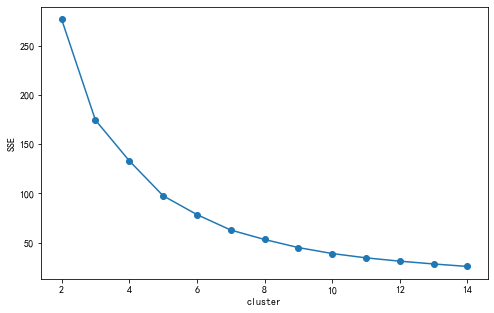

In [165]:
SSE = []
for k in range(2, 15):
    kmeans = KMeans(n_clusters=k, random_state=0).fit(scaler_X)
    SSE.append(kmeans.inertia_)
    
c = [i for i in range(2, 15)]
x_ticks = [i for i in c]
fig = plt.figure(figsize=(8,5))
plt.plot(c, SSE, 'o-')
plt.xlabel("cluster") 
plt.ylabel("SSE") 
plt.show()
fig.figure.savefig("通话次数&时长_肘部法", dpi=800)

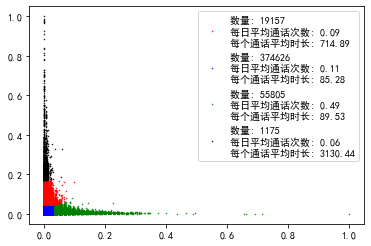

In [281]:
kmeans = KMeans(n_clusters=4, random_state=0).fit(scaler_X)

label_pred = kmeans.labels_ #获取聚类标签
centroids = kmeans.cluster_centers_ #获取聚类中心
centroids = scaler.inverse_transform(centroids)

x = { }
x[0] = []
x[1] = []
x[2] = []
x[3] = []

y = { }
y[0] = []
y[1] = []
y[2] = []
y[3] = []

j = 0
for i in label_pred:
#     plt.plot(scaler_X[j][0], scaler_X[j][1], mark[i], markersize=2)
    x[i].append(scaler_X[j][0])
    y[i].append(scaler_X[j][1])
    j += 1
    
mark = ['or', 'ob', 'og', 'ok', '^r', '+r', 'sr', 'dr', '<r', 'pr']
fig = plt.figure()
for i in range(4):
    plt.plot(x[i], y[i], mark[i], markersize=0.5, label=f'数量: {len(x[i])}\n每日平均通话次数: {round(centroids[i][0], 2)}\n每个通话平均时长: {round(centroids[i][1], 2)}')
plt.legend()
plt.show()
fig.figure.savefig("通话次数&时长_4cluster", dpi=800)

## 2.2. 通话时刻（通话时间段）

In [6]:
# 分析通话时刻的分布特征
from sklearn.cluster import KMeans

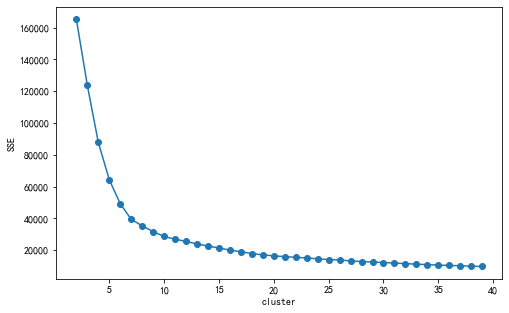

In [132]:
SSE = []
for k in range(2, 40):
    kmeans = KMeans(n_clusters=k, random_state=0).fit(df2.iloc[:, 1:])
    SSE.append(kmeans.inertia_)
    
c = [i for i in range(2, 40)]
x_ticks = [i for i in c]
fig = plt.figure(figsize=(8,5))
plt.plot(c, SSE, 'o-')
plt.xlabel("cluster") 
plt.ylabel("SSE") 
plt.show()
fig.figure.savefig("通话时间段_肘部法", dpi=800)

In [38]:
# 显示k-means结果
K = 7
X = df2.iloc[:, 1:]
kmeans = KMeans(n_clusters=7, random_state=0).fit(X)
clusters = {}
for i in range(len(kmeans.labels_)):
    if kmeans.labels_[i] not in clusters.keys():
        clusters[kmeans.labels_[i]] = []
    clusters[kmeans.labels_[i]].append(i)
print(clusters)

{1: [0, 4, 7, 11, 12, 13, 21, 22, 40, 50, 52, 67, 70, 80, 87, 89, 90, 94, 96, 99, 102, 105, 106, 107, 114, 116, 121, 131, 140, 144, 161, 164, 166, 170, 171, 178, 203, 210, 211, 217, 224, 238, 241, 244, 249, 266, 269, 278, 279, 285, 286, 291, 297, 313, 321, 330, 333, 345, 359, 373, 379, 382, 384, 394, 406, 411, 413, 417, 423, 426, 427, 438, 444, 449, 451, 456, 458, 469, 470, 479, 481, 482, 486, 491, 498, 500, 502, 505, 510, 511, 515, 520, 526, 531, 533, 535, 538, 556, 561, 566, 579, 590, 606, 611, 614, 617, 621, 629, 633, 635, 661, 663, 672, 676, 686, 690, 692, 697, 701, 703, 706, 708, 712, 715, 736, 748, 751, 752, 758, 760, 761, 766, 768, 769, 770, 774, 775, 776, 787, 795, 797, 798, 807, 810, 826, 828, 829, 846, 851, 859, 865, 892, 897, 902, 910, 915, 920, 932, 948, 949, 954, 960, 963, 970, 981, 984, 996, 999, 1001, 1008, 1009, 1015, 1020, 1028, 1037, 1042, 1056, 1059, 1060, 1084, 1094, 1104, 1105, 1111, 1117, 1125, 1128, 1129, 1133, 1143, 1146, 1148, 1162, 1164, 1166, 1185, 1189, 1200

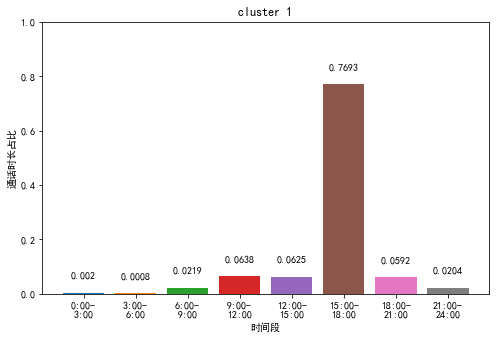

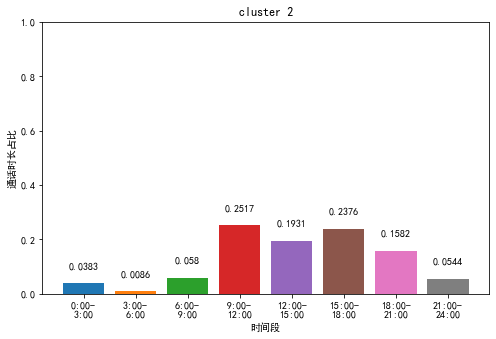

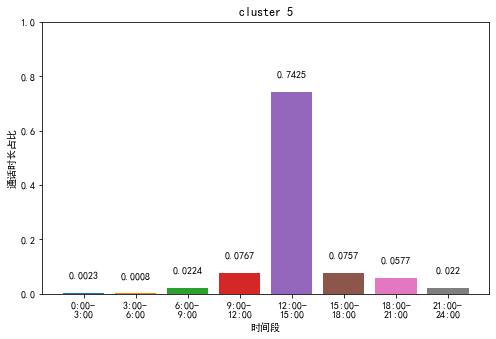

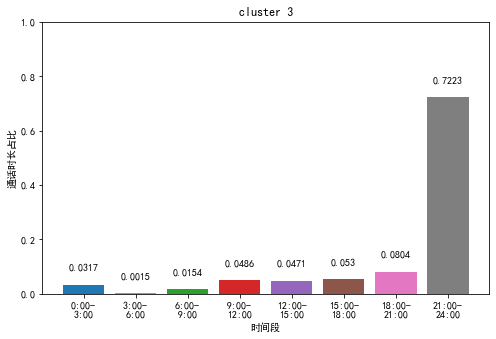

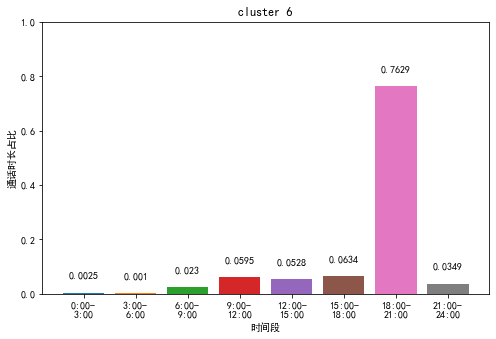

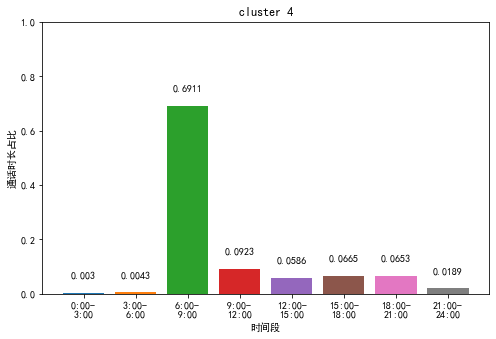

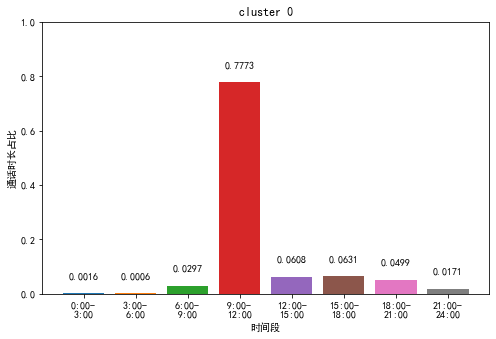

In [129]:
for cluster in clusters.items():
    id_cluster = cluster[0]
    items_cluster = cluster[1]
#     print(items_cluster)
#     print("----------------------------------------------------------------------------------------------------------")
    df_cluster = df2.iloc[items_cluster, :]
#     print(df_cluster)
    
    for i in range(len(df_cluster)):
        df_cluster.iloc[i, 1:] *= df_cluster.iloc[i, 0]
    Sum = df_cluster.sum(axis=0)
#     print(Sum)
    
    # 画图
    # 准备数据
    x_data = [f"{i}:00-\n{i + 3}:00" for i in range(0, 22, 3)]
    y_data = Sum[1:] / Sum[0]
    
    fig = plt.figure(figsize=(8,5))
    
    # 正确显示中文和负号
    plt.rcParams["font.sans-serif"] = ["SimHei"]
    plt.rcParams["axes.unicode_minus"] = False
    
    # 设置坐标轴显示范围
    plt.ylim(0, 1)
    # 画图，plt.bar()可以画柱状图
    for i in range(len(x_data)):
        plt.bar(x_data[i], y_data[i])
        plt.text(i, y_data[i] + 0.05, round(y_data[i],4), ha='center', va= 'bottom')
    # 设置图片名称
    title = "cluster " + str(id_cluster)
    plt.title(title)
    # 设置x轴标签名
    plt.xlabel("时间段")
    # 设置y轴标签名
    plt.ylabel("通话时长占比")
    # 显示
    plt.show()
    # 保存
    fig.figure.savefig("通话时间段_" + title, dpi=800)

## 2.3.  